In [86]:
library(DESeq2)
library(RColorBrewer)
library(reshape2)
library("gplots")
library("GGally")                      # Load GGally package
library(goseq)
library(readxl)
library(tidyverse)
library("pheatmap")
library(corrplot)
library(circlize)

In [87]:
library(ComplexUpset)

In [88]:
library(ggrepel)

In [89]:
library(ComplexHeatmap)

In [90]:
options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)

In [91]:
hpath_fname = file.path('..', 'genomes', 'MED4', 'MED4_protein_list.csv')
hpath_df = read.csv(hpath_fname)


# Enrichment of differentially expressed proteins and transcripts

Compare DE genes and DE proteins and run enrichment for all

In [92]:
rnaseq_dpath = file.path('..', 'RNASEQ', 'DE_results')
list.files(rnaseq_dpath)


[1] "HOT1A3_DE_DESEQ_results.csv"                
 [2] "HOT1A3_DE_DESEQ_results_ref_vs_long.csv"    
 [3] "HOT1A3_DE_DESEQ_vsd.csv"                    
 [4] "HOT1A3_DE_genes_DESEQ_ref_vs_long_wKEGG.csv"
 [5] "HOT1A3_GOSEQ_results_ref_vs_long.csv"       
 [6] "MED4_DE_DESEQ_longterm_results.csv"         
 [7] "MED4_DE_DESEQ_results.csv"                  
 [8] "MED4_DE_DESEQ_results_ref_vs_long.csv"      
 [9] "MED4_DE_DESEQ_vsd.csv"                      
[10] "MED4_DE_genes_DESEQ_wKEGG_ref_vs_long.csv"  
[11] "MED4_GOSEQ_results_ref_vs_long.csv"

In [93]:
proteome_dpath = file.path('..', 'Proteome', 'data')
list.files(proteome_dpath)


[1] "A_axenic_proteome.txt"                                                                          
 [2] "A_axenic_proteome_norm.txt"                                                                     
 [3] "ALT_Axenic_DE.csv"                                                                              
 [4] "ALT_CC_DE.csv"                                                                                  
 [5] "C_ALT_proteome.txt"                                                                             
 [6] "C_ALT_proteome_norm.txt"                                                                        
 [7] "C_PRO_proteome.txt"                                                                             
 [8] "C_PRO_proteome_norm.txt"                                                                        
 [9] "Nov22_Processing.xlsx"                                                                          
[10] "P_axenic_proteome.txt"                                                                          
[11] "P_axenic_proteome_norm.txt"                                                                     
[12] "PRO_Axenic_DE.csv"                                                                              
[13] "PRO_CC_DE.csv"                                                                                  
[14] "uniprot-compressed_true_download_true_fields_accession_2Cid_2Cprotei-2023.01.11-12.43.22.99.txt"

In [94]:
df_rnaseq1 = read.csv(file.path(rnaseq_dpath,'MED4_DE_DESEQ_longterm_results.csv'))  %>% 
   mutate(gene_id = str_replace(gene_id, '\\.\\.\\.\\d+', '')) 

df_rnaseq2 = read.csv(file.path(rnaseq_dpath,'MED4_DE_DESEQ_results.csv')) %>% 
   mutate(gene_id = str_replace(gene_id, '\\.\\.\\.\\d+', '')) 

In [95]:
unique(df_rnaseq2$contrast)

[1] "P2vsP1" "C1vsP1" "C2vsC1" "C3vsC1" "C4vsC1" "C5vsC1" "C3vsC2" "C4vsC3"
 [9] "C5vsC3" "C5vsC4"

In [96]:
df_prot1 = read.csv(file.path(proteome_dpath,'PRO_CC_DE.csv'))
df_prot2 = read.csv(file.path(proteome_dpath,'PRO_Axenic_DE.csv'))

In [97]:
names(df_rnaseq1)
names(df_rnaseq2)
names(df_prot1)
names(df_prot2)



[1] "gene_id"        "baseMean"       "log2FoldChange" "lfcSE"         
 [5] "stat"           "pvalue"         "padj"           "contrast"      
 [9] "na_pvalue"      "na_padj"        "significant"    "direction"     
[13] "status"

[1] "gene_id"        "baseMean"       "log2FoldChange" "lfcSE"         
 [5] "stat"           "pvalue"         "padj"           "contrast"      
 [9] "na_pvalue"      "na_padj"        "significant"    "direction"     
[13] "status"

[1] "X"            "logFC"        "AveExpr"      "t"            "P.Value"     
 [6] "adj.P.Val"    "B"            "gene"         "count"        "sca.t"       
[11] "sca.P.Value"  "sca.adj.pval" "contrast"     "log.sca.pval"

[1] "X"            "logFC"        "AveExpr"      "t"            "P.Value"     
 [6] "adj.P.Val"    "B"            "gene"         "count"        "sca.t"       
[11] "sca.P.Value"  "sca.adj.pval" "contrast"     "log.sca.pval"

In [98]:
dput(unique(df_prot1$contrast))
dput(unique(df_prot2$contrast))
dput(unique(df_rnaseq1$contrast))
dput(unique(df_rnaseq2$contrast))


c("C2 - C1", "C3 - C1", "C4 - C1", "C5 - C1", "C3 - C2", "C4 - C2", 
"C5 - C2", "C4 - C3", "C5 - C3", "C5 - C4", "Clongterm - C1", 
"Clongterm - C2", "Clongterm - C3")
c("P2 - P1", "P3 - P1", "P5 - P1", "Plongterm - P1", "Plongterm - P2"
)
c("longtermvsP1", "longtermvsP2", "longtermvsC1", "longtermvsC2", 
"longtermvsC3")
c("P2vsP1", "C1vsP1", "C2vsC1", "C3vsC1", "C4vsC1", "C5vsC1", 
"C3vsC2", "C4vsC3", "C5vsC3", "C5vsC4")


In [99]:
dp1 = df_prot1 %>%  select(
    'contrast','gene','logFC','AveExpr',
    'sca.P.Value','sca.adj.pval') %>%
    rename('logFC' = 'logFC','AveExpr' = 'AveExpr',
    'pvalue' = 'sca.P.Value','padj' = 'sca.adj.pval', 'protein_id'='gene') %>%
    mutate(Assay = 'Proteome')
dp2 = df_prot2 %>%  select(
    'contrast','gene','logFC','AveExpr',
    'sca.P.Value','sca.adj.pval') %>%
    rename('logFC' = 'logFC','AveExpr' = 'AveExpr',
    'pvalue' = 'sca.P.Value','padj' = 'sca.adj.pval', 'protein_id'='gene')%>%
    mutate(Assay = 'Proteome')


In [100]:
dr1 = df_rnaseq1 %>% 
    select(
        'contrast', 'gene_id','baseMean','log2FoldChange',
        'pvalue','padj',
    ) %>%
    rename('logFC' = 'log2FoldChange','AveExpr' = 'baseMean',
    'pvalue' = 'pvalue','padj' = 'padj') %>%
    mutate(Assay = 'RNA')
dr2 = df_rnaseq2 %>% 
    select(
        'contrast', 'gene_id','baseMean','log2FoldChange',
        'pvalue','padj',
    ) %>%
    rename('logFC' = 'log2FoldChange','AveExpr' = 'baseMean',
    'pvalue' = 'pvalue','padj' = 'padj') %>%
    mutate(Assay = 'RNA')
    


In [101]:
lookup <- c(
    "C2 - C1" = 'C2vsC1_prot', 
    "C3 - C1" = 'C3vsC1_prot', 
    "C4 - C1" = 'C4vsC1_prot', 
    "C5 - C1" = 'C5vsC1_prot',

    "C3 - C2" = 'C3vsC2_prot', 
    "C4 - C2" = 'C4vsC2_prot', 
    "C5 - C2" = 'C5vsC2_prot', 

    "C4 - C3" = 'C4vsC3_prot', 
    "C5 - C3" = 'C5vsC3_prot', 
    "C5 - C4" = 'C5vsC4_prot', 

    "Clongterm - C1" = 'LATEvsC1_prot', 
    "Clongterm - C2" = 'LATEvsC2_prot', 
    "Clongterm - C3" = 'LATEvsC3_prot', 
    
    "P2 - P1" = 'P2vsP1_prot',
    "P3 - P1" = 'P3vsP1_prot',
    "P5 - P1" = 'P5vsP1_prot',
    "Plongterm - P1" = 'LATEvsP1_prot', 
    "Plongterm - P2" = 'LATEvsP2_prot', 
    "Intercept" = "Intercept",

    "longtermvsP1" = 'LATEvsP1_rna', 
    "longtermvsP2" = 'LATEvsP2_rna', 
    "longtermvsC1" = 'LATEvsC1_rna', 
    "longtermvsC2" = 'LATEvsC2_rna', 
    "longtermvsC3" = 'LATEvsC3_rna', 

    "P2vsP1" = 'P2vsP1_rna', 
    "C1vsP1" = 'C1vsP1_rna', 
    "C2vsC1" = 'C2vsC1_rna', 
    "C3vsC1" = 'C3vsC1_rna', 
    "C4vsC1" = 'C4vsC1_rna', 
    "C5vsC1" = 'C5vsC1_rna',
    "C3vsC2" = 'C3vsC2_rna', 
    "C4vsC3" = 'C4vsC3_rna',
    "C5vsC3" = 'C5vsC3_rna',
    "C5vsC4" = 'C5vsC4_rna'
)
    
    


In [102]:
dr1 = dr1 %>% mutate(contrast1 = lookup[contrast]) %>% filter(contrast != 'Intercept')
dr2 = dr2 %>% mutate(contrast1 = lookup[contrast]) %>% filter(contrast != 'Intercept')
dp1 = dp1 %>% mutate(contrast1 = lookup[contrast]) %>% filter(contrast != 'Intercept')
dp2 = dp2 %>% mutate(contrast1 = lookup[contrast]) %>% filter(contrast != 'Intercept')


In [103]:
names(hpath_df)

[1] "Name"               "gene"               "locus_tag"         
 [4] "old_locus_tag"      "source"             "start"             
 [7] "end"                "strand"             "Note"              
[10] "exception"          "inference"          "product"           
[13] "protein_id"         "gene_length"        "path_id"           
[16] "main"               "sub"                "path"              
[19] "ecpath"             "Category"           "Membrane.transport"
[22] "kegg_gene1"         "kegg_gene2"

In [104]:
dp1 = left_join(dp1, hpath_df, by='protein_id') %>% mutate(gene_id = locus_tag)
dp2 = left_join(dp2, hpath_df, by='protein_id') %>% mutate(gene_id = locus_tag)


In [105]:
names(dp1)# %>% mutate(gene_id = locus_tag)

[1] "contrast"           "protein_id"         "logFC"             
 [4] "AveExpr"            "pvalue"             "padj"              
 [7] "Assay"              "contrast1"          "Name"              
[10] "gene"               "locus_tag"          "old_locus_tag"     
[13] "source"             "start"              "end"               
[16] "strand"             "Note"               "exception"         
[19] "inference"          "product"            "gene_length"       
[22] "path_id"            "main"               "sub"               
[25] "path"               "ecpath"             "Category"          
[28] "Membrane.transport" "kegg_gene1"         "kegg_gene2"        
[31] "gene_id"

In [106]:
 dr1 = left_join(dr1, hpath_df, by=c('gene_id'='locus_tag'))
 dr2 = left_join(dr2, hpath_df, by=c('gene_id'='locus_tag'))
 


In [107]:
df_all = bind_rows(dp1, dp2, dr1, dr2)

In [108]:
df_all = df_all %>% 
    mutate(
        Category = if_else(is.na(Category), 'Uncharacterized', Category),
        Category = if_else(Category == 'Poorly characterized', 'Uncharacterized', Category)
          )

In [109]:
dput(unique(df_all$contrast))

c("C2 - C1", "C3 - C1", "C4 - C1", "C5 - C1", "C3 - C2", "C4 - C2", 
"C5 - C2", "C4 - C3", "C5 - C3", "C5 - C4", "Clongterm - C1", 
"Clongterm - C2", "Clongterm - C3", "P2 - P1", "P3 - P1", "P5 - P1", 
"Plongterm - P1", "Plongterm - P2", "longtermvsP1", "longtermvsP2", 
"longtermvsC1", "longtermvsC2", "longtermvsC3", "P2vsP1", "C1vsP1", 
"C2vsC1", "C3vsC1", "C4vsC1", "C5vsC1", "C3vsC2", "C4vsC3", "C5vsC3", 
"C5vsC4")


In [110]:
df_all %>% count(contrast1, contrast,  .drop = FALSE)


contrast1,contrast,n
<chr>,<chr>,<int>
C1vsP1_rna,C1vsP1,1855
C2vsC1_prot,C2 - C1,1424
C2vsC1_rna,C2vsC1,1855
C3vsC1_prot,C3 - C1,1424
C3vsC1_rna,C3vsC1,1855
C3vsC2_prot,C3 - C2,1424
C3vsC2_rna,C3vsC2,1855
C4vsC1_prot,C4 - C1,1424
C4vsC1_rna,C4vsC1,1855


# LONG TERM - compare proteome to RNASEQ

In [111]:
names(dp1)
dput(names(dr1))

[1] "contrast"           "protein_id"         "logFC"             
 [4] "AveExpr"            "pvalue"             "padj"              
 [7] "Assay"              "contrast1"          "Name"              
[10] "gene"               "locus_tag"          "old_locus_tag"     
[13] "source"             "start"              "end"               
[16] "strand"             "Note"               "exception"         
[19] "inference"          "product"            "gene_length"       
[22] "path_id"            "main"               "sub"               
[25] "path"               "ecpath"             "Category"          
[28] "Membrane.transport" "kegg_gene1"         "kegg_gene2"        
[31] "gene_id"

c("contrast", "gene_id", "AveExpr", "logFC", "pvalue", "padj", 
"Assay", "contrast1", "Name", "gene", "old_locus_tag", "source", 
"start", "end", "strand", "Note", "exception", "inference", "product", 
"protein_id", "gene_length", "path_id", "main", "sub", "path", 
"ecpath", "Category", "Membrane.transport", "kegg_gene1", "kegg_gene2"
)


In [112]:
lc_prot = dp1 %>% filter(contrast1=='LATEvsC1_prot') 
head(lc_prot, 2)


,contrast,protein_id,logFC,AveExpr,pvalue,padj,Assay,contrast1,Name,gene,⋯,path_id,main,sub,path,ecpath,Category,Membrane.transport,kegg_gene1,kegg_gene2,gene_id
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Clongterm - C1,WP_011819929.1,2.841207,5.628774,1.043055e-14,1.485310e-11,Proteome,LATEvsC1_prot,TX50_RS02935,(eutM),⋯,K04027,09190 Not Included in Pathway or Brite,09191 Unclassified: metabolism,99985 Amino acid metabolism,K04027 eutM; ethanolamine utilization protein EutM,AA/Nucleotide,,eutM,(eutM),TX50_RS02935
2,Clongterm - C1,WP_011131900.1,2.308095,5.183472,5.250001e-13,3.738001e-10,Proteome,LATEvsC1_prot,amt,amt,⋯,K03320,09180 Brite Hierarchies,09183 Protein families: signaling and cellular processes,02000 Transporters [BR:ko02000],"K03320 amt, AMT, MEP; ammonium transporter, Amt family",Membrane transport,Membrane transport,"amt, AMT, MEP",(amt),TX50_RS01365


In [113]:
lc_rna = dr1 %>% filter(contrast1=='LATEvsC1_rna') 
head(lc_rna, 2)
    



,contrast,gene_id,AveExpr,logFC,pvalue,padj,Assay,contrast1,Name,gene,⋯,gene_length,path_id,main,sub,path,ecpath,Category,Membrane.transport,kegg_gene1,kegg_gene2
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,longtermvsC1,TX50_RS00020,1911.2134,-0.07943373,0.77578554,0.86526322,RNA,LATEvsC1_rna,dnaN,dnaN,⋯,1157,K02338,09120 Genetic Information Processing;09180 Brite Hierarchies,09124 Replication and repair;09182 Protein families: genetic information processing,03030 DNA replication [PATH:ko03030];03032 DNA replication proteins [BR:ko03032];03400 DNA repair and recombination proteins [BR:ko03400];03430 Mismatch repair [PATH:ko03430];03440 Homologous recombination [PATH:ko03440],K02338 dnaN; DNA polymerase III subunit beta [EC:2.7.7.7],Genetic Info,,dnaN,(dnaN)
2,longtermvsC1,TX50_RS00025,129.7268,-0.81681756,0.00290124,0.01509311,RNA,LATEvsC1_rna,TX50_RS00025,,⋯,707,,,,,,Uncharacterized,,,


In [114]:
lc_df = left_join(lc_rna %>% select(contrast, gene_id, AveExpr, logFC, pvalue, padj), 
                  lc_prot, 
                  by='gene_id', suffix = c('.rna', '.proteome'))

In [115]:
names(lc_df)

[1] "contrast.rna"       "gene_id"            "AveExpr.rna"       
 [4] "logFC.rna"          "pvalue.rna"         "padj.rna"          
 [7] "contrast.proteome"  "protein_id"         "logFC.proteome"    
[10] "AveExpr.proteome"   "pvalue.proteome"    "padj.proteome"     
[13] "Assay"              "contrast1"          "Name"              
[16] "gene"               "locus_tag"          "old_locus_tag"     
[19] "source"             "start"              "end"               
[22] "strand"             "Note"               "exception"         
[25] "inference"          "product"            "gene_length"       
[28] "path_id"            "main"               "sub"               
[31] "path"               "ecpath"             "Category"          
[34] "Membrane.transport" "kegg_gene1"         "kegg_gene2"

In [116]:
head(lc_df,2)

,contrast.rna,gene_id,AveExpr.rna,logFC.rna,pvalue.rna,padj.rna,contrast.proteome,protein_id,logFC.proteome,AveExpr.proteome,⋯,gene_length,path_id,main,sub,path,ecpath,Category,Membrane.transport,kegg_gene1,kegg_gene2
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,longtermvsC1,TX50_RS00020,1911.2134,-0.07943373,0.77578554,0.86526322,Clongterm - C1,WP_011131639.1,0.5893407,3.005892,⋯,1157,K02338,09120 Genetic Information Processing;09180 Brite Hierarchies,09124 Replication and repair;09182 Protein families: genetic information processing,03030 DNA replication [PATH:ko03030];03032 DNA replication proteins [BR:ko03032];03400 DNA repair and recombination proteins [BR:ko03400];03430 Mismatch repair [PATH:ko03430];03440 Homologous recombination [PATH:ko03440],K02338 dnaN; DNA polymerase III subunit beta [EC:2.7.7.7],Genetic Info,,dnaN,(dnaN)
2,longtermvsC1,TX50_RS00025,129.7268,-0.81681756,0.00290124,0.01509311,Clongterm - C1,WP_011131640.1,0.5591976,3.783286,⋯,707,,,,,,Uncharacterized,,,


In [117]:
subset(lc_df, ((abs(logFC.proteome)>1)&padj.proteome<0.05)|((abs(logFC.rna)>1)&padj.rna<0.05)) %>% 
select(Category) %>%table() %>% as.data.frame() %>% arrange(Freq) #%>% dput


Category,Freq
<fct>,<int>
high light inducible,2
Nitrogen metabolism,5
Env. Info/Cellular Process,7
AA/Nucleotide;Energy/Carbohydrate/Glycan,8
Energy/Carbohydrate/Glycan,16
Membrane transport,21
Photosynthesis/Carbon fixation,24
AA/Nucleotide,25
Metabolism,39


In [118]:
lc_df = lc_df %>% replace_na(list(logFC.rna=0, logFC.proteome=0))

In [119]:
my.cols <- c(brewer.pal(7, "Set1"), 'grey34')
my.cols[6] = '#FFC000'

Warning message:
"Removed 115 rows containing missing values (`geom_text_repel()`)."


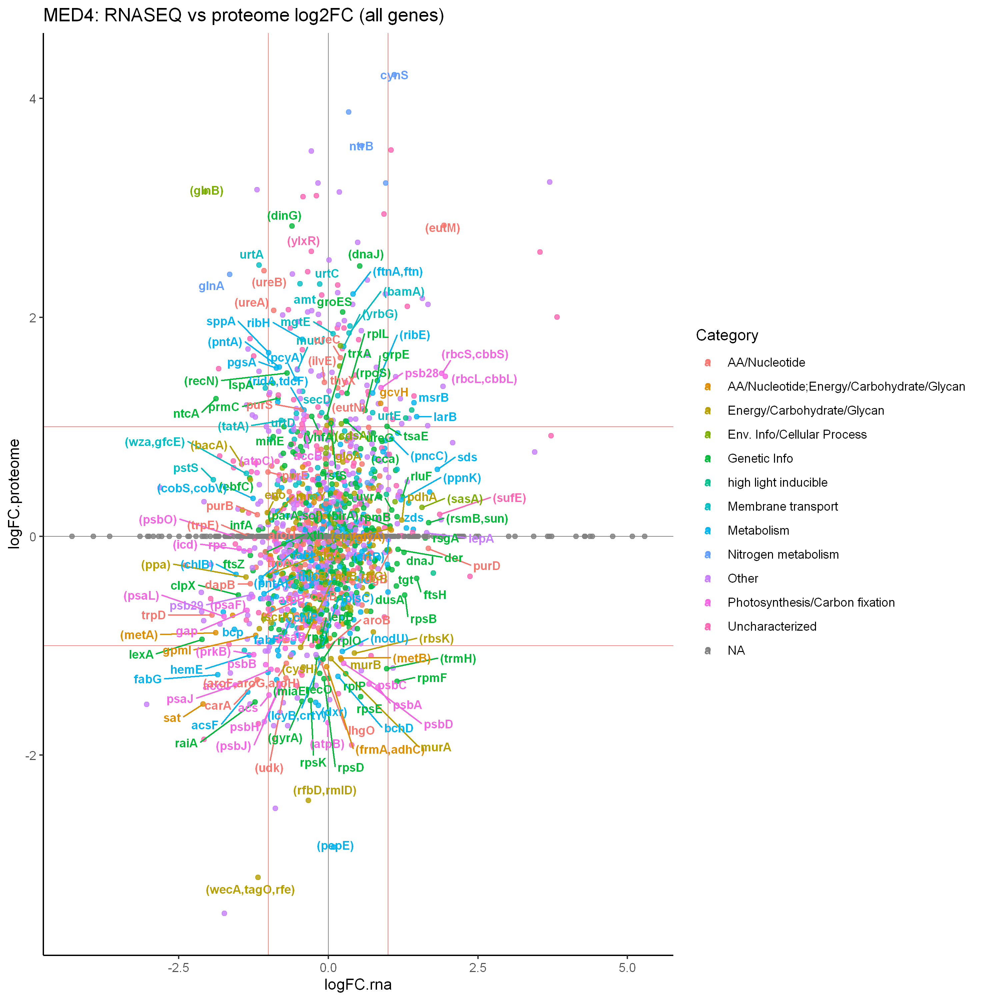

In [120]:
ggplot(lc_df, aes(x=logFC.rna, y=logFC.proteome, color=Category, #, size=-log10(pvalue.proteome)
                 )) +
    geom_vline(xintercept = c(-1,1), colour = "red", linewidth = 0.3, alpha=0.5) + # Add fold change cutoffs
    geom_hline(yintercept = c(-1,1), colour = "red", linewidth = 0.3, alpha=0.5) + # Add significance cutoffs
    geom_vline(xintercept = 0, colour = "black", linewidth = 0.3, alpha=0.5) + # Add 0 lines
    geom_hline(yintercept = 0, colour = "black", linewidth = 0.3, alpha=0.5) + # Add 0 lines
   geom_point(size=1.5, alpha=0.8) + 
   geom_text_repel(data=subset(lc_df, ((abs(logFC.proteome)>1)&padj.proteome<0.1)|((abs(logFC.rna)>1)&padj.rna<0.1)),
                    aes( x=logFC.rna, y=logFC.proteome,label=gene), max.overlaps = Inf, size=3, fontface='bold') + # add gene label
    #scale_color_manual(values=my.cols) +
    ggtitle('MED4: RNASEQ vs proteome log2FC (all genes)') +
#scale_colour_brewer(palette = "Set1") +
    theme_classic()

Warning message:
"Removed 102 rows containing missing values (`geom_text_repel()`)."


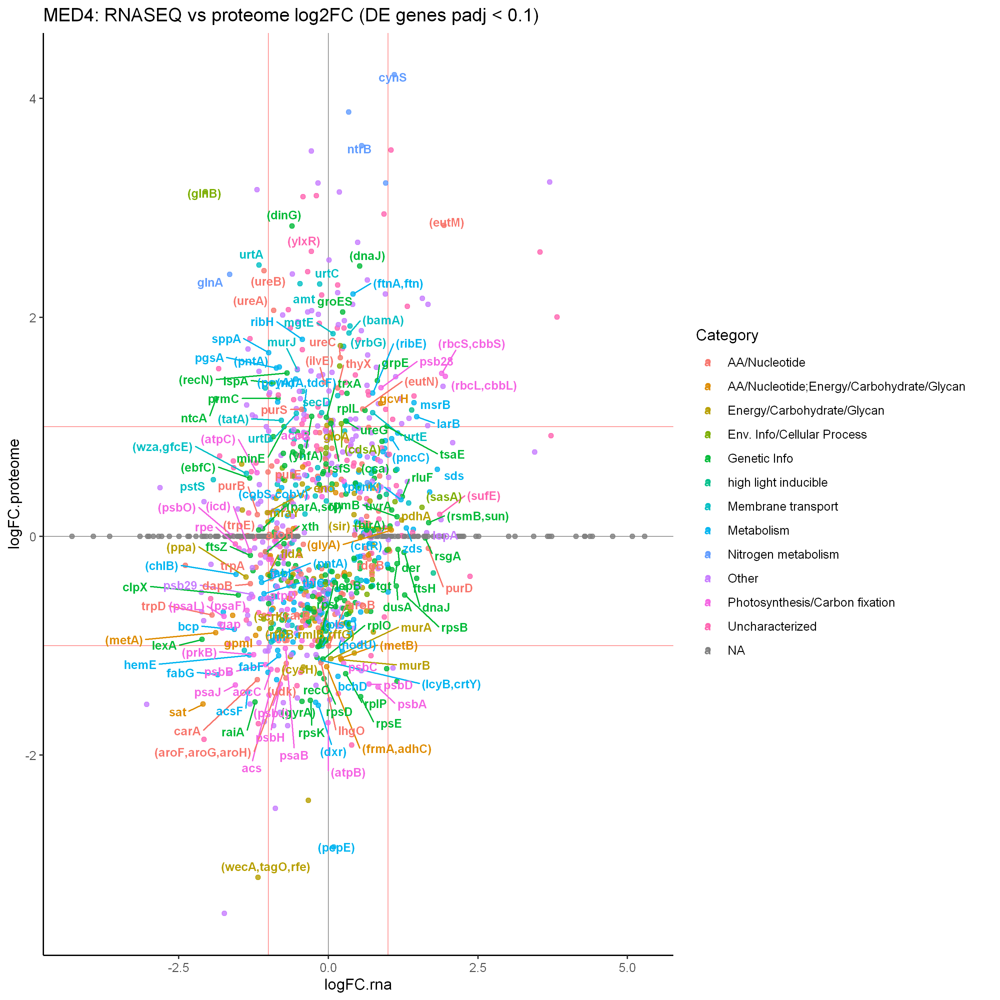

In [121]:
ggplot(subset(lc_df, (padj.proteome<0.1)|(padj.rna<0.1)), 
       aes(x=logFC.rna, y=logFC.proteome, color=Category, #, size=-log10(pvalue.proteome)
                 )) +
    geom_vline(xintercept = c(-1,1), colour = "red", linewidth = 0.3, alpha=0.5) + # Add fold change cutoffs
    geom_hline(yintercept = c(-1,1), colour = "red", linewidth = 0.3, alpha=0.5) + # Add significance cutoffs
    geom_vline(xintercept = 0, colour = "black", linewidth = 0.3, alpha=0.5) + # Add 0 lines
    geom_hline(yintercept = 0, colour = "black", linewidth = 0.3, alpha=0.5) + # Add 0 lines
   geom_point(size=1.5, alpha=0.8) + 
   geom_text_repel(data=subset(lc_df, ((abs(logFC.proteome)>1)&padj.proteome<0.05)|((abs(logFC.rna)>1)&padj.rna<0.05)),
                    aes( x=logFC.rna, y=logFC.proteome,label=gene), max.overlaps = Inf, size=3, fontface='bold') + # add gene label
    #scale_color_manual(values=my.cols) +
    ggtitle('MED4: RNASEQ vs proteome log2FC (DE genes padj < 0.1)') +

#scale_colour_brewer(palette = "Set1") +
    theme_classic()

# upset plots

In [67]:
set_size = function(w, h, factor=1.5) {
    s = 1 * factor
    options(
        repr.plot.width=w * s,
        repr.plot.height=h * s,
        repr.plot.res=100 / factor,
        jupyter.plot_mimetypes='image/png',
        jupyter.plot_scale=1
    )
}

In [55]:
df_DElist_prot1 = df_prot1 %>%  select(
    'contrast','gene_id','logFC','AveExpr',
    'sca.P.Value','sca.adj.pval') %>%
    rename('logFC' = 'logFC','AveExpr' = 'AveExpr',
    'pvalue' = 'sca.P.Value','padj' = 'sca.adj.pval') %>%
    mutate(Assay = 'Proteome')
df_DElist_prot2 = df_prot2 %>%  select(
    'contrast','gene_id','logFC','AveExpr',
    'sca.P.Value','sca.adj.pval') %>%
    rename('logFC' = 'logFC','AveExpr' = 'AveExpr',
    'pvalue' = 'sca.P.Value','padj' = 'sca.adj.pval')%>%
    mutate(Assay = 'Proteome')


In [56]:
df_DElist_rna1 = df_rnaseq1 %>% 
    select(
        'contrast', 'gene_id','baseMean','log2FoldChange',
        'pvalue','padj',
    ) %>%
    rename('logFC' = 'log2FoldChange','AveExpr' = 'baseMean',
    'pvalue' = 'pvalue','padj' = 'padj') %>%
    mutate(Assay = 'RNA')
df_DElist_rna2 = df_rnaseq2 %>% 
    select(
        'contrast', 'gene_id','baseMean','log2FoldChange',
        'pvalue','padj',
    ) %>%
    rename('logFC' = 'log2FoldChange','AveExpr' = 'baseMean',
    'pvalue' = 'pvalue','padj' = 'padj') %>%
    mutate(Assay = 'RNA')
    


In [57]:
df_DElist = bind_rows(df_DElist_prot1, df_DElist_prot2, df_DElist_rna1, df_DElist_rna2)

In [58]:
dput(unique(df_DElist$contrast))

c("C2 - C1", "C3 - C1", "C4 - C1", "C5 - C1", "Clongterm - C1", 
"P2 - P1", "P3 - P1", "P5 - P1", "Intercept", "treatment_long.term_vs_ref", 
"P2vsP1", "C1vsP1", "C2vsC1", "C3vsC1", "C4vsC1", "C5vsC1")


In [59]:
lookup <- c(
    "C2 - C1" = 'C2vsC1_prot', 
    "C3 - C1" = 'C3vsC1_prot', 
    "C4 - C1" = 'C4vsC1_prot', 
    "C5 - C1" = 'C5vsC1_prot', 
    "Clongterm - C1" = 'LATEvsC1_prot', 
    "P2 - P1" = 'P2vsP1_prot',
    "P3 - P1" = 'P3vsP1_prot',
    "P5 - P1" = 'P5vsP1_prot',
    "Intercept" = "Intercept",
    "treatment_long.term_vs_ref" = 'LATEvsC1P1_rna', 
    "P2vsP1" = 'P2vsP1_rna', 
    "C1vsP1" = 'C1vsP1_rna', 
    "C2vsC1" = 'C2vsC1_rna', 
    "C3vsC1" = 'C3vsC1_rna', 
    "C4vsC1" = 'C4vsC1_rna', 
    "C5vsC1" = 'C5vsC1_rna')
    
    
df_DElist = df_DElist %>% 
    mutate(contrast1 = lookup[contrast]) %>%
    filter(contrast != 'Intercept')

In [60]:
df_DElist = left_join(df_DElist, hpath_df_to_export, by='gene_id')


In [63]:
contrast_list = unique(df_DElist$contrast1)
contrast_list = unique(df_DElist$contrast)


In [64]:
dput(contrast_list)

c("C2 - C1", "C3 - C1", "C4 - C1", "C5 - C1", "Clongterm - C1", 
"P2 - P1", "P3 - P1", "P5 - P1", "treatment_long.term_vs_ref", 
"P2vsP1", "C1vsP1", "C2vsC1", "C3vsC1", "C4vsC1", "C5vsC1")


In [65]:
rna_CC_list = c(#"C1vsP1_rna", 
                "C2vsC1_rna", "C3vsC1_rna", "C4vsC1_rna", "C5vsC1_rna")
prot_CC_list = c("C2vsC1_prot", "C3vsC1_prot", "C4vsC1_prot", "C5vsC1_prot")
latelist = c("LATEvsC1_prot","LATEvsC1P1_rna")


c("C2vsC1_prot", "C3vsC1_prot", "C4vsC1_prot", "C5vsC1_prot", 
"LATEvsC1_prot", "P2vsP1_prot", "P3vsP1_prot", "P5vsP1_prot", 
"LATEvsC1P1_rna", "P2vsP1_rna", "C1vsP1_rna", "C2vsP1_rna", "C3vsP1_rna", 
"C4vsP1_rna", "C5vsP1_rna")

[1] "C2vsC1_prot"    "C3vsC1_prot"    "C4vsC1_prot"    "C5vsC1_prot"   
 [5] "LATEvsC1_prot"  "P2vsP1_prot"    "P3vsP1_prot"    "P5vsP1_prot"   
 [9] "LATEvsC1P1_rna" "P2vsP1_rna"     "C1vsP1_rna"     "C2vsP1_rna"    
[13] "C3vsP1_rna"     "C4vsP1_rna"     "C5vsP1_rna"

In [66]:

contrast_meta_df = df_DElist %>% distinct(contrast1, Assay) %>% rename(set = contrast1)


In [67]:
contrast_meta_df

set,Assay
<chr>,<chr>
C2vsC1_prot,Proteome
C3vsC1_prot,Proteome
C4vsC1_prot,Proteome
C5vsC1_prot,Proteome
LATEvsC1_prot,Proteome
P2vsP1_prot,Proteome
P3vsP1_prot,Proteome
P5vsP1_prot,Proteome
LATEvsC1P1_rna,RNA


In [68]:
options(repr.plot.width = 10, repr.plot.height = 7, repr.plot.res = 300)

Warning message in upset_data(data, intersect, mode = mode, encode_sets = encode_sets, :
"Converting non-logical columns to binary: C2vsC1_rna, C3vsC1_rna, C4vsC1_rna, C5vsC1_rna, C2vsC1_prot, C3vsC1_prot, C4vsC1_prot, C5vsC1_prot"


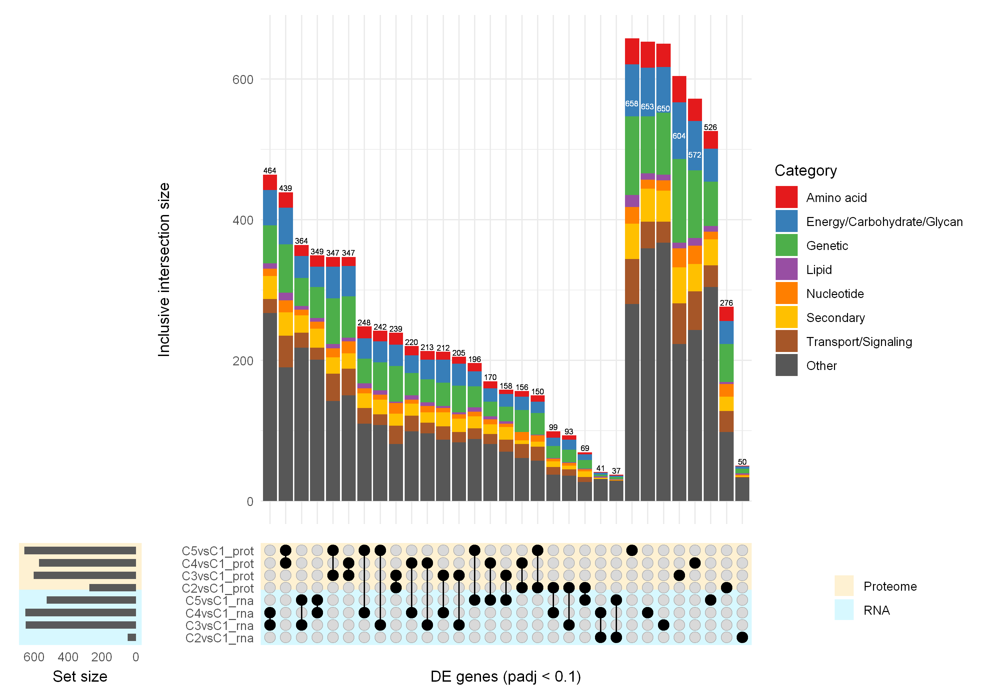

In [69]:
#set_size(10,10 )
df_DElist %>%
    filter(padj < 0.1, #abs(logFC) > 1, 
           contrast != 'Intercept') %>%
    pivot_wider(id_cols = c(gene_id,Category), names_from = contrast1, values_from = logFC, values_fill = FALSE) %>% 
upset(c(rna_CC_list, prot_CC_list), name='DE genes (padj < 0.1)', 
      mode='inclusive_intersection',
      base_annotations=list(
        'Intersection size'=intersection_size(
            mode='inclusive_intersection',
            mapping=aes(fill=Category),
            text=list(size=2)
        )
            + scale_fill_manual(values=my.cols)
    ),      
#     annotations = list(
#         'Categories'=(
#             ggplot(mapping=aes(fill=Category))
#             + geom_bar(stat='count', position='fill')
#             + scale_y_continuous(labels=scales::percent_format())
#             + scale_fill_manual(values=my.cols
#             )
#             + ylab('Category')
#         )
#     ),
      width_ratio=0.2, 
      height_ratio=0.2,
      sort_sets=FALSE,
      #min_size=10, 
      #mode='inclusive_intersection',
      min_degree=1, max_degree=2,
     sort_intersections_by=c('degree', 'cardinality'),
    stripes=upset_stripes(
        mapping=aes(color=Assay),
        colors=c(
            'Proteome'='#fef1d2',
            'RNA'='#d7f8ff'
        ),
        data=contrast_meta_df
    )) #+
#theme_classic(base_size = 15)

In [70]:
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 300)

Warning message in upset_data(data, intersect, mode = mode, encode_sets = encode_sets, :
"Converting non-logical columns to binary: Proteome, RNA"


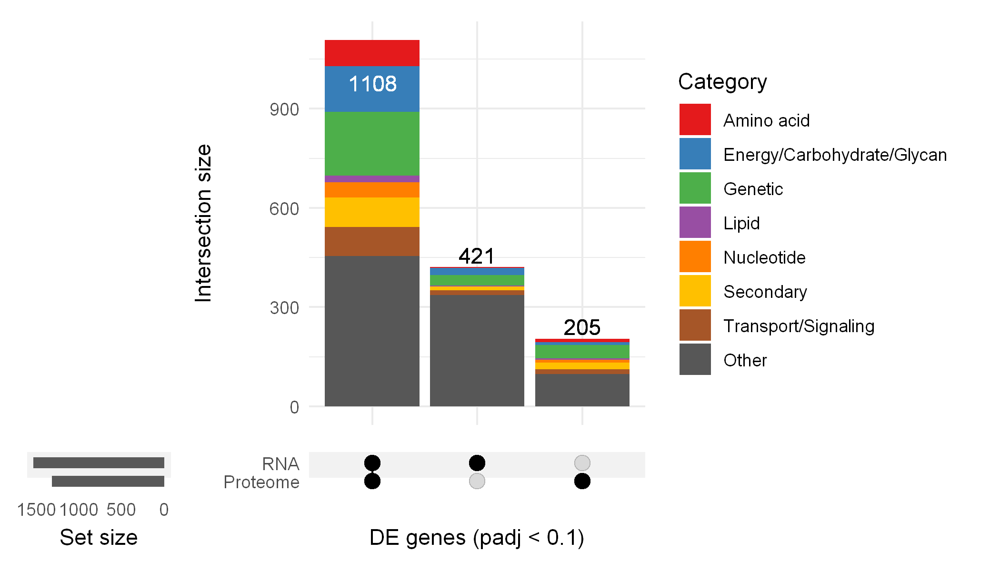

In [71]:
#set_size(10,10 )
df_DElist %>%
    filter(padj < 0.1, #abs(logFC) > 1, 
           contrast != 'Intercept') %>%
    distinct(gene_id, Assay, .keep_all =TRUE) %>%
     pivot_wider(id_cols = c(gene_id,Category), names_from = Assay, values_from = logFC, values_fill = FALSE) %>% 
 upset(c('Proteome', 'RNA'), name='DE genes (padj < 0.1)',
       height_ratio=0.1,
#       mode='inclusive_intersection',
      base_annotations=list(
        'Intersection size'=intersection_size(
#            mode='inclusive_intersection',
            mapping=aes(fill=Category)
        )
            + scale_fill_manual(values=my.cols)
    )
       )
# #     annotations = list(
# #         'Categories'=(
# #             ggplot(mapping=aes(fill=Category))
# #             + geom_bar(stat='count', position='fill')
# #             + scale_y_continuous(labels=scales::percent_format())
# #             + scale_fill_manual(values=my.cols
# #             )
# #             + ylab('Category')
# #         )
# #     ),
#       width_ratio=0.1, 
#       #min_size=10, 
#       #mode='inclusive_intersection',
#       #min_degree=1, max_degree=2,
#      #sort_intersections_by=c('degree', 'cardinality'),
#     ) #+
# #theme_classic(base_size = 15)

# GOSEQ

In [122]:
names(df_all)

[1] "contrast"           "protein_id"         "logFC"             
 [4] "AveExpr"            "pvalue"             "padj"              
 [7] "Assay"              "contrast1"          "Name"              
[10] "gene"               "locus_tag"          "old_locus_tag"     
[13] "source"             "start"              "end"               
[16] "strand"             "Note"               "exception"         
[19] "inference"          "product"            "gene_length"       
[22] "path_id"            "main"               "sub"               
[25] "path"               "ecpath"             "Category"          
[28] "Membrane.transport" "kegg_gene1"         "kegg_gene2"        
[31] "gene_id"

In [123]:
df_all = df_all %>% 
    mutate(
        down = ((logFC < 0) & (padj < 0.05)),
        up   = ((logFC > 0) & (padj < 0.05)),
)

In [124]:
kegg_fname = file.path('..', 'genomes', 'MED4', 'MED4_pathways.csv')
kegg_df = read.csv(kegg_fname)


In [125]:
kegg_df = left_join(kegg_df, hpath_df %>% select(locus_tag, protein_id), 
          by='protein_id', multiple = "all") %>% 
    mutate(gene_id=locus_tag)

In [126]:
ignore_main = c('09160 Human Diseases', 
                '09150 Organismal Systems', 
                #'09190 Not Included in Pathway or Brite', 
                #'09180 Brite Hierarchies',
                ''
               )

In [127]:
run_enrichment <- function(contrastname, encolname, testcolname) {
    #cat_df = path_df %>% select(encolname, main) %>% distinct()    
    mpath_df = kegg_df %>%
       #filter(main != '')  %>%
       pivot_longer(cols = all_of(encolname), values_to = 'PATH') %>%
       mutate(PATH = word(PATH)) %>%
       distinct(PATH, gene_id, .keep_all= TRUE) %>%
       select(gene_id, PATH)
    path_names = kegg_df %>%
       #filter(main != '')  %>%
       pivot_longer(cols = all_of(encolname), values_to = 'PATH') %>%
       mutate(category = word(PATH)) %>%
       distinct(category, .keep_all= TRUE) %>%
       select(category, PATH, main)
    test_df = df_all %>% drop_na(padj) %>% filter(contrast1 == contrastname)
    test_df$sigval = if_else(test_df[[testcolname]], 1, 0)
    DEgenes = test_df$sigval
    names(DEgenes) = test_df$gene_id
    table(DEgenes)
    LENgenes = test_df$gene_length
    names(LENgenes) = test_df$gene_id
    pwf = nullp(DEgenes, bias.data=LENgenes)
    goseq_res = goseq(pwf, gene2cat = as.data.frame(mpath_df))
    goseq_res = left_join(goseq_res, path_names)
    goseq_res = goseq_res %>% filter(numInCat>=5) %>% filter(!main %in% ignore_main)
    goseq_res$padj = p.adjust(goseq_res$over_represented_pvalue, method="BH")
    goseq_res = goseq_res %>%
       relocate(padj, .after = over_represented_pvalue) %>%
       relocate(PATH, .after = category) 
    goseq_res$type = testcolname
    goseq_res$enrich = encolname
    goseq_res$contrast = contrastname
    goseq_res$organism = 'MED4'
    #return(mpath_df)
    return (goseq_res)
}

Warning message in pcls(G):
"initial point very close to some inequality constraints"
Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"
Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


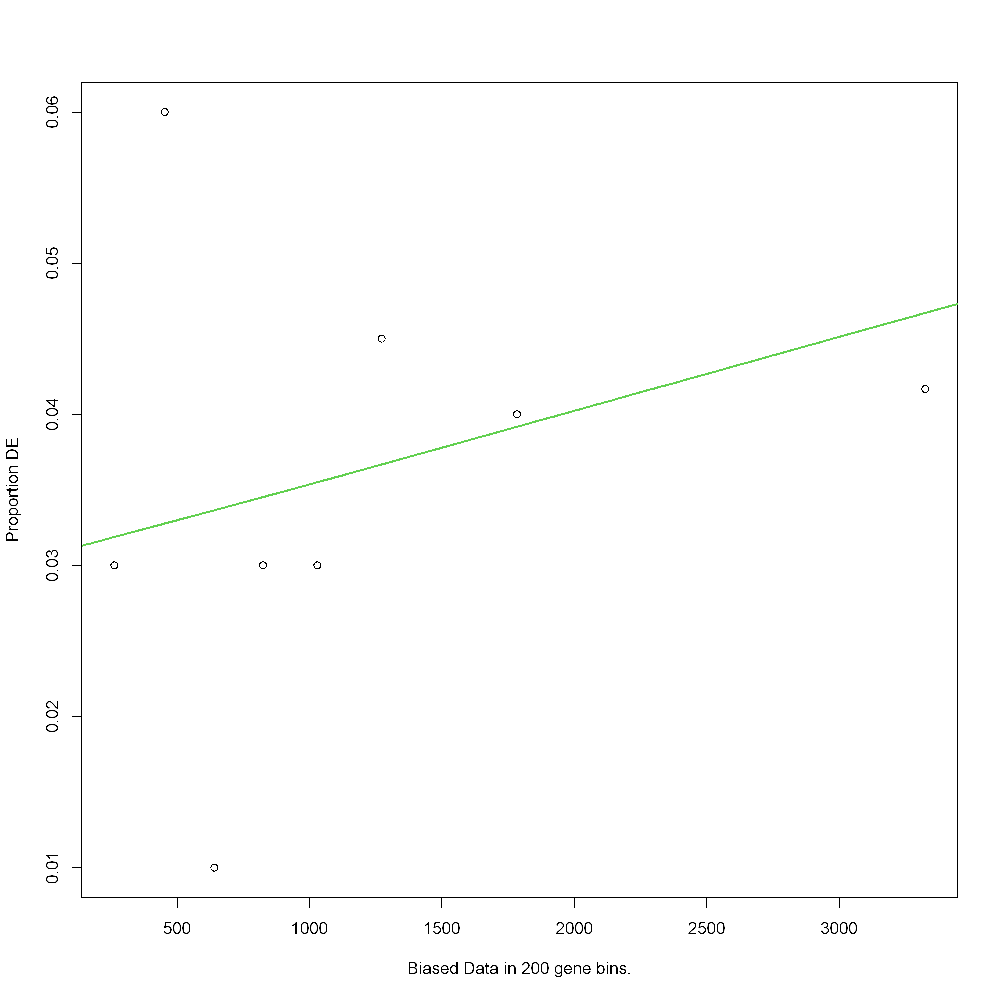

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


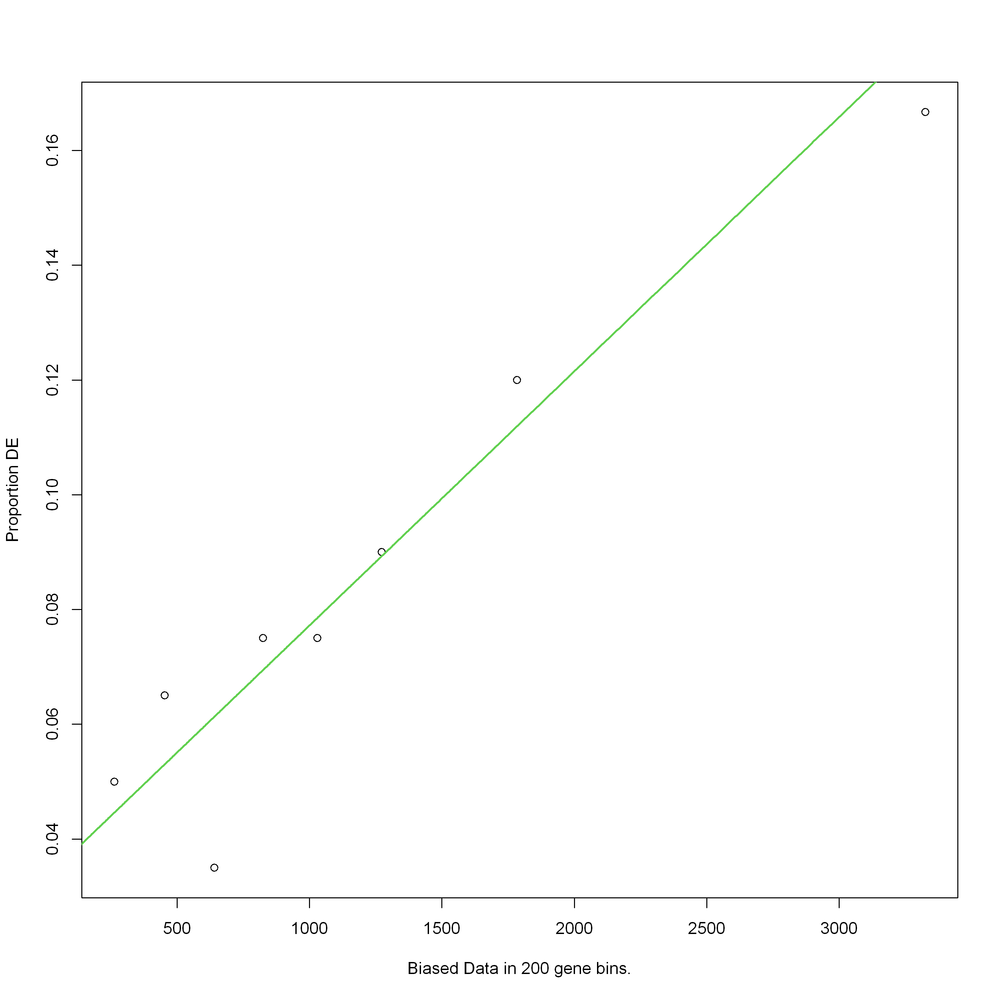

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


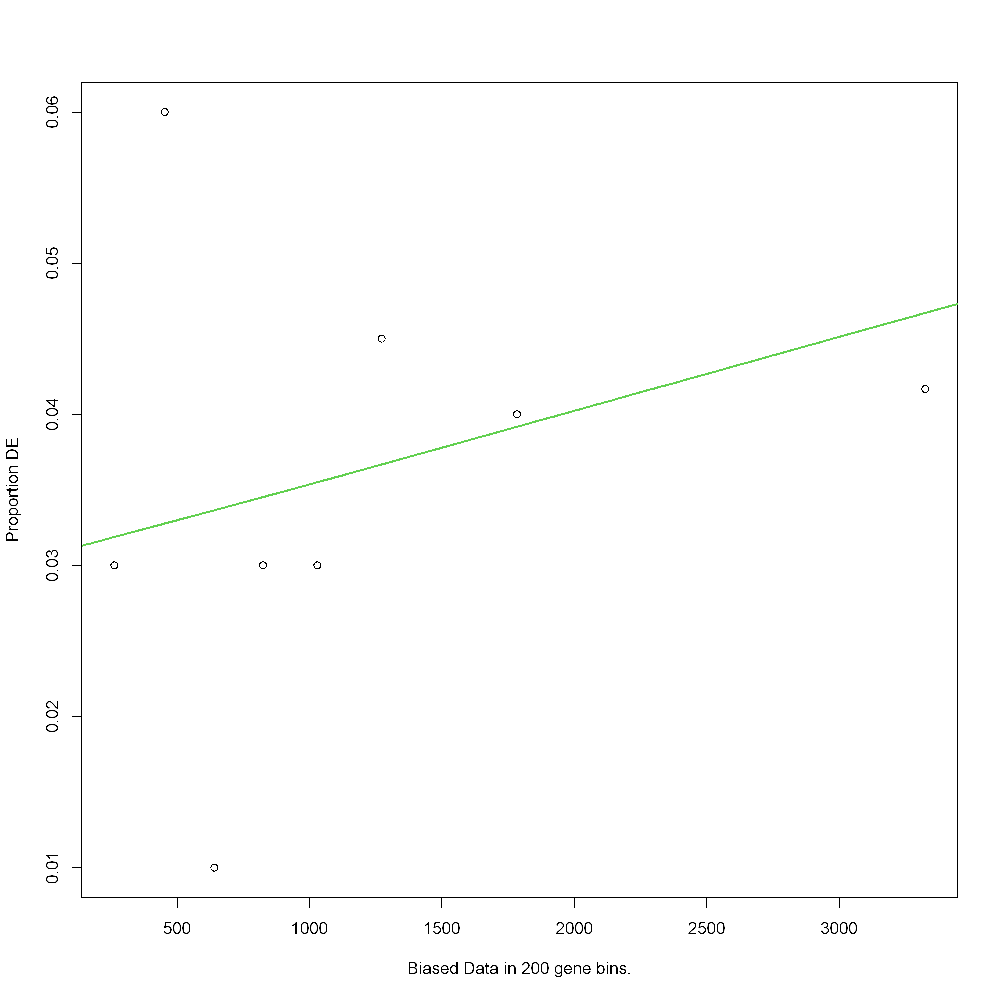

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


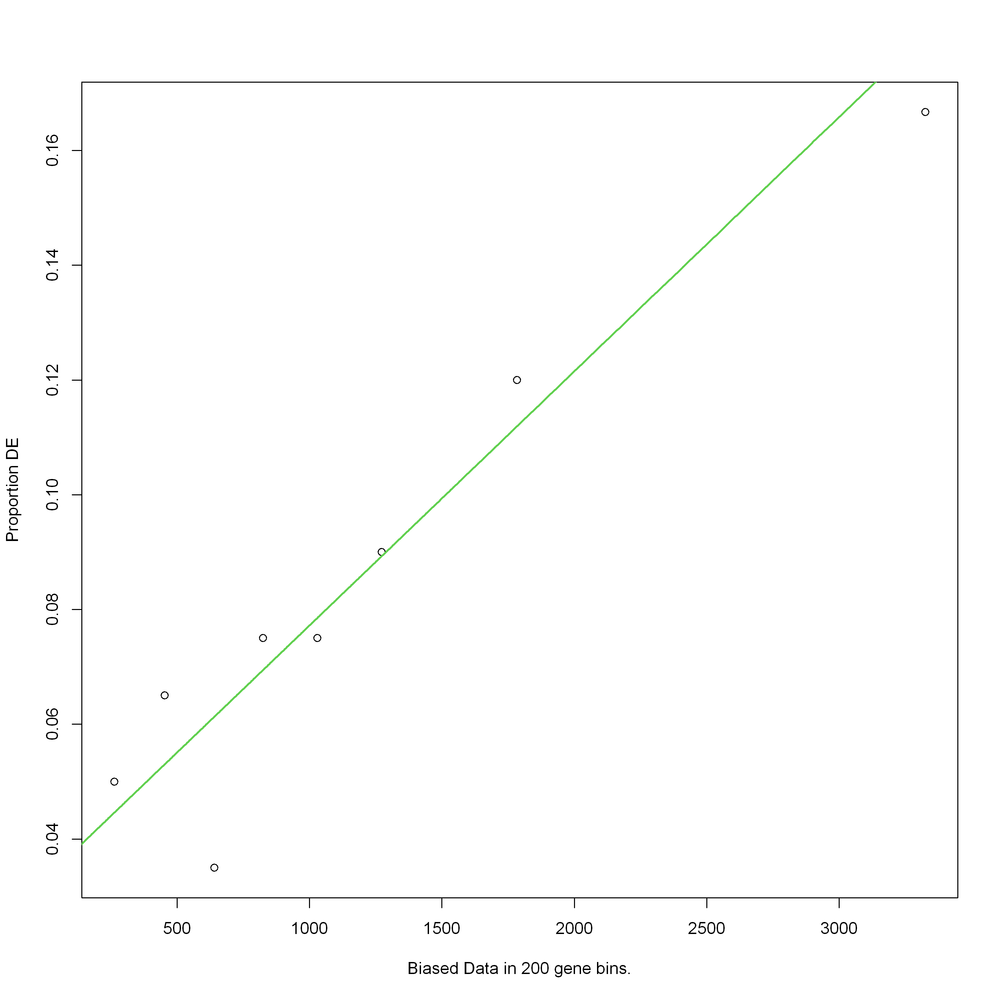

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


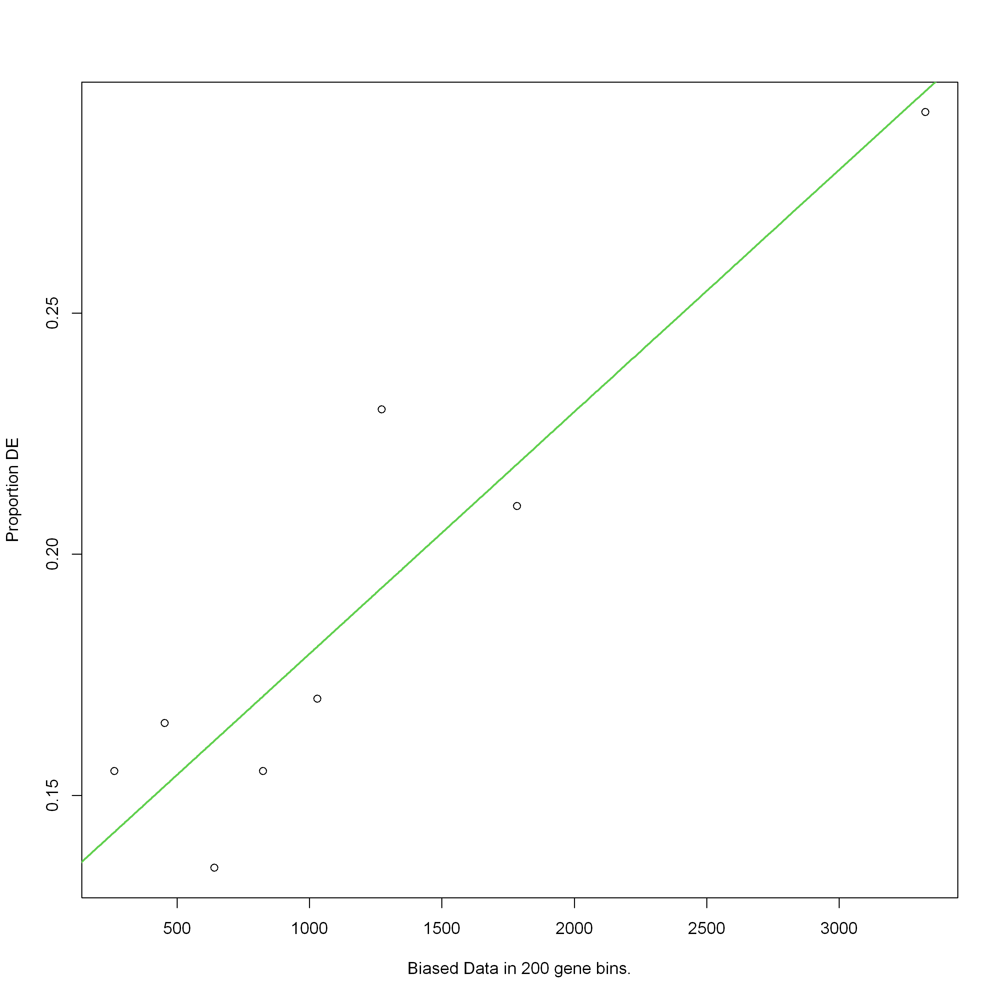

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


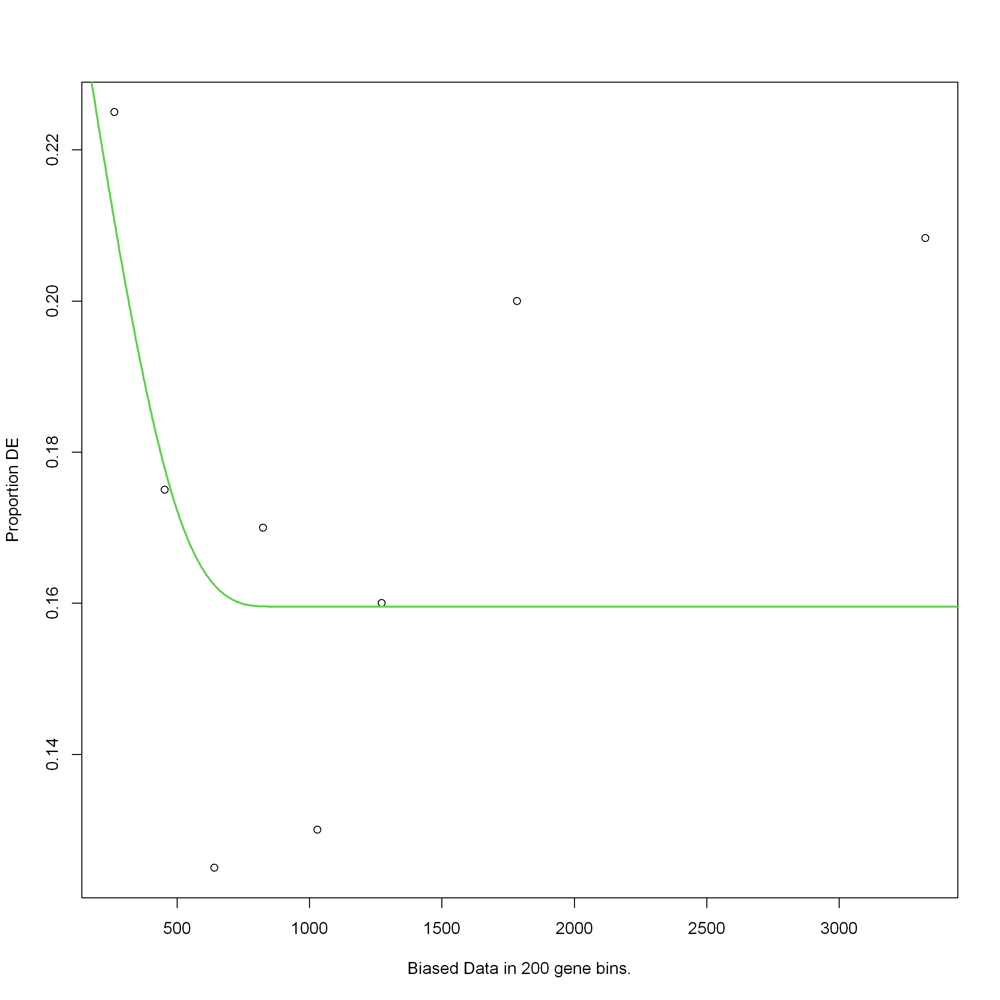

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


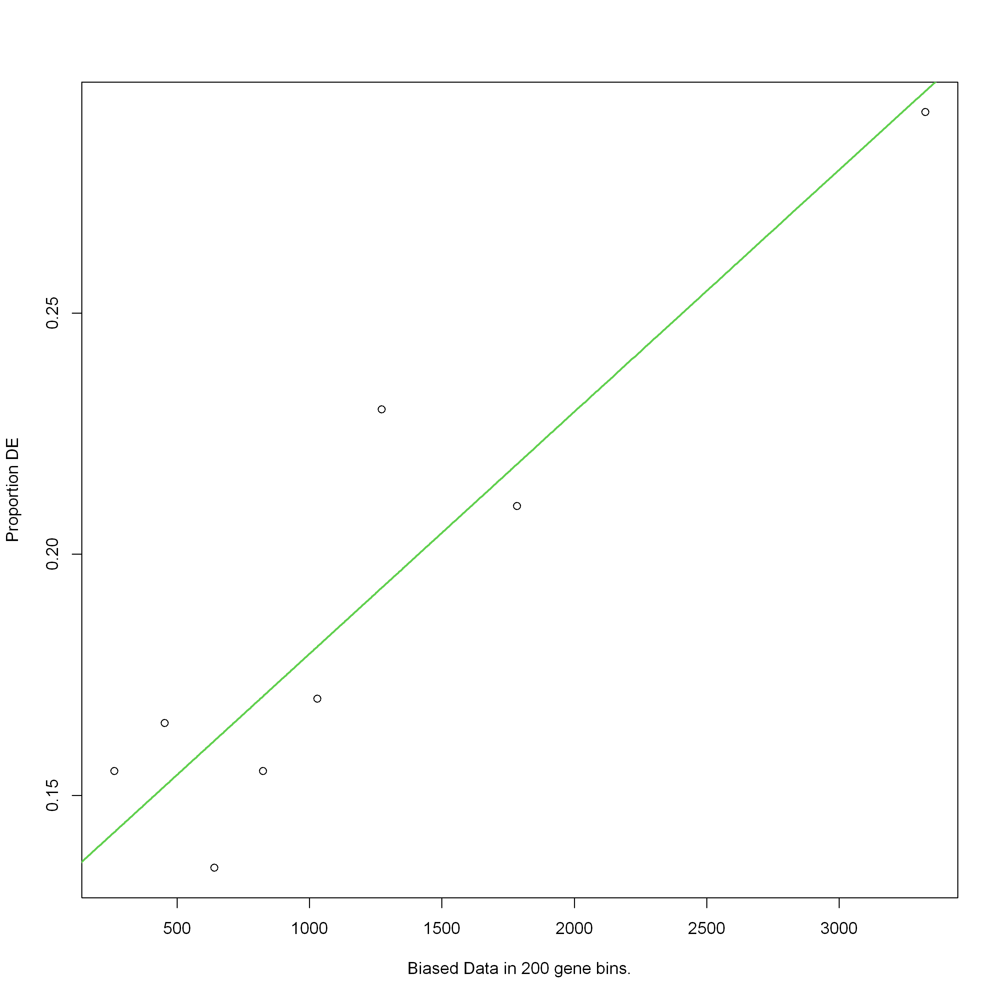

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


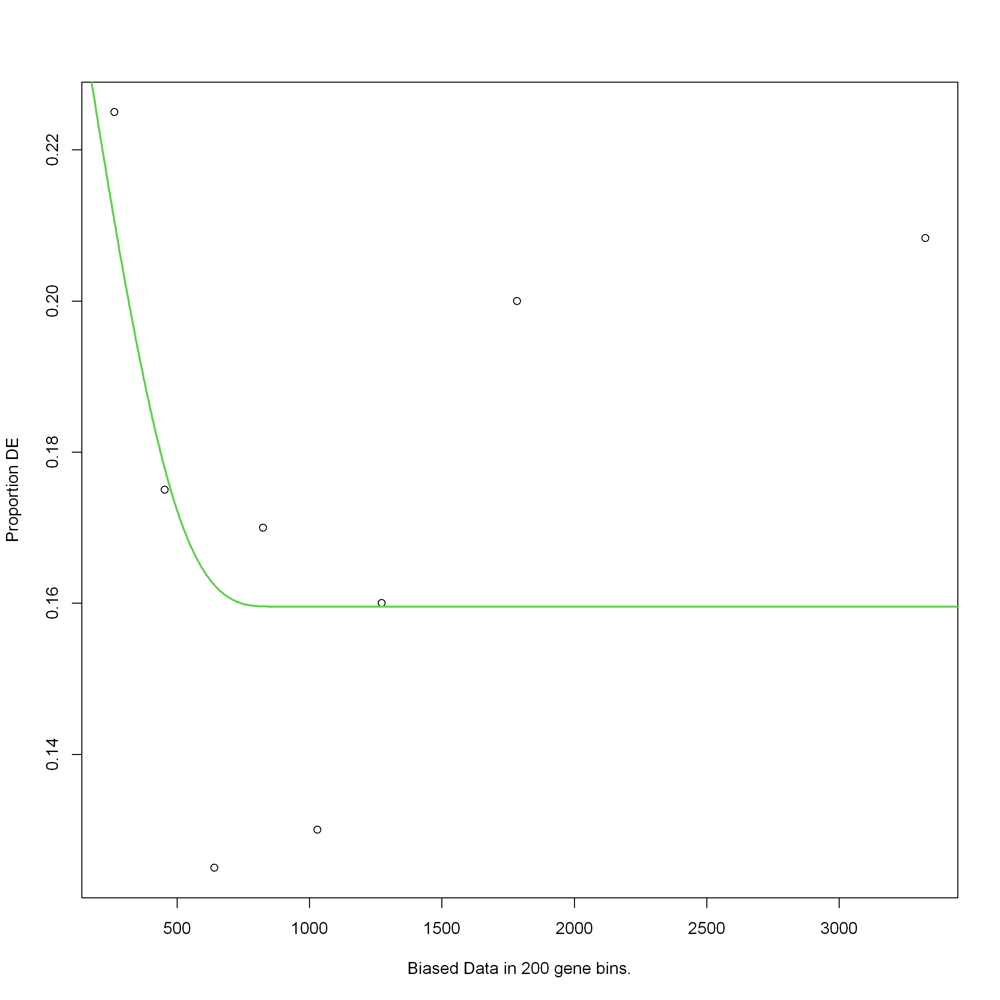

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


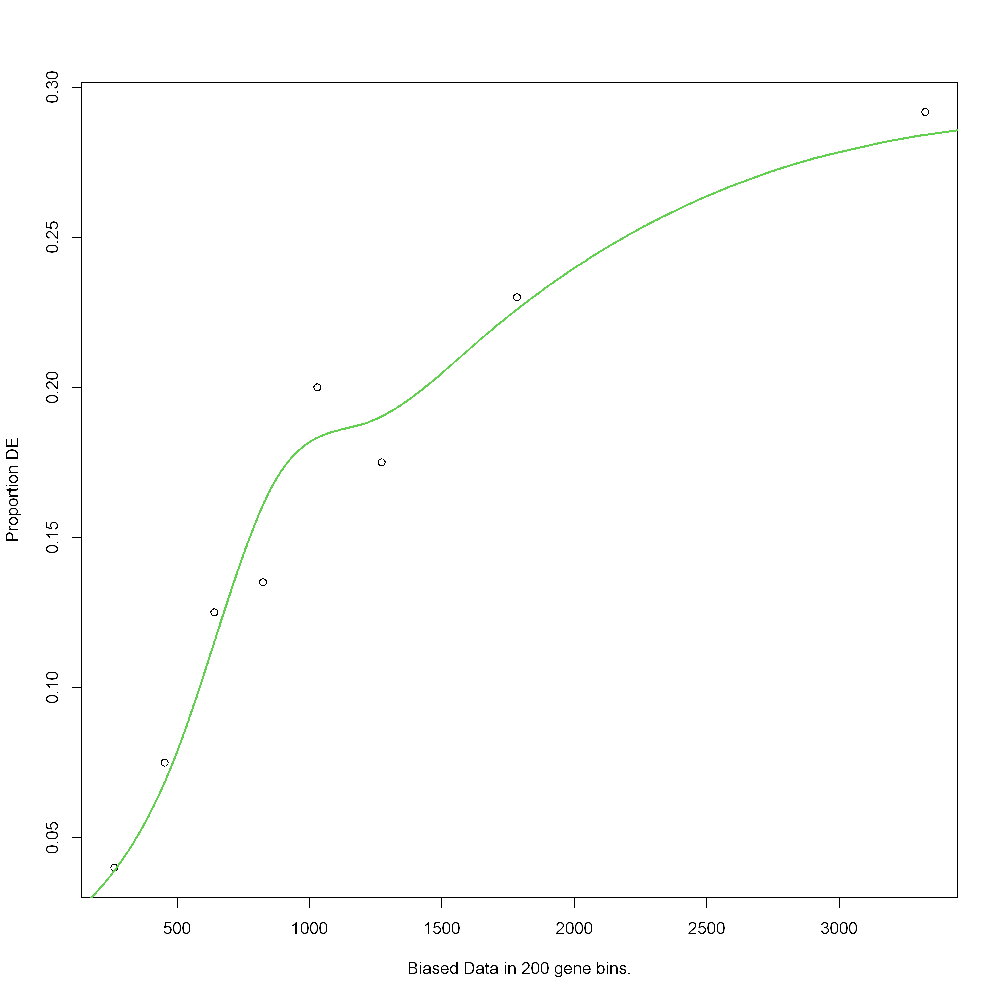

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


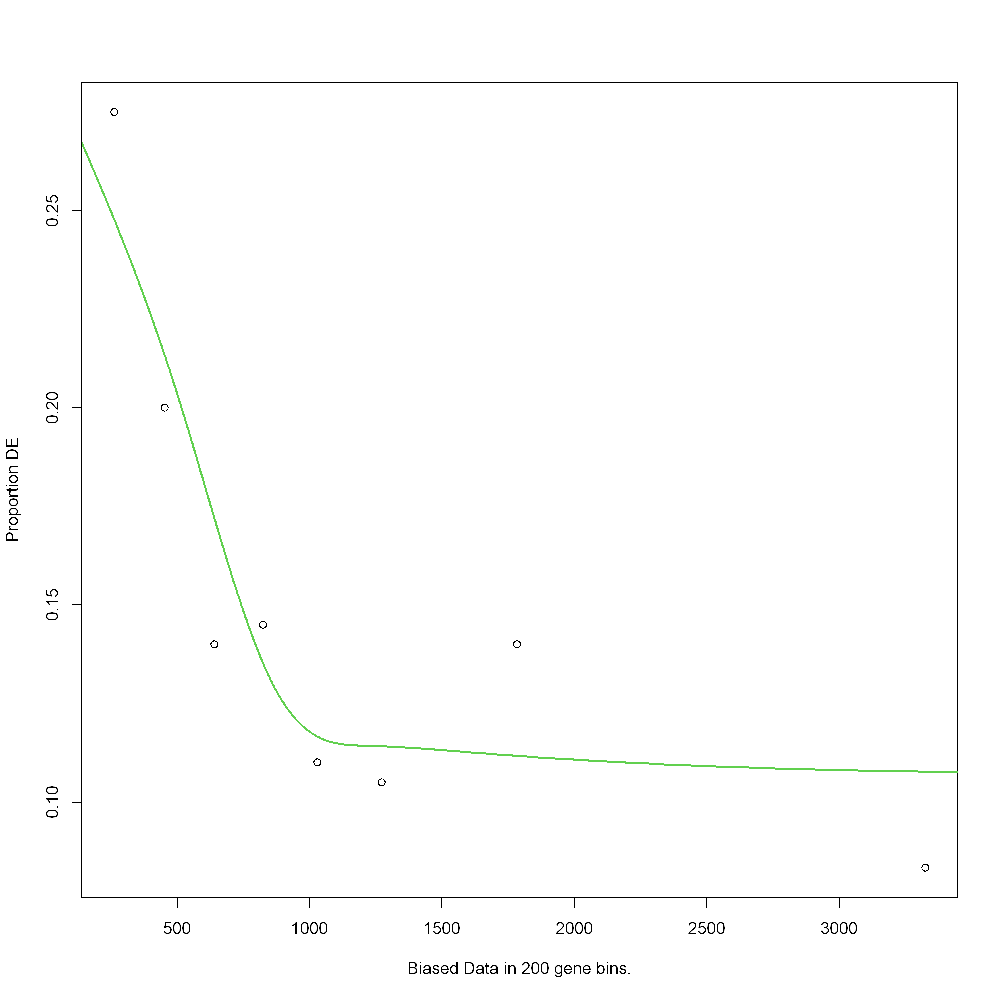

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


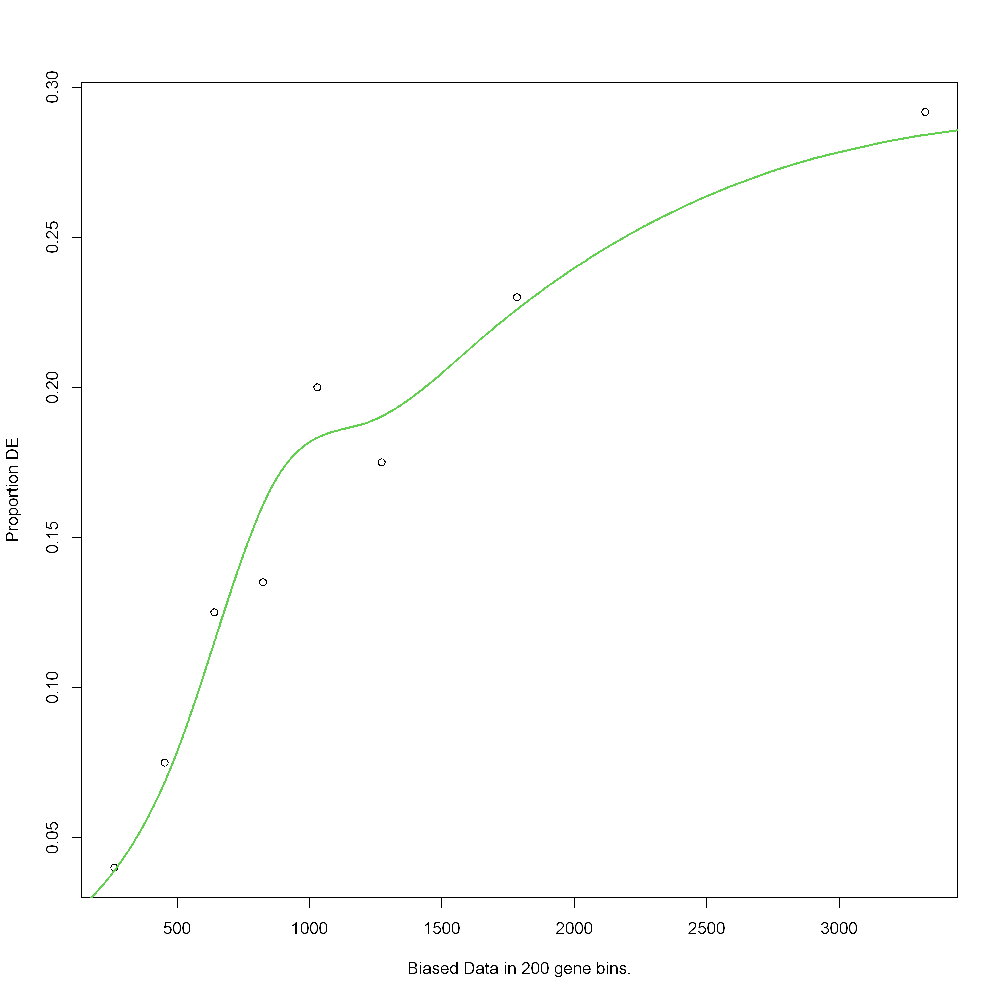

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


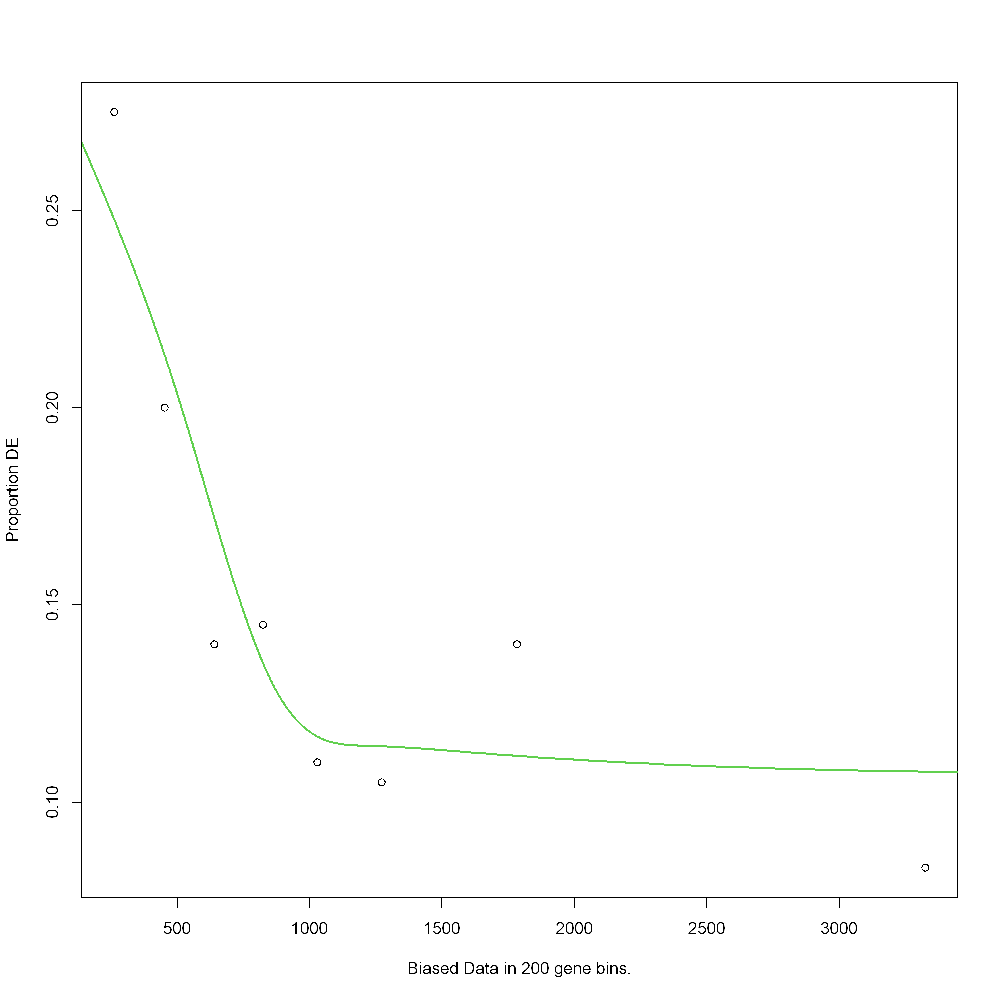

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


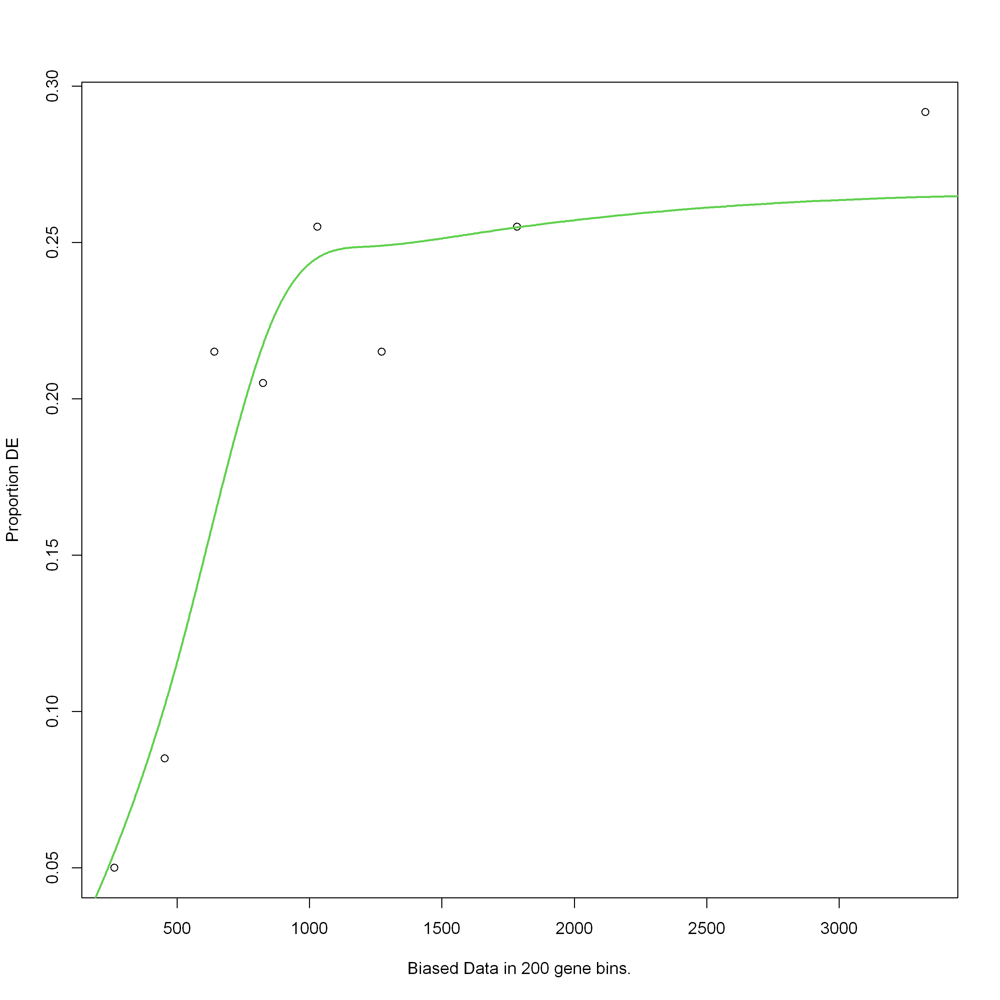

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


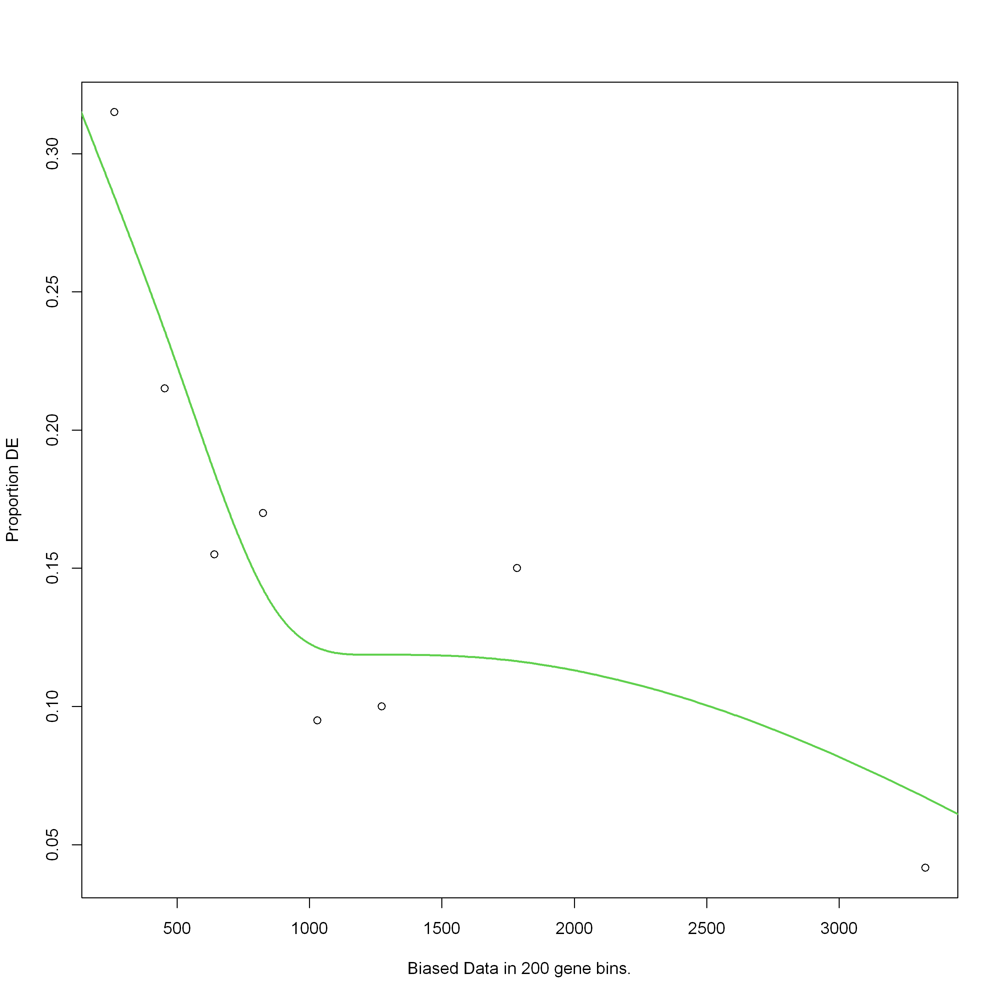

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


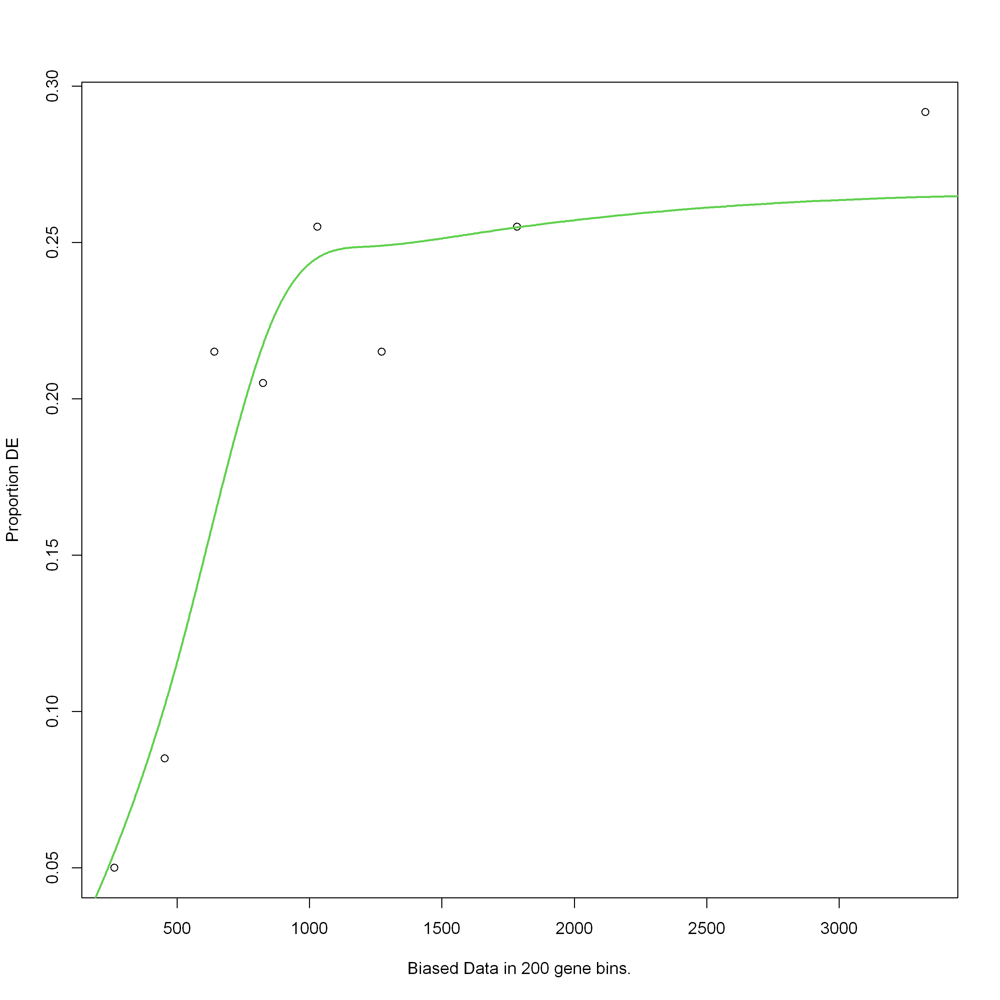

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


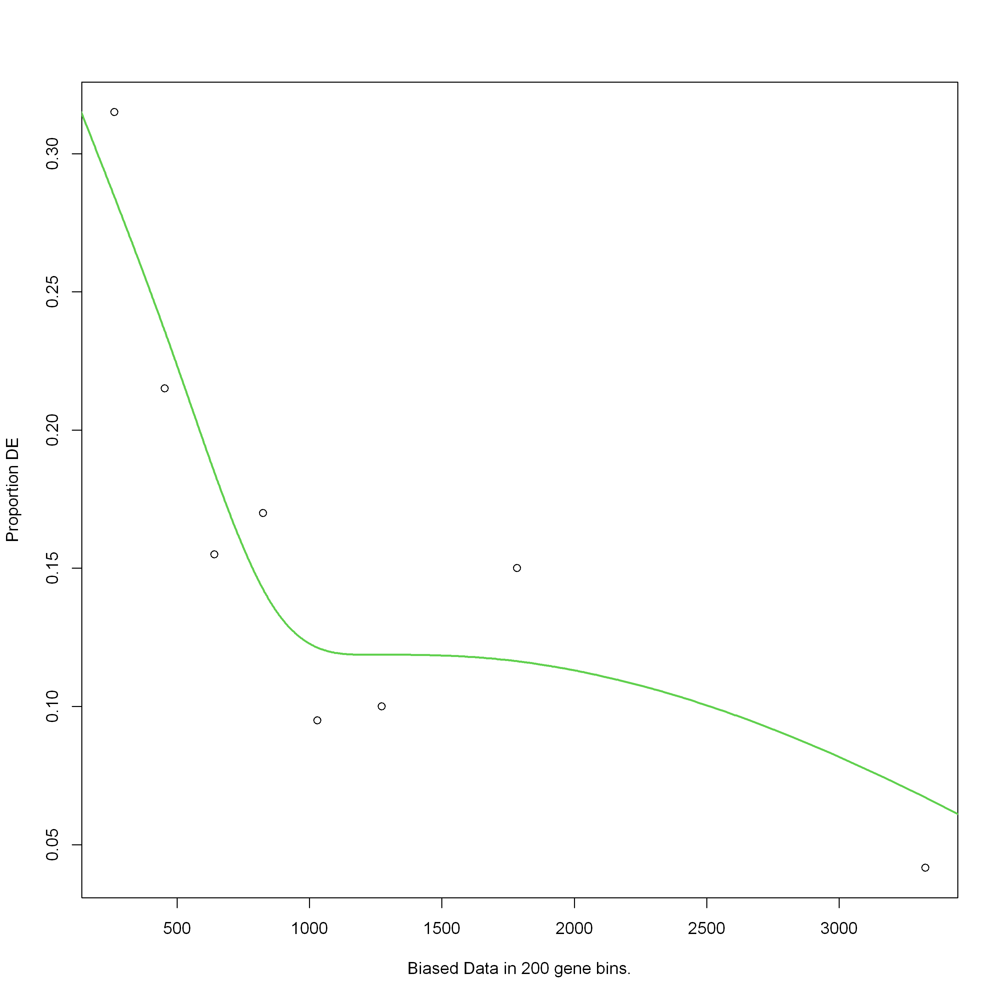

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


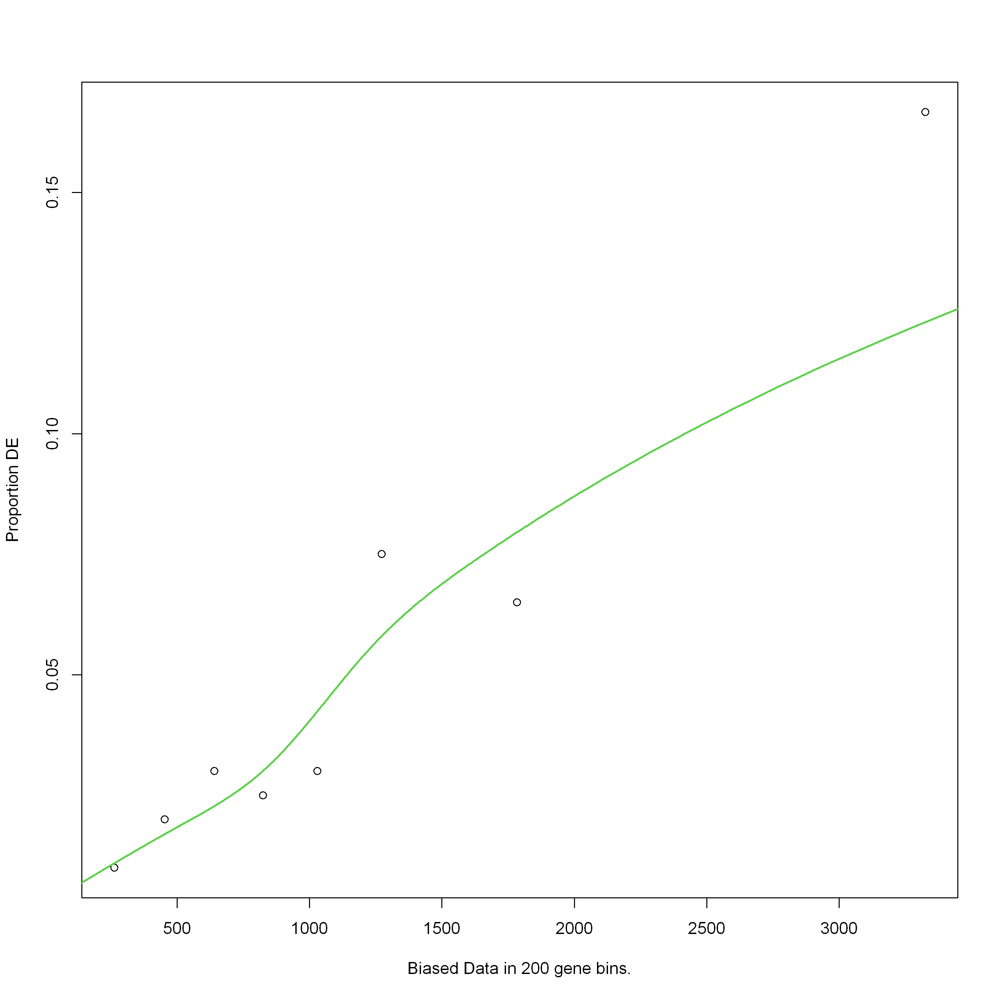

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


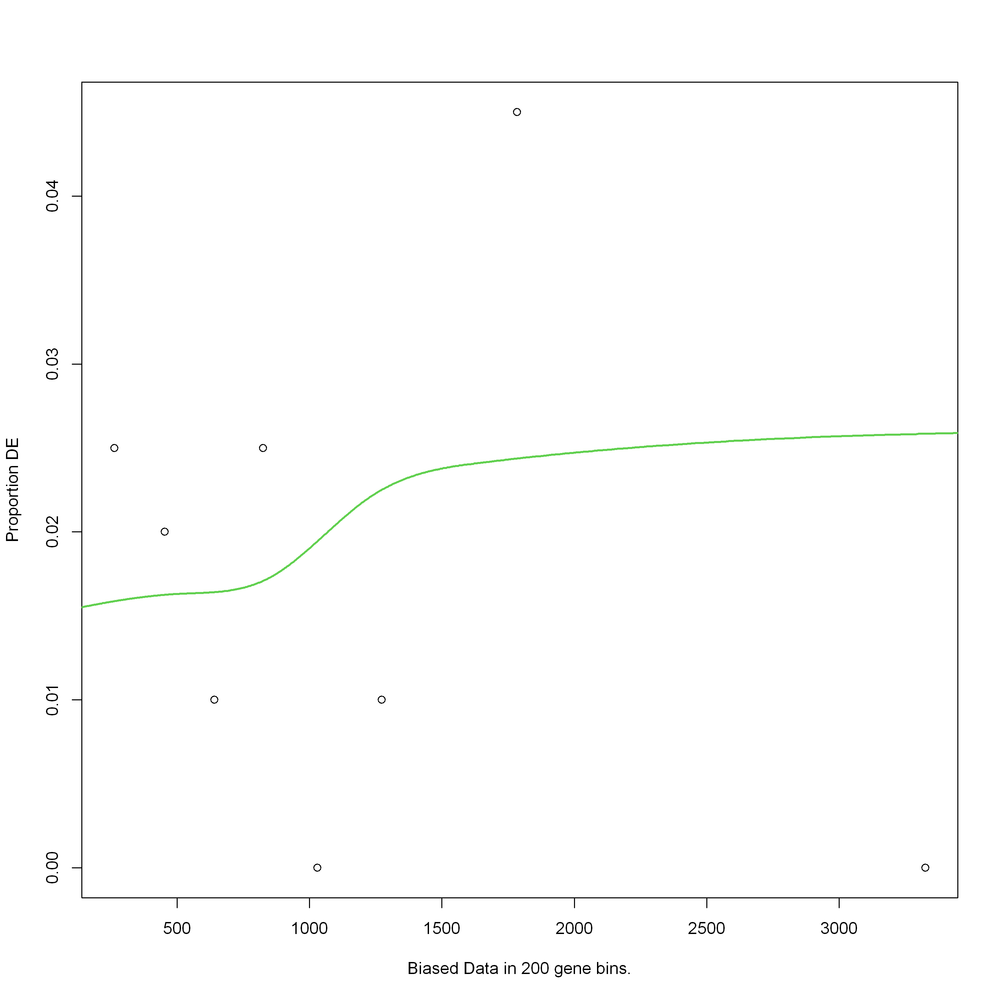

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


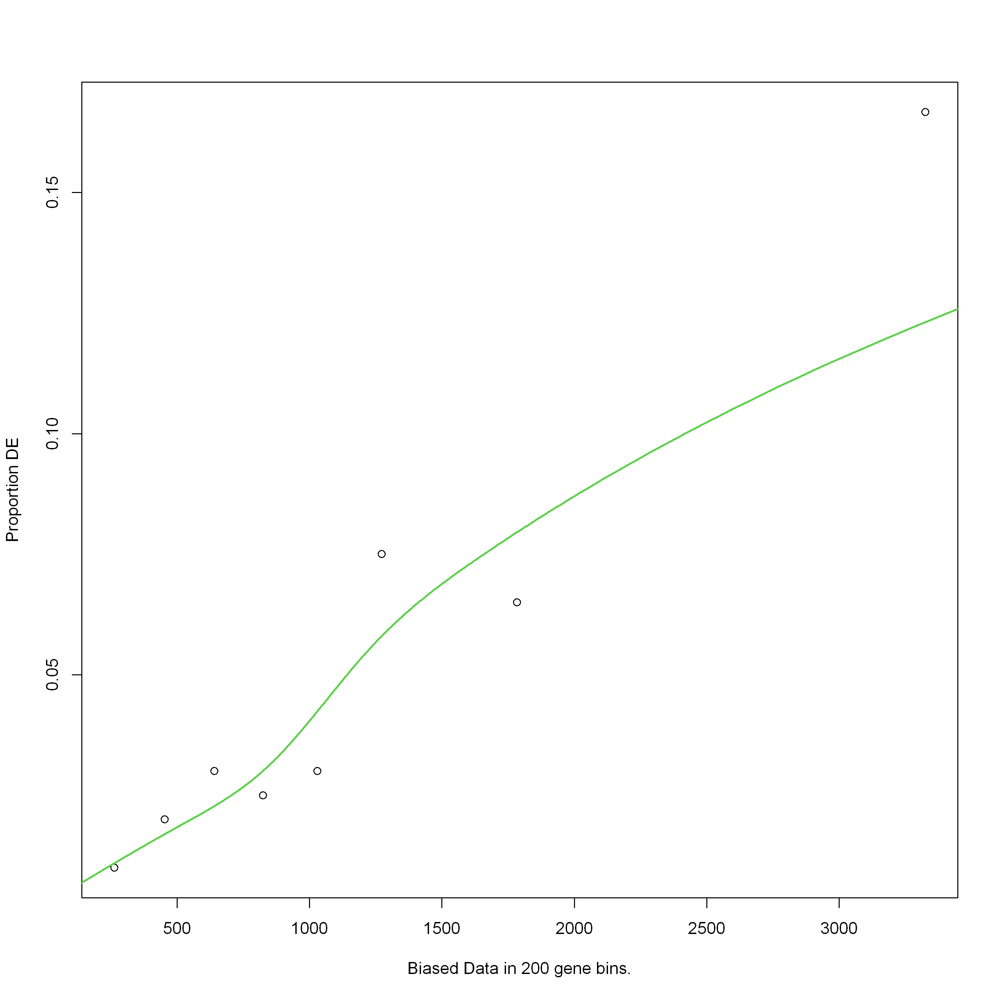

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


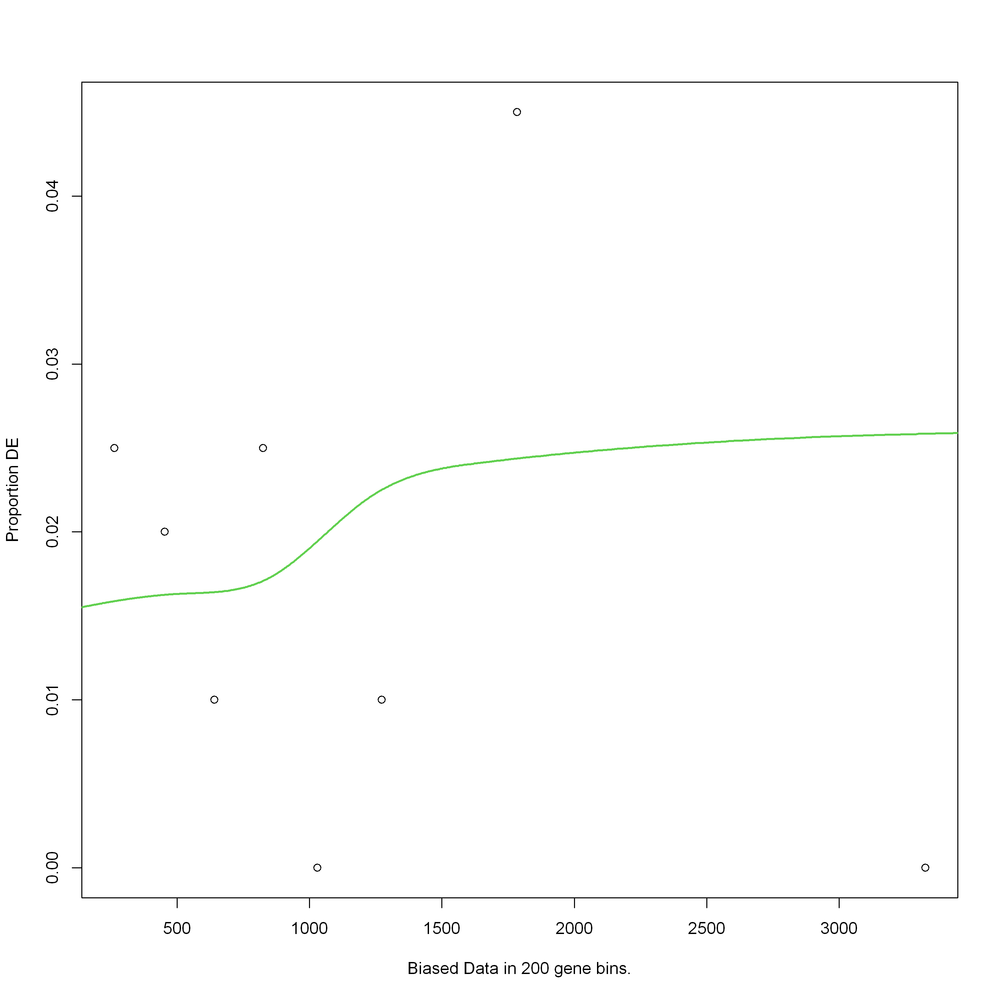

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


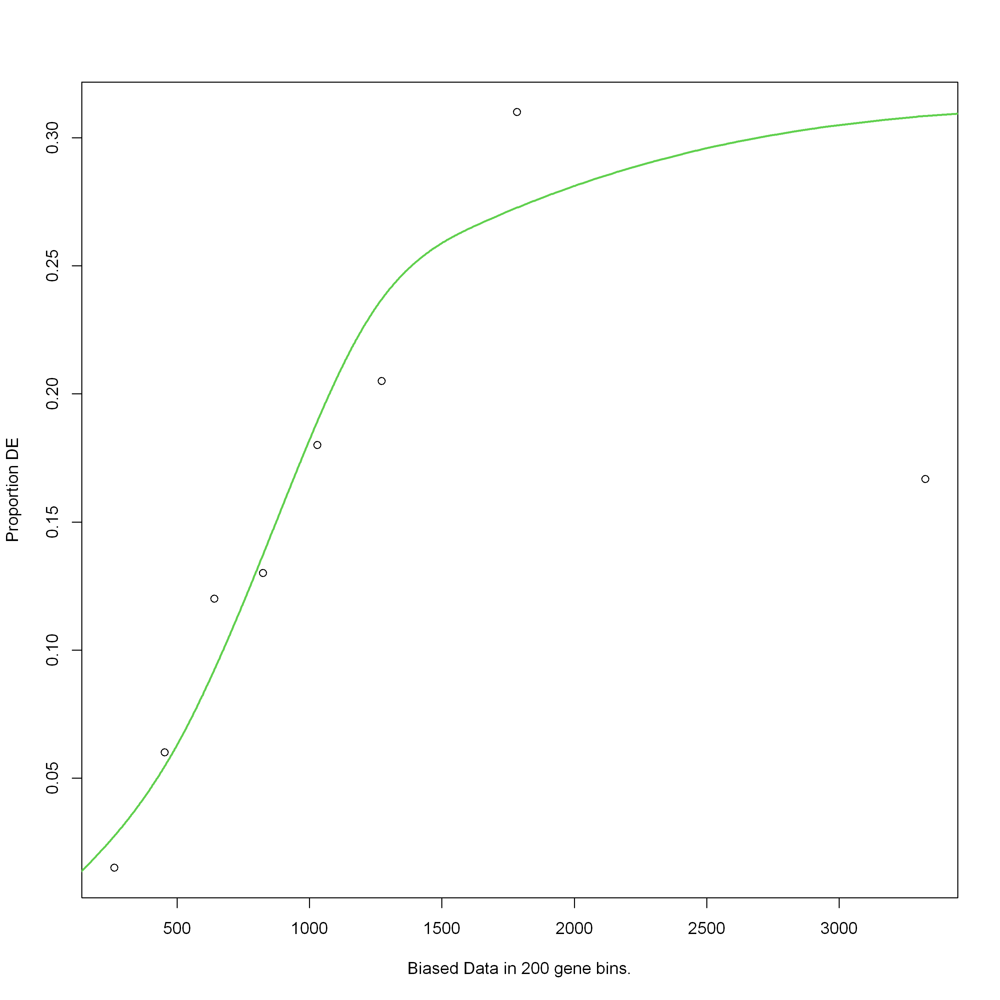

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


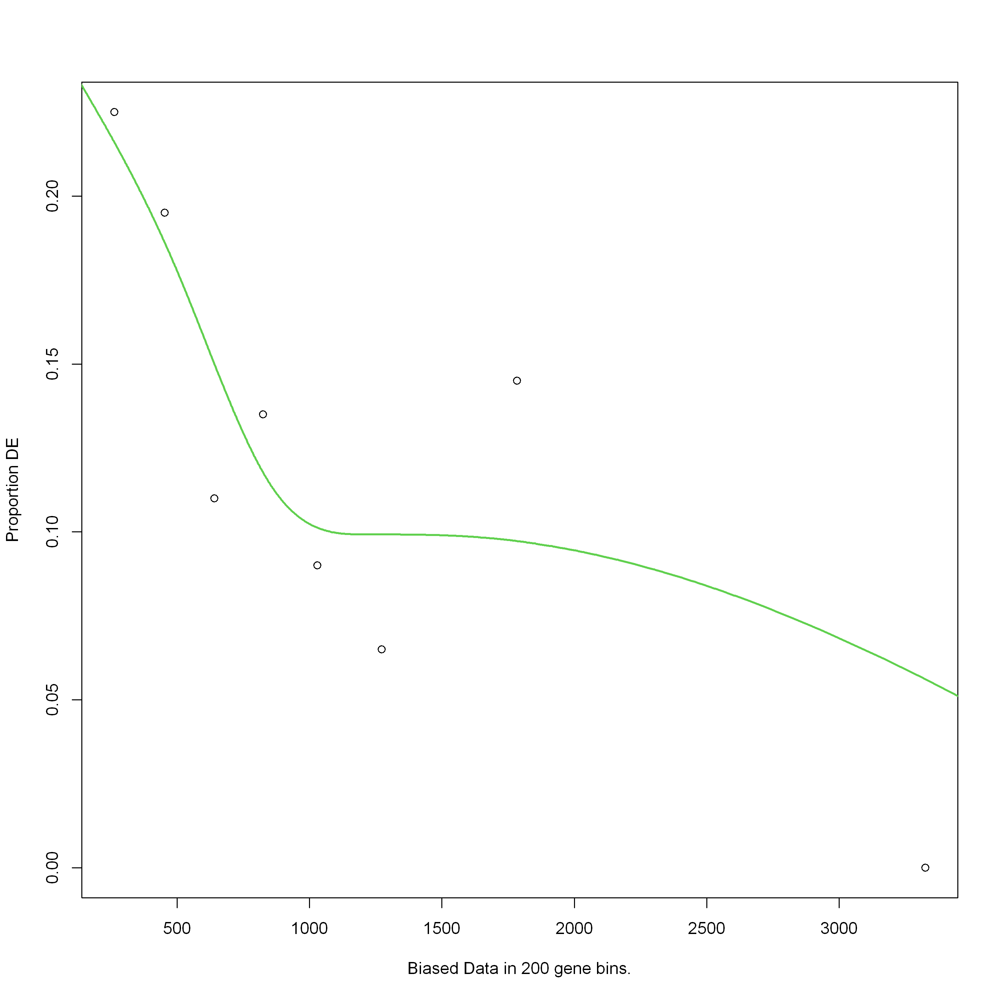

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


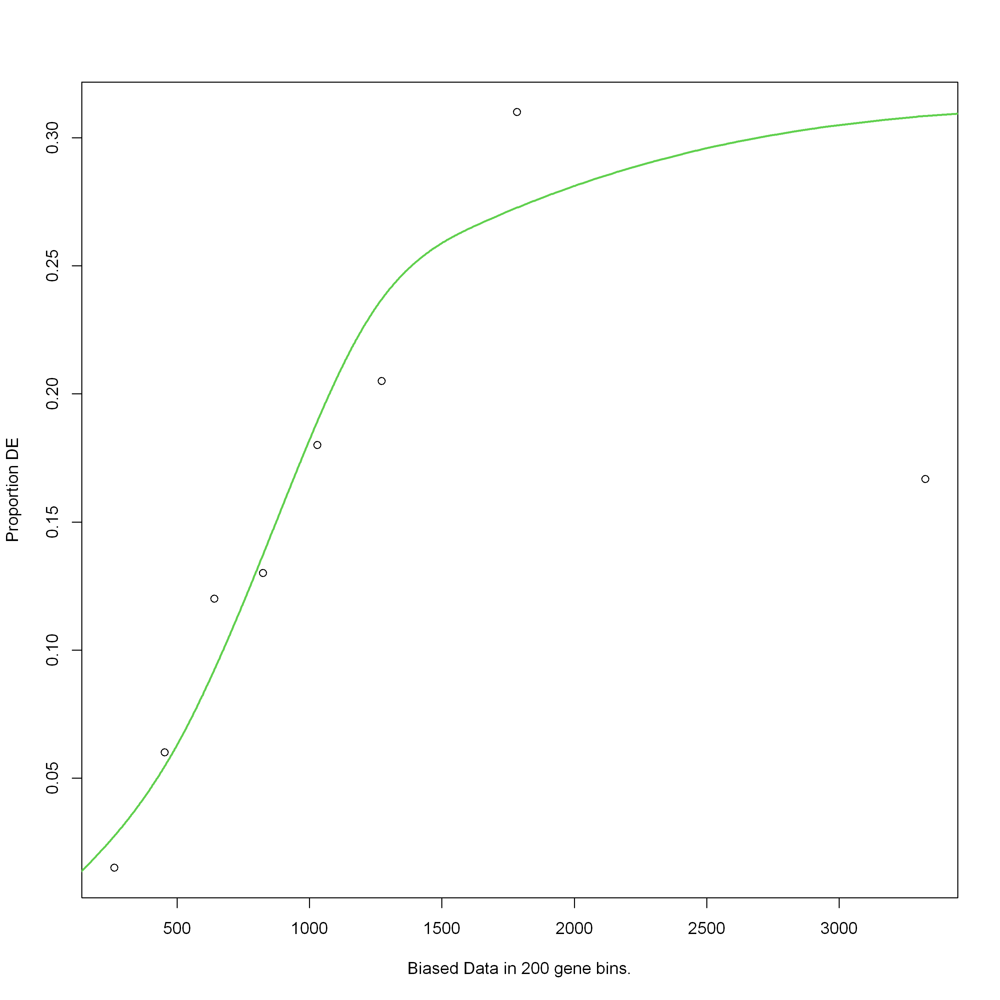

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


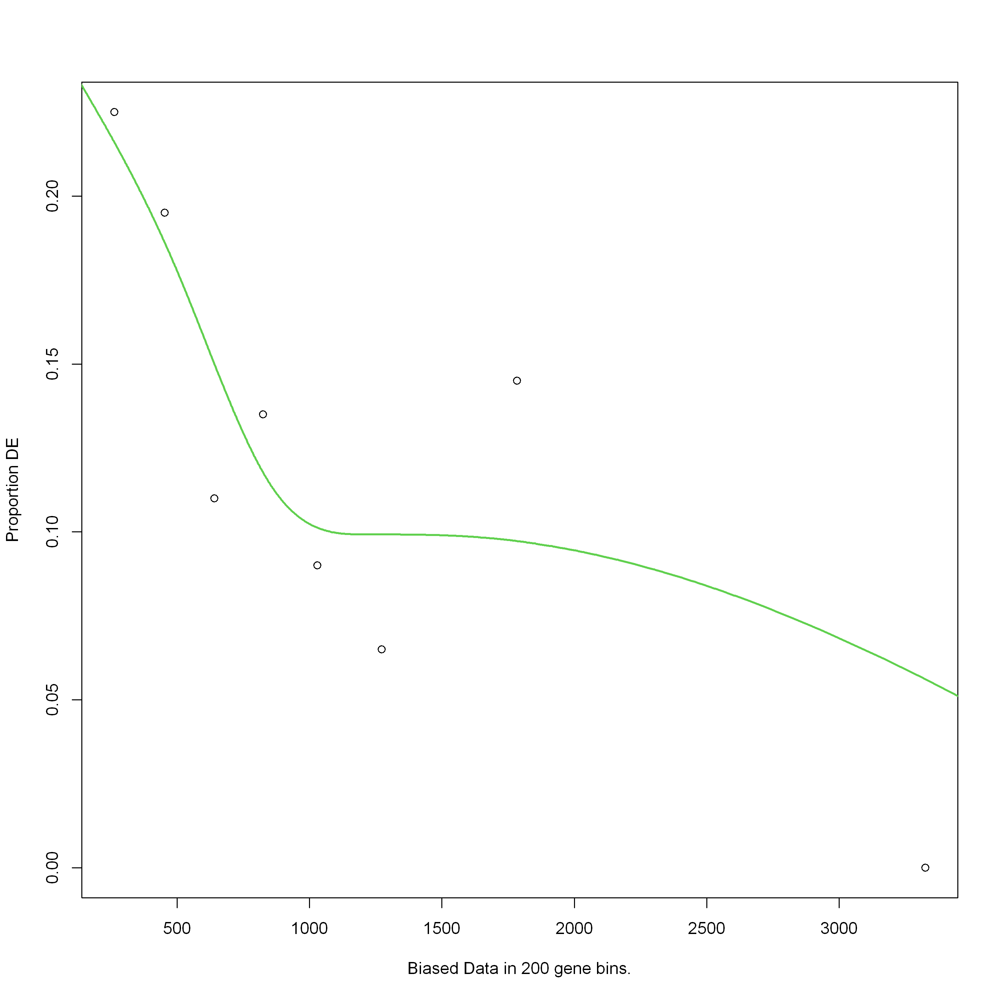

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


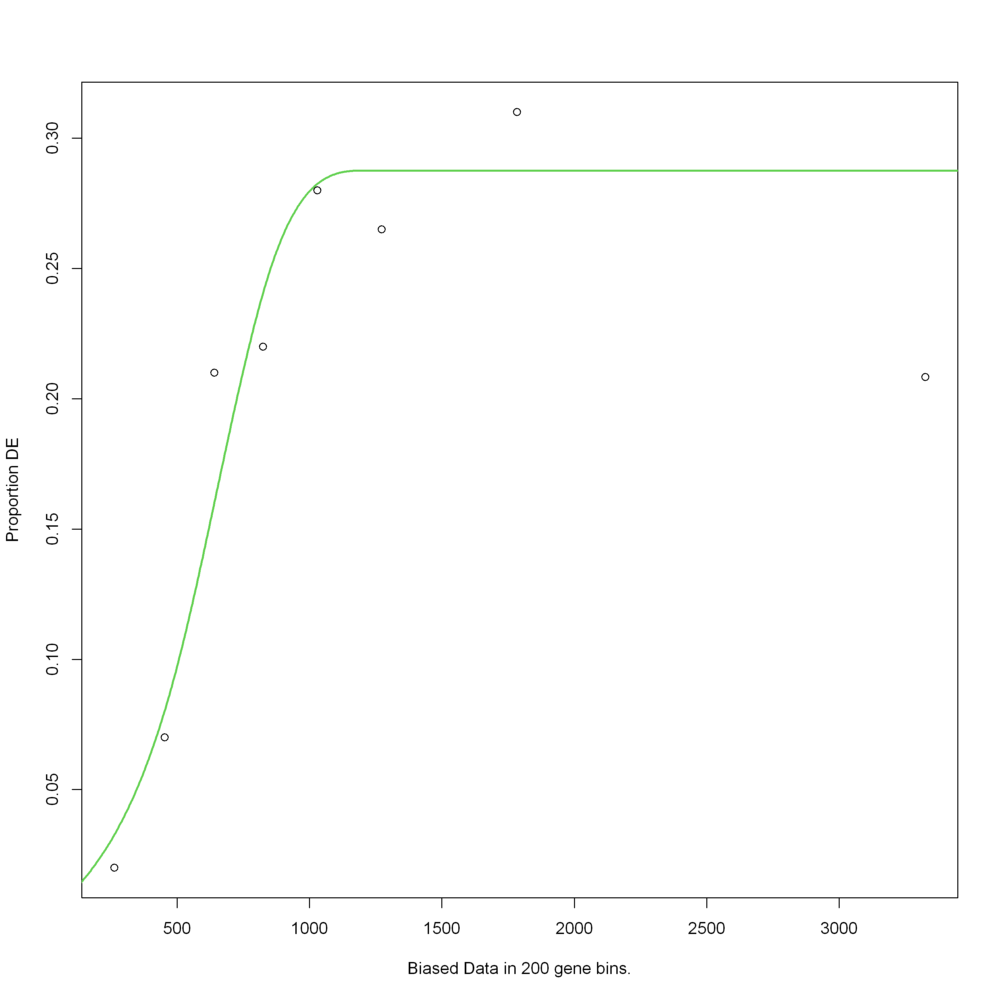

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


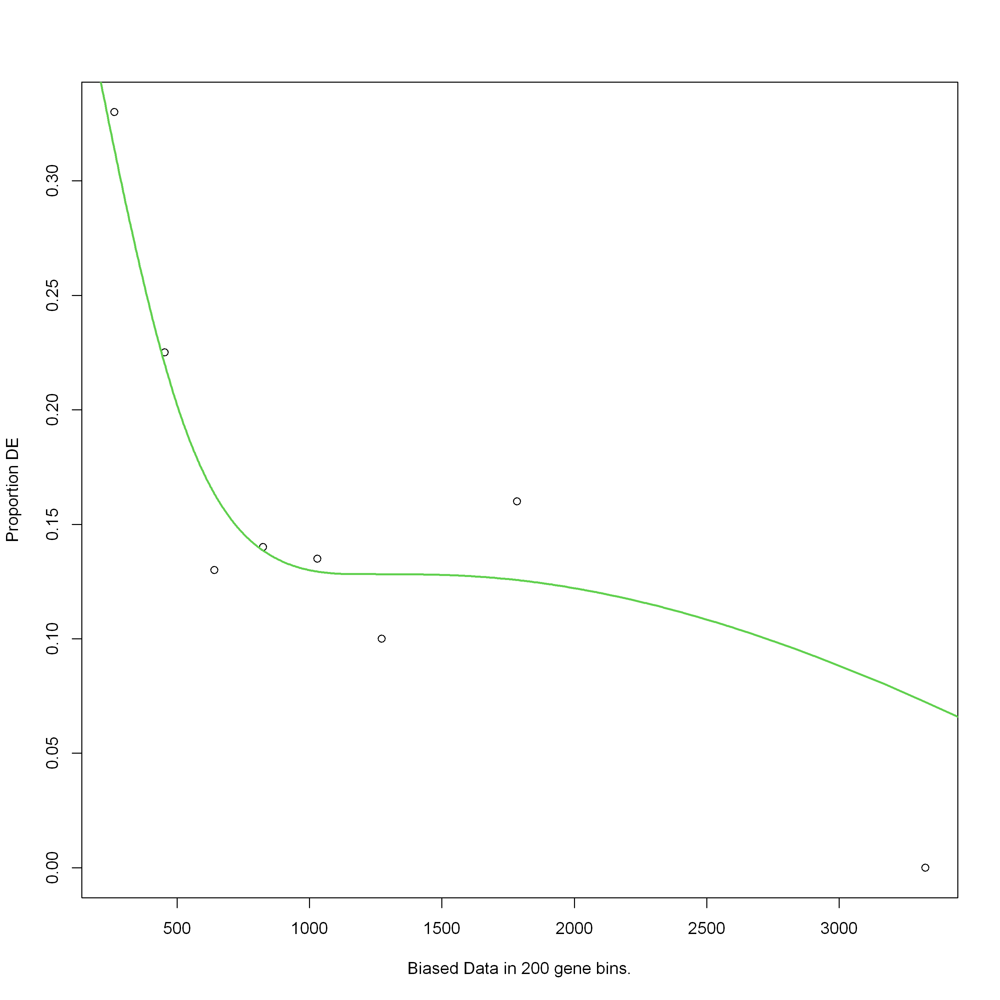

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


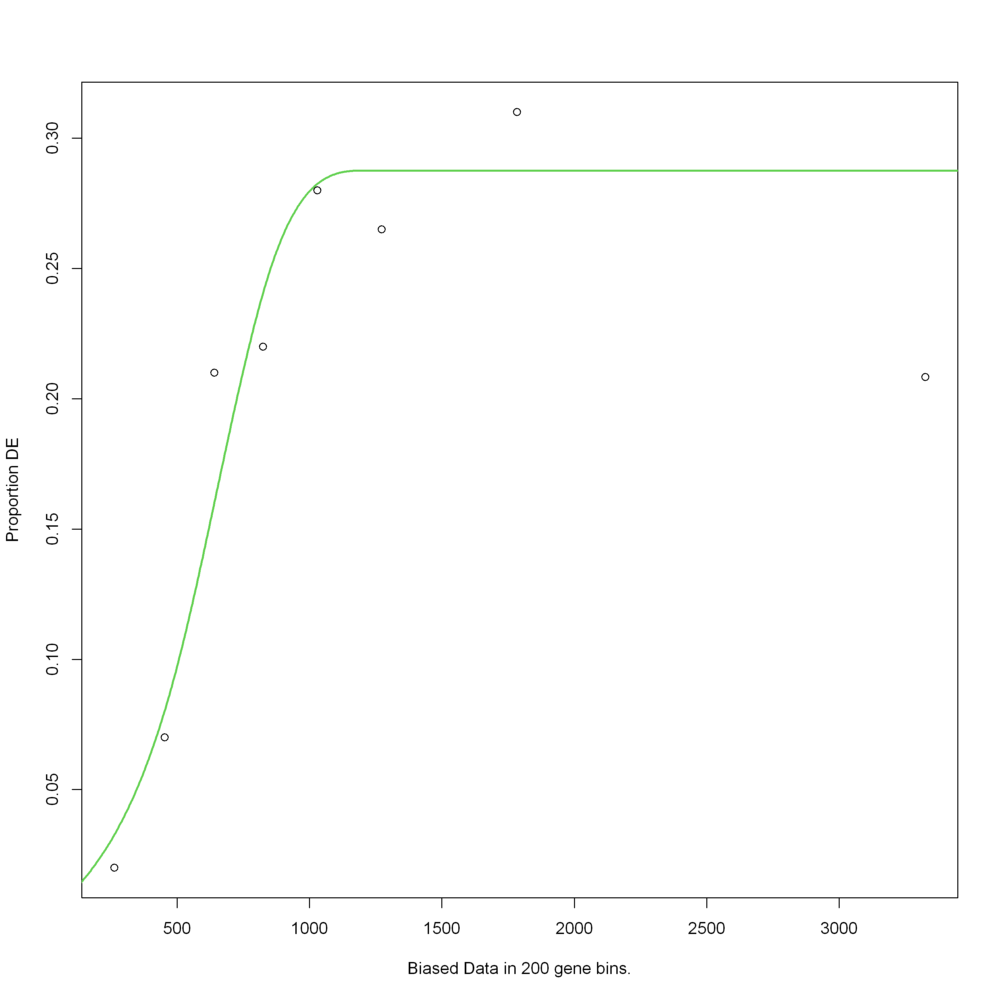

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


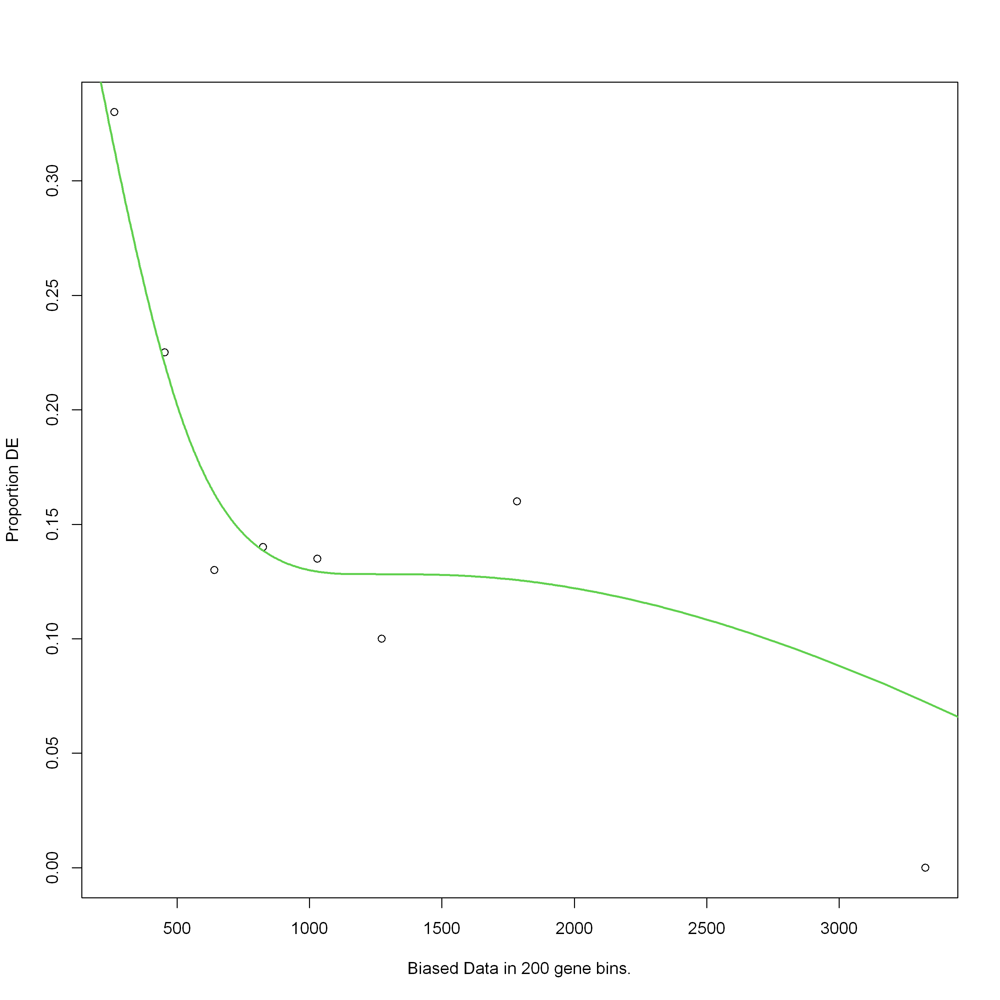

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


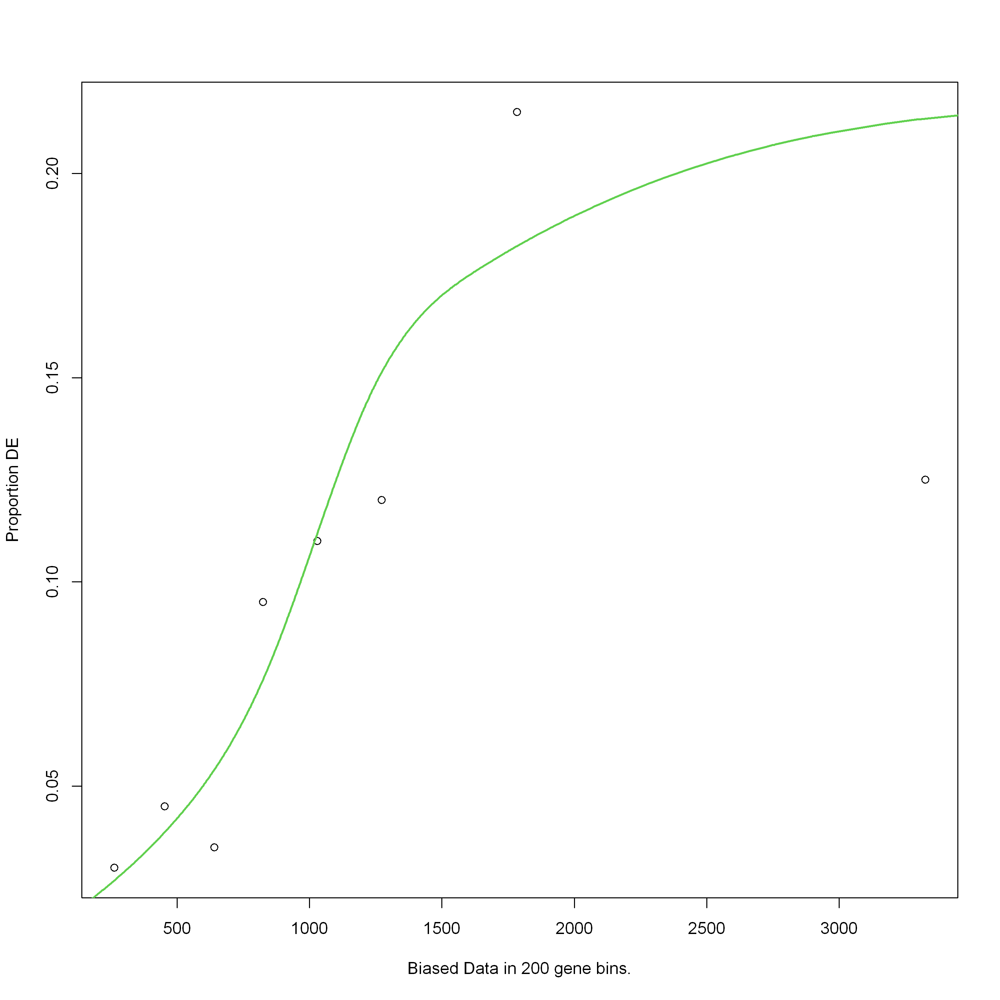

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


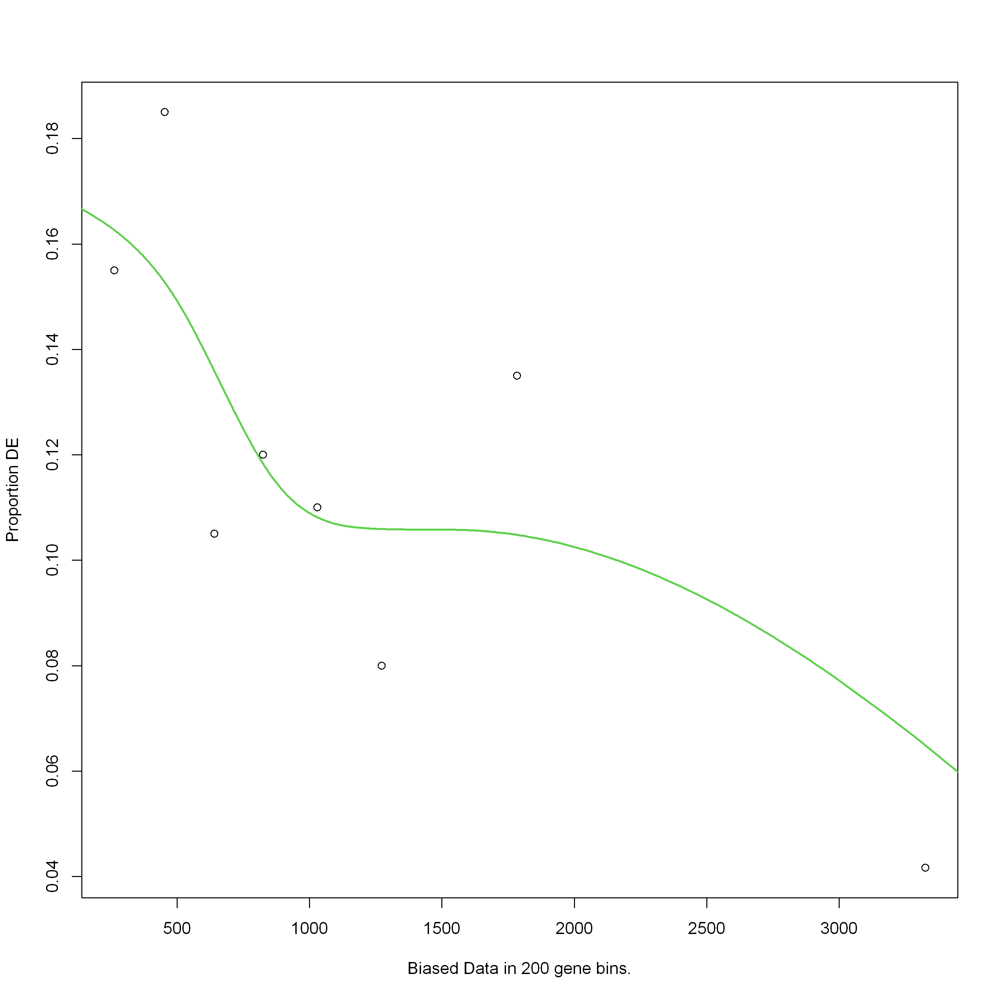

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


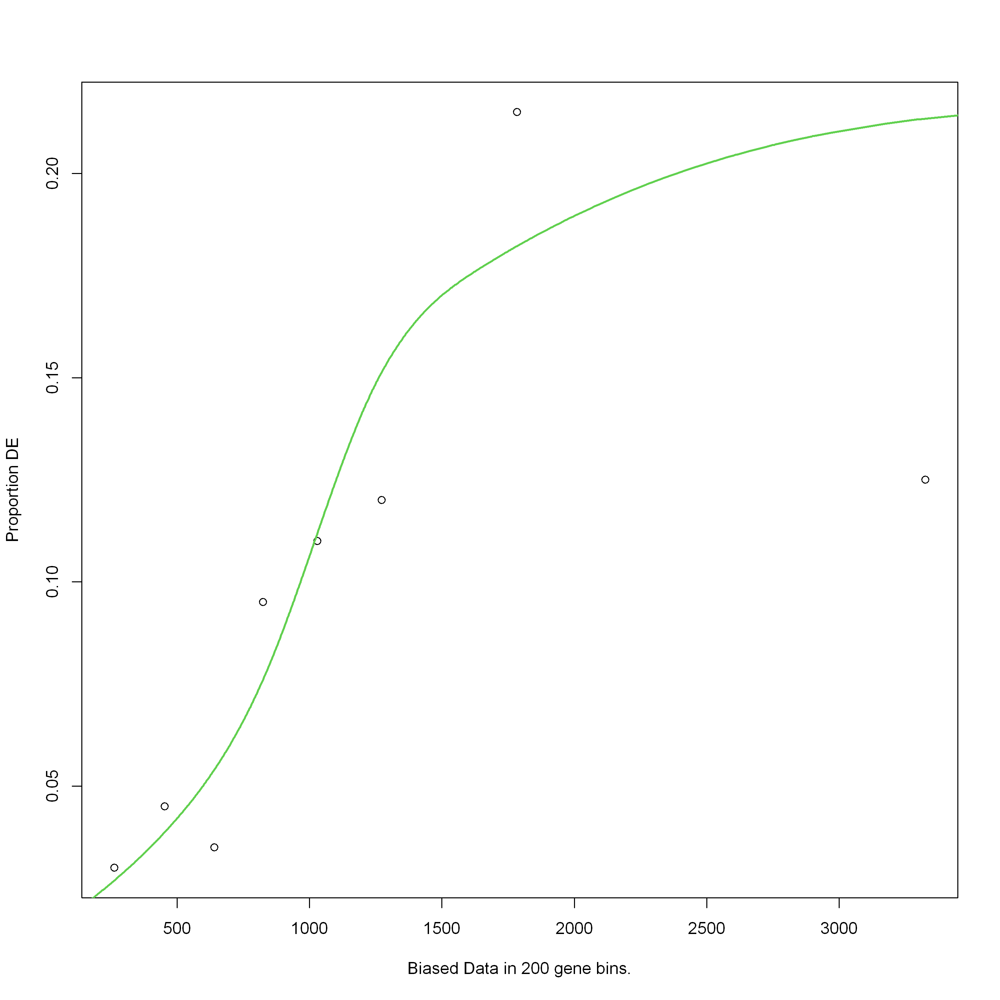

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


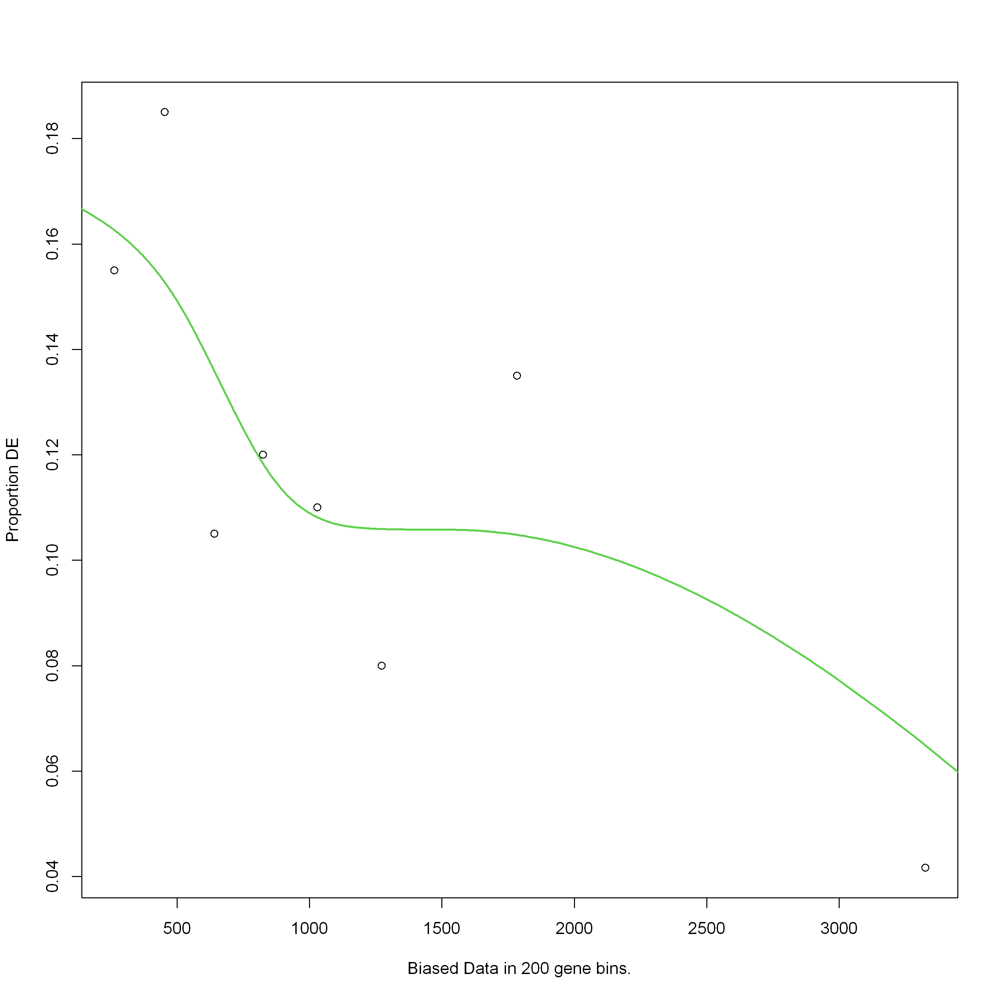

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


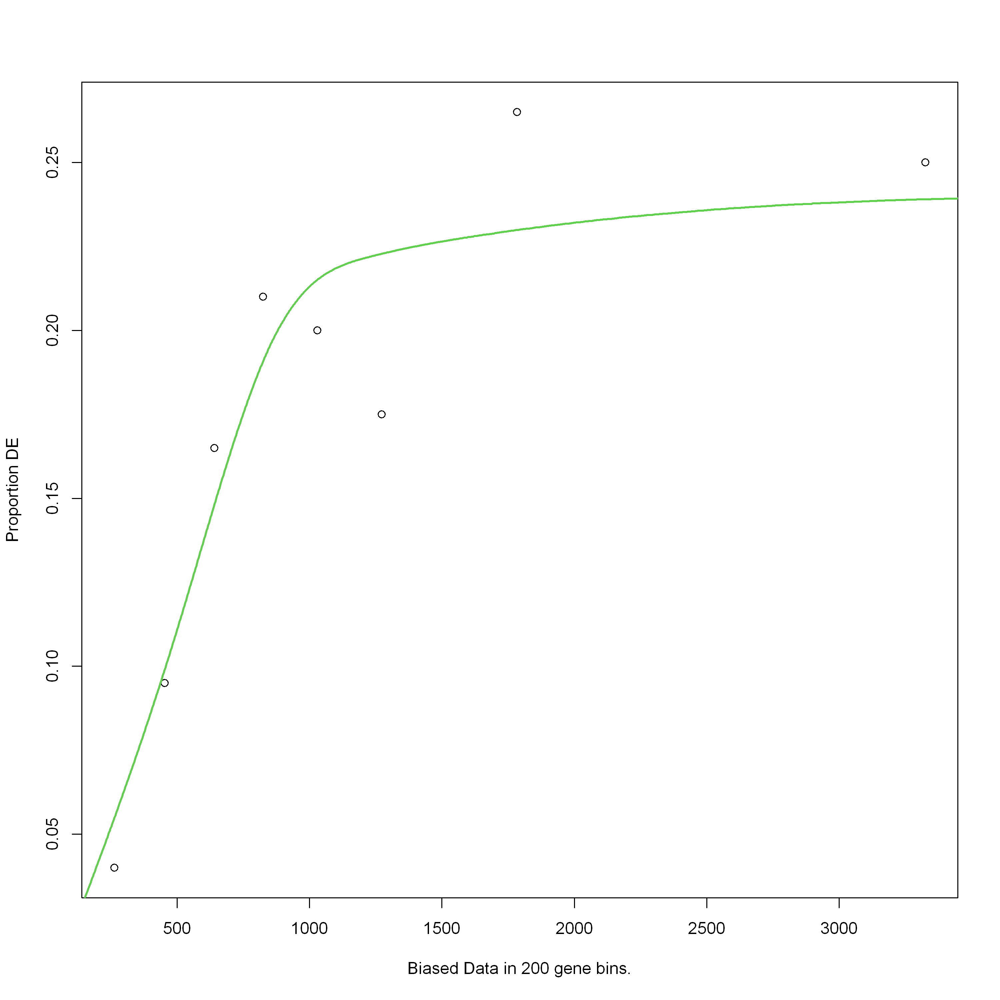

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


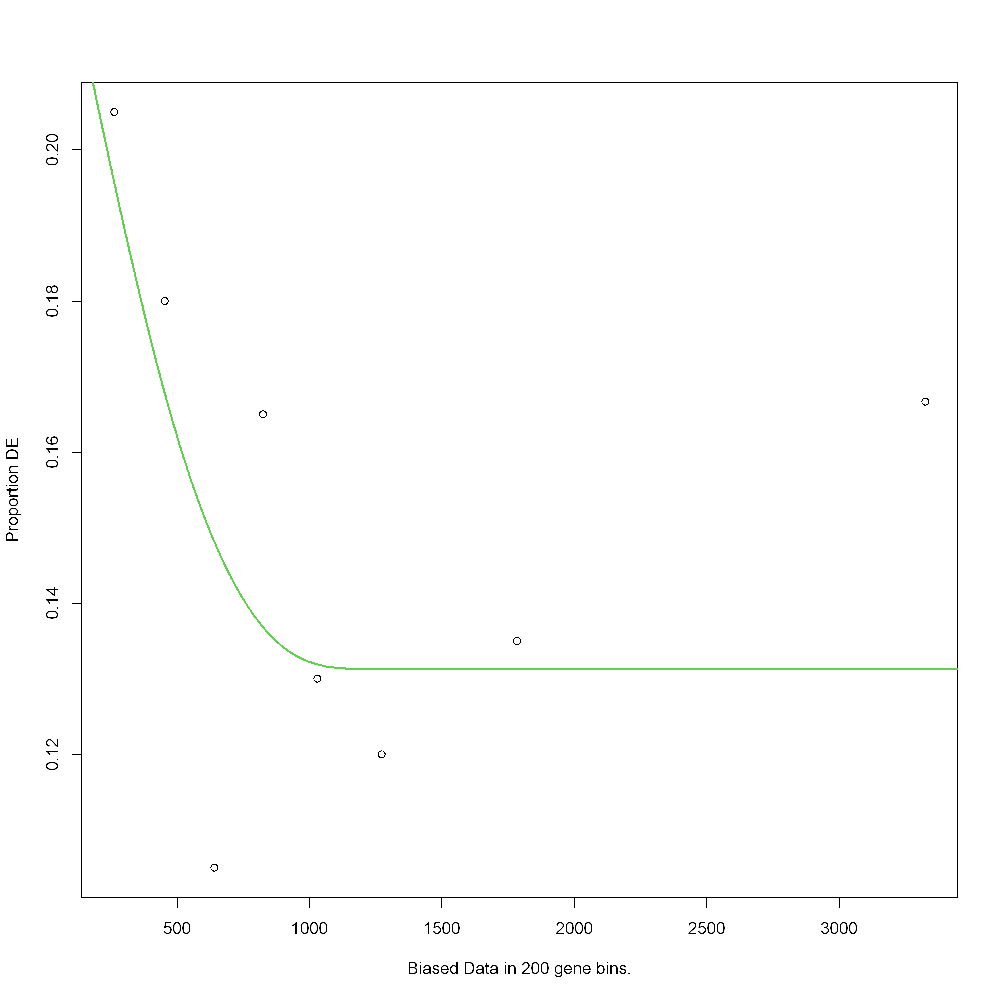

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


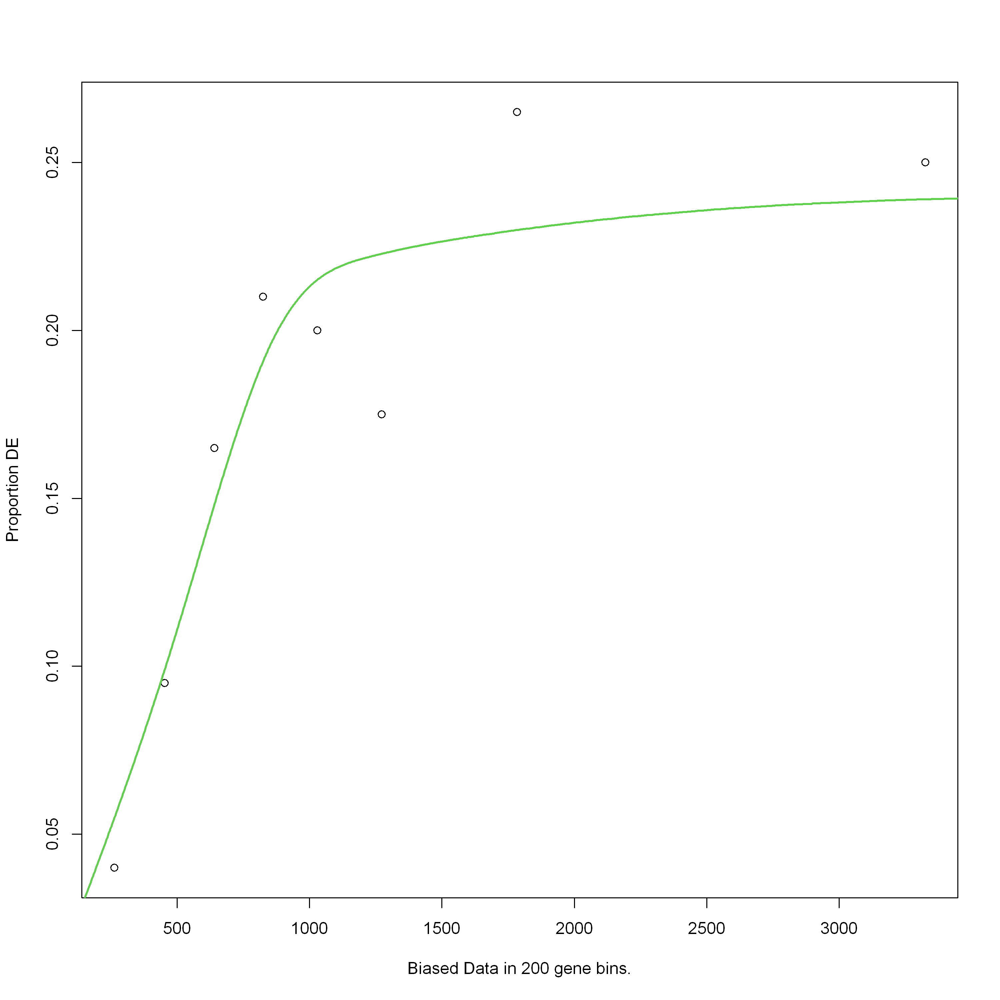

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


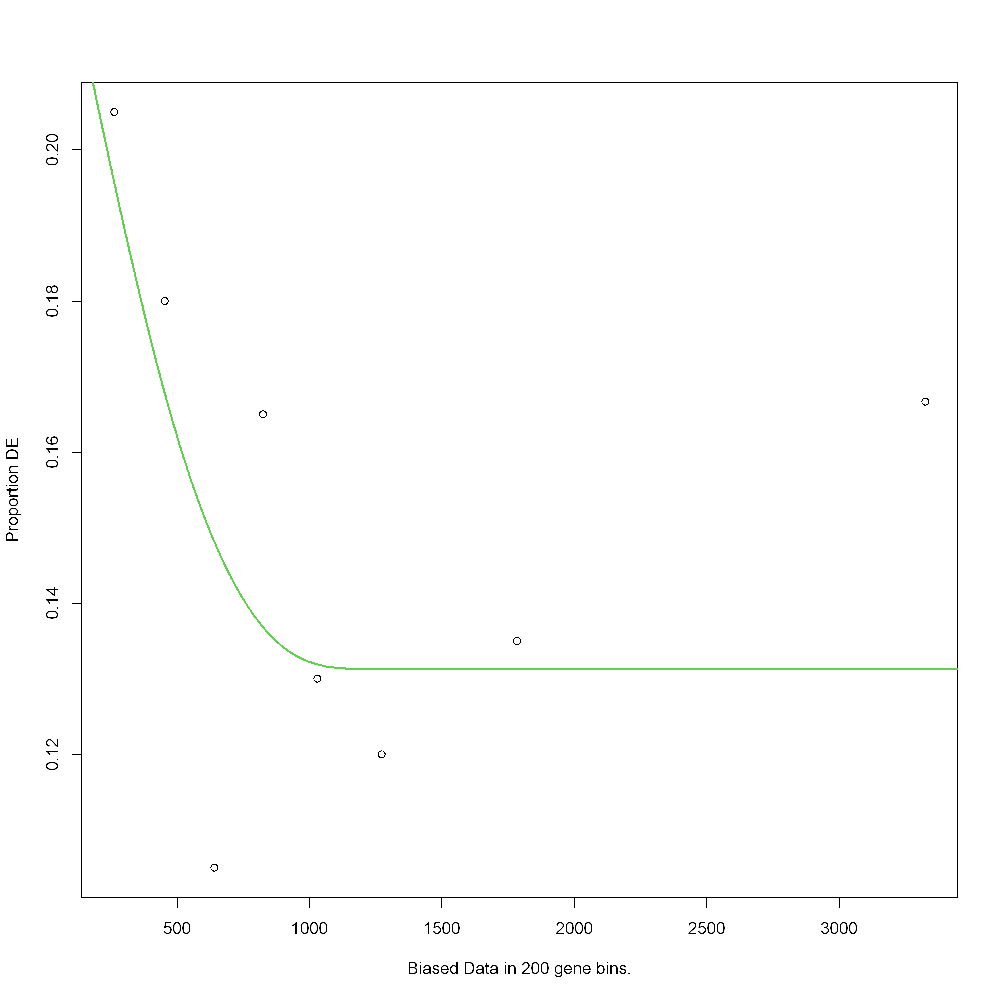

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


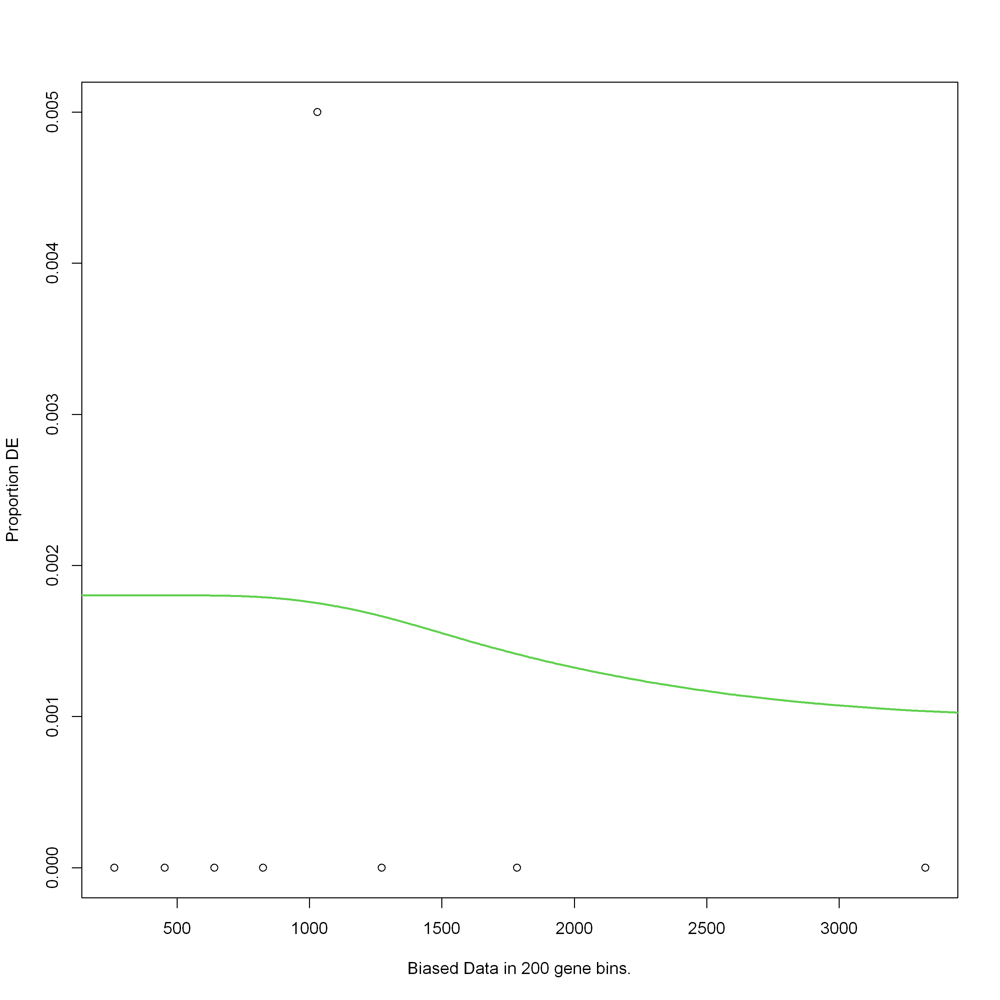

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


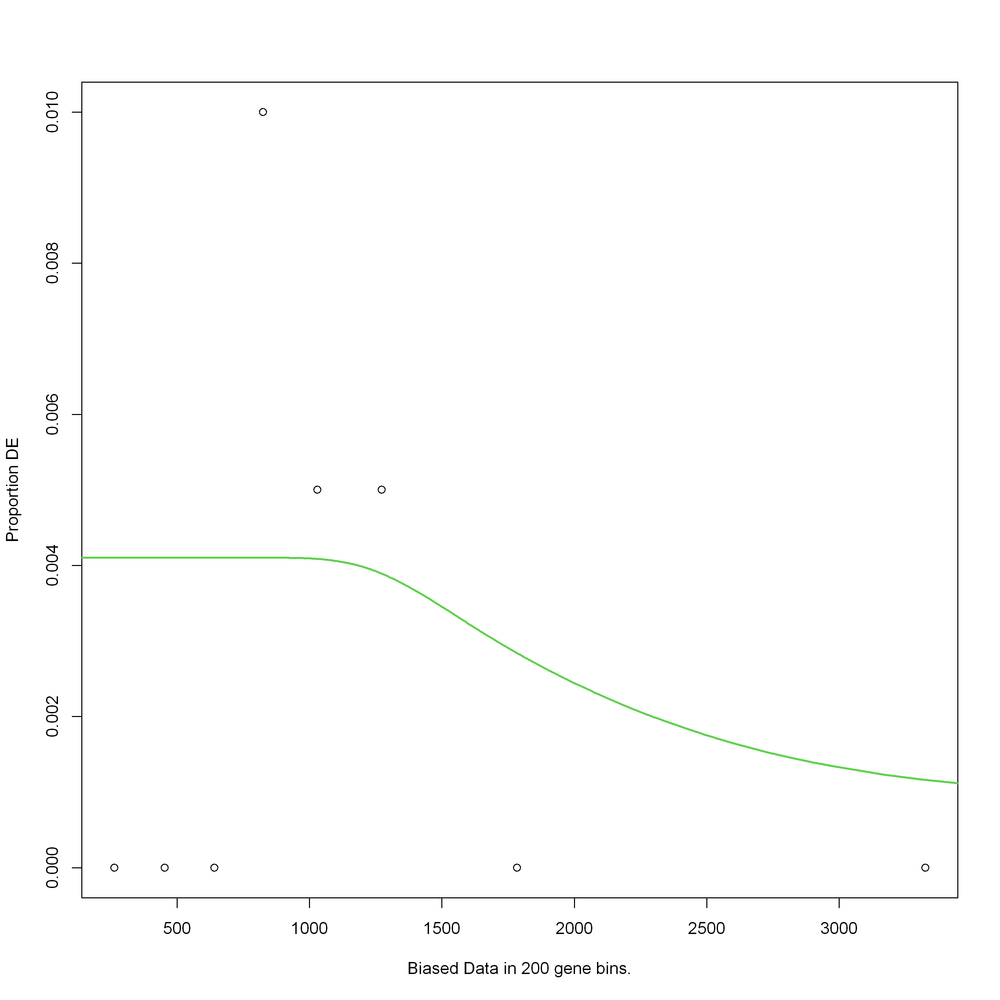

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


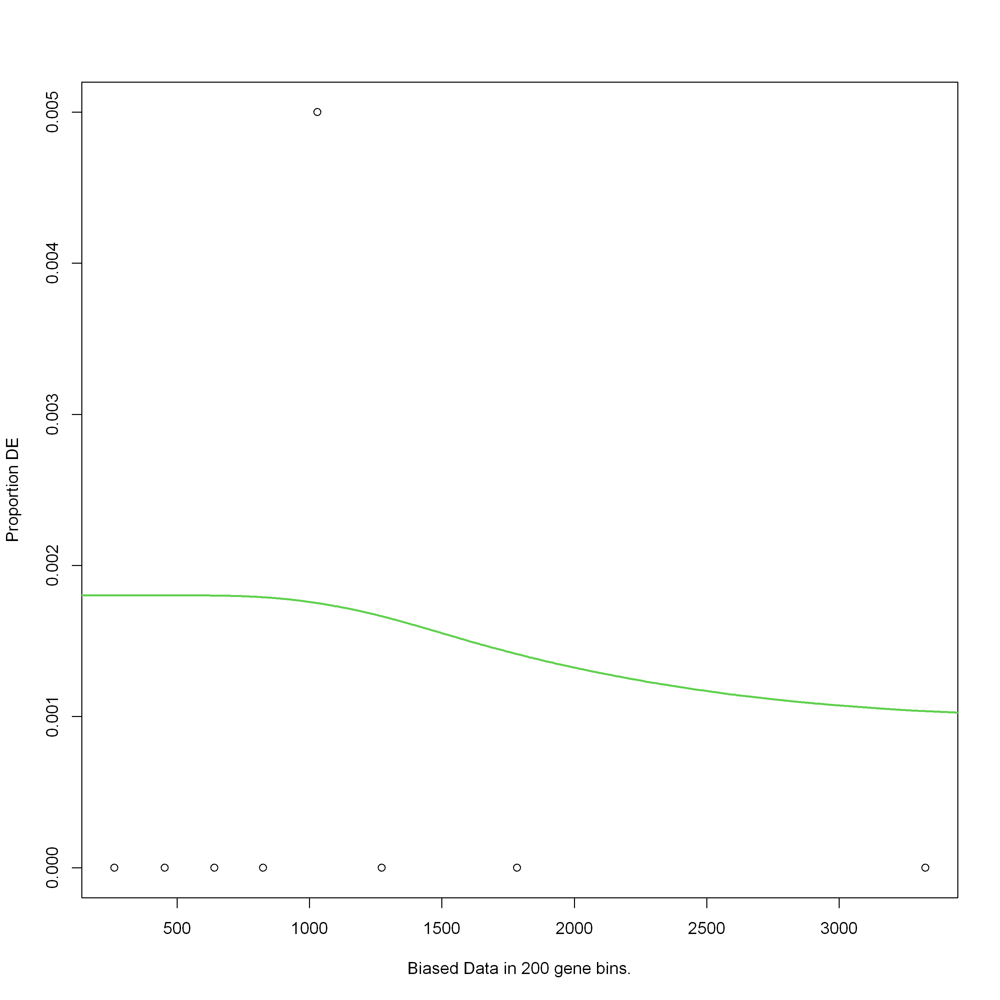

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


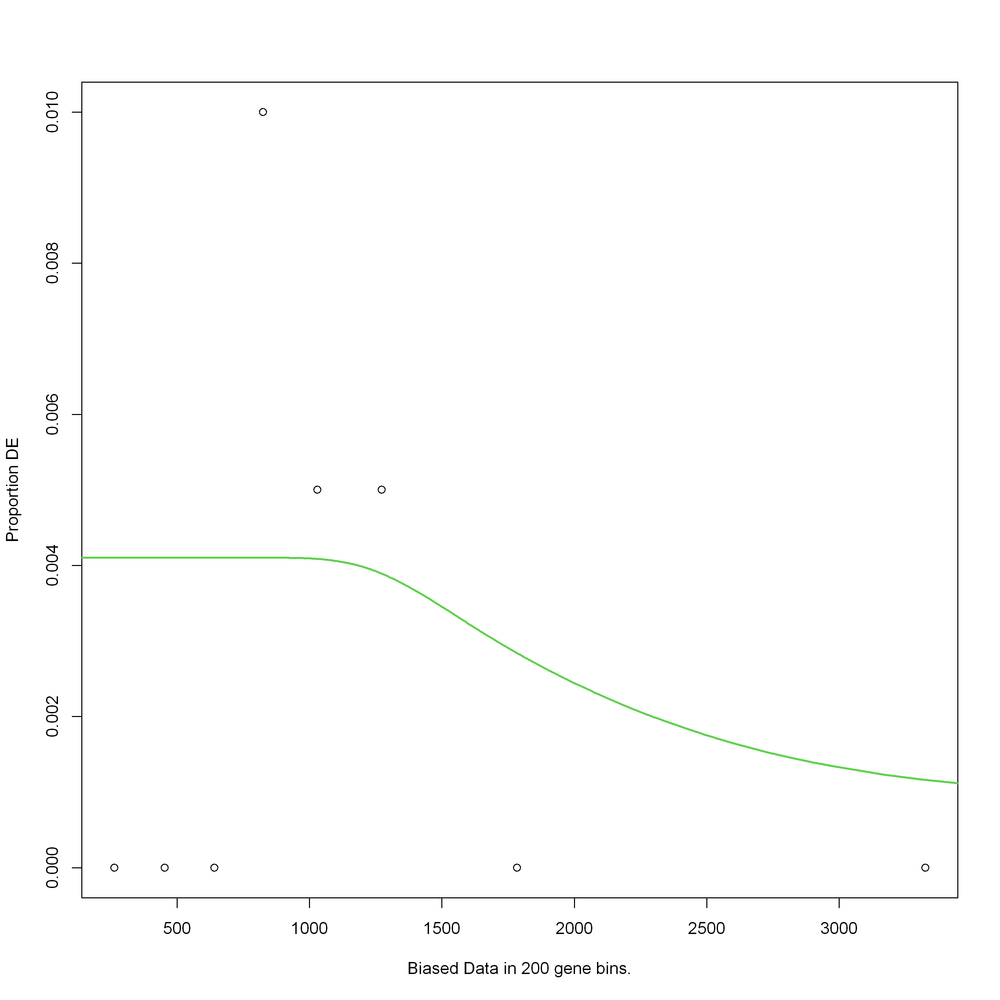

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


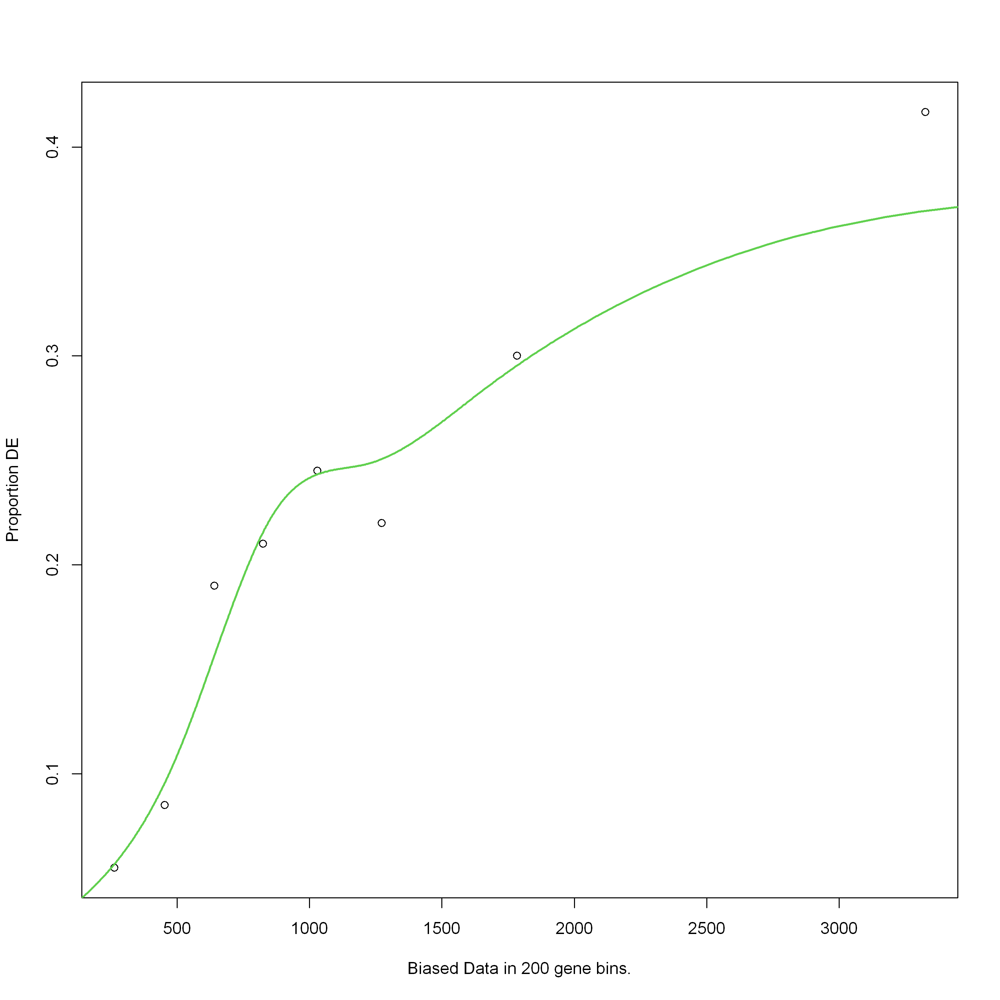

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


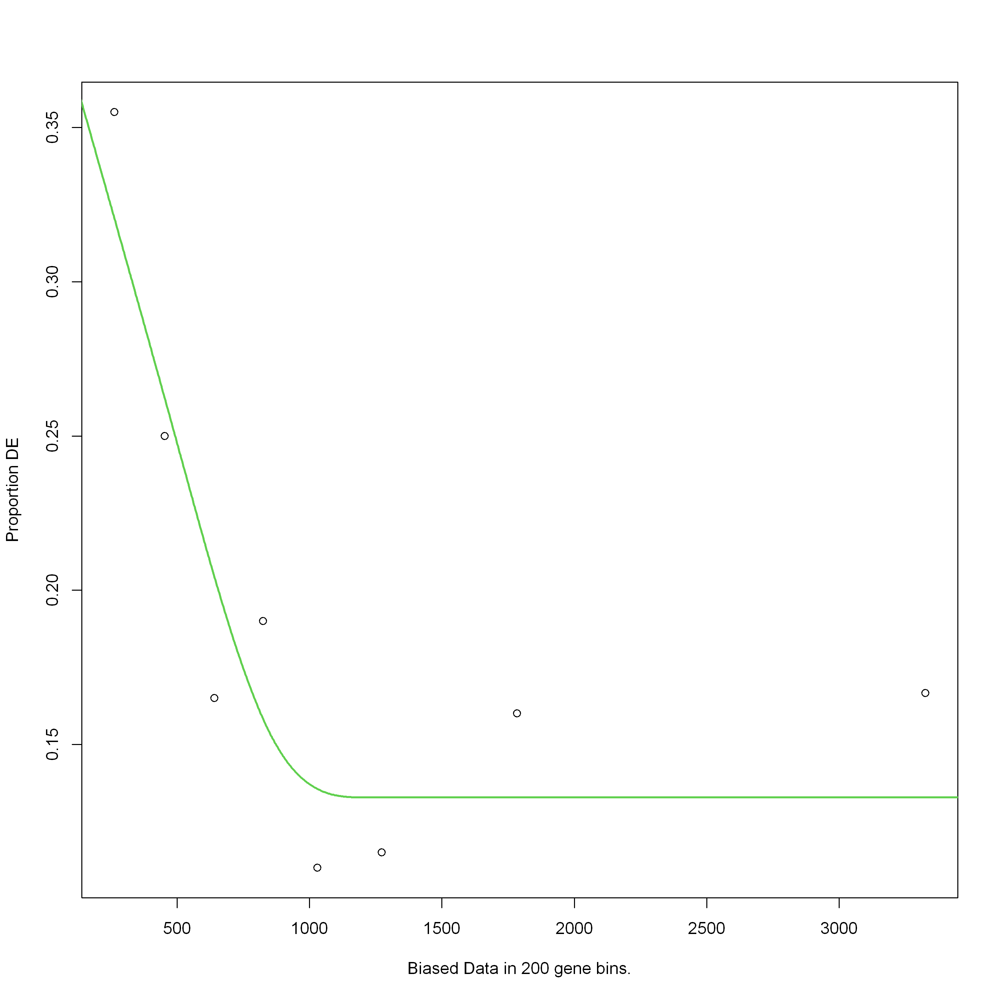

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


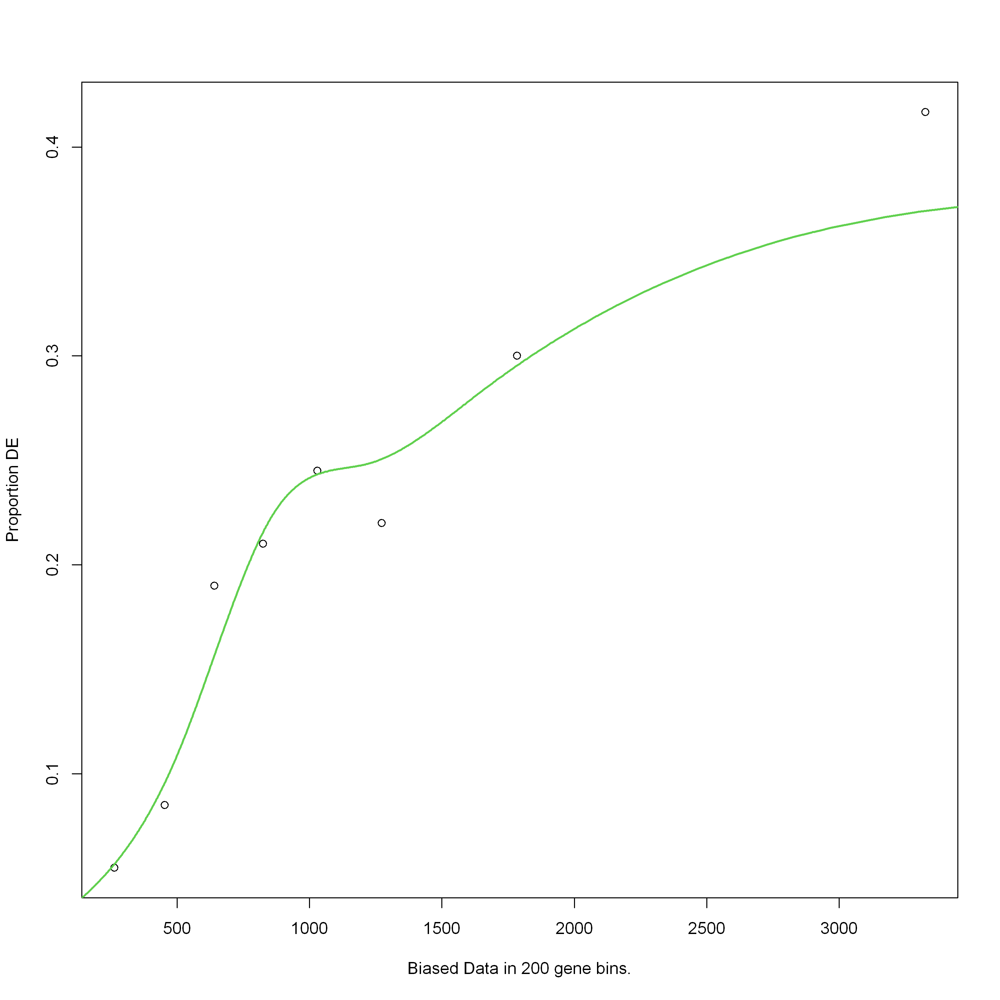

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


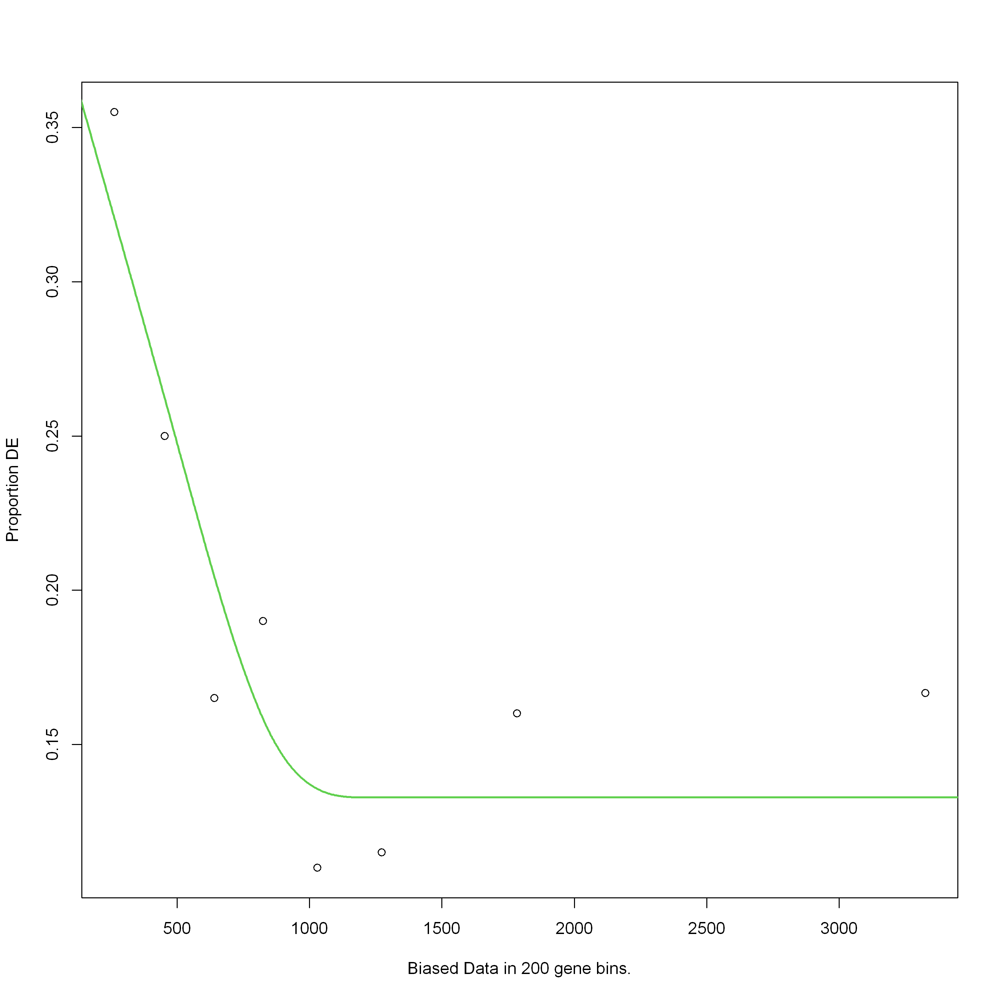

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


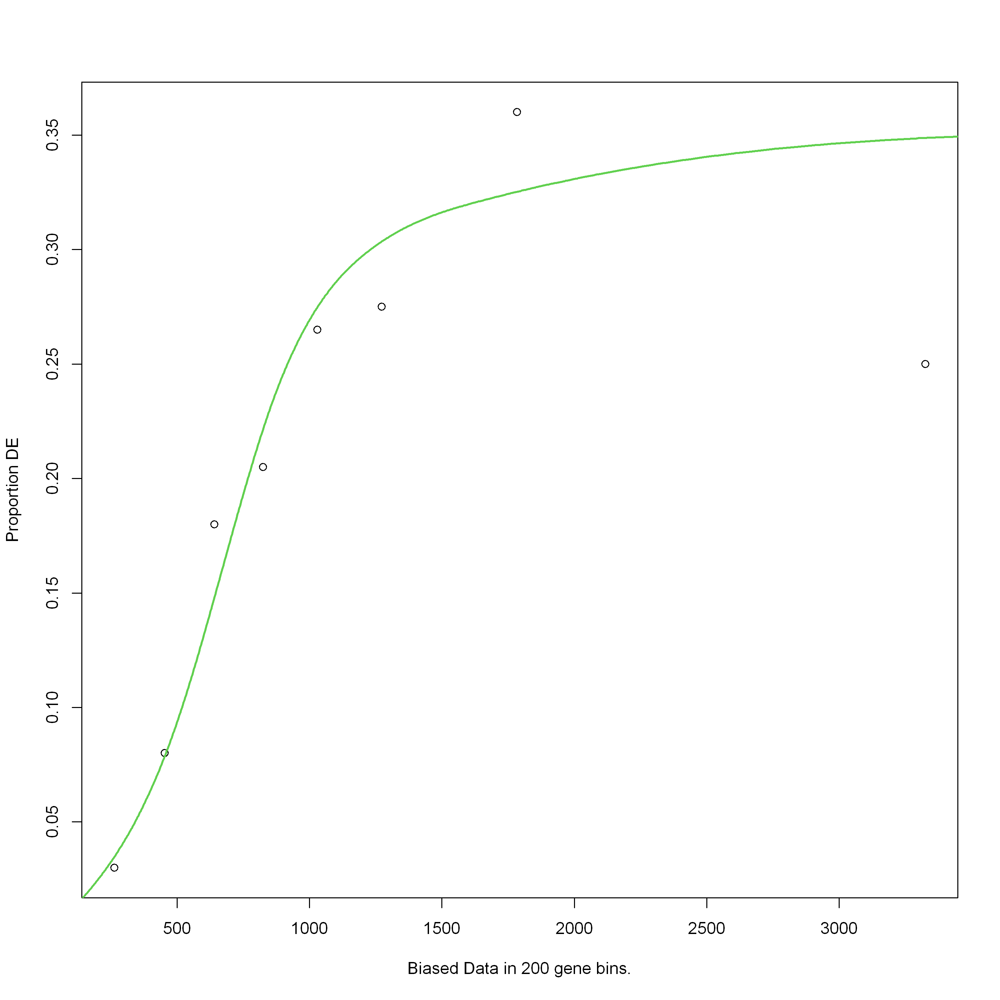

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


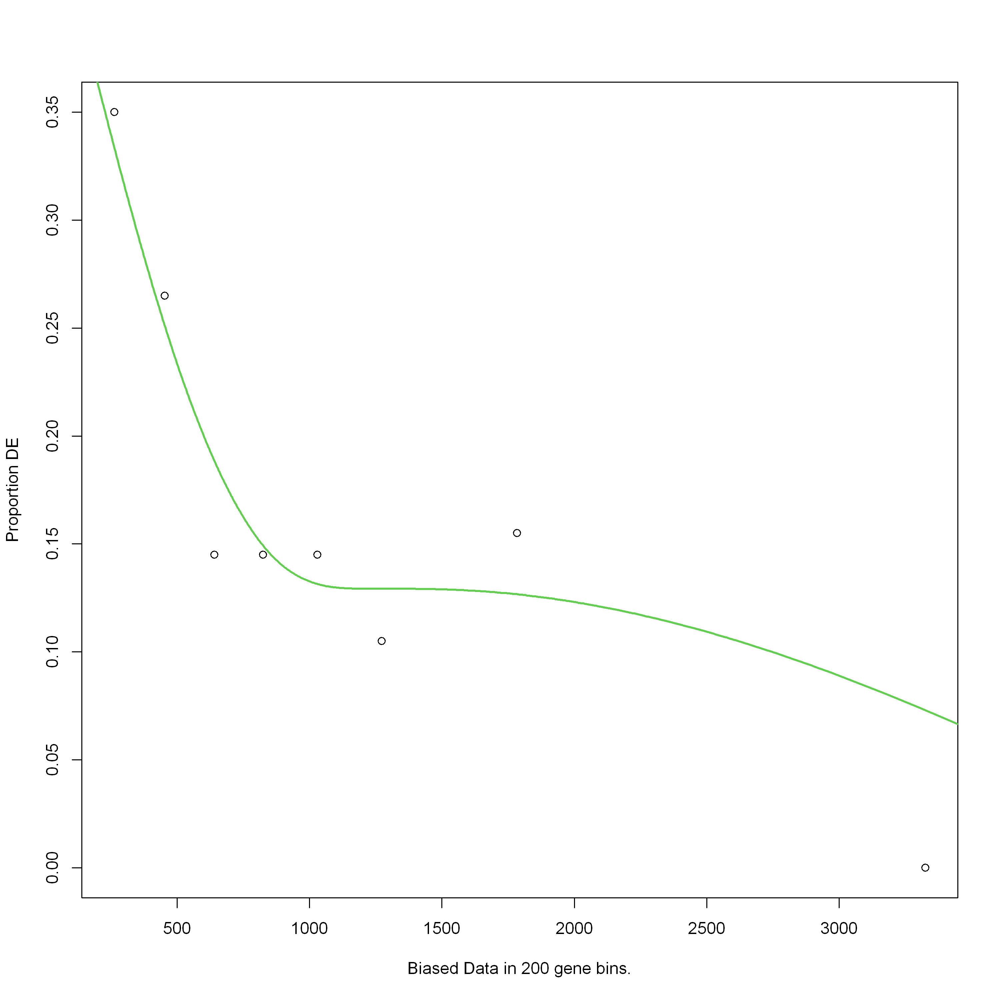

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


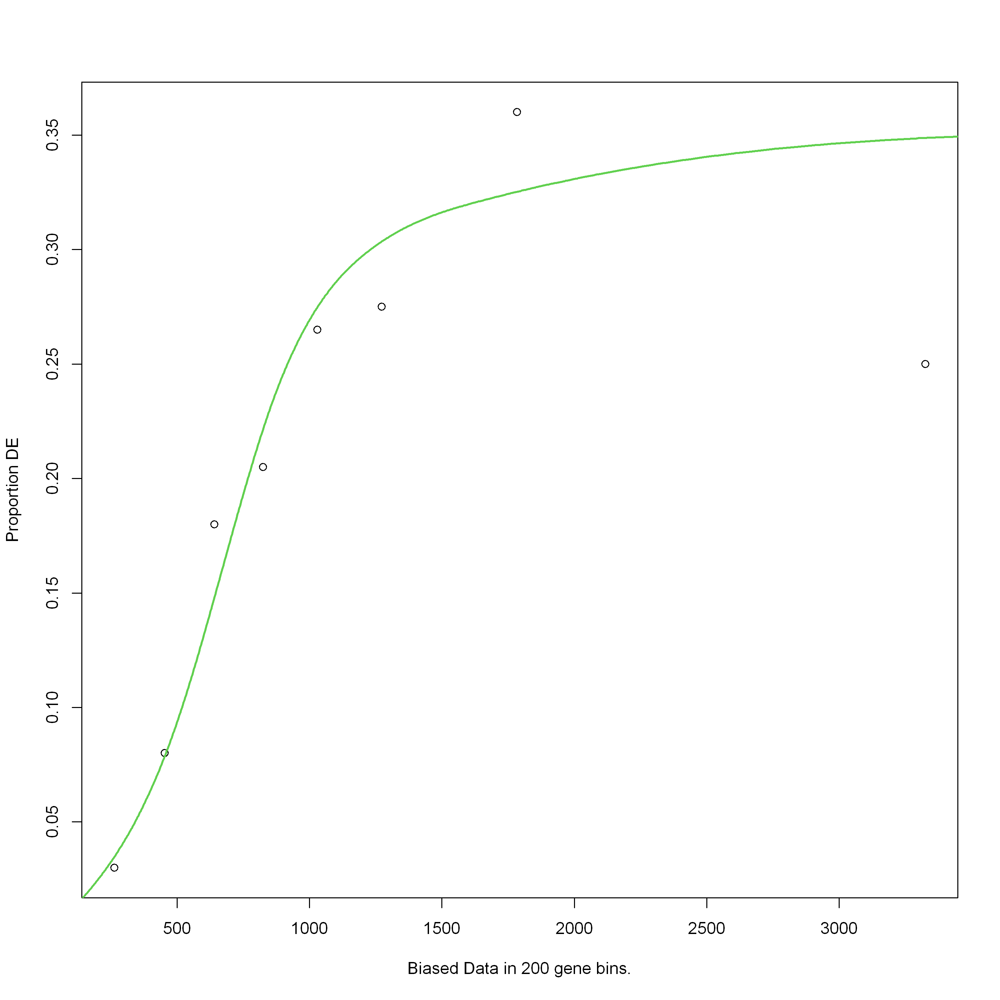

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


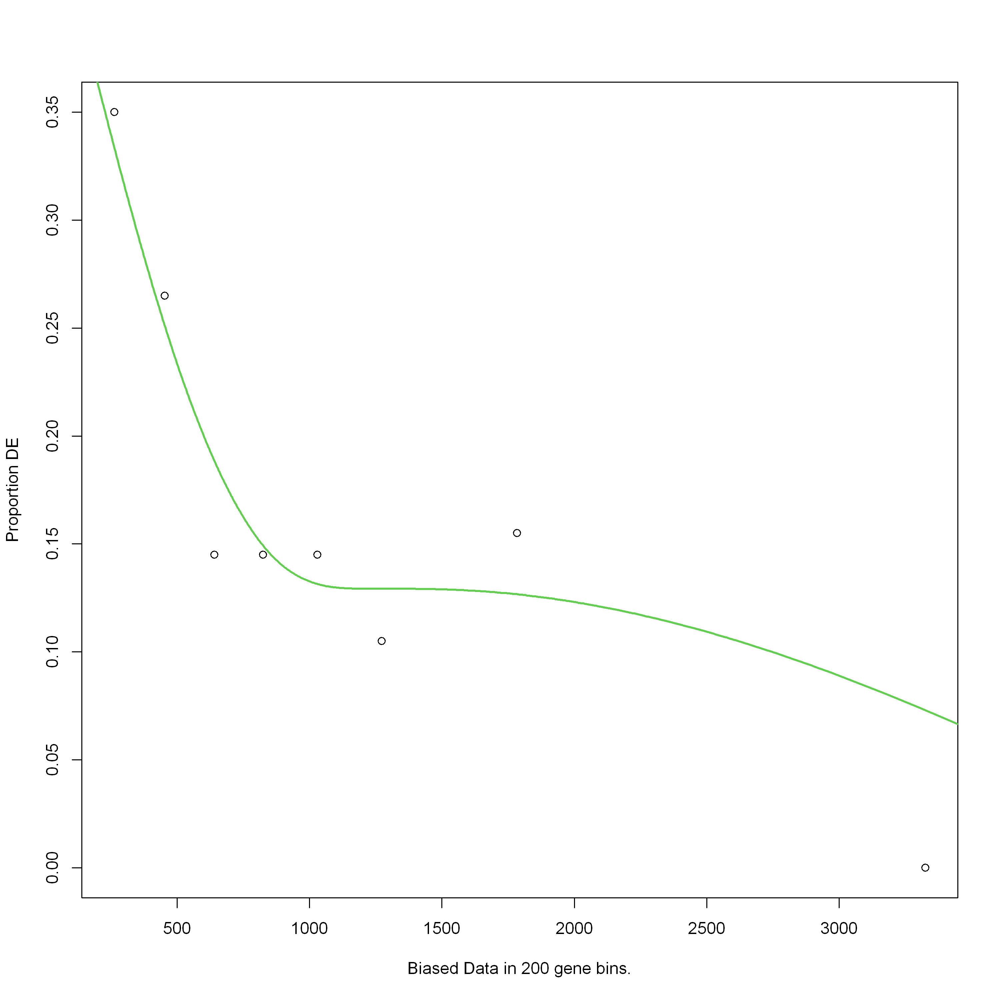

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


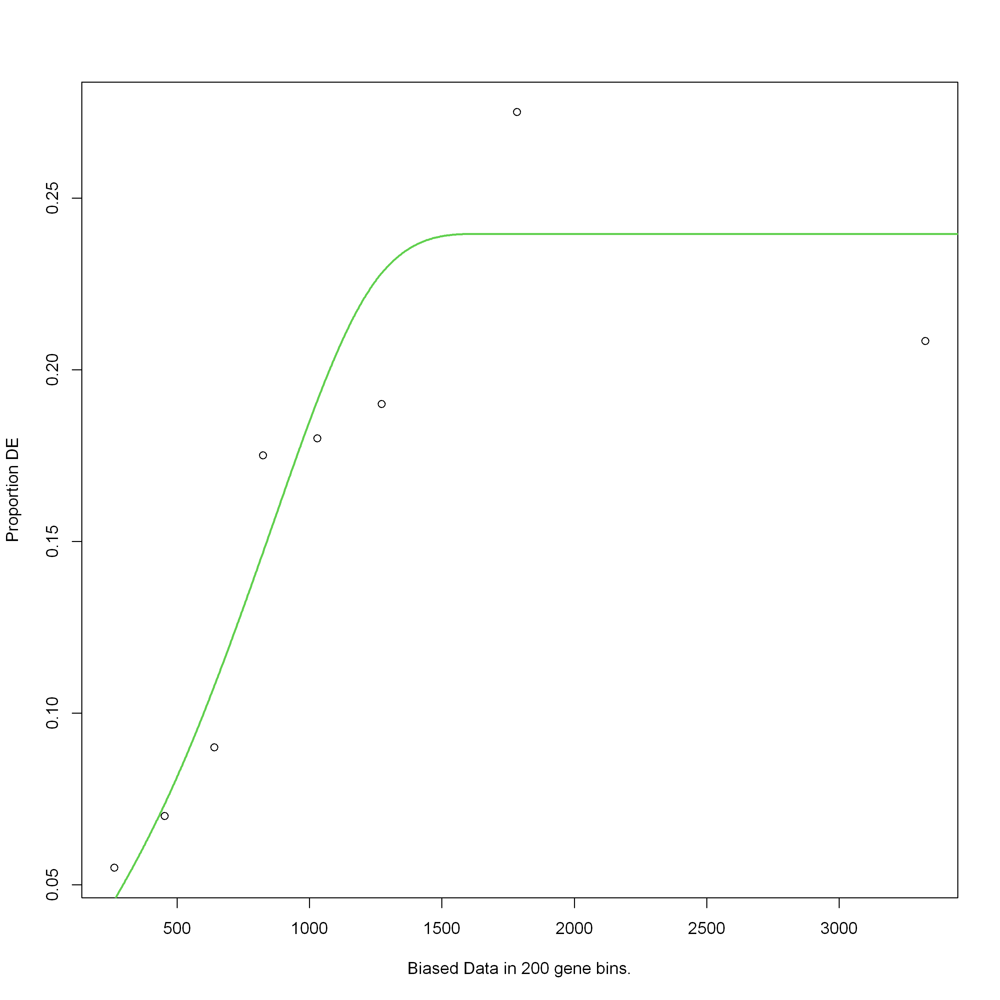

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


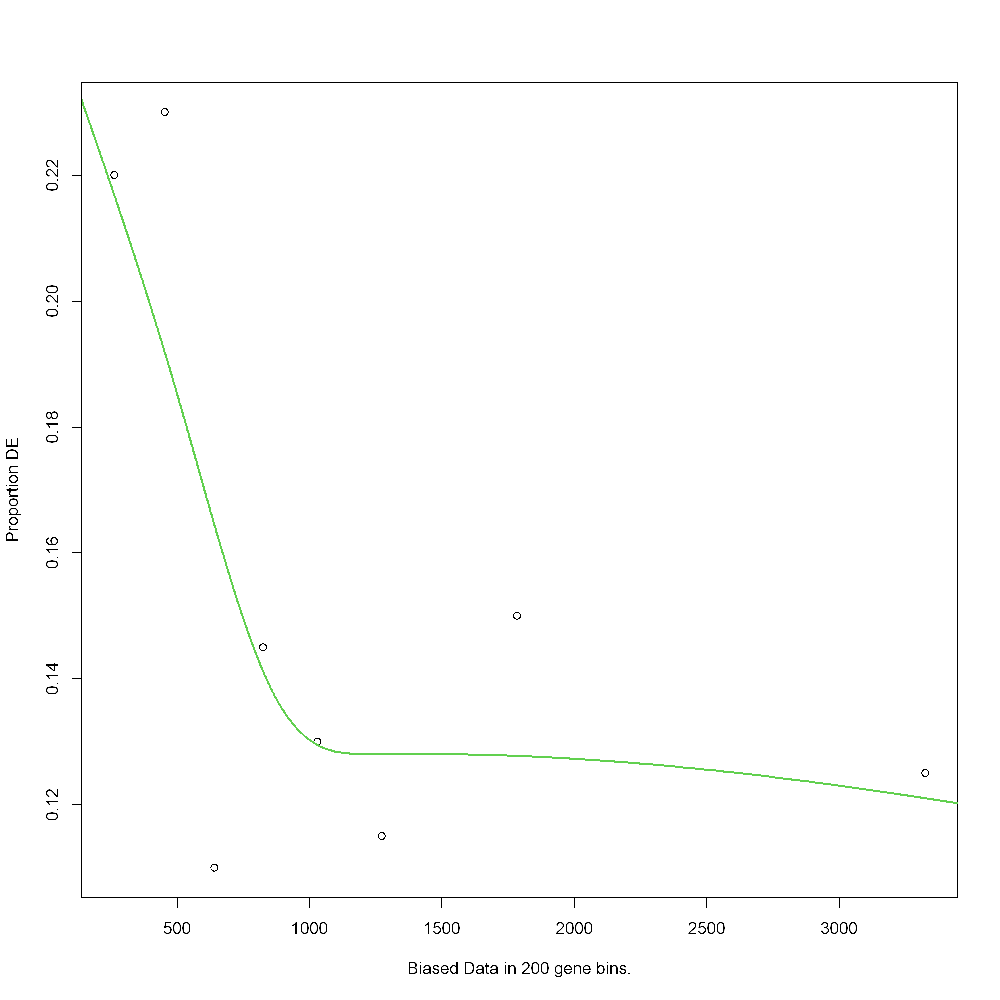

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


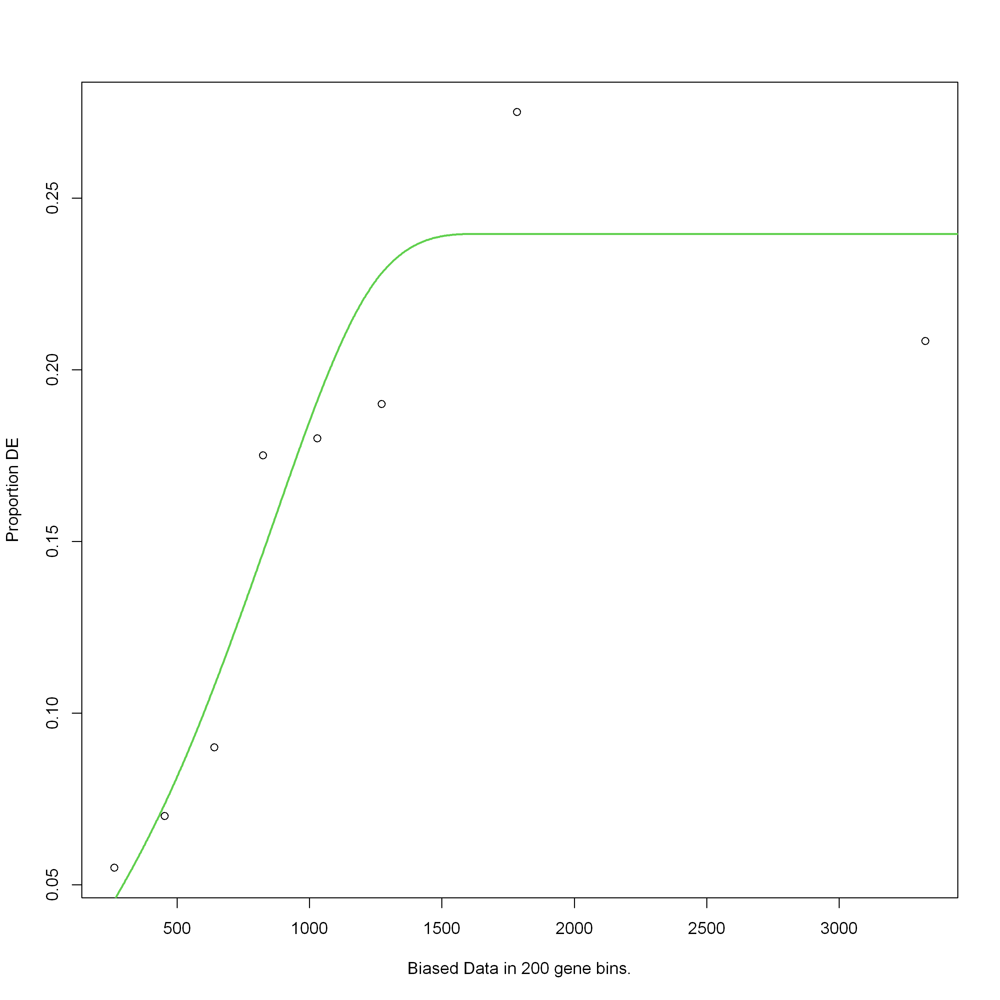

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


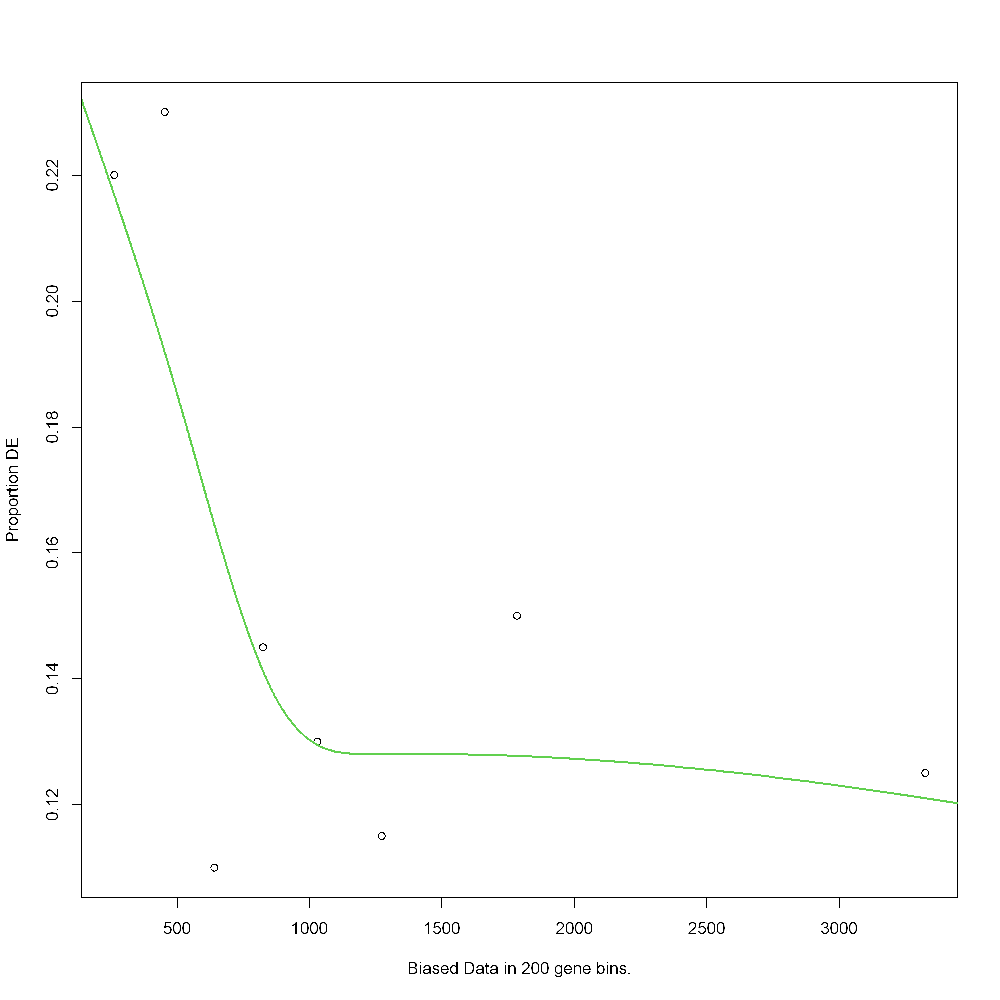

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


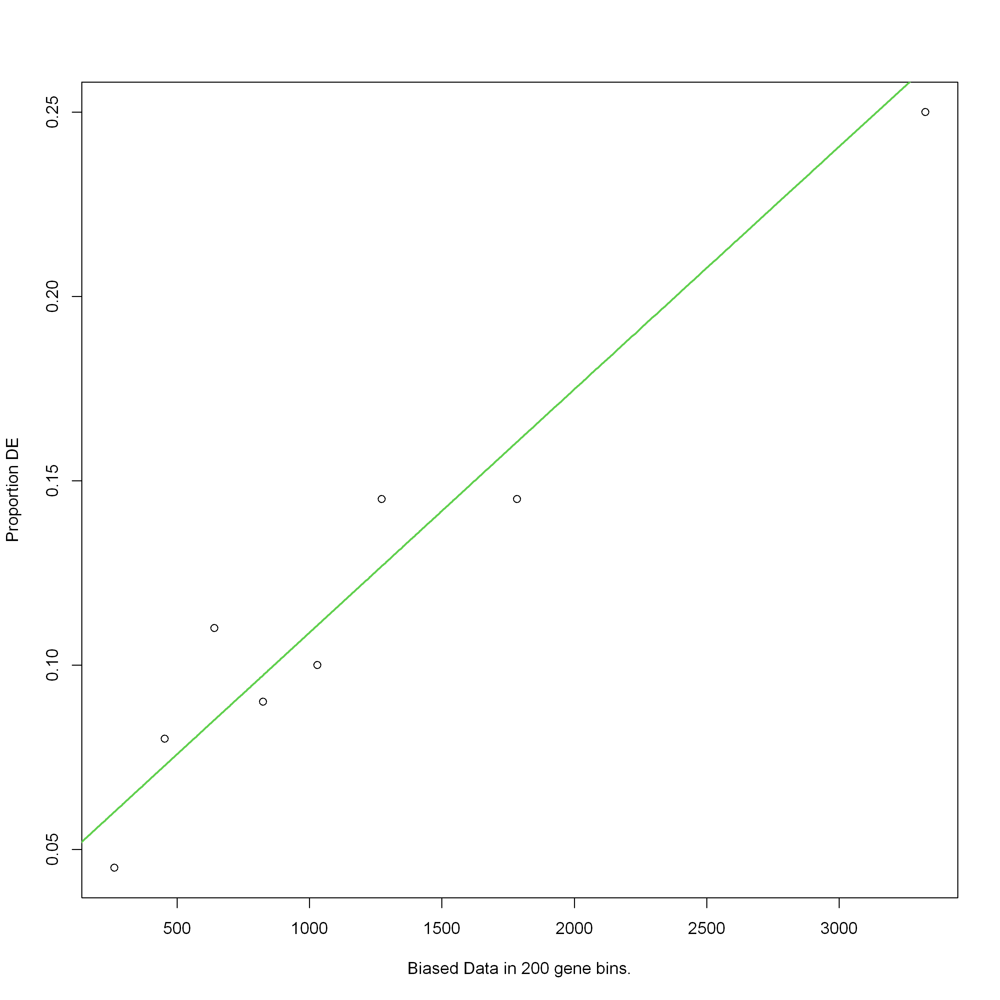

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


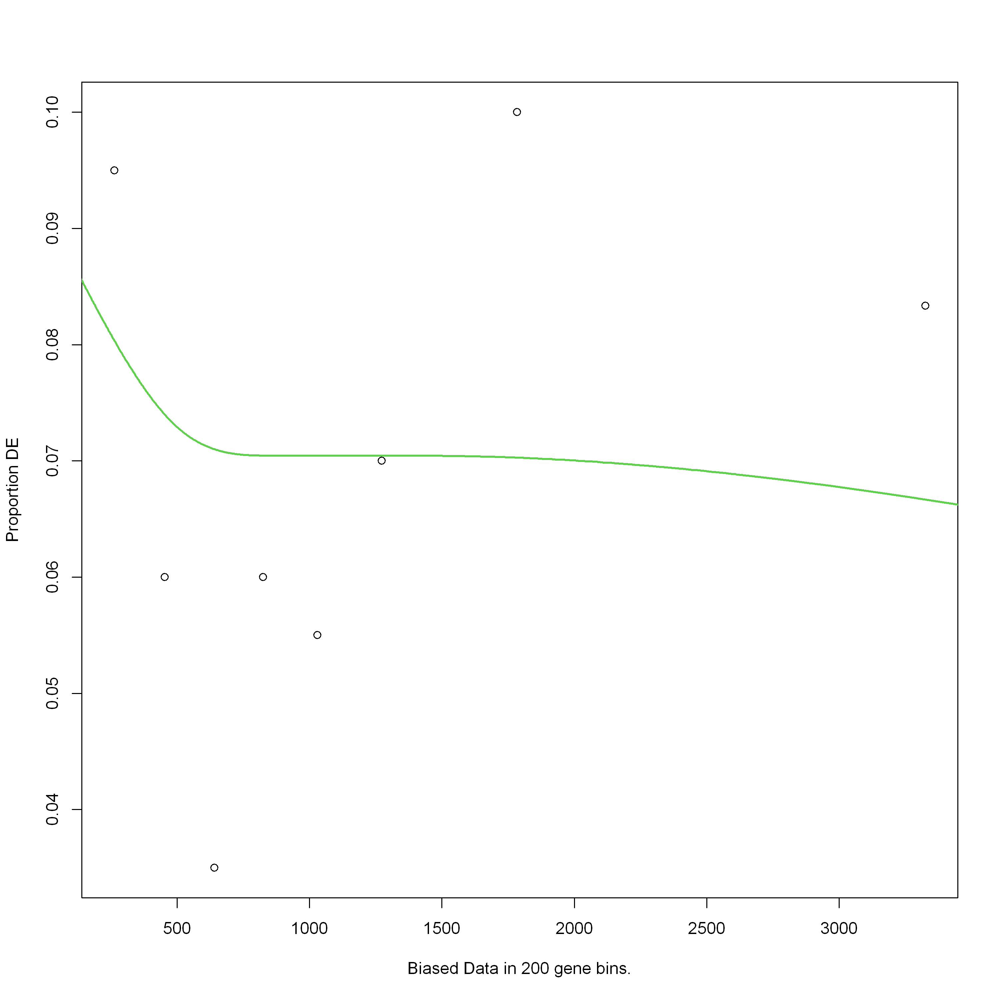

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


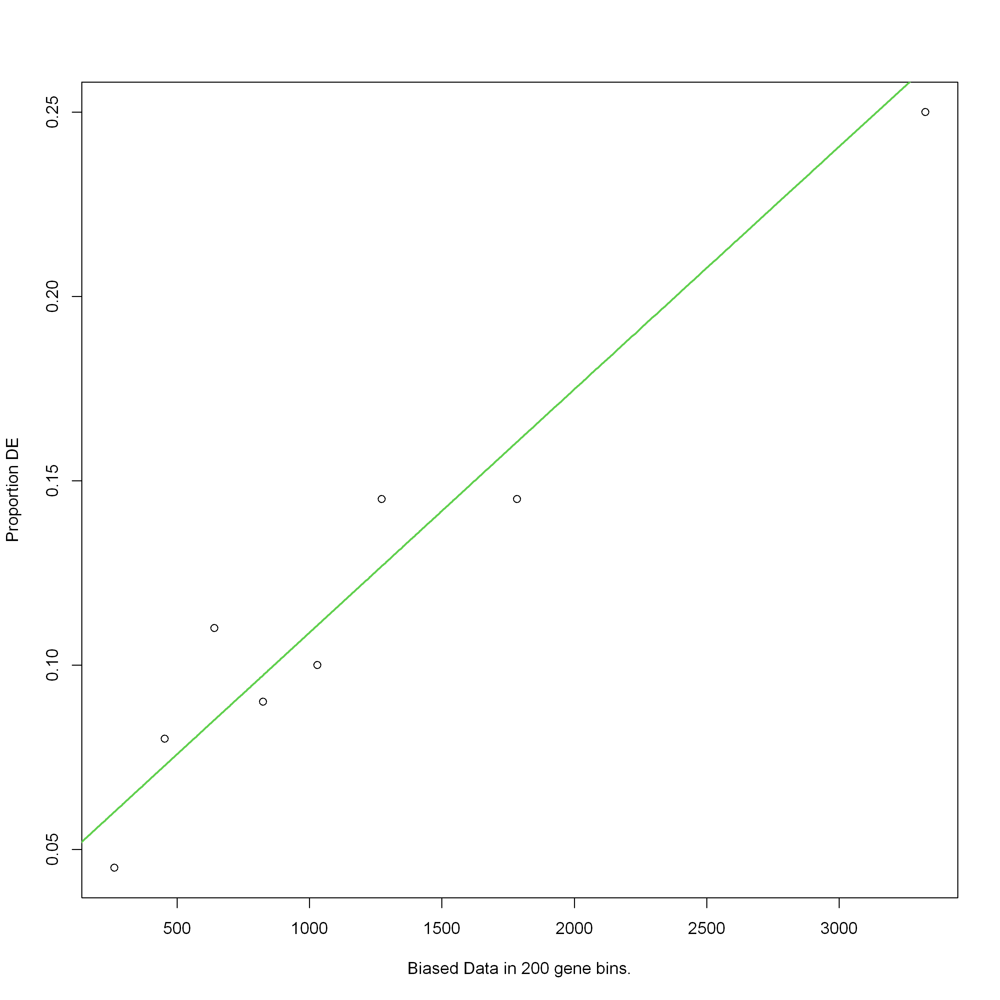

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


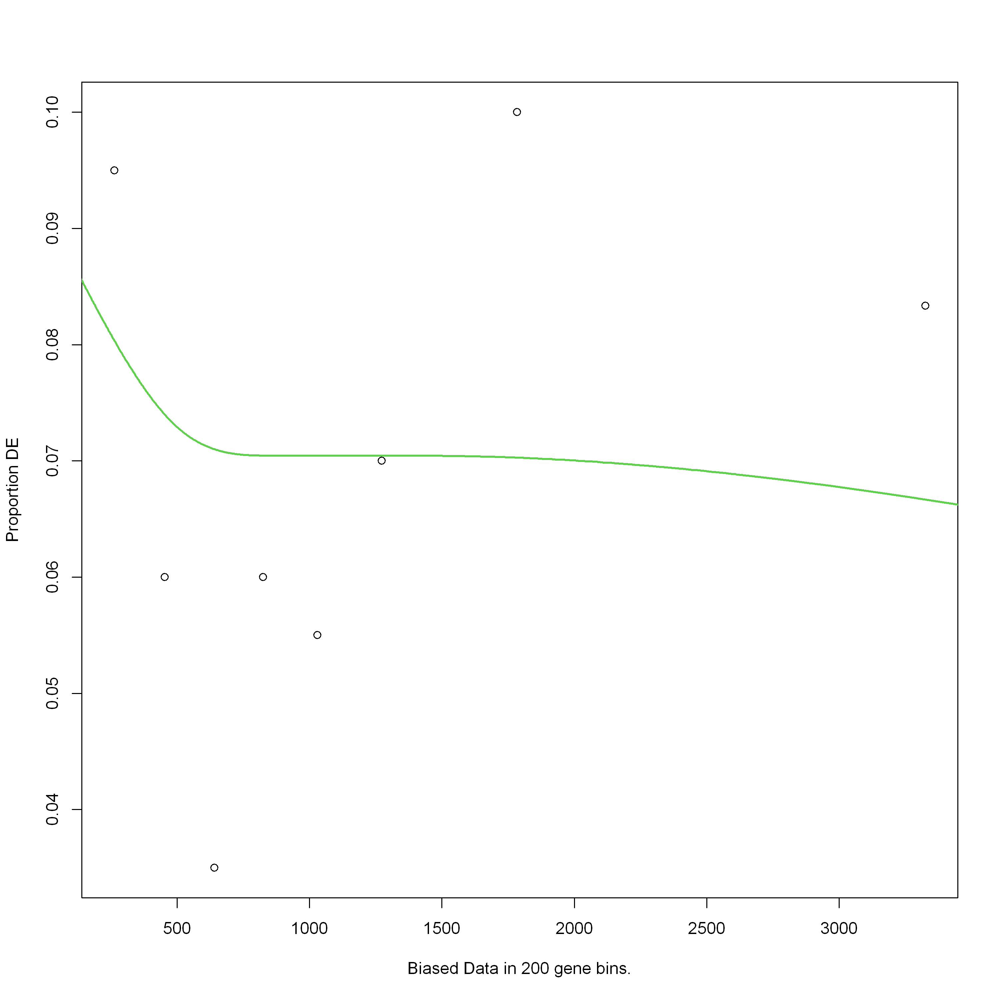

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


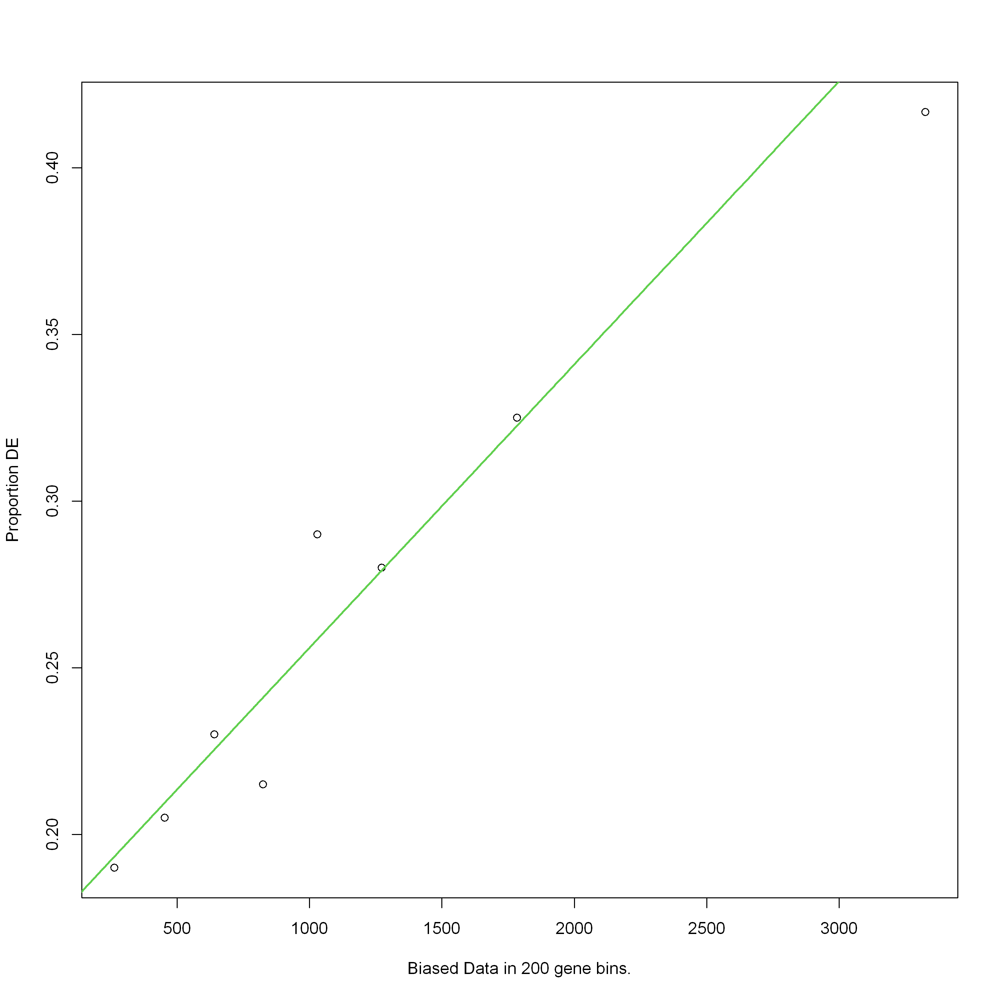

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


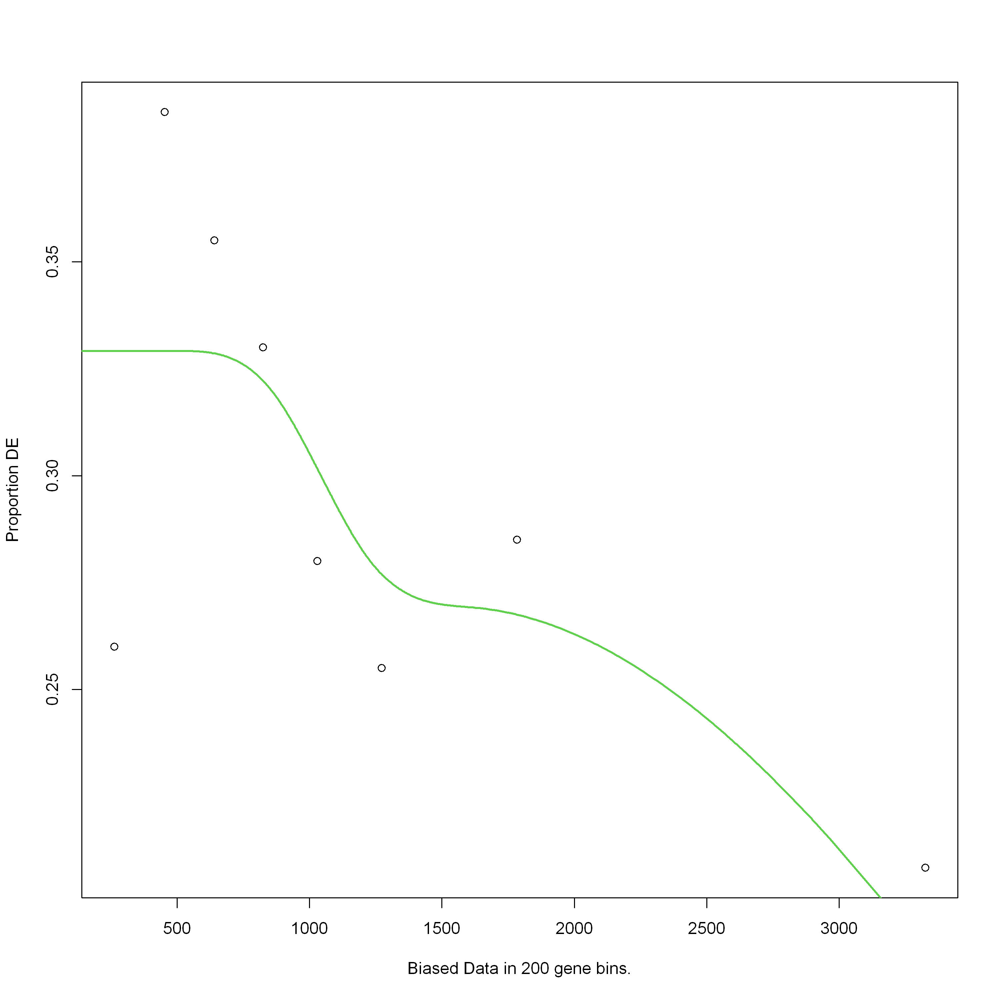

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


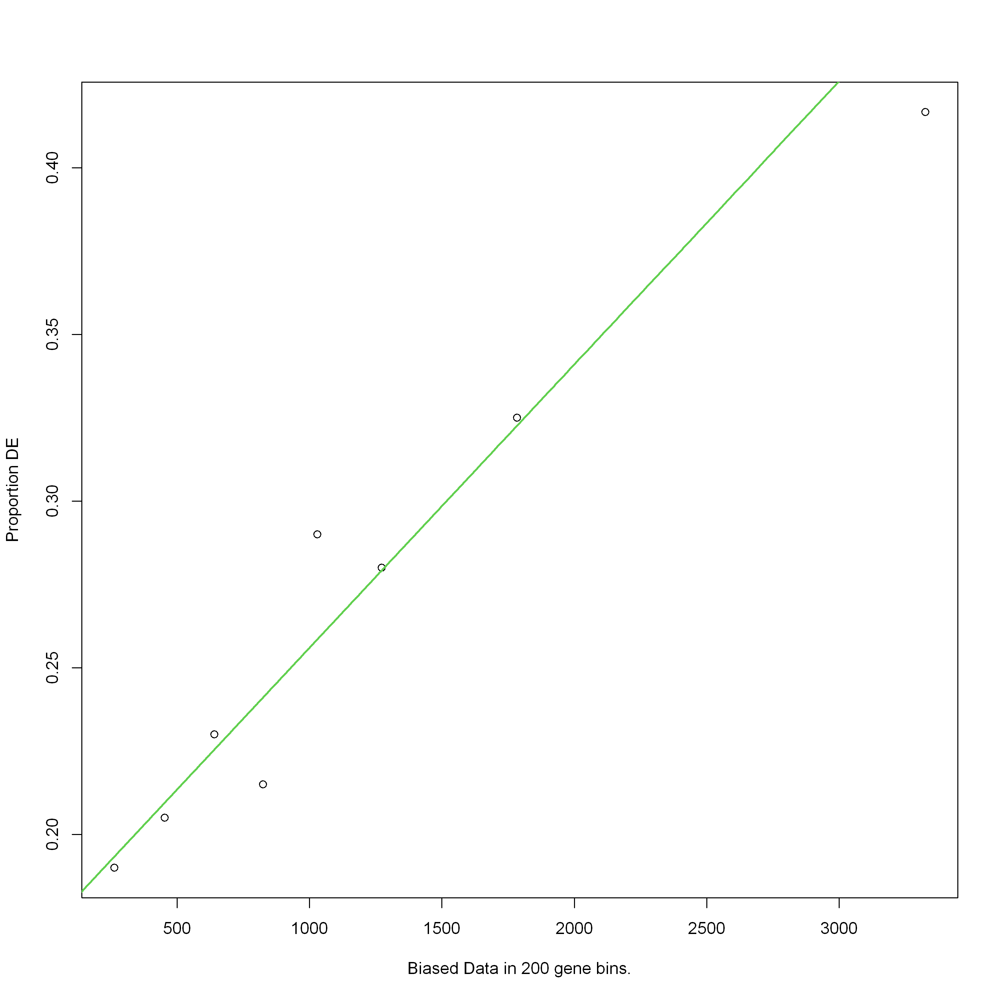

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


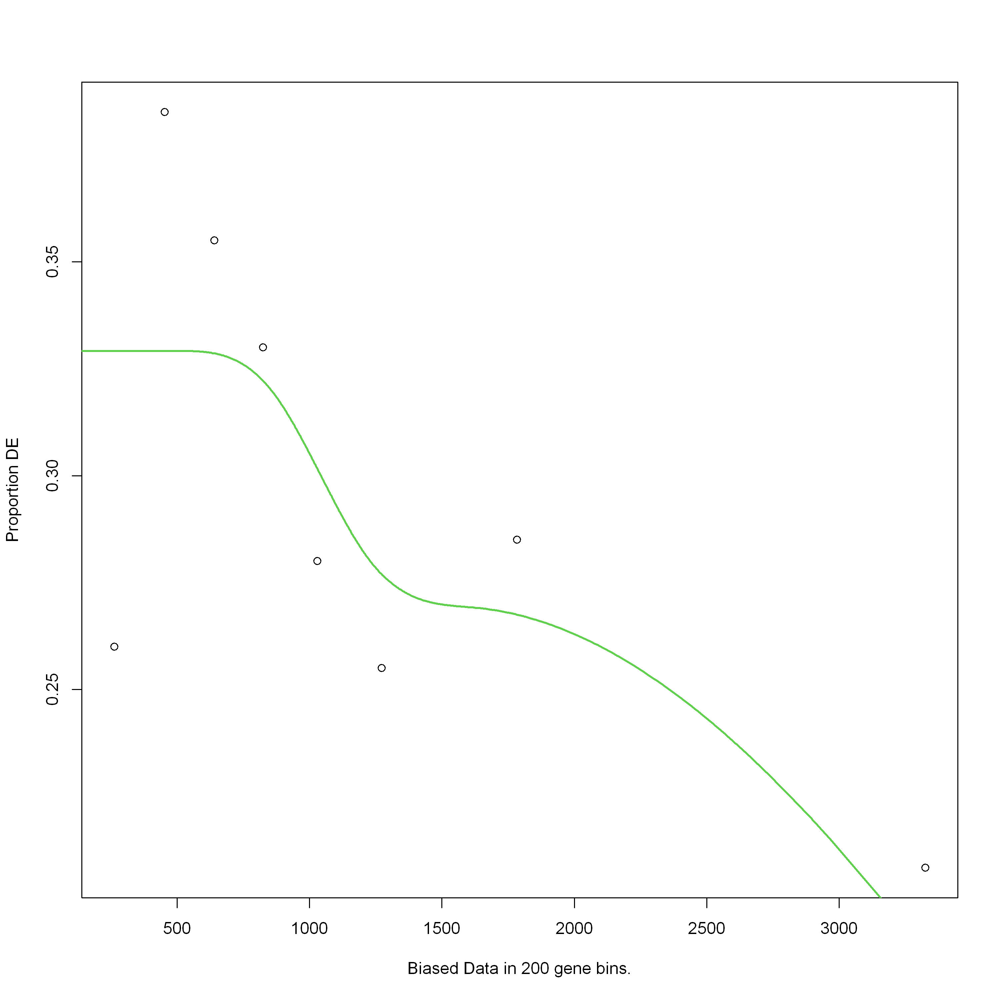

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


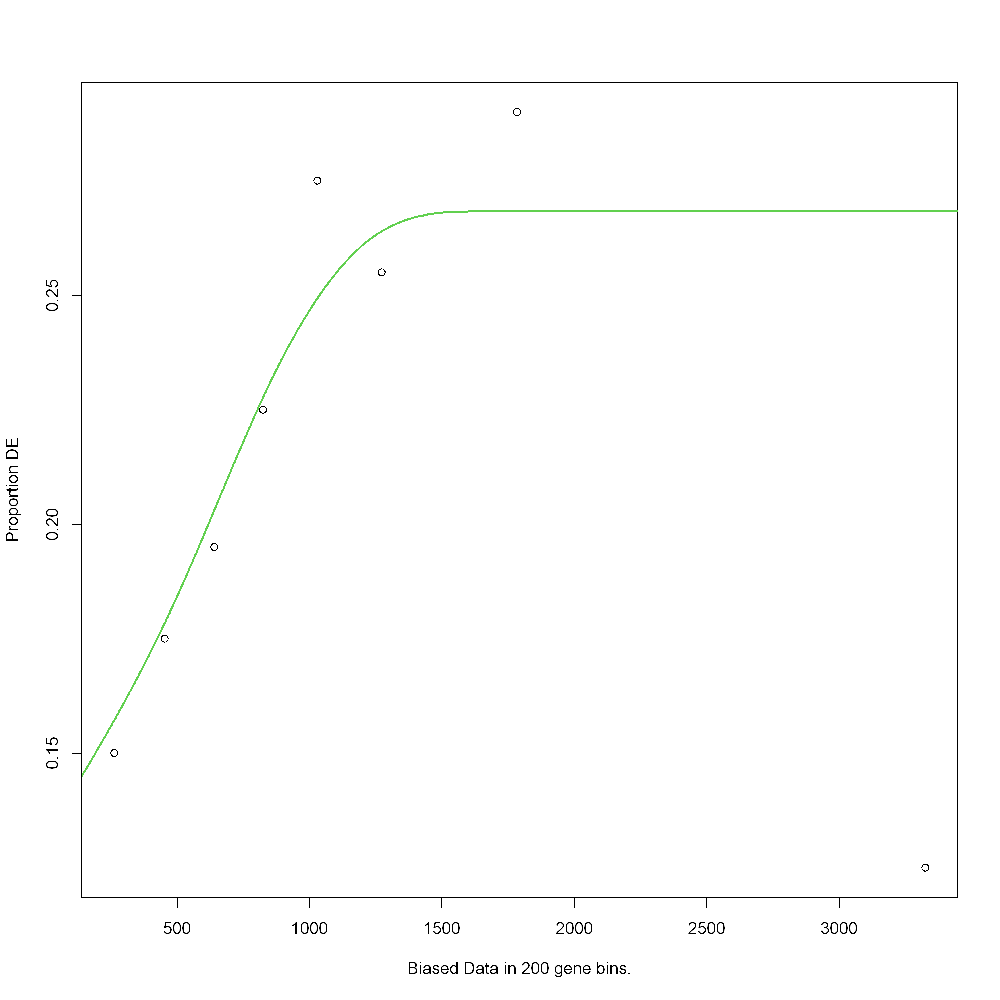

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


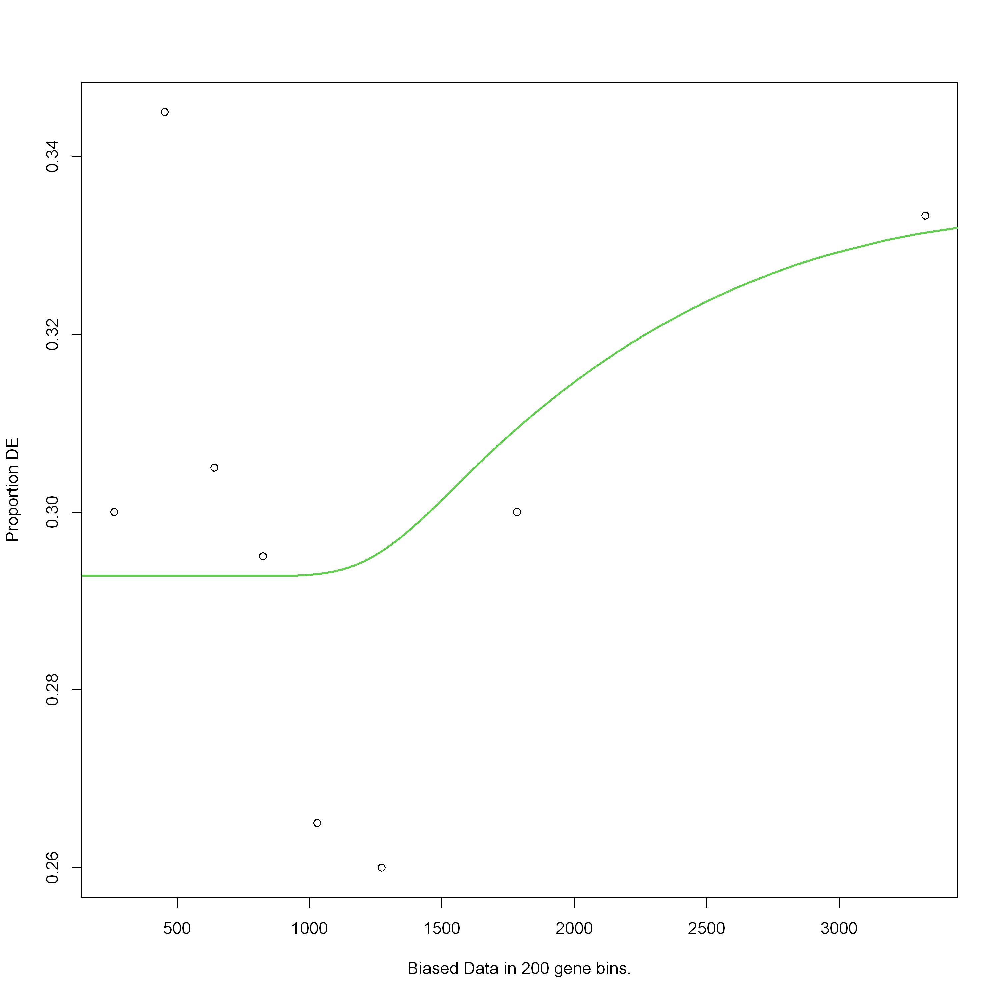

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


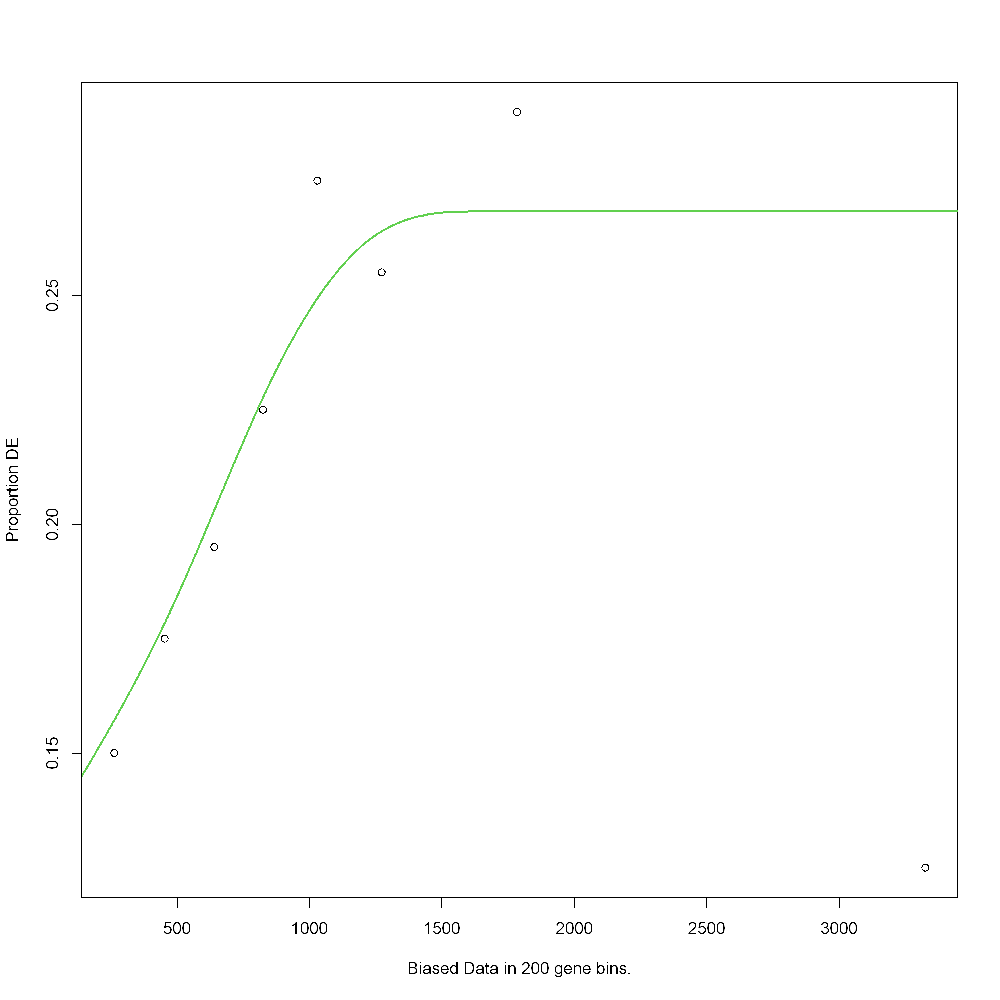

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


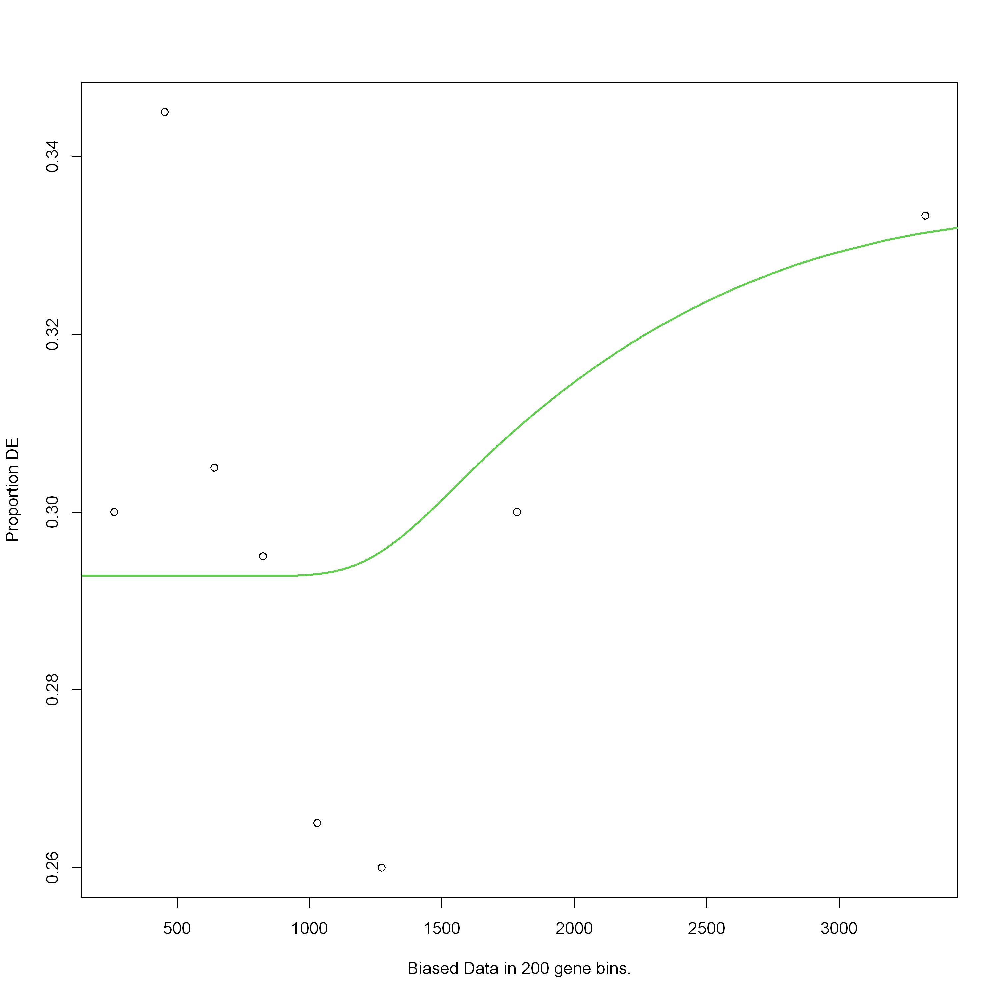

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


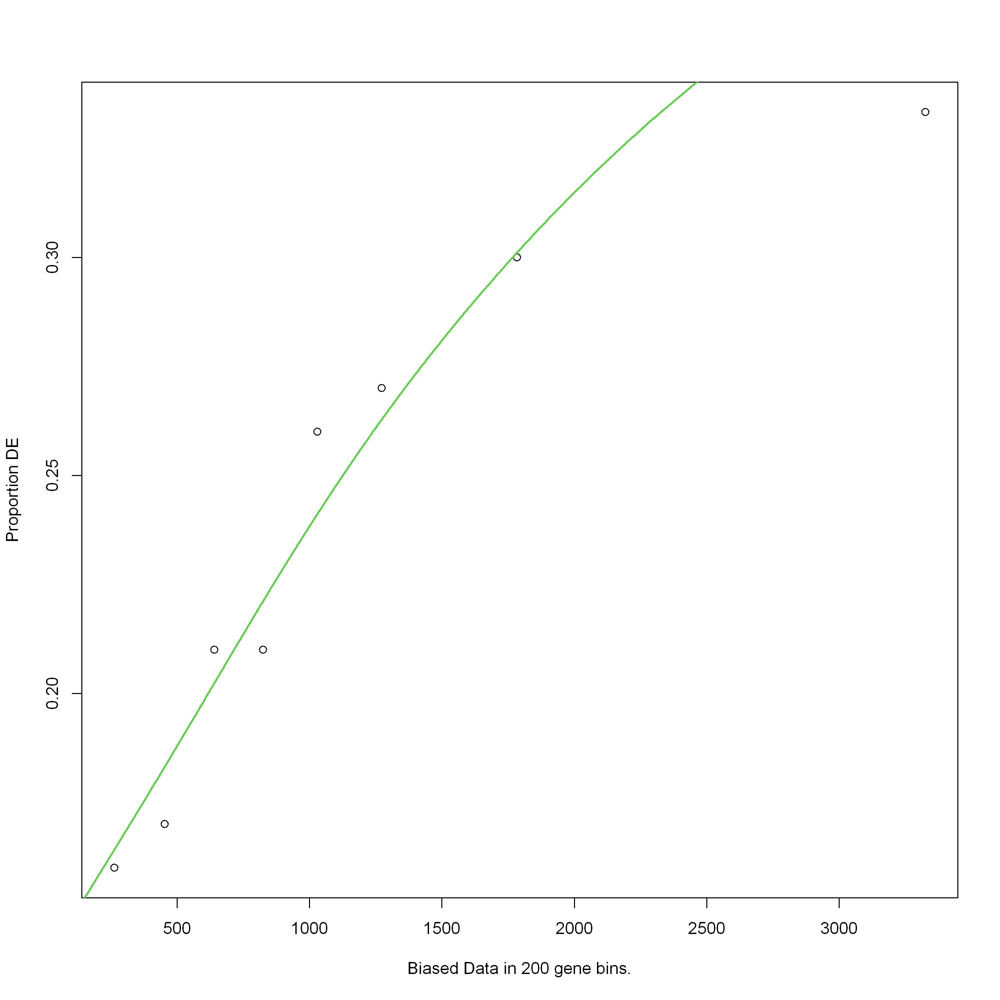

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`


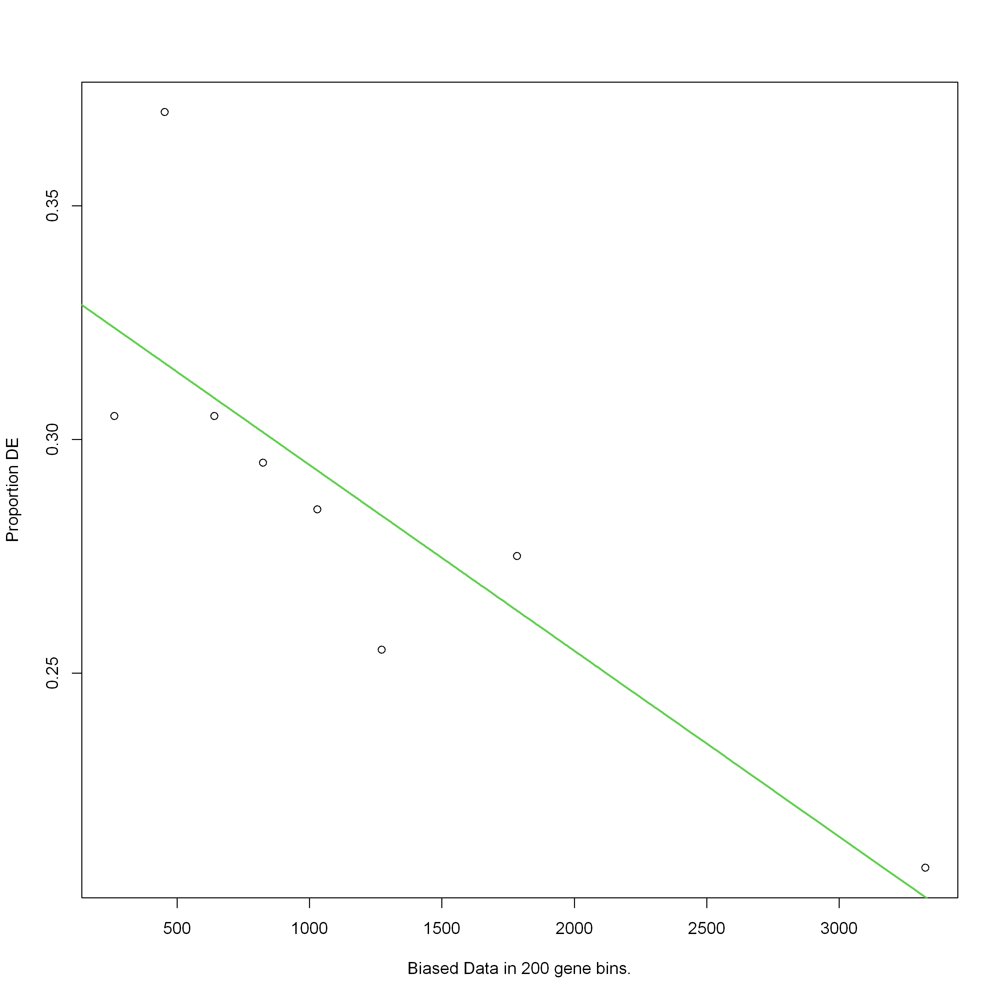

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


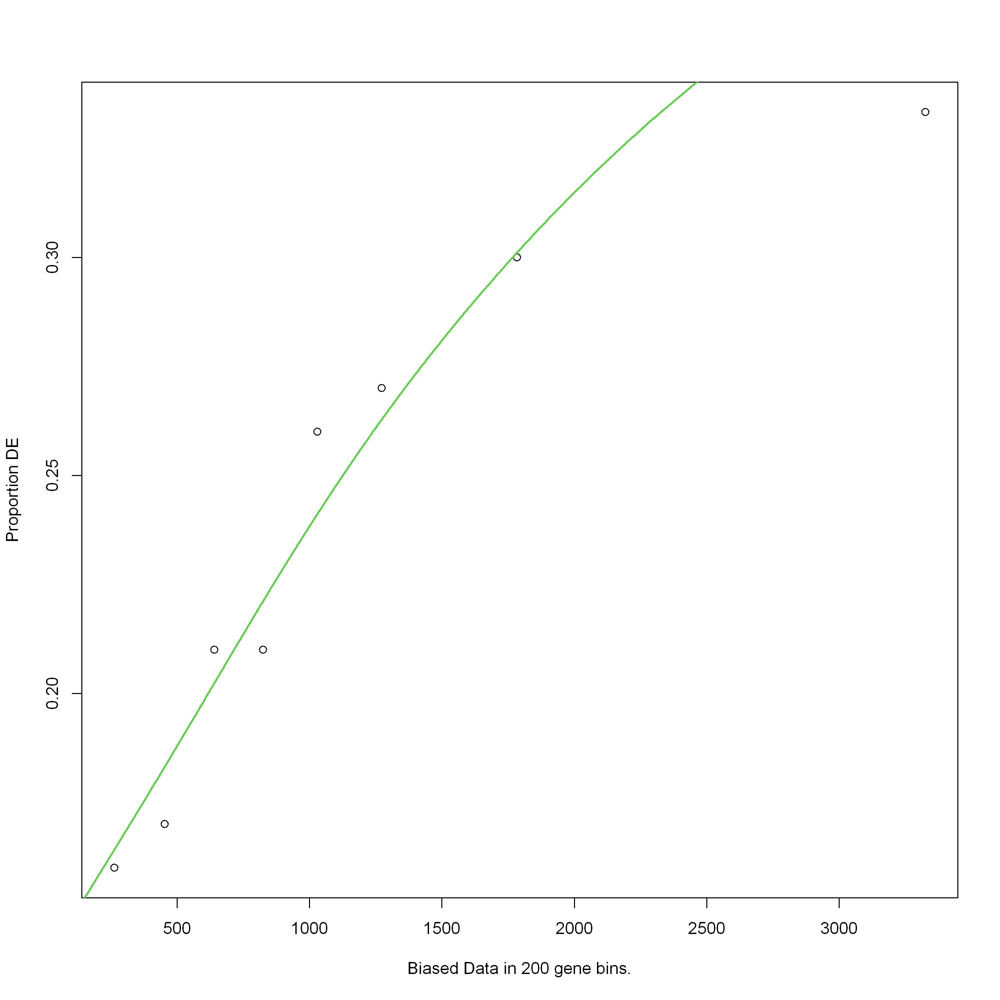

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


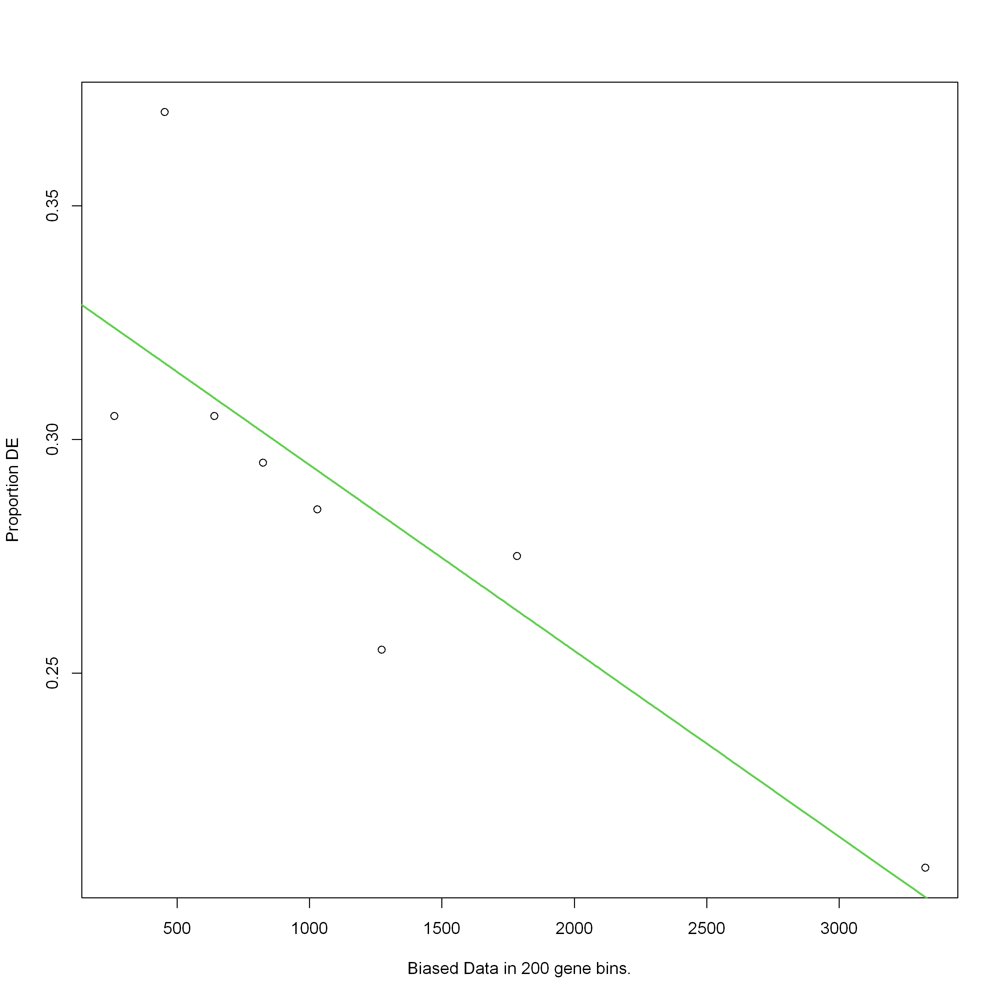

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


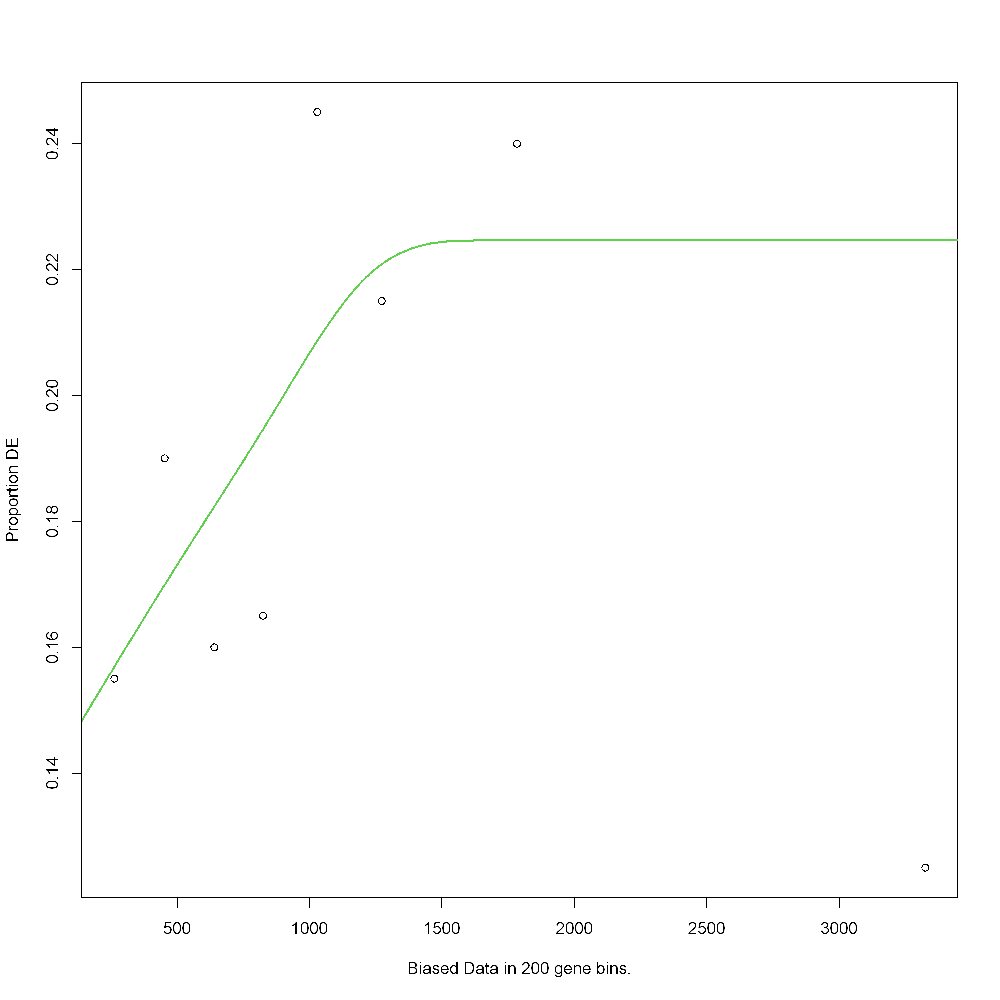

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


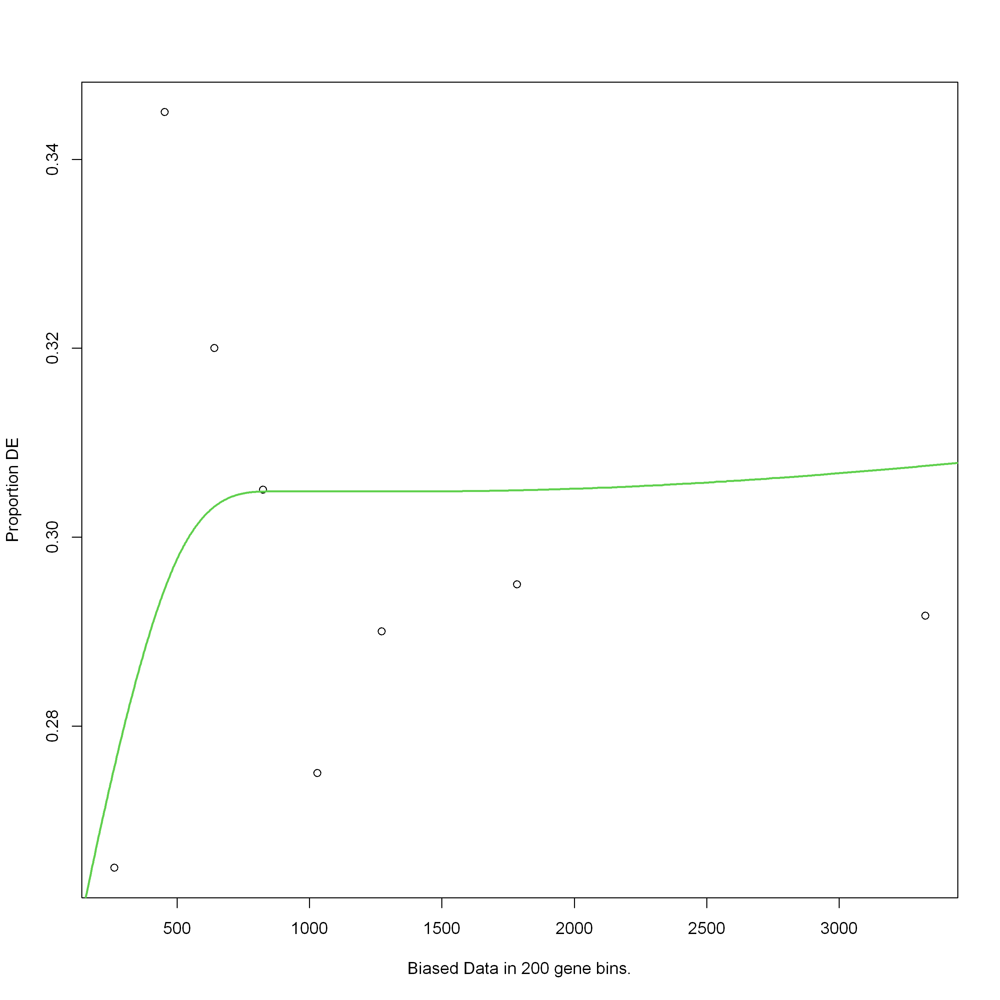

Using manually entered categories.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


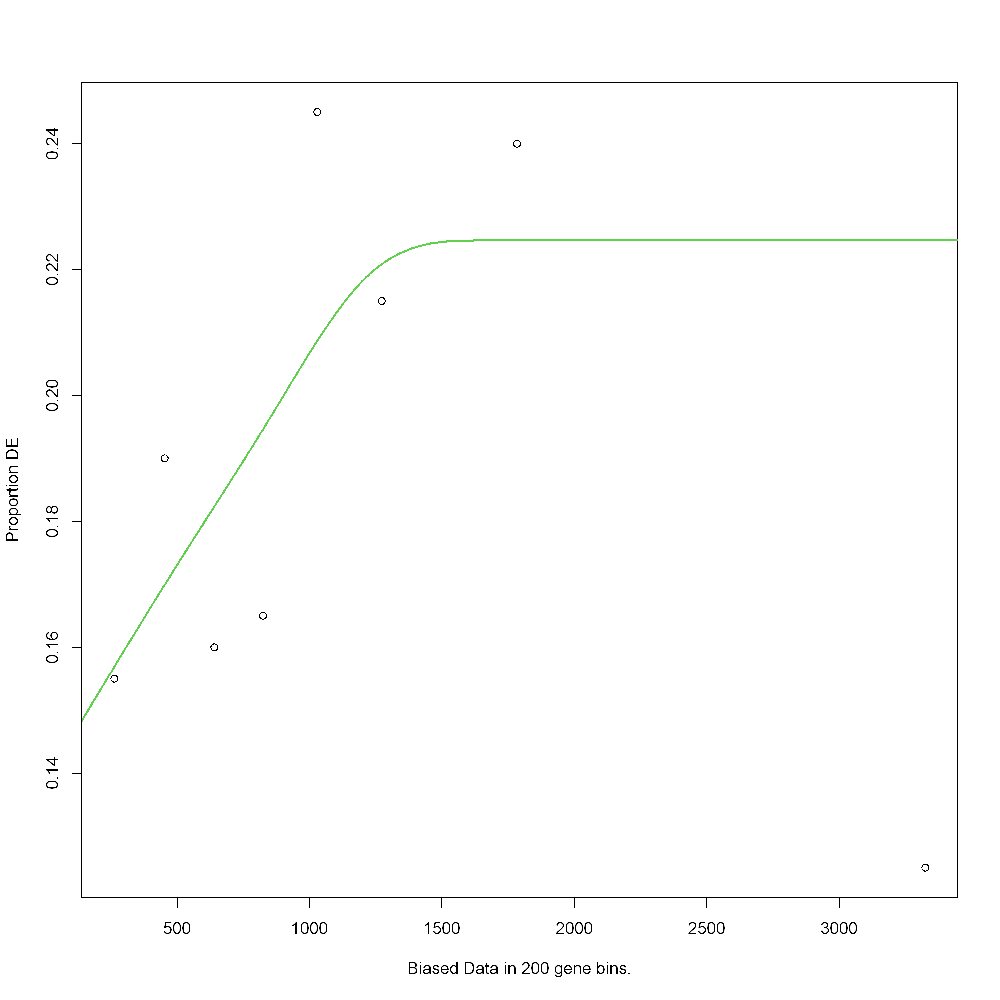

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


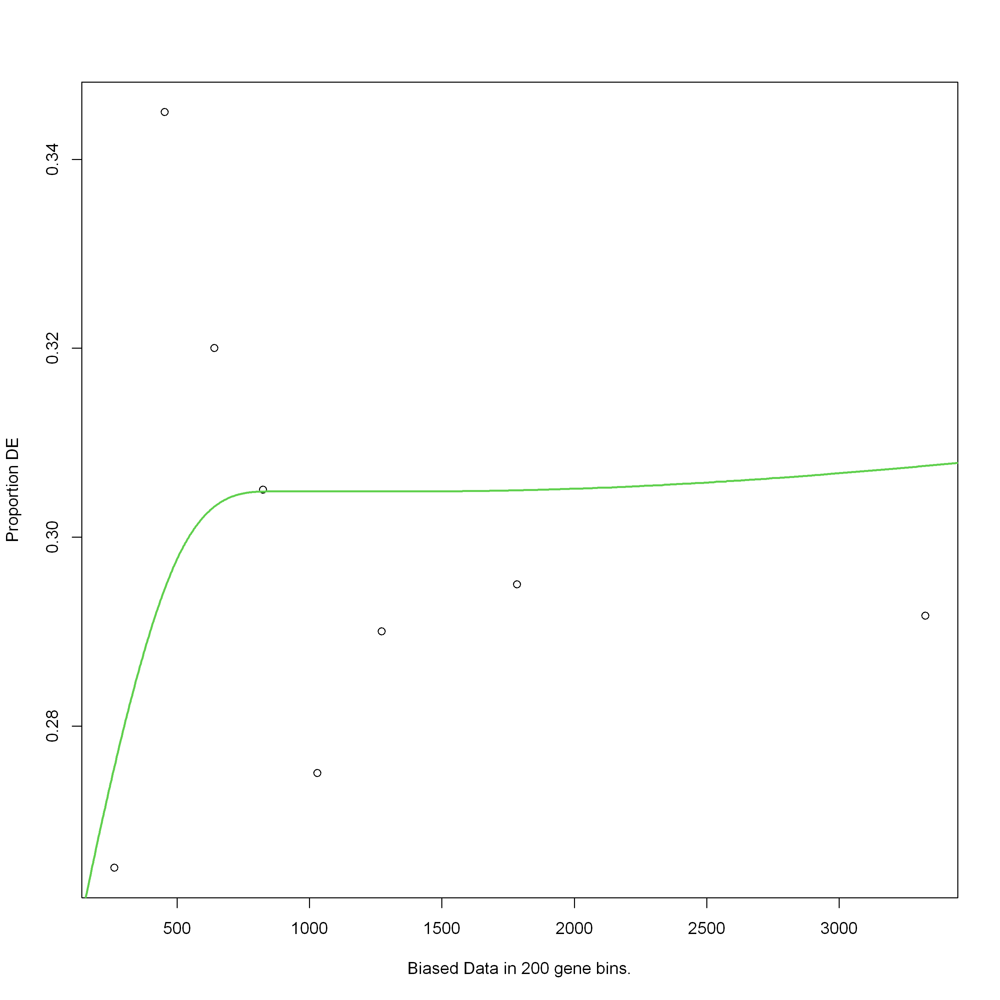

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


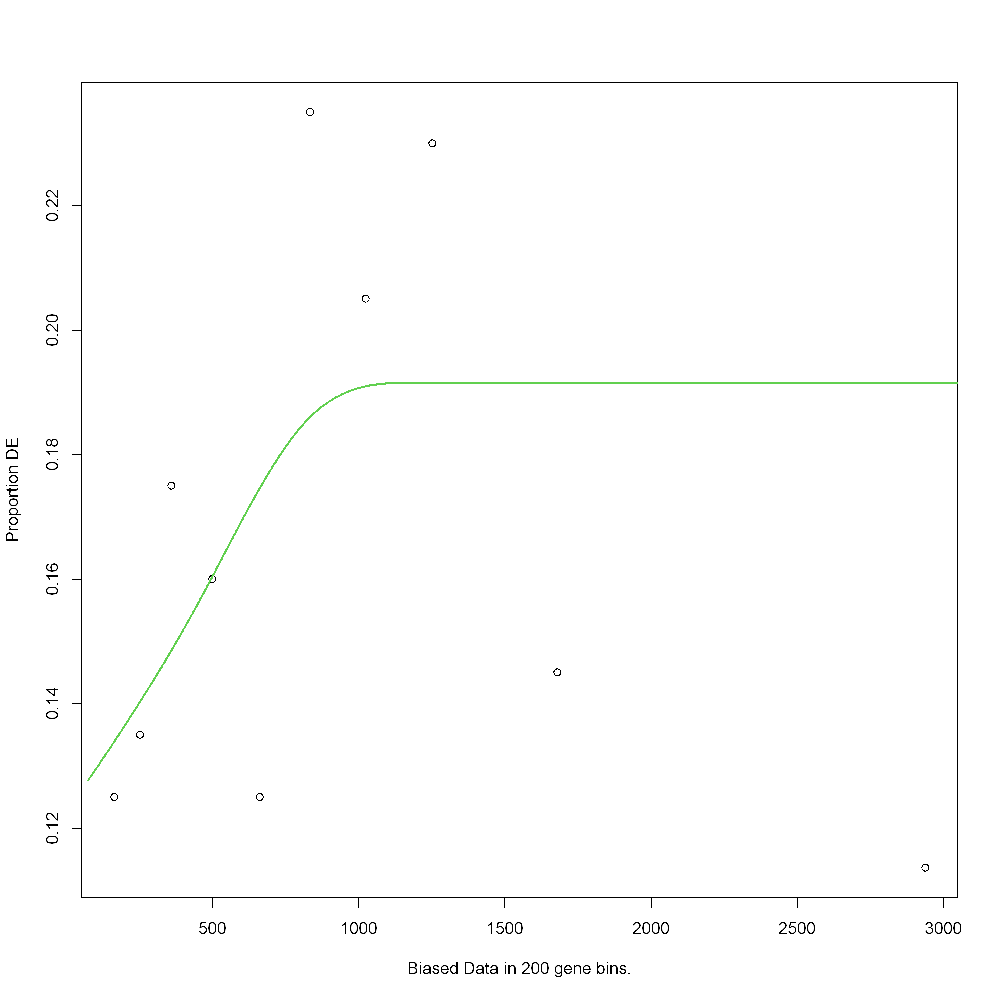

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


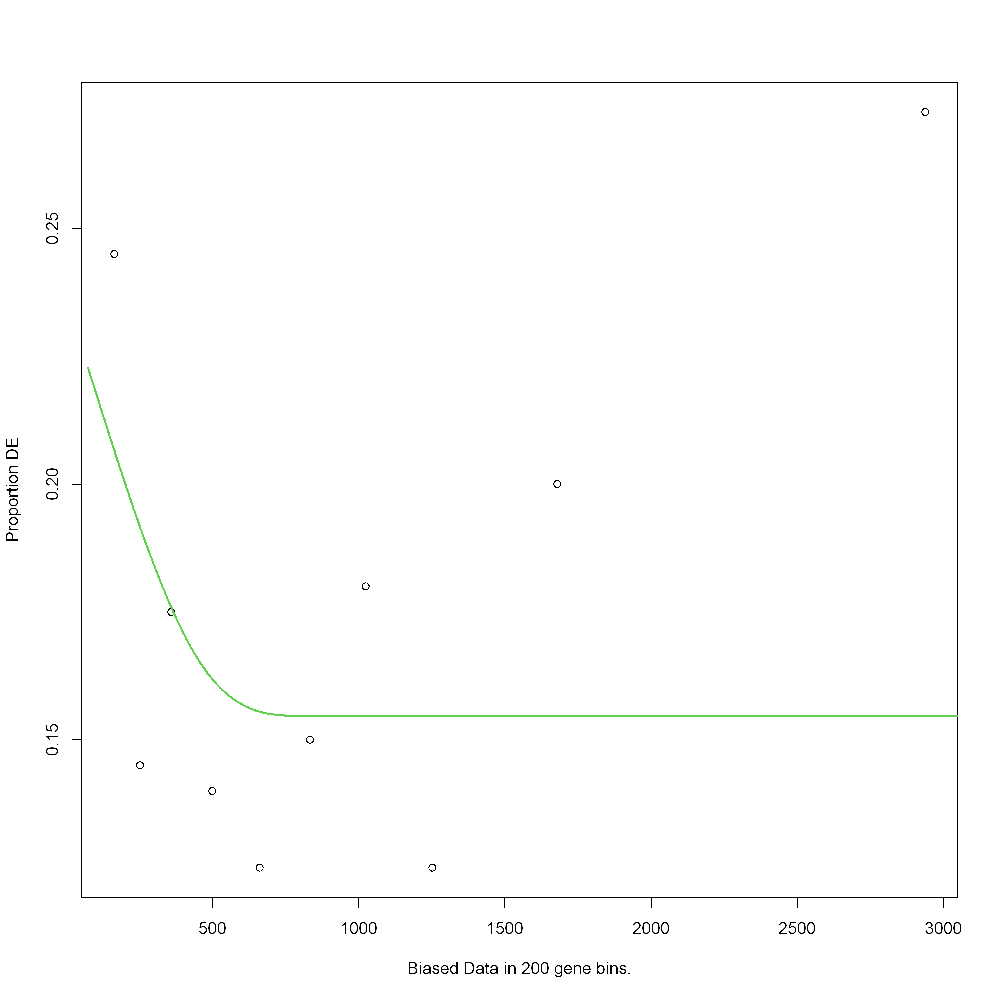

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


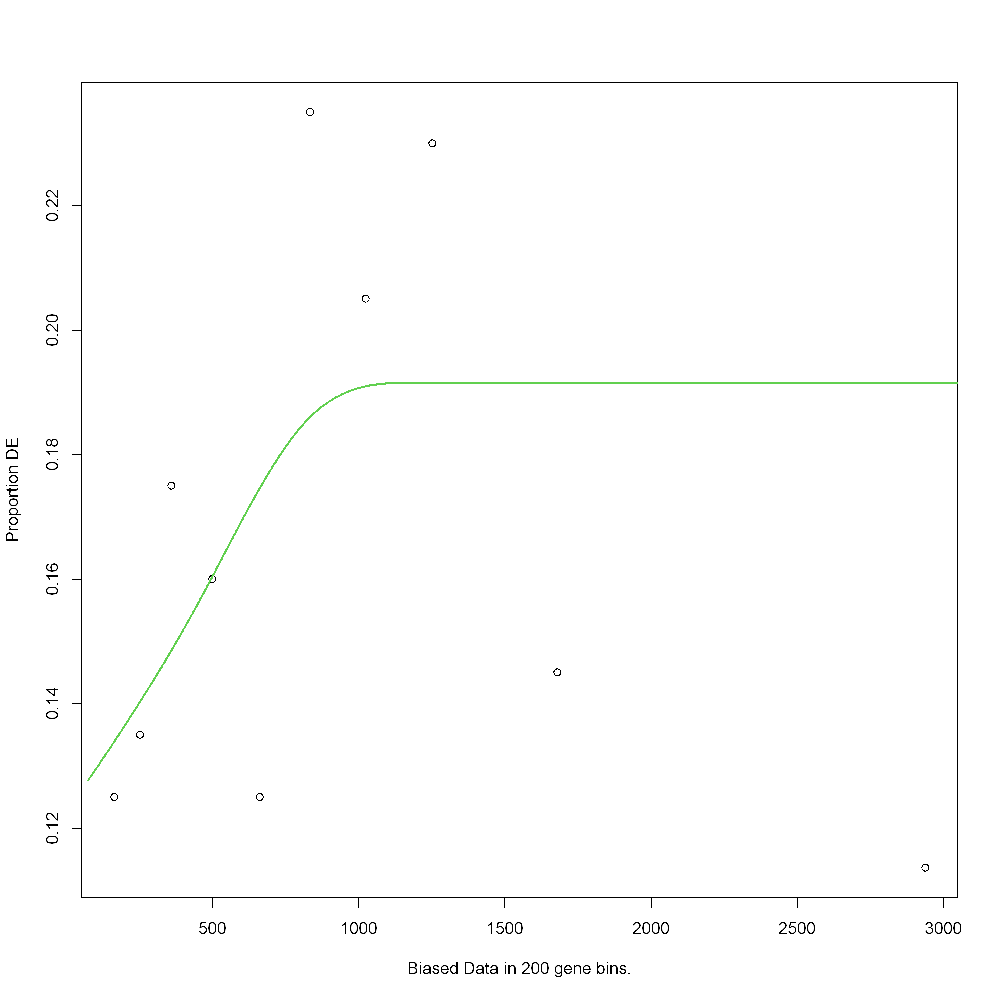

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


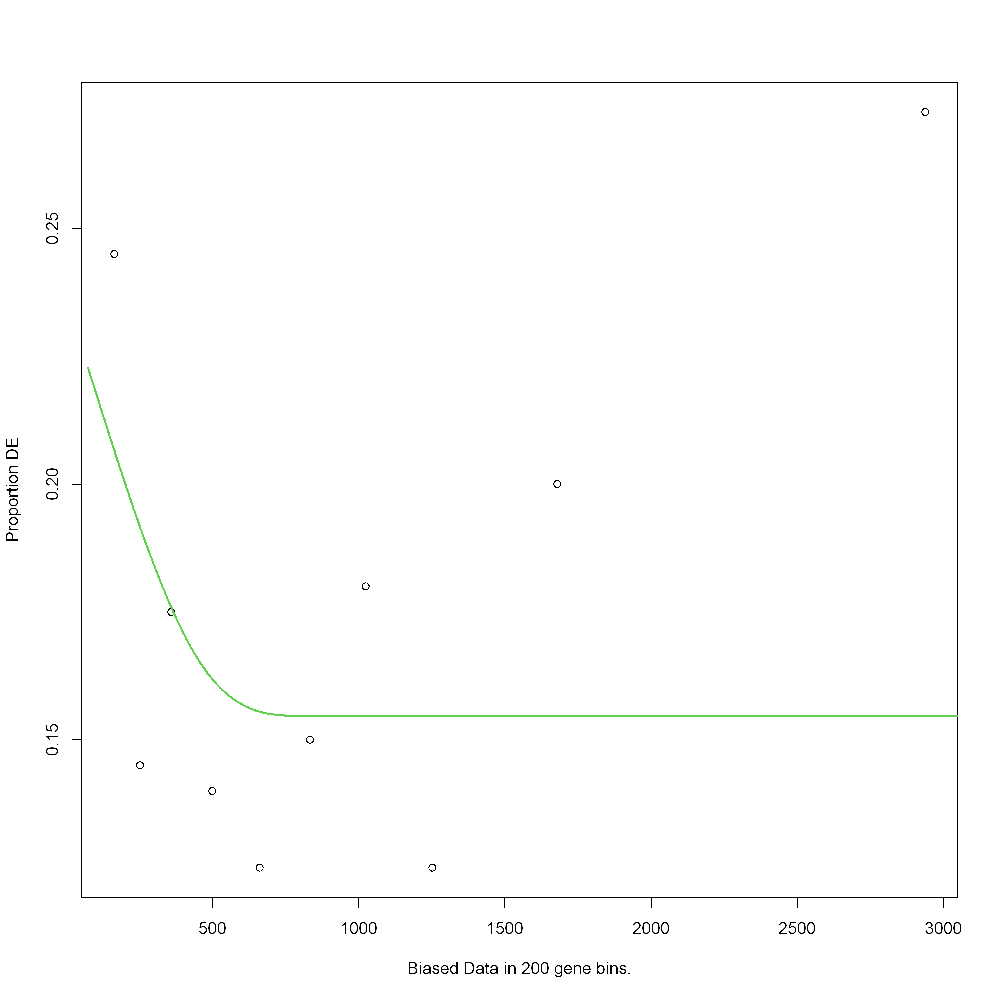

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


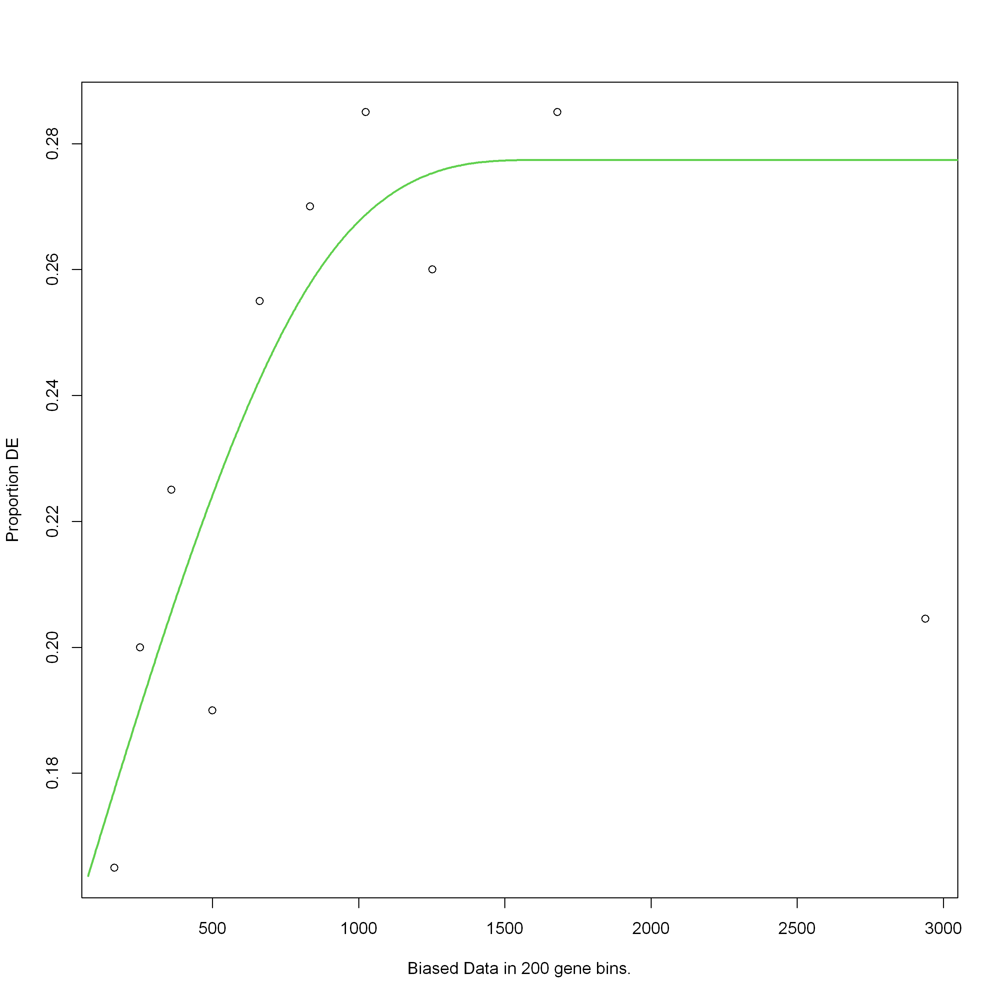

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


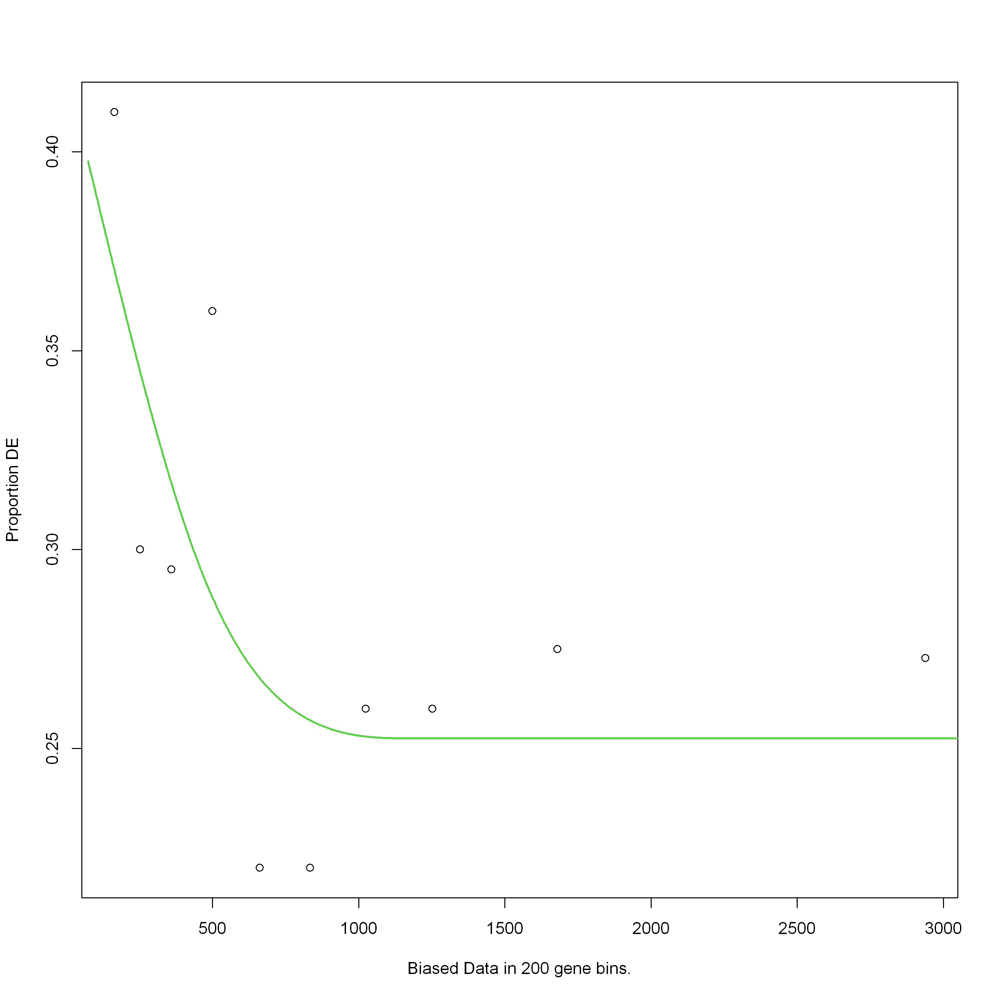

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


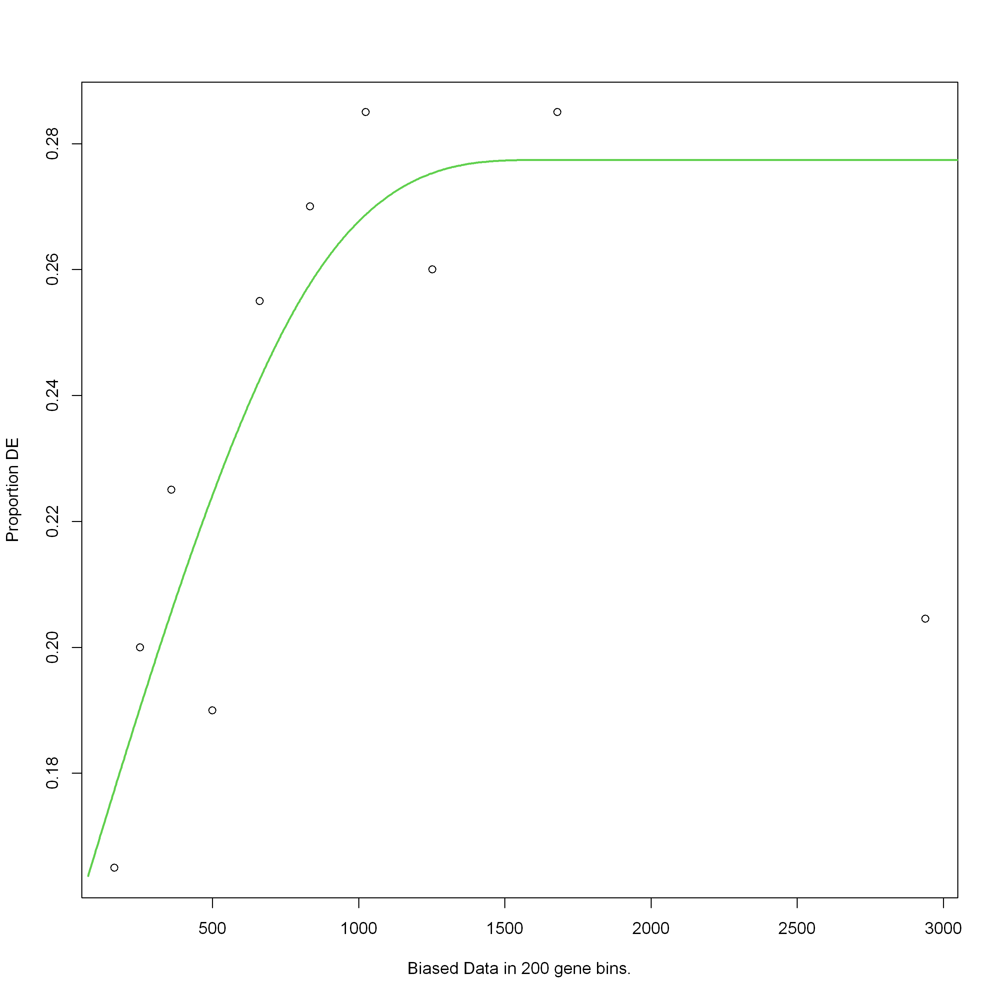

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


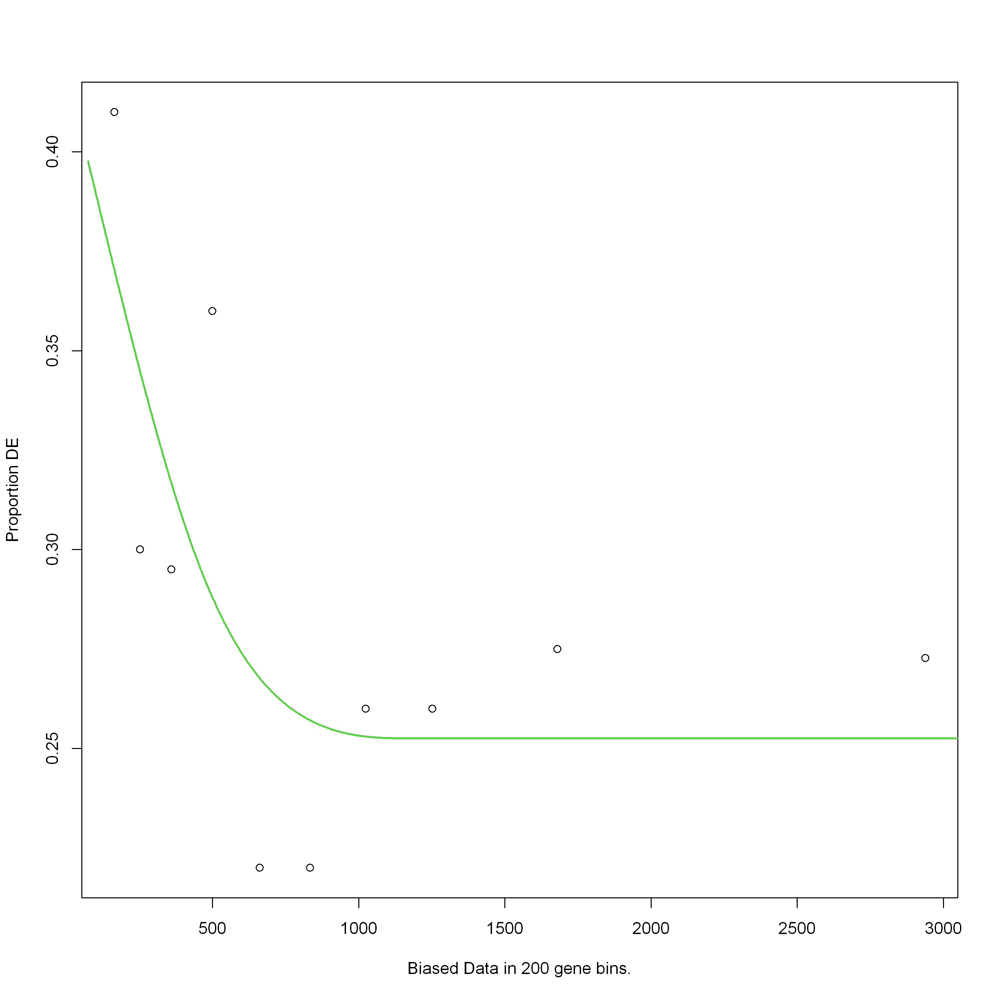

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


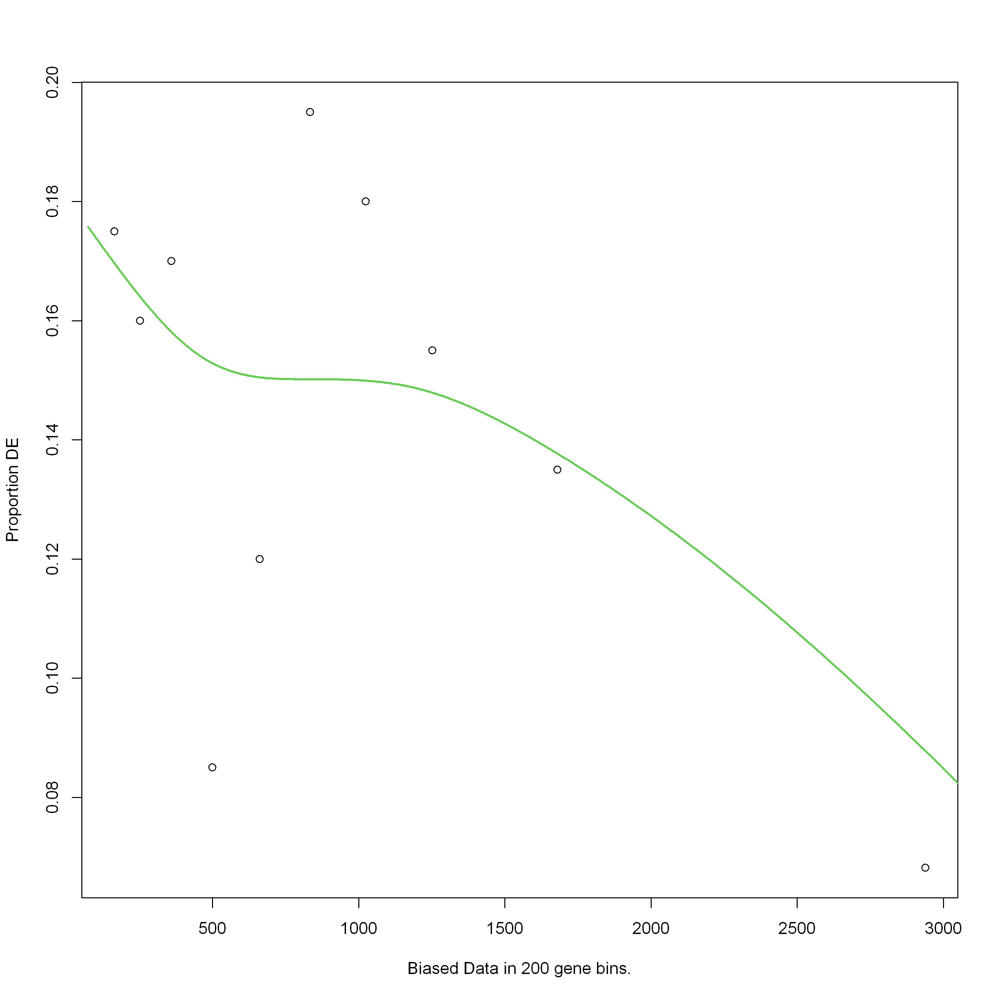

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


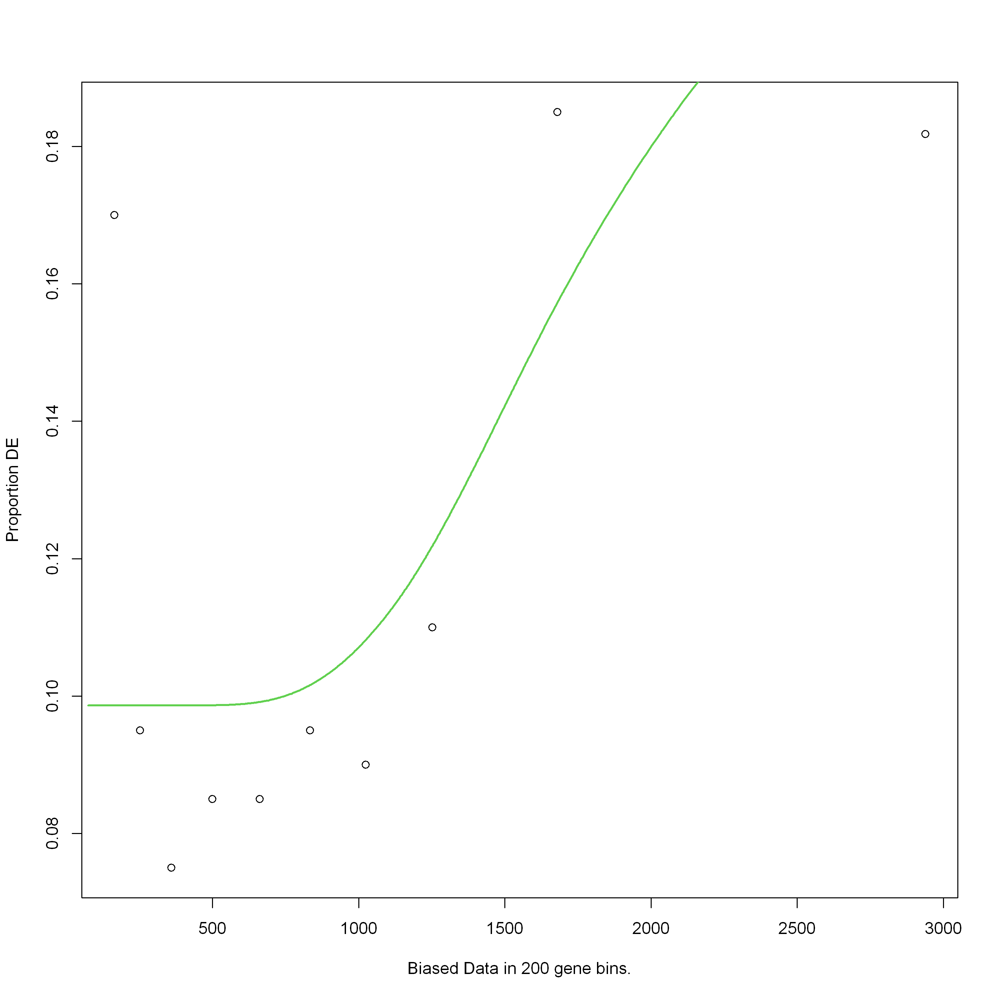

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


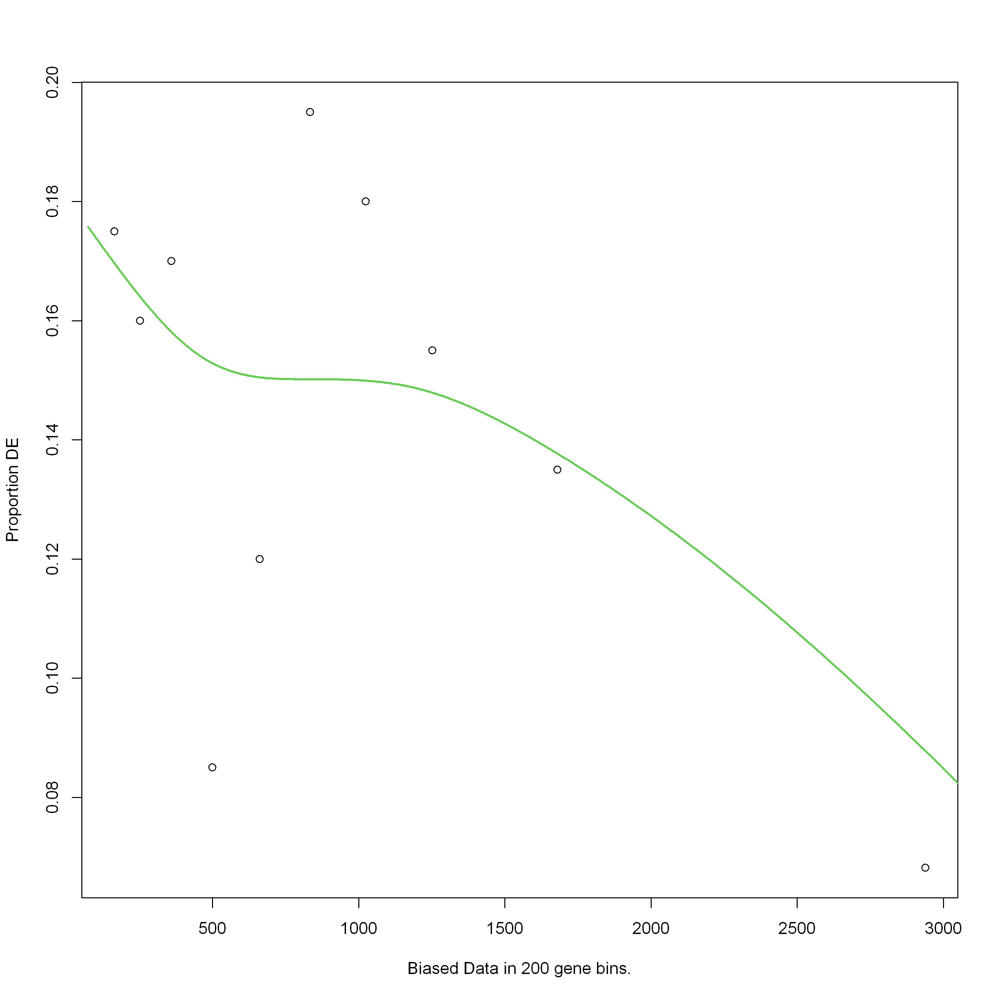

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


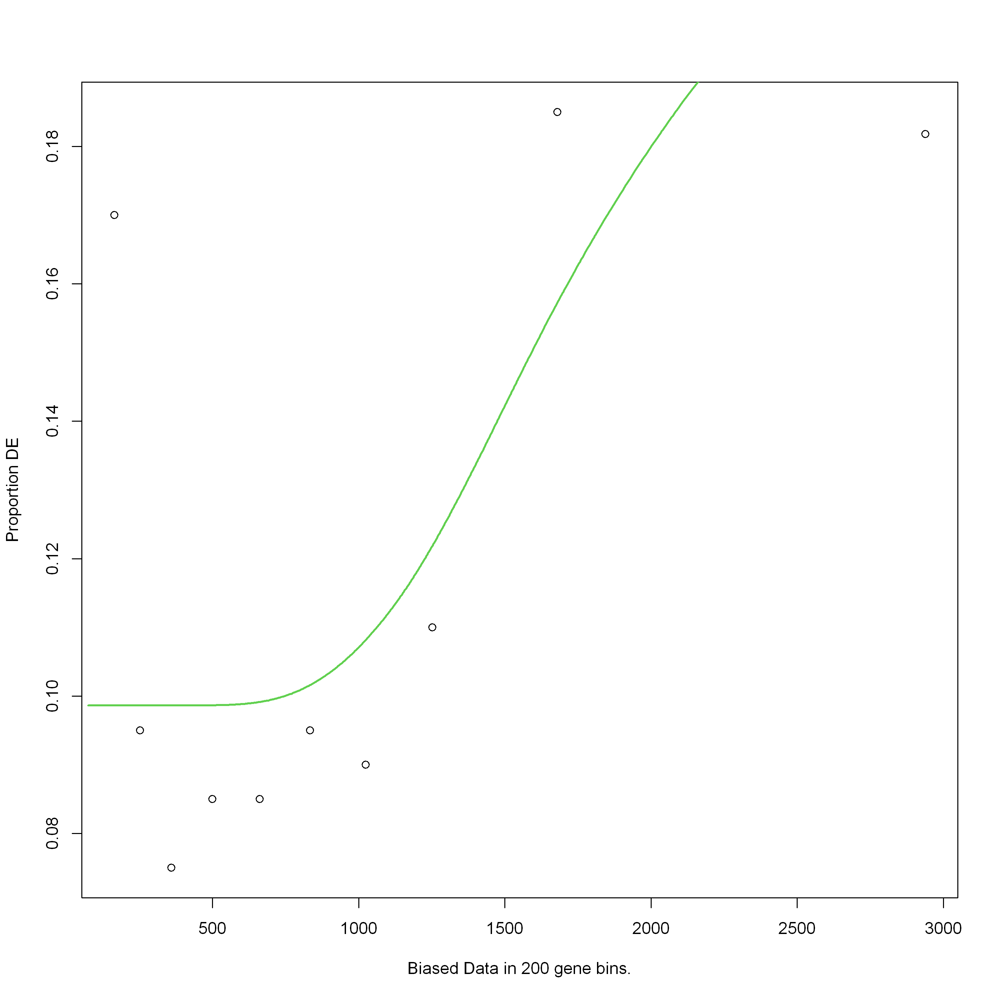

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


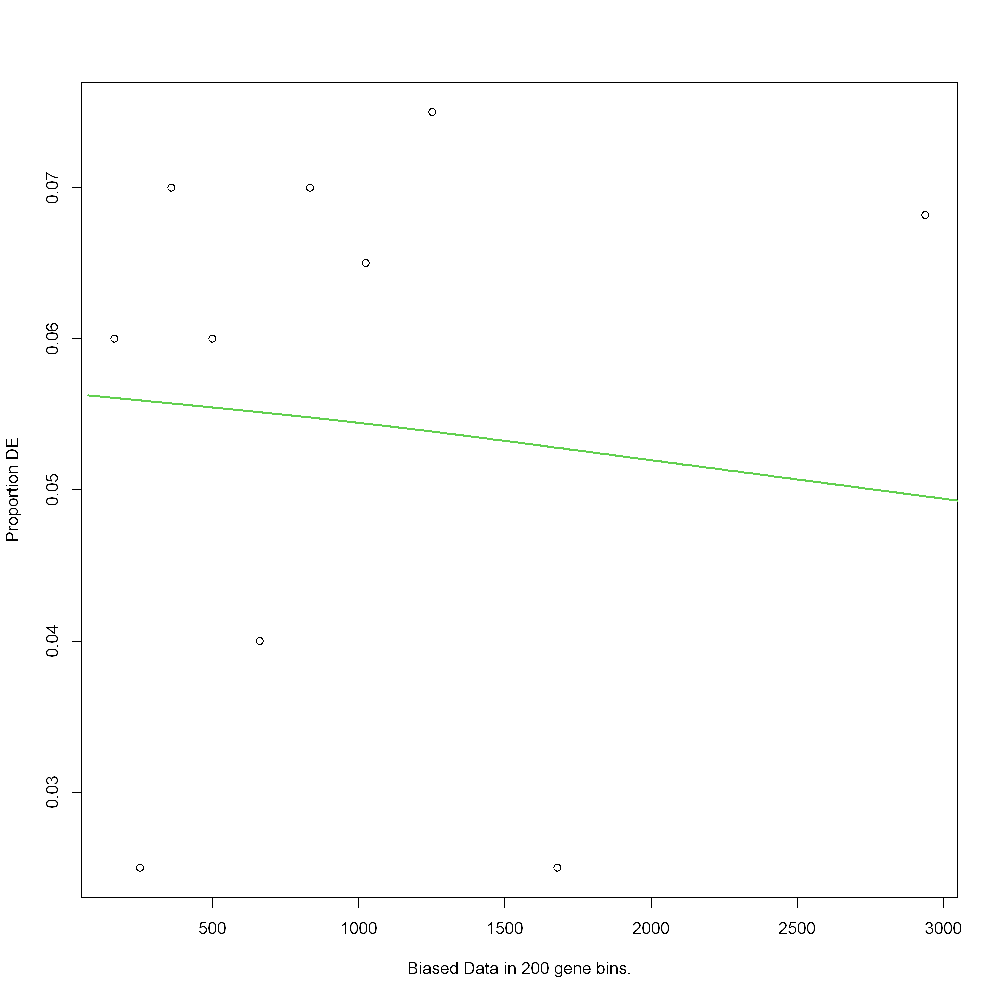

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


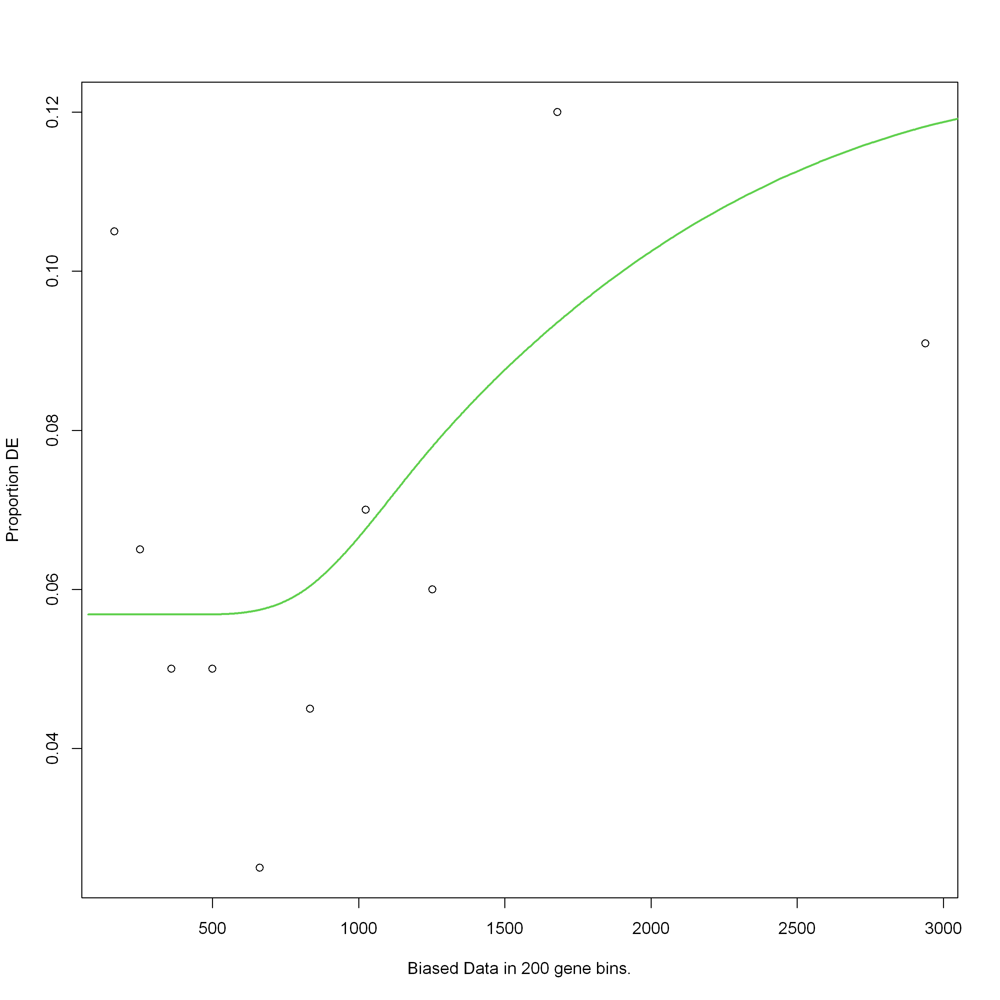

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


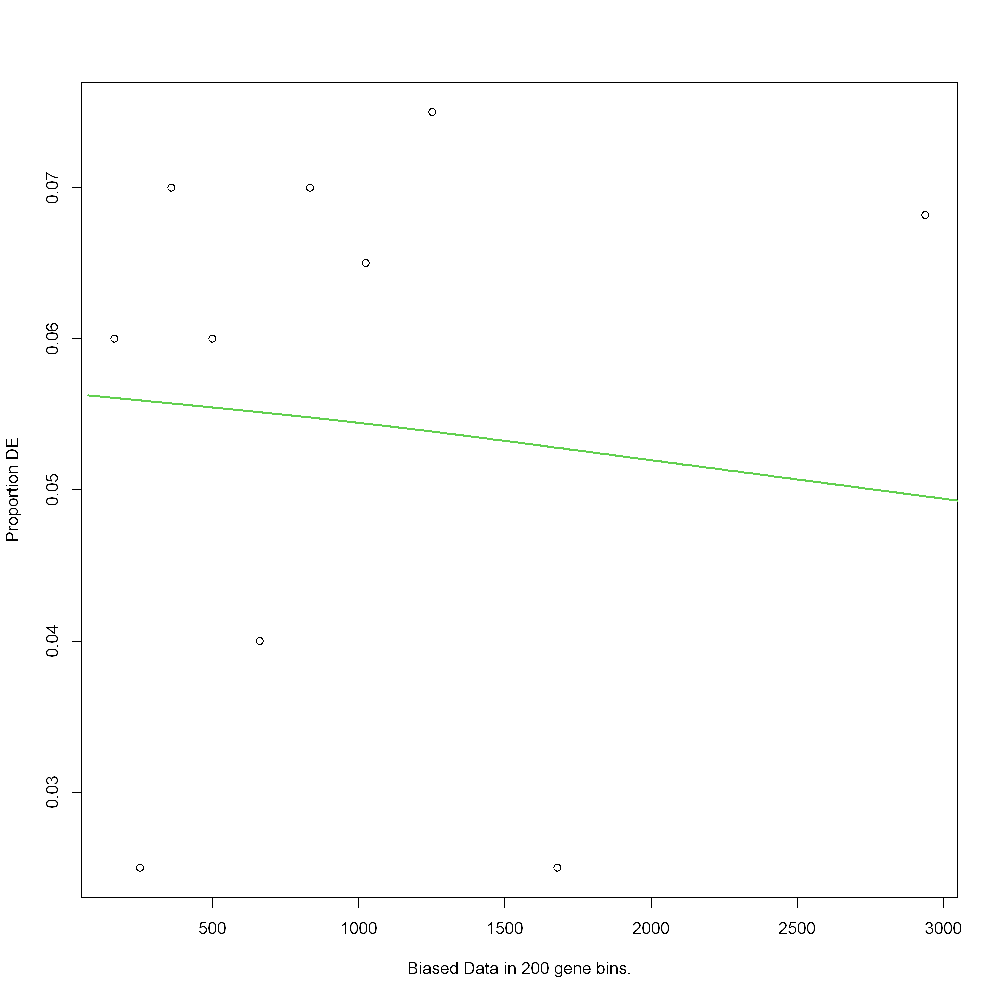

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


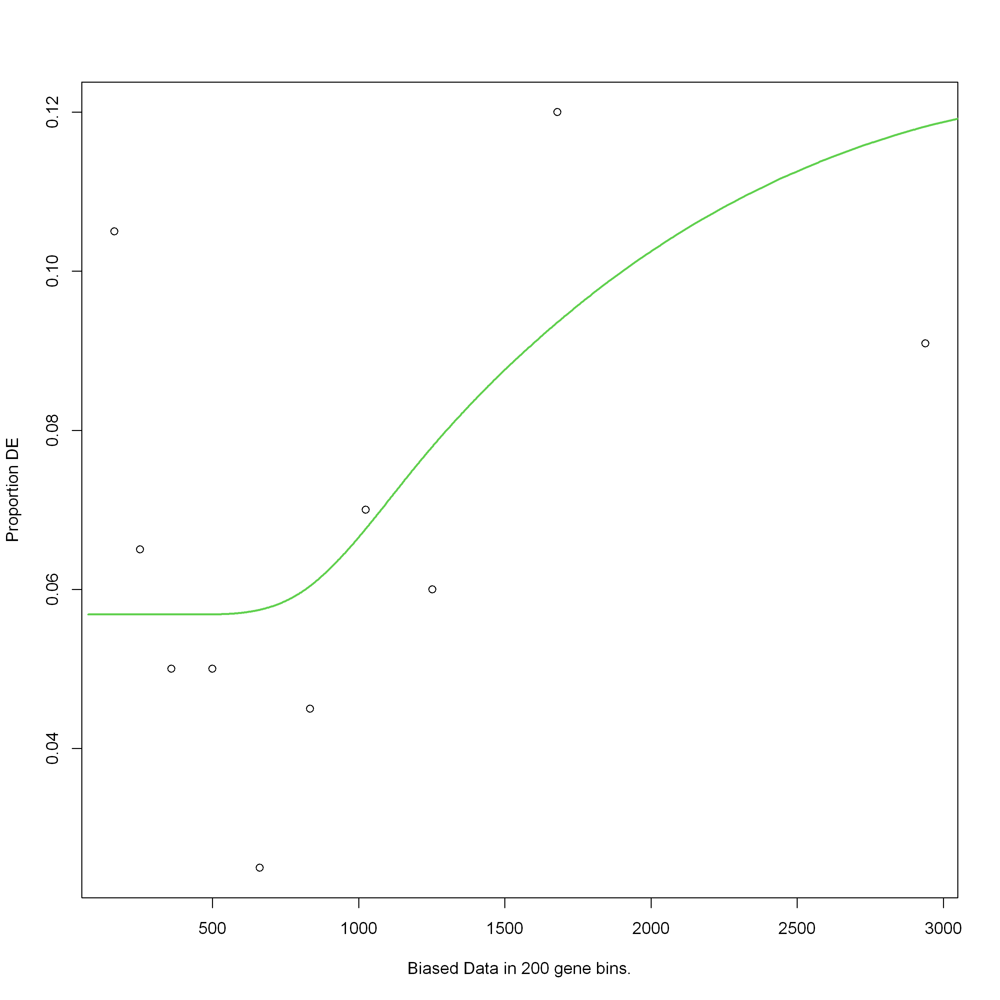

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


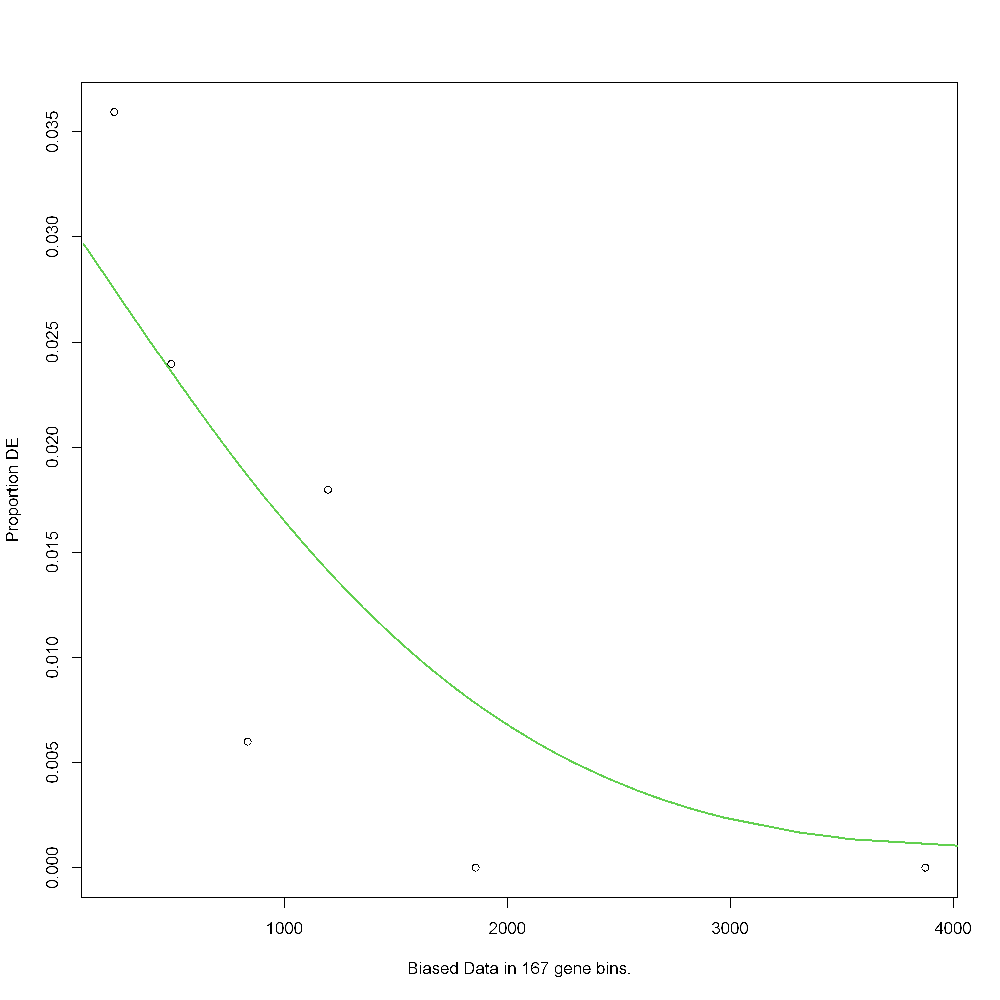

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


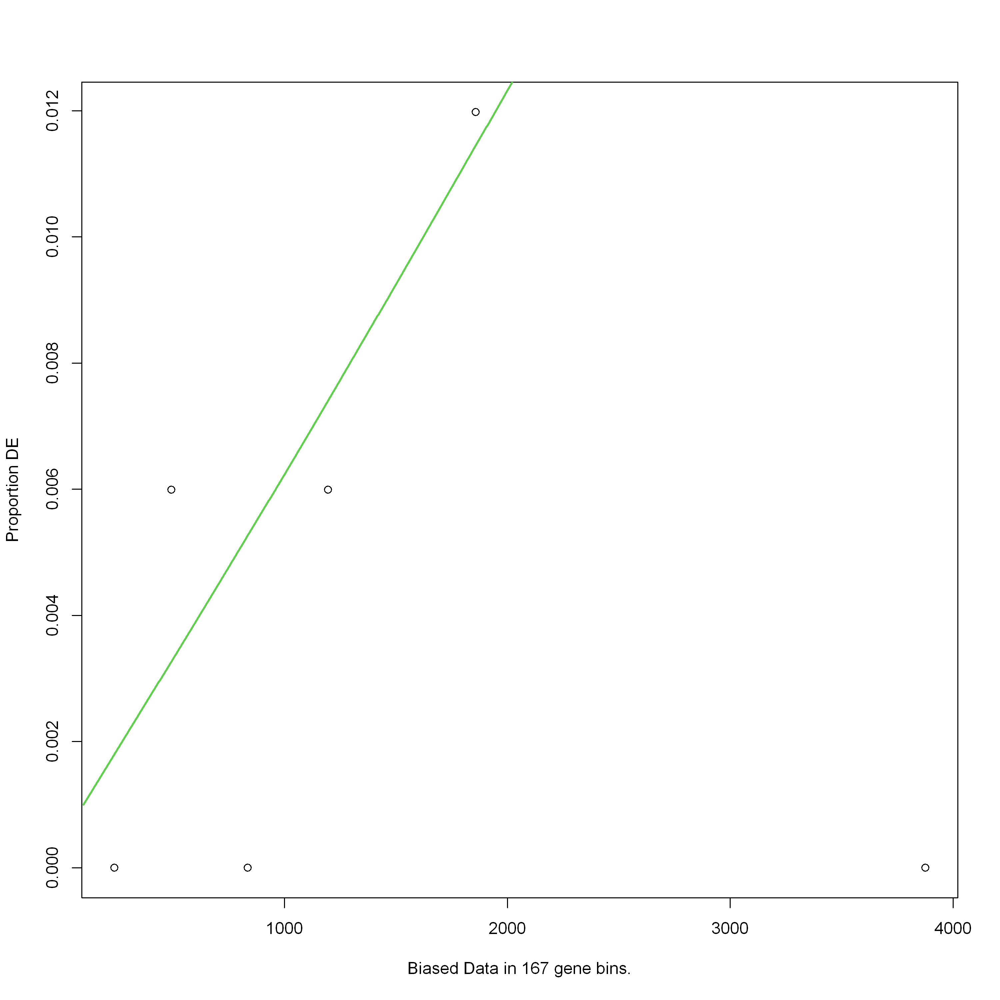

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


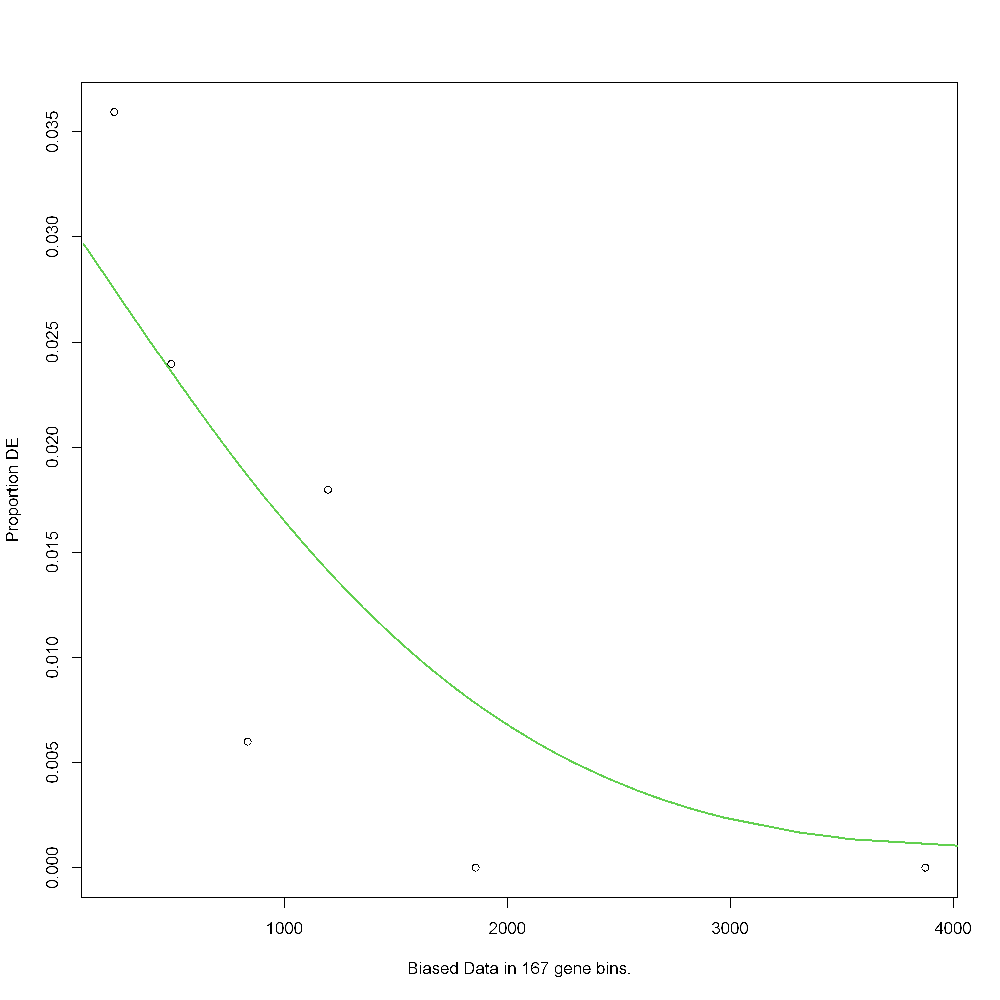

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


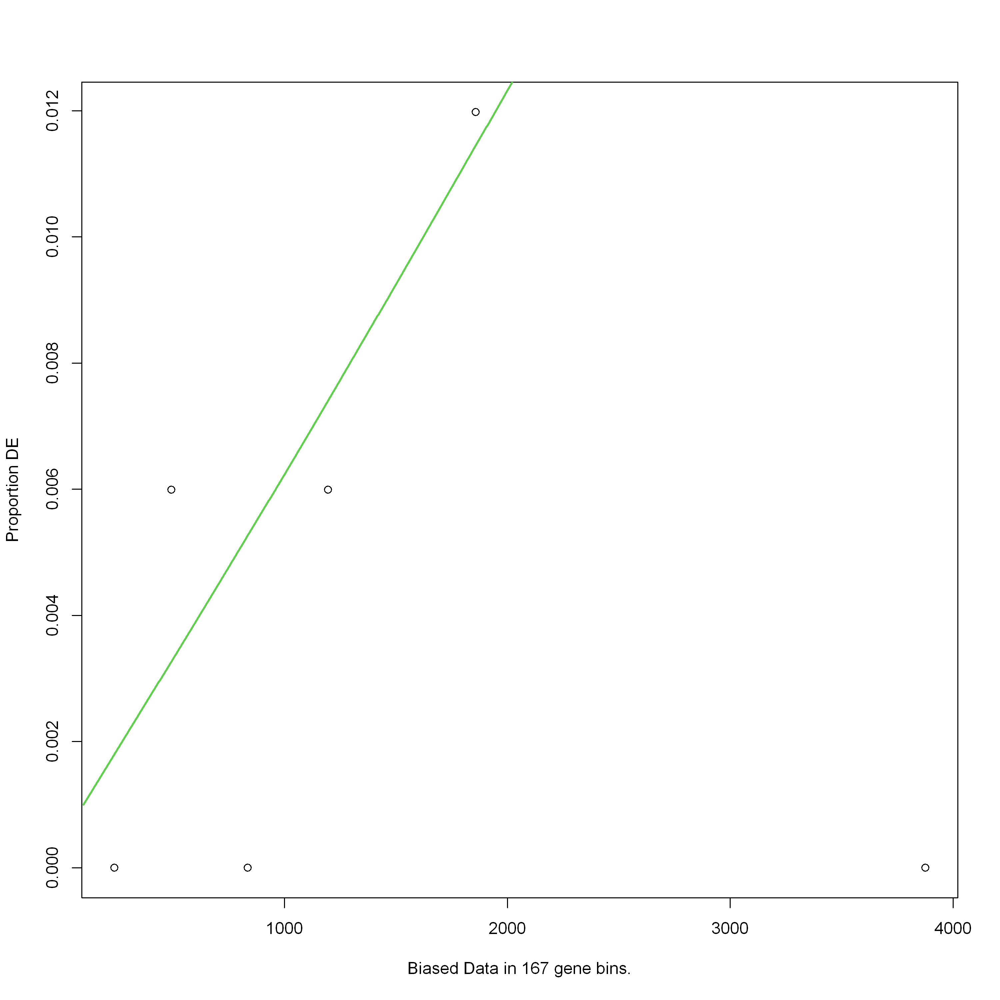

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


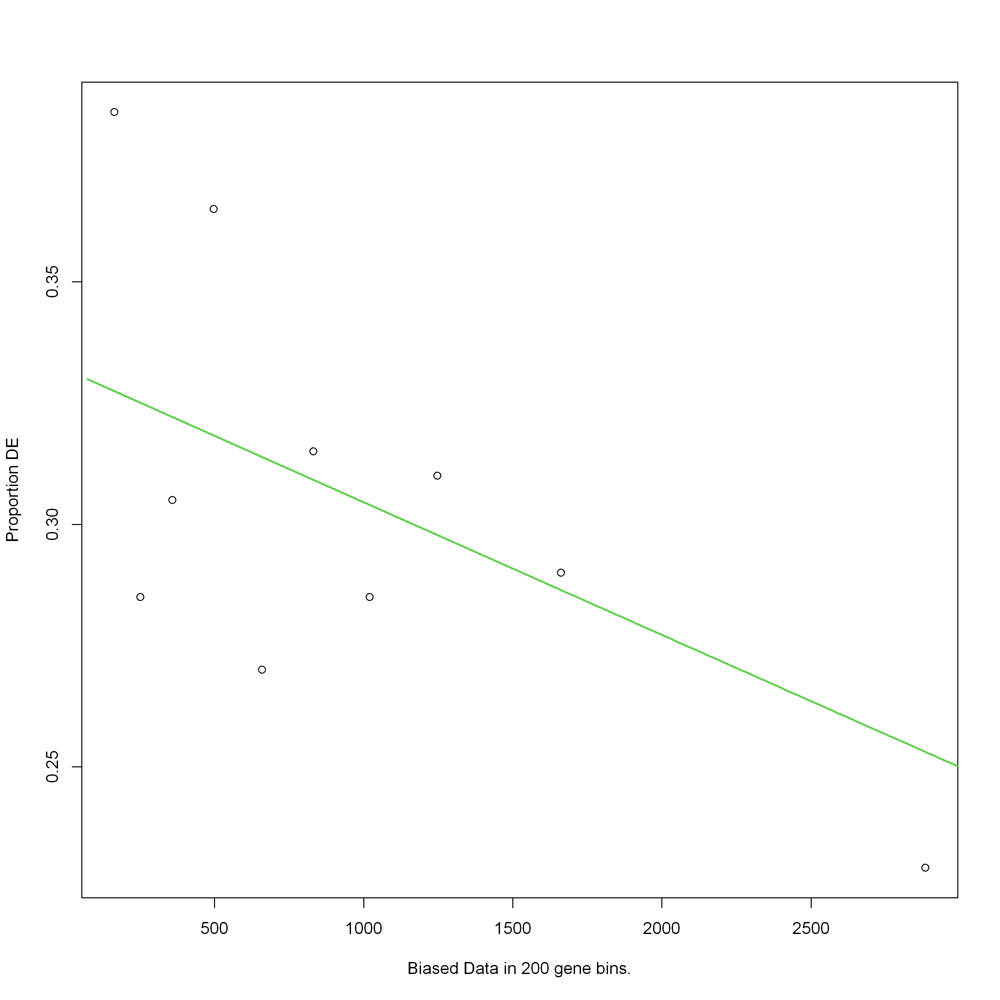

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


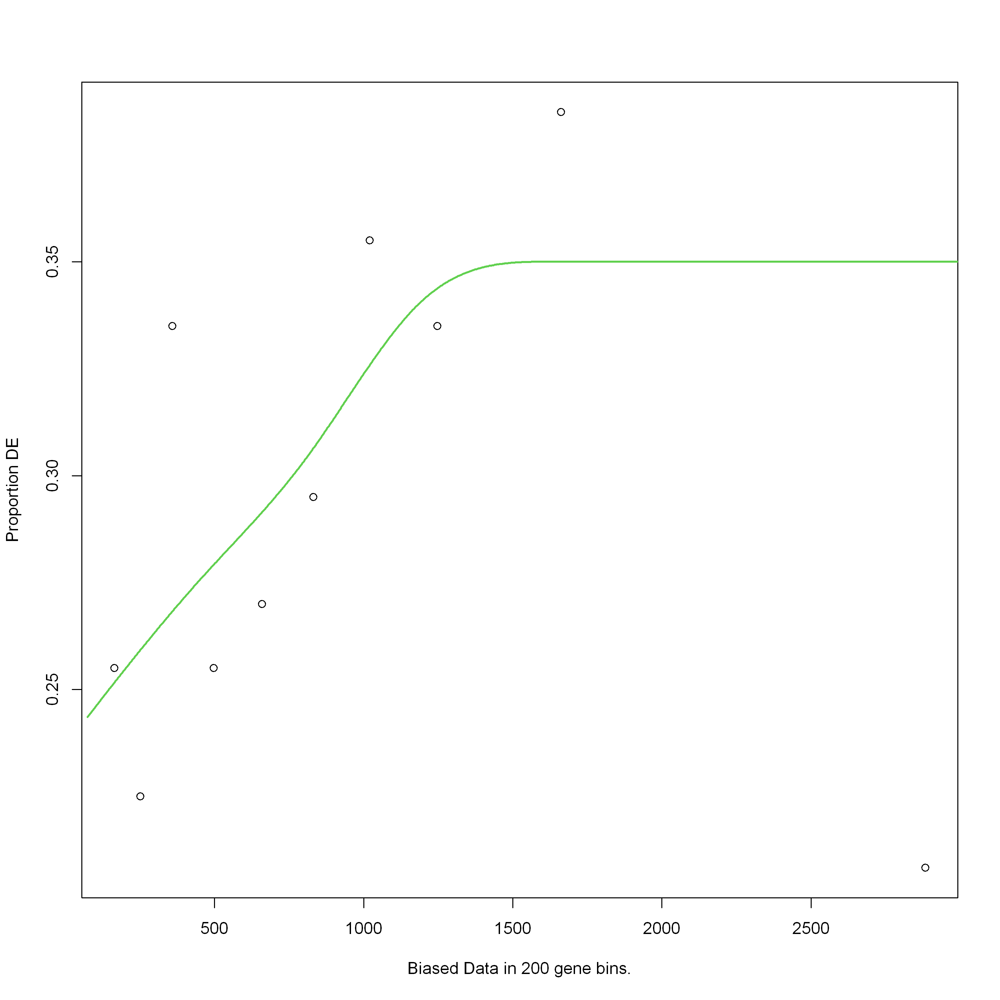

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


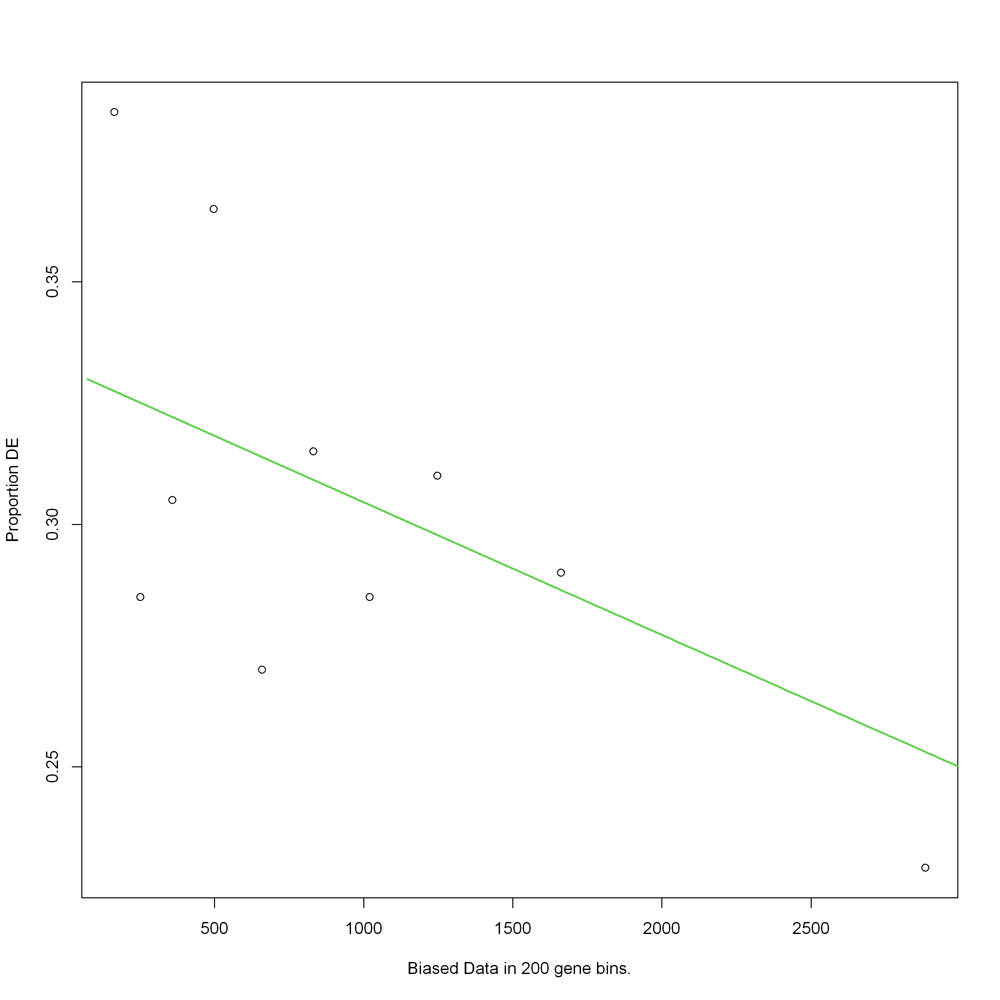

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


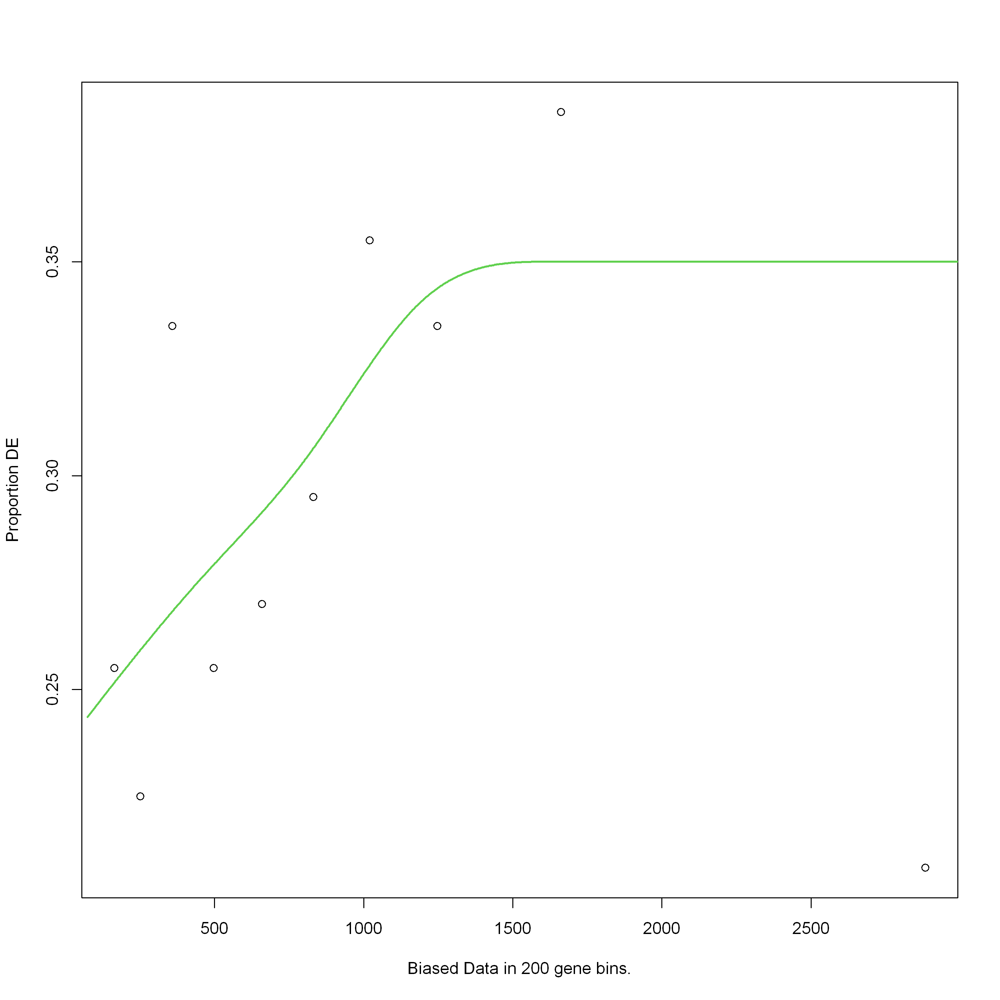

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


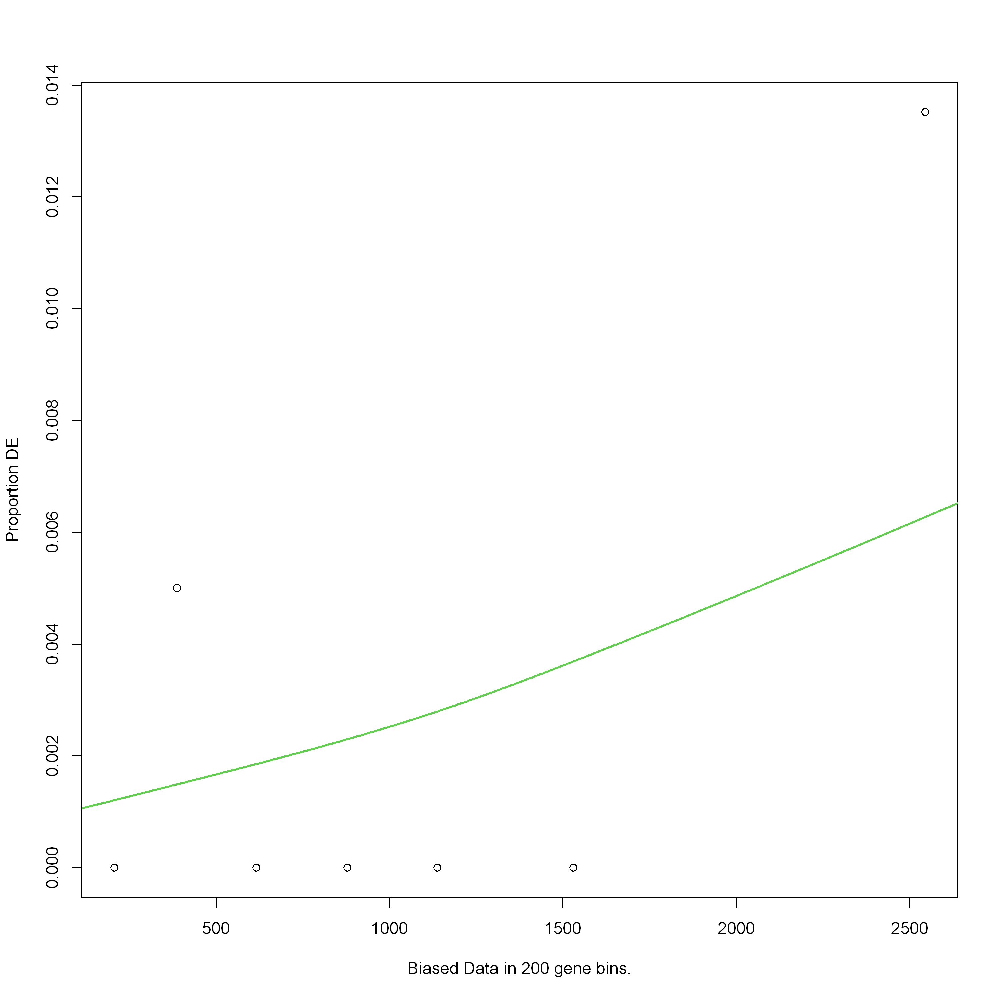

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


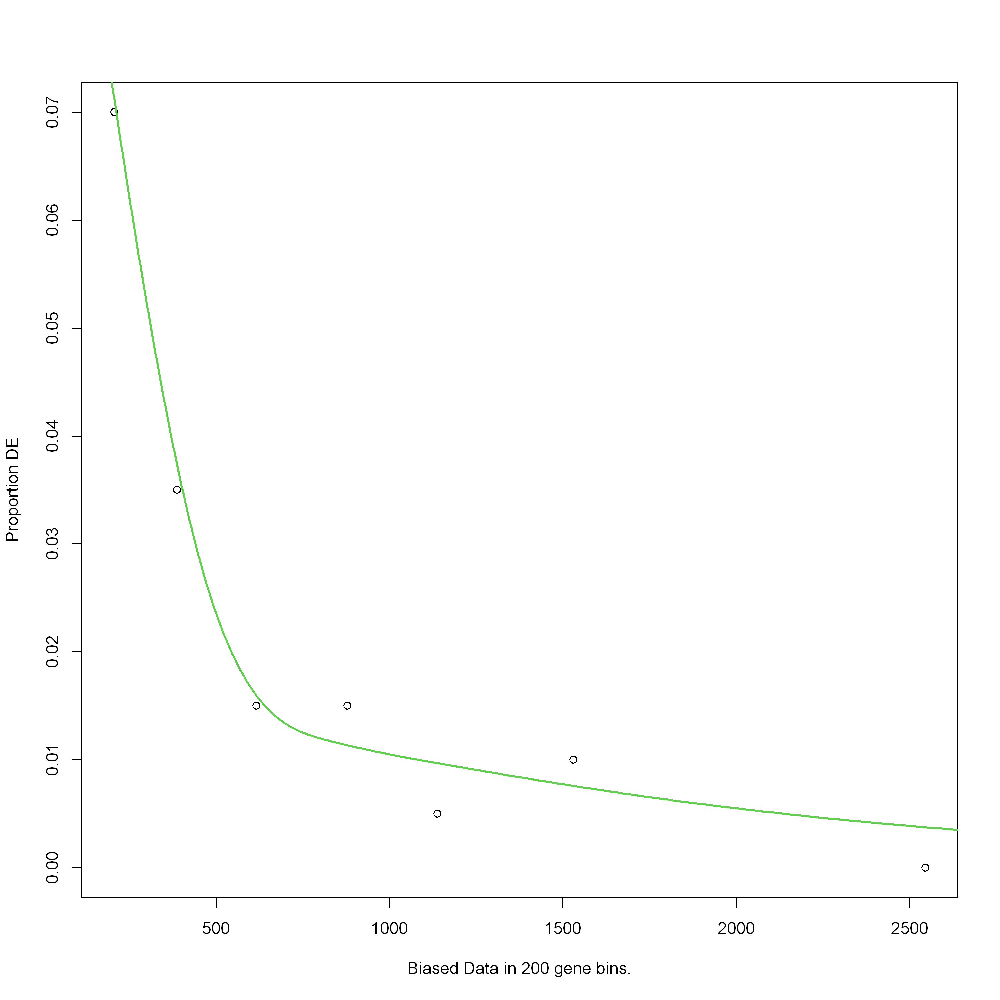

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


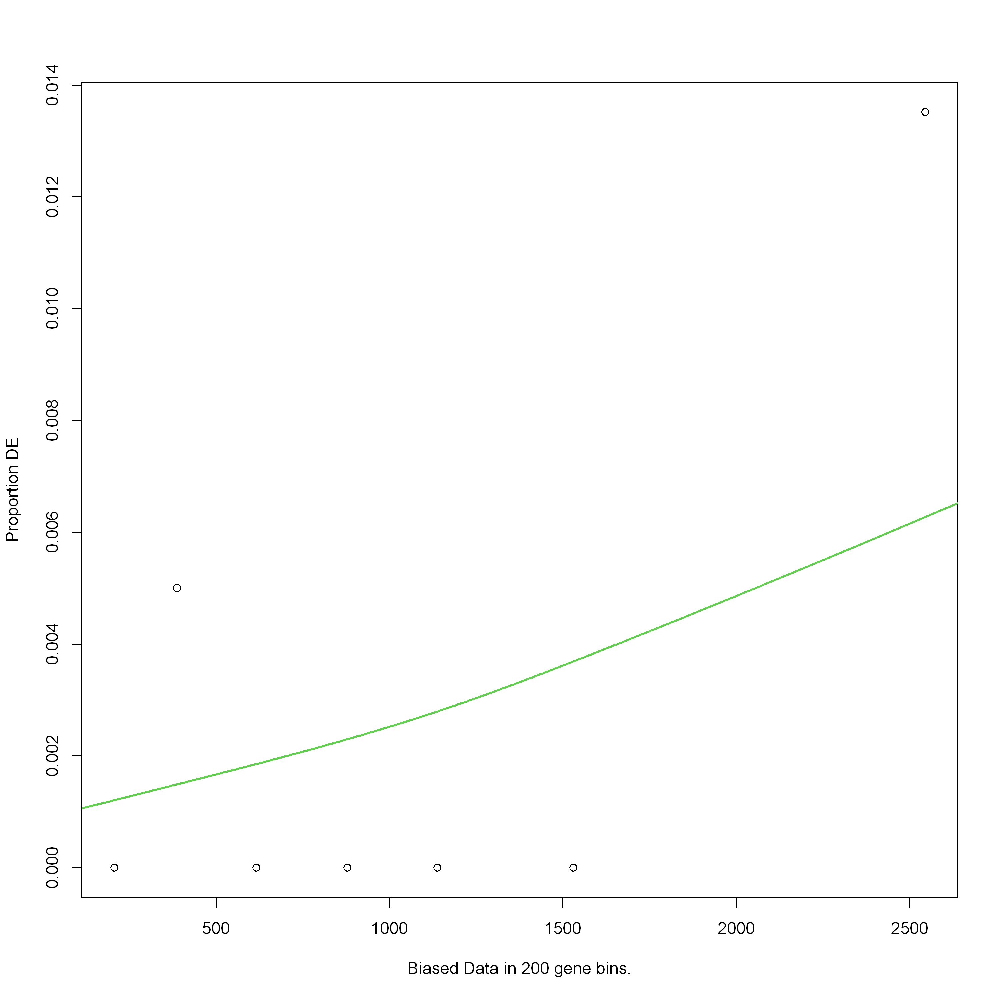

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


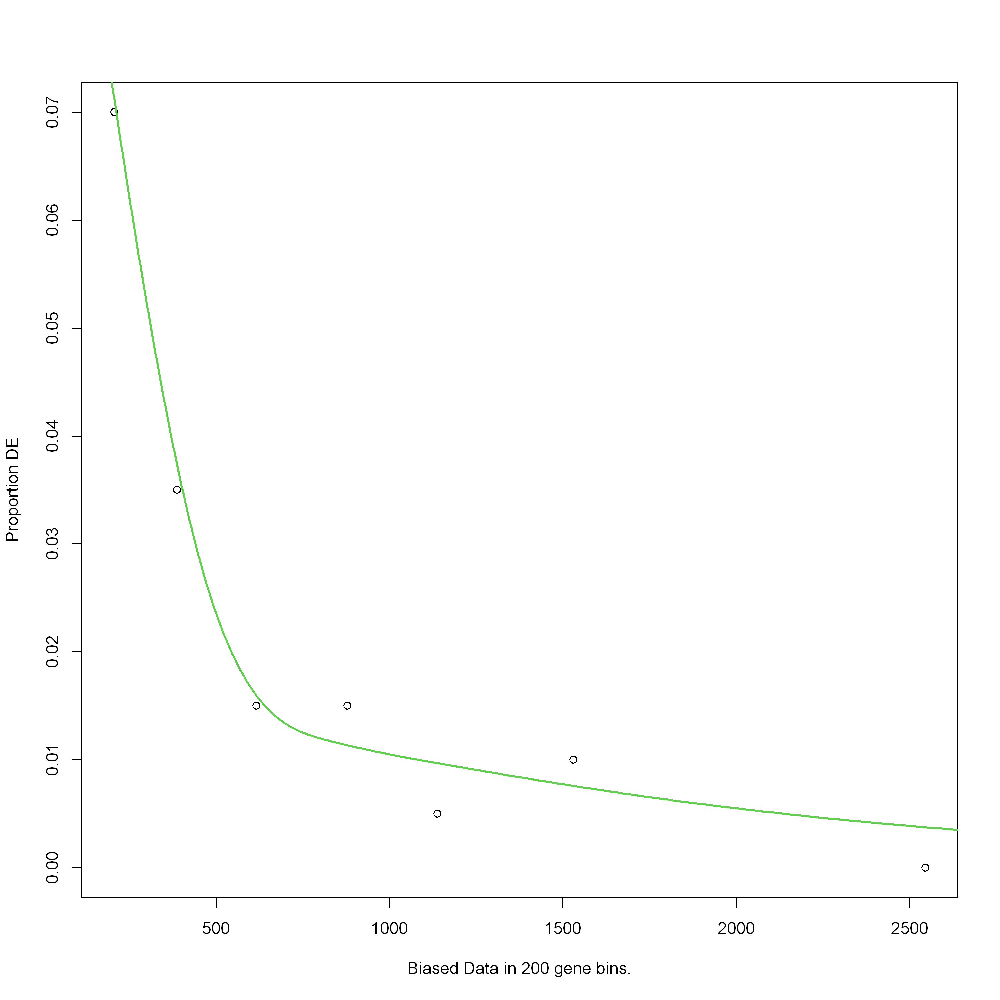

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


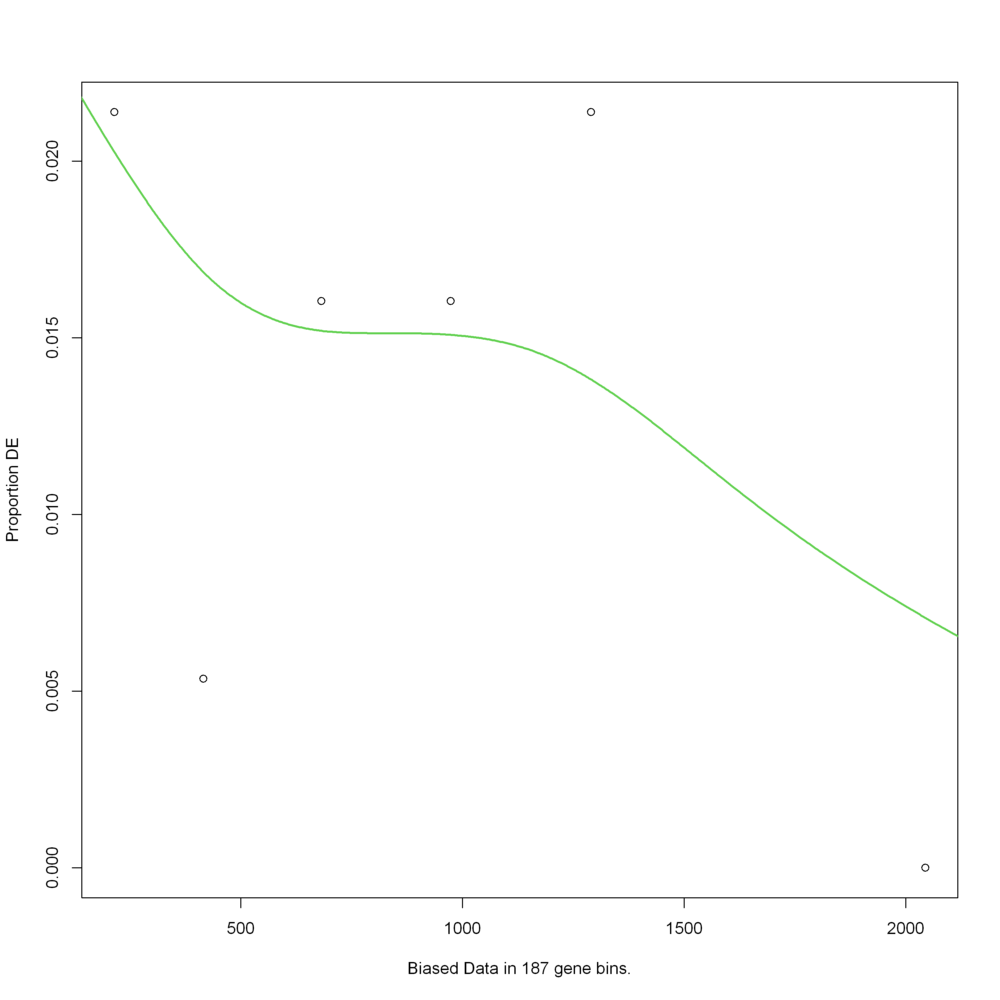

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


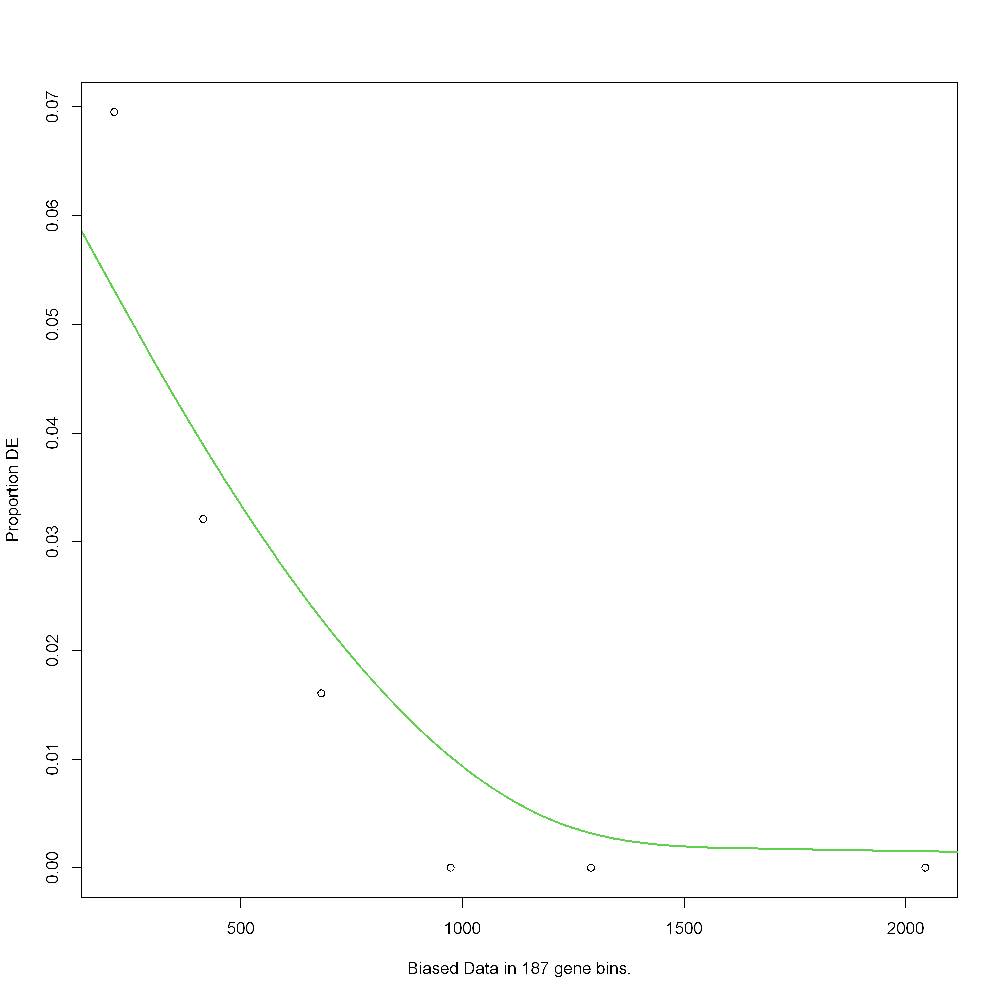

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


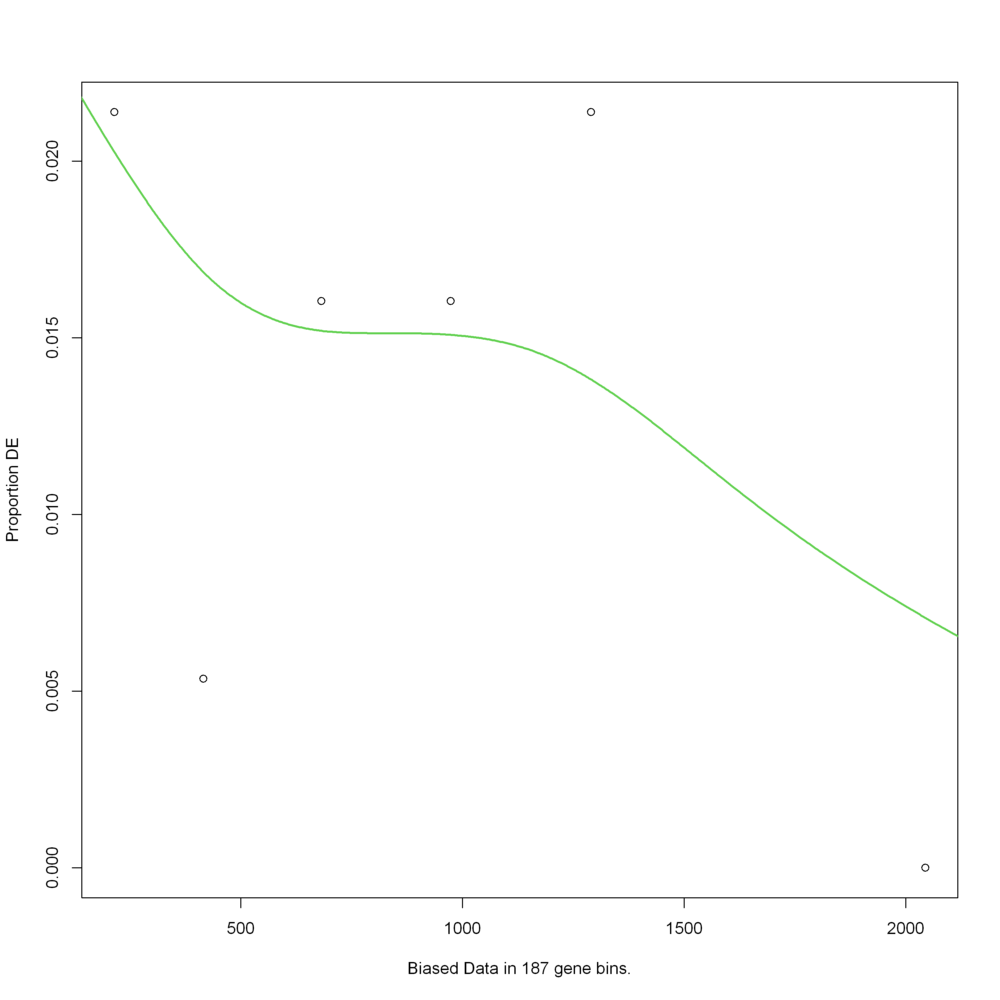

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


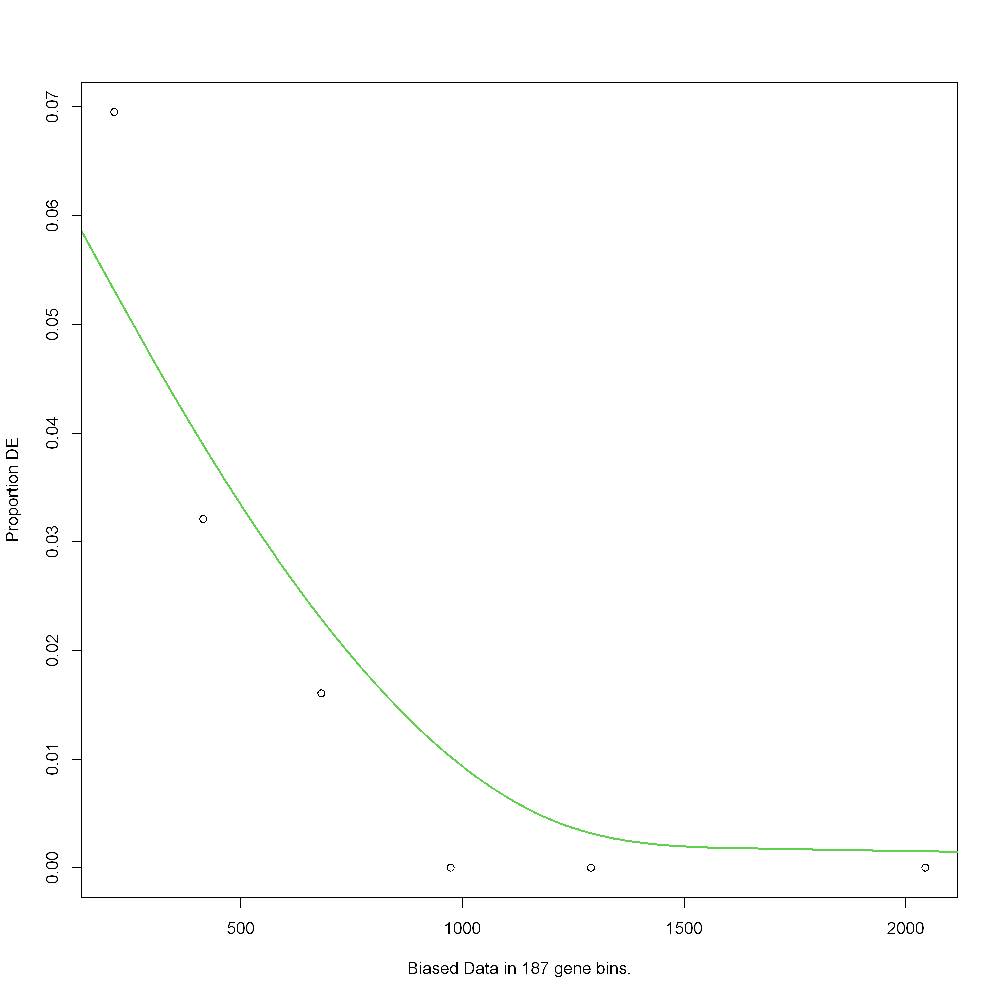

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


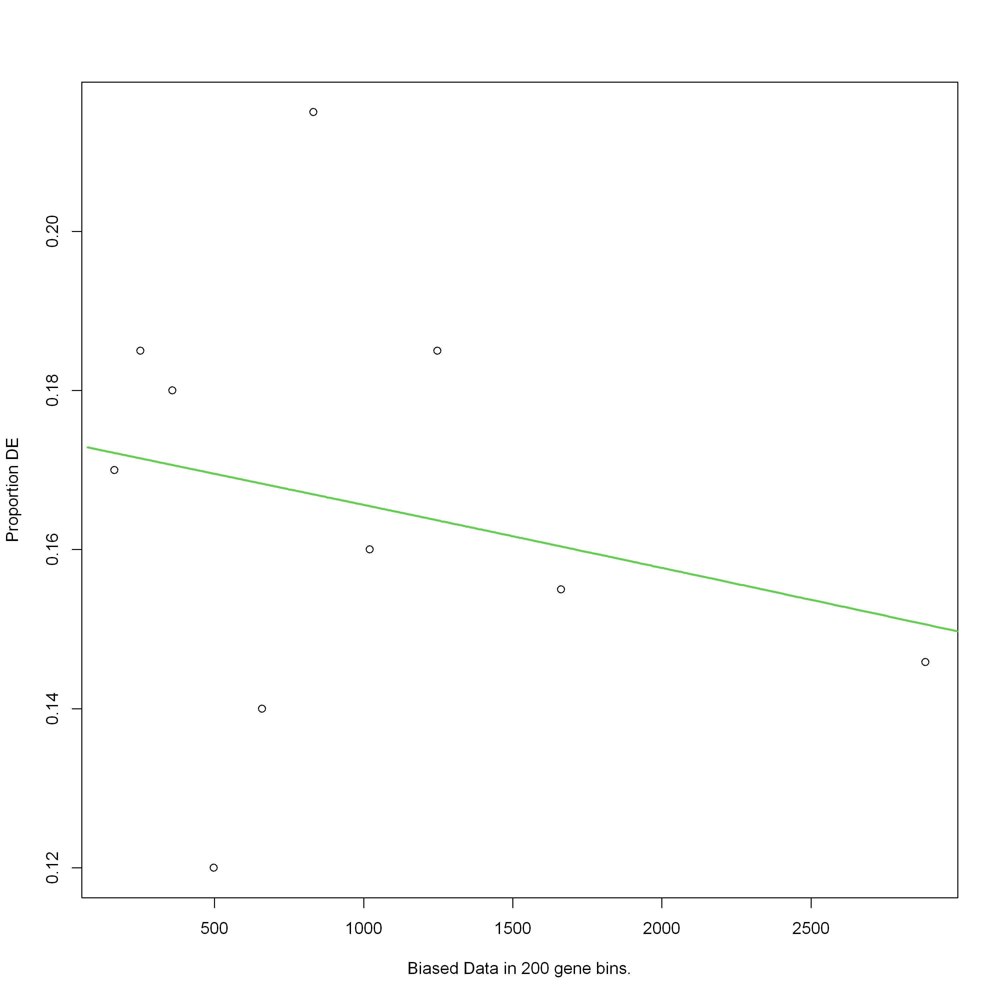

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


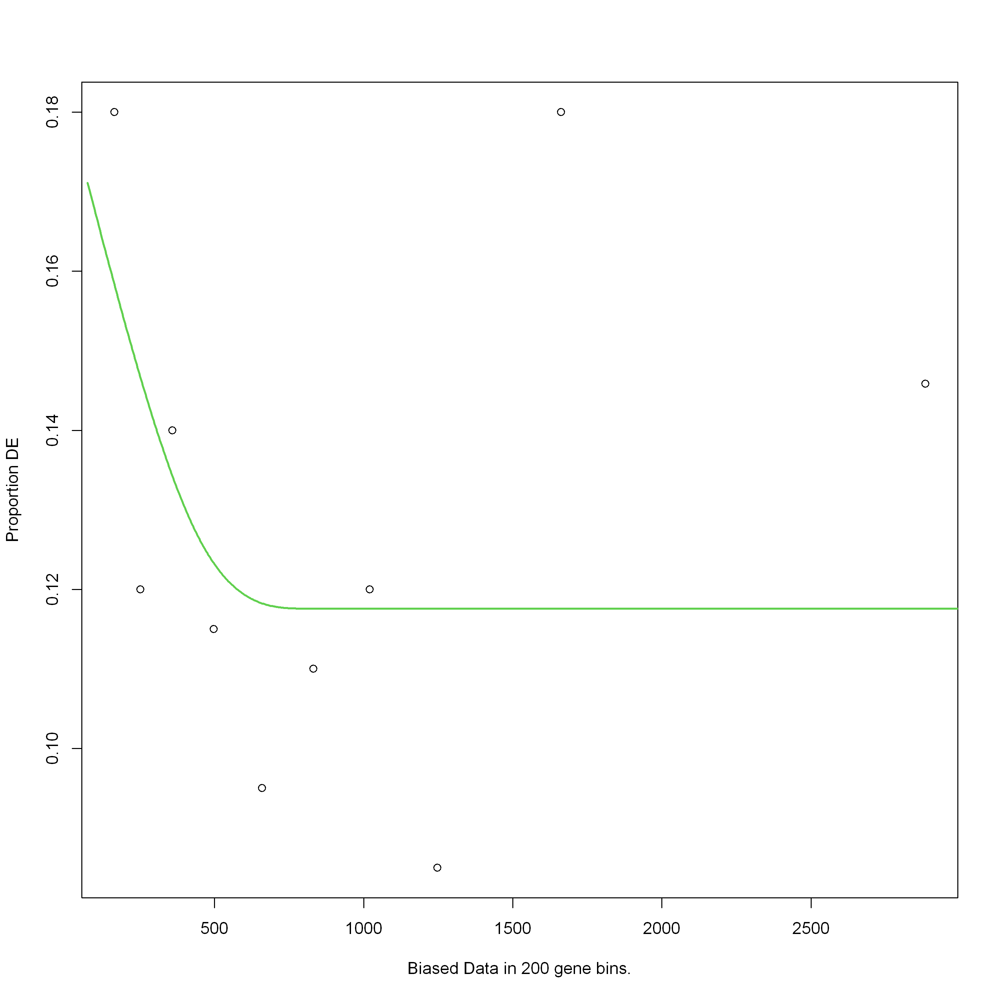

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


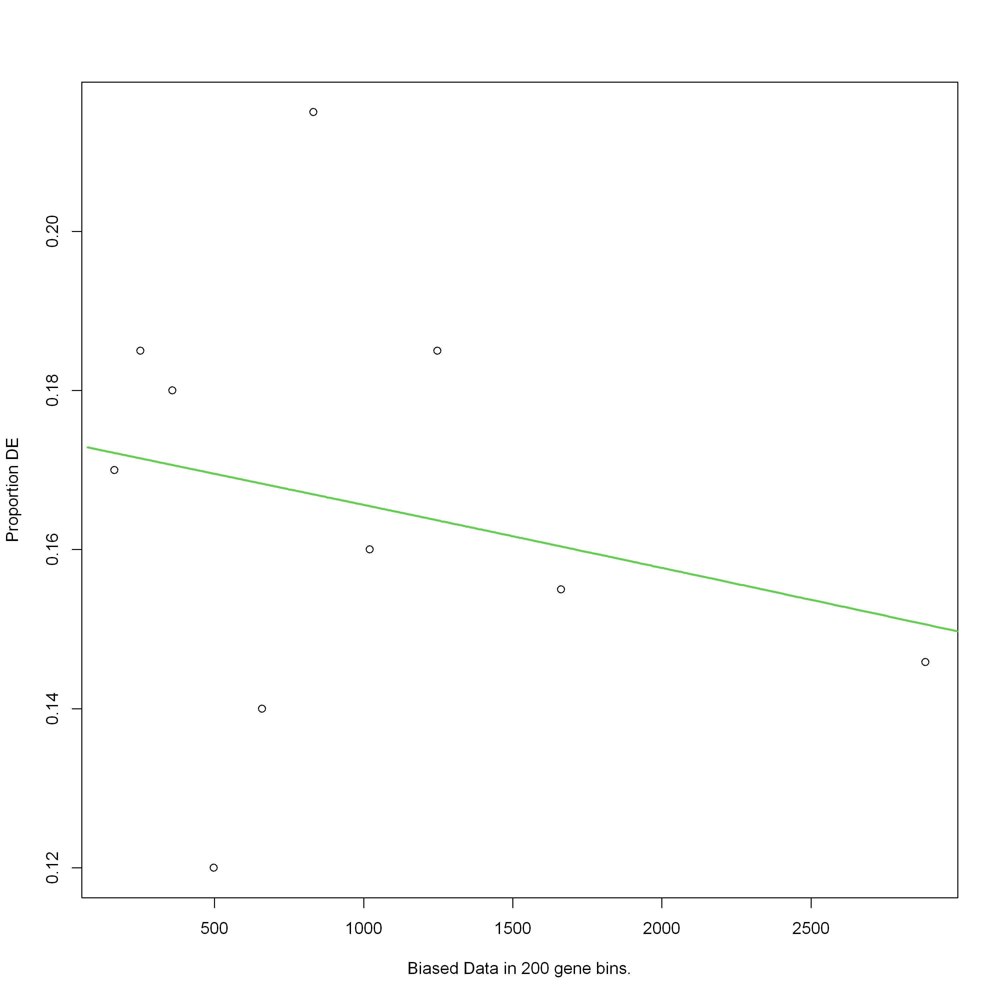

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


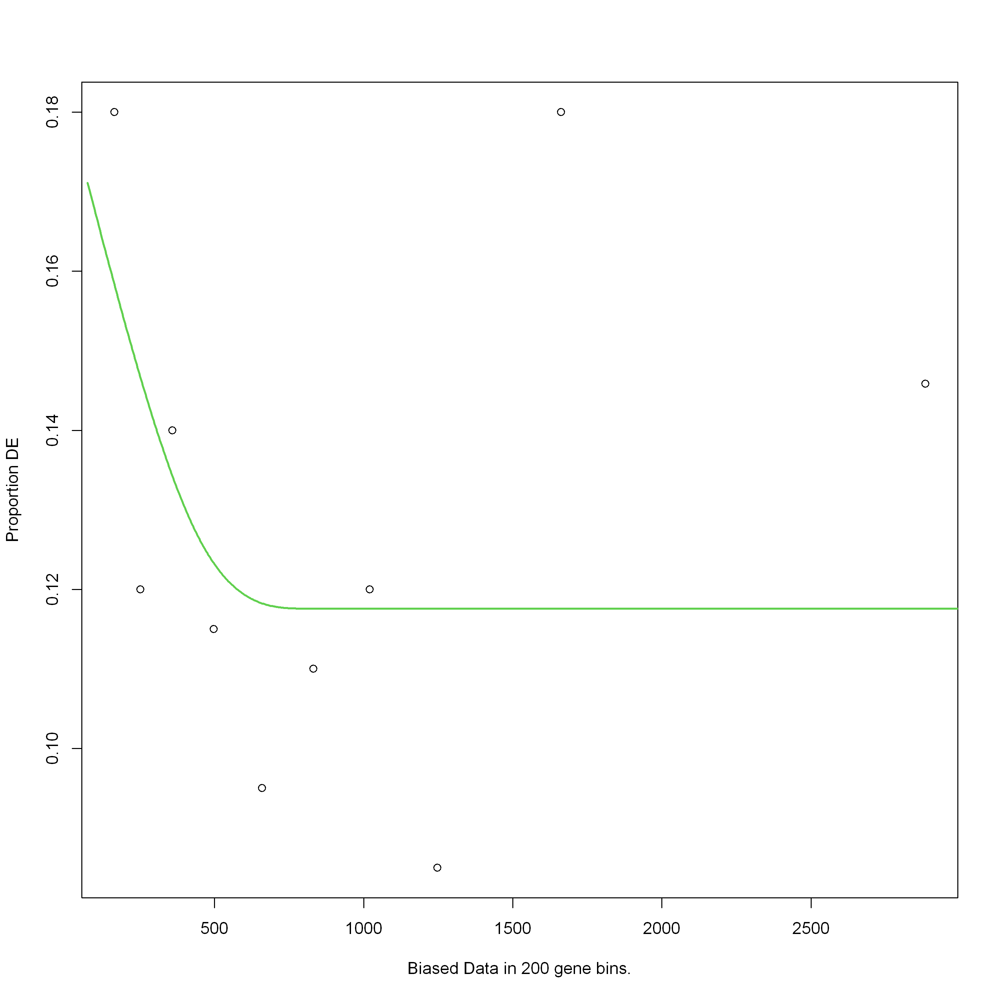

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


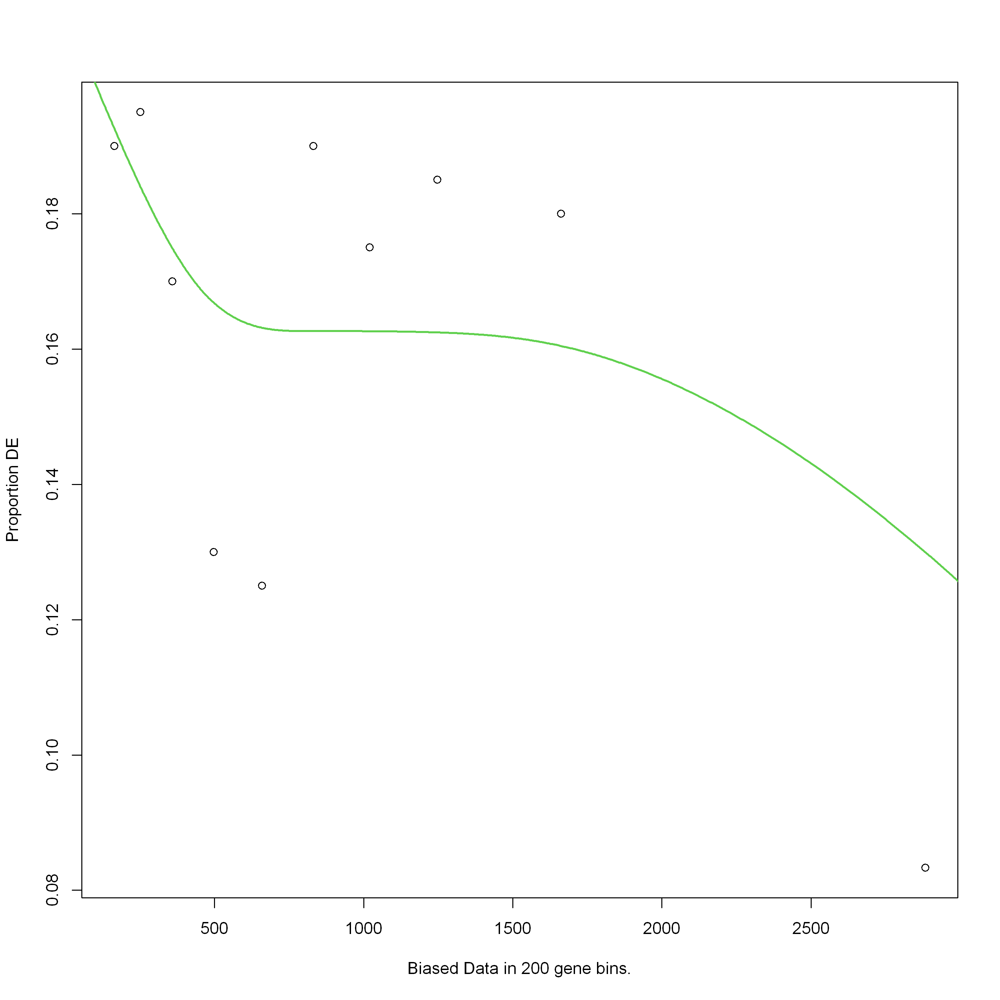

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


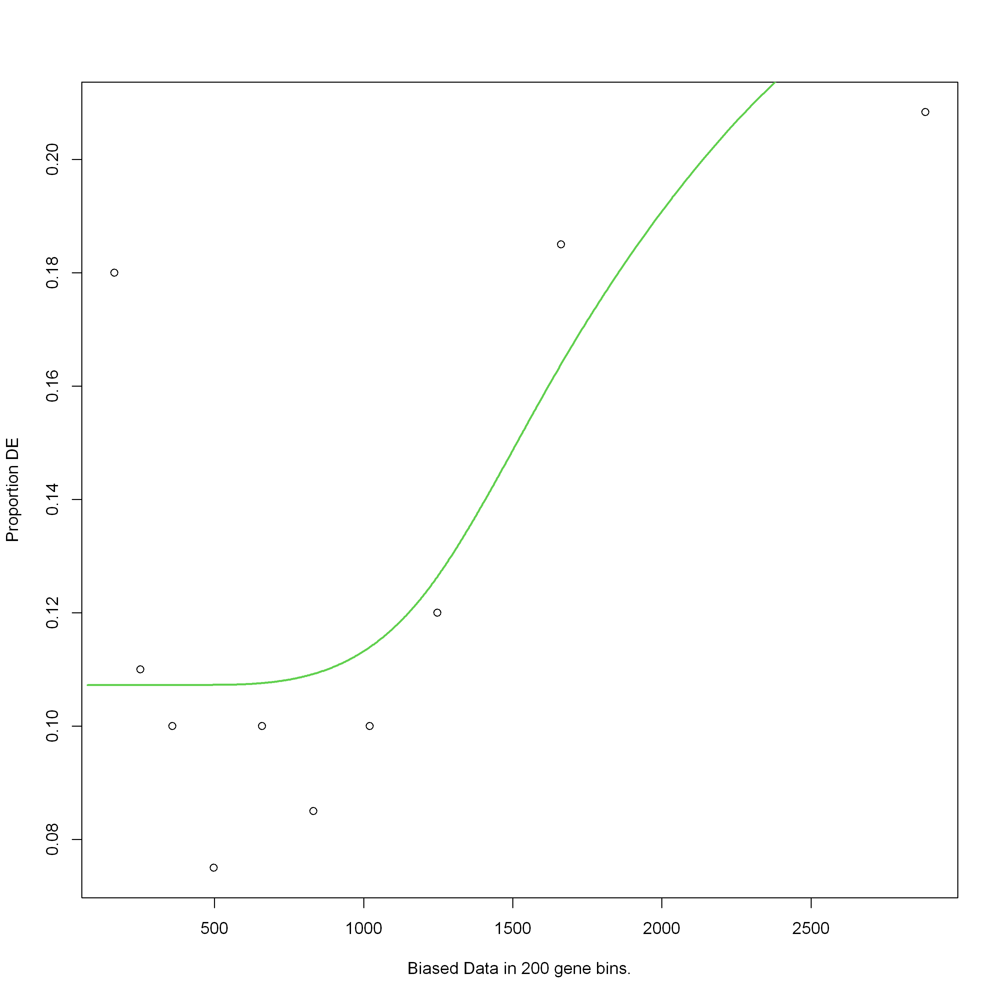

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


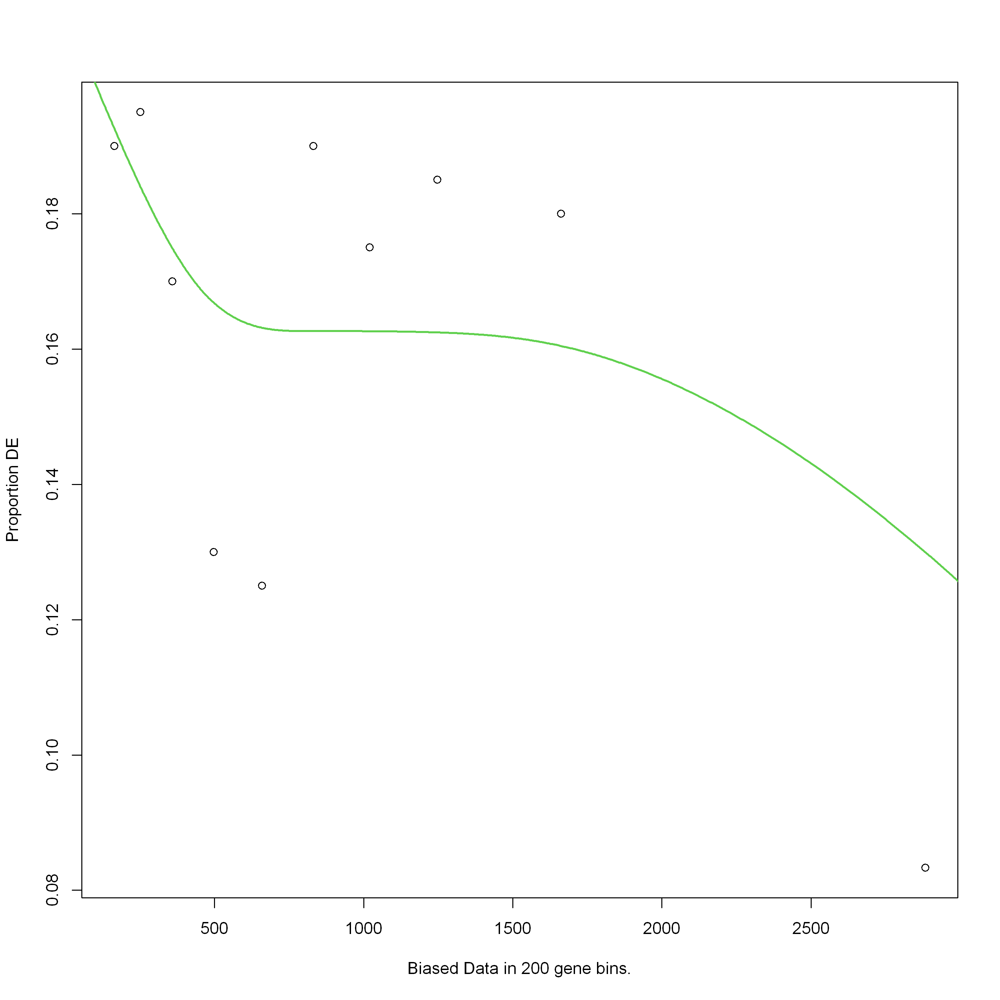

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


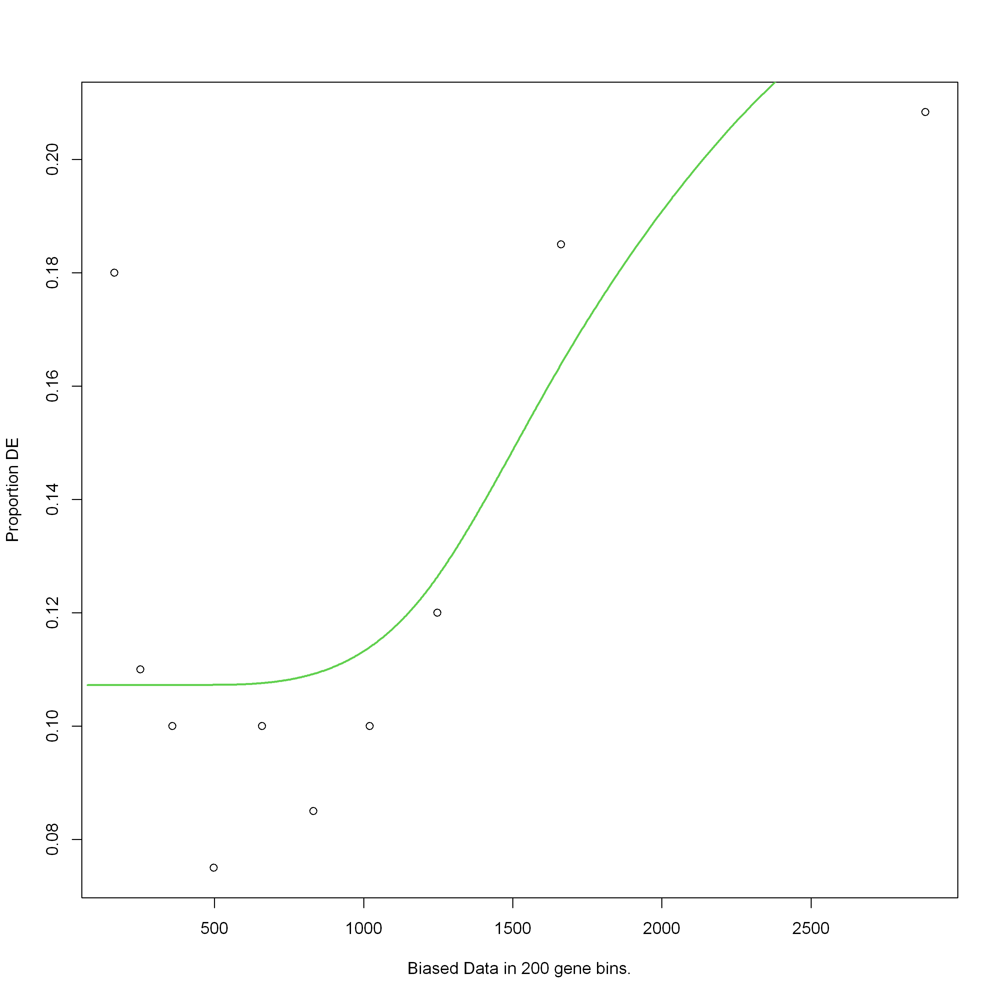

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


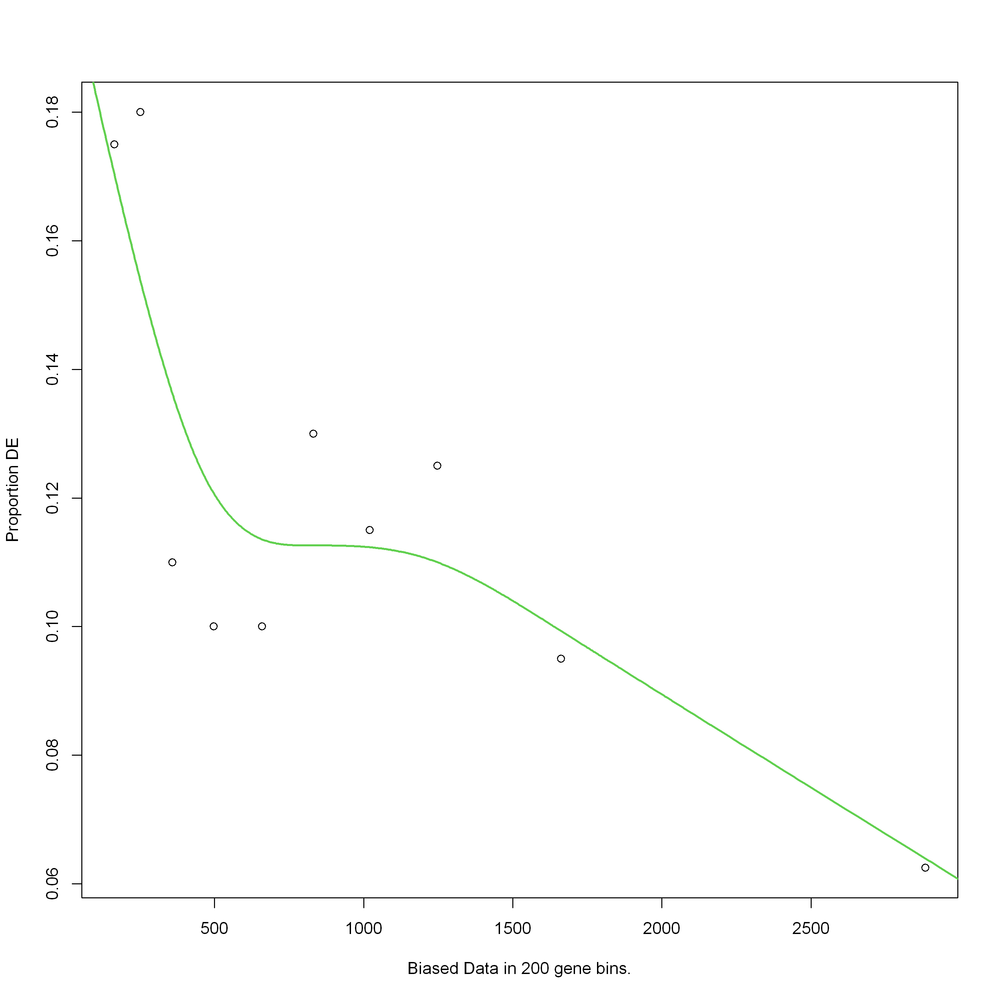

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


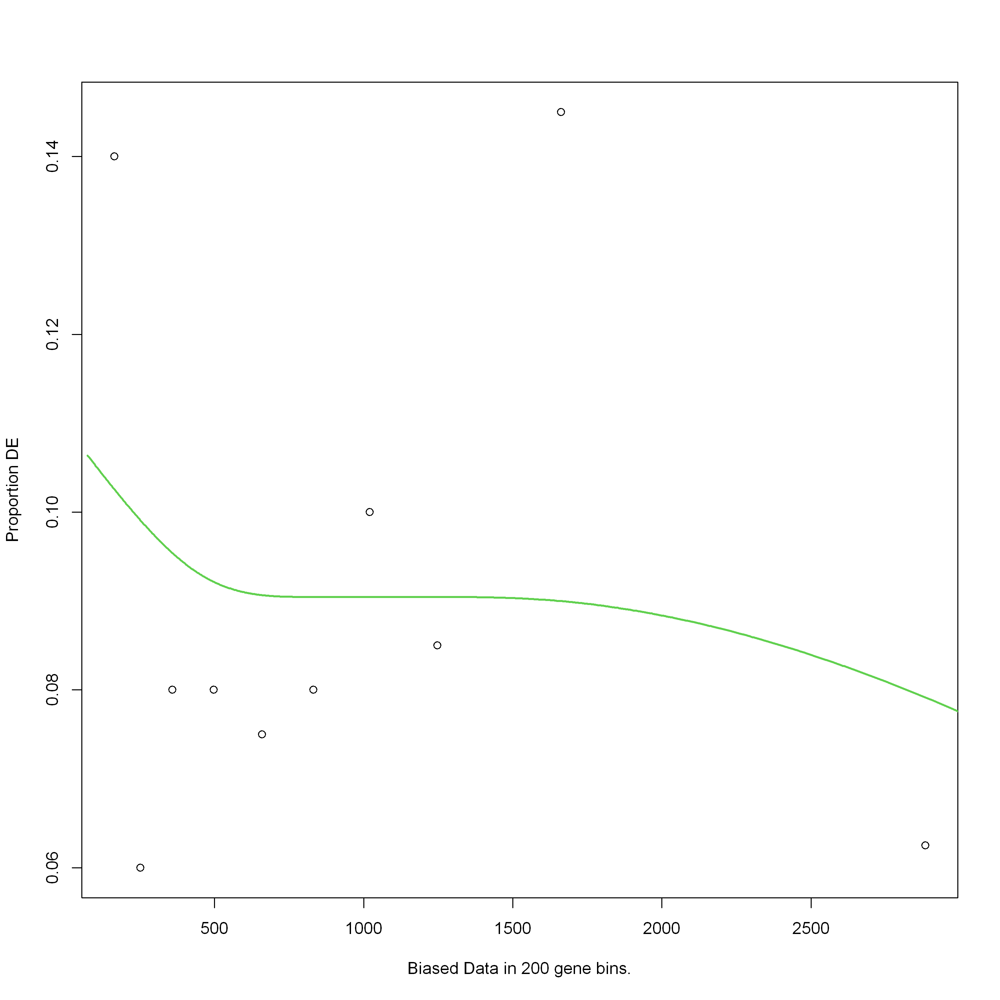

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


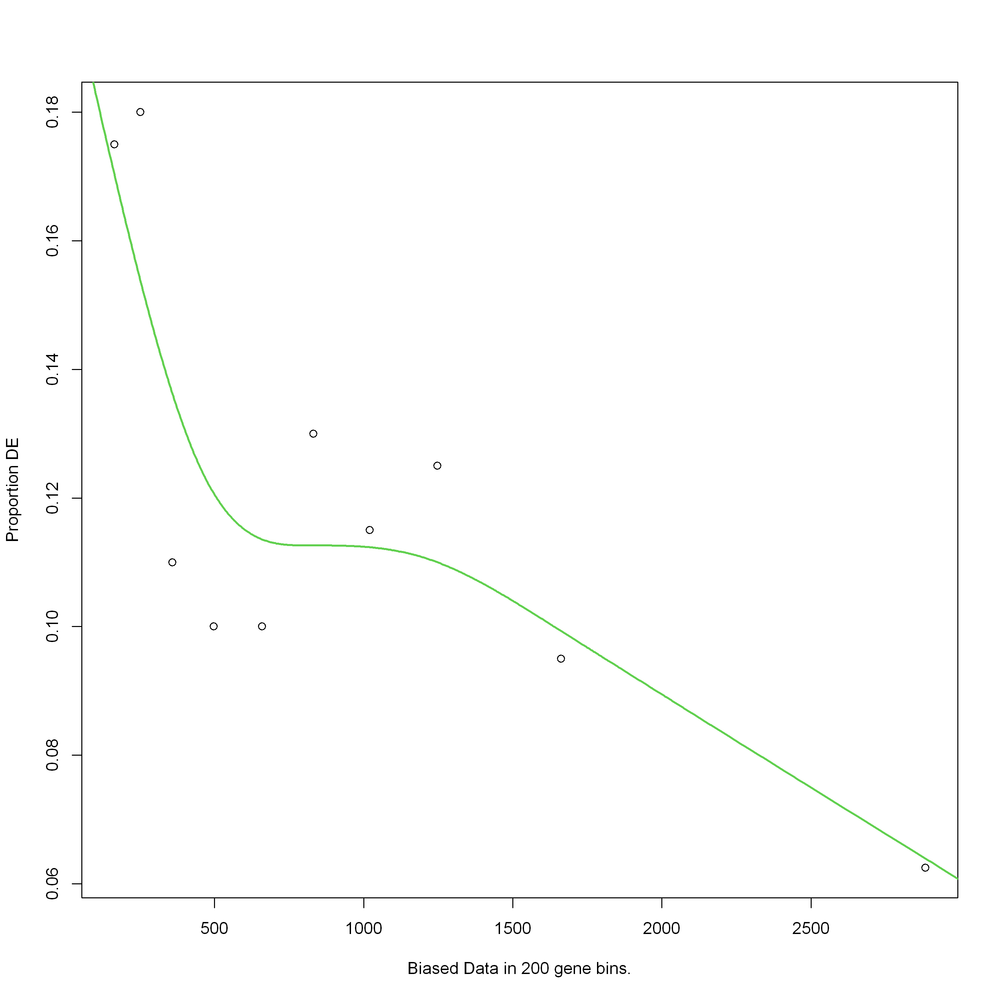

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


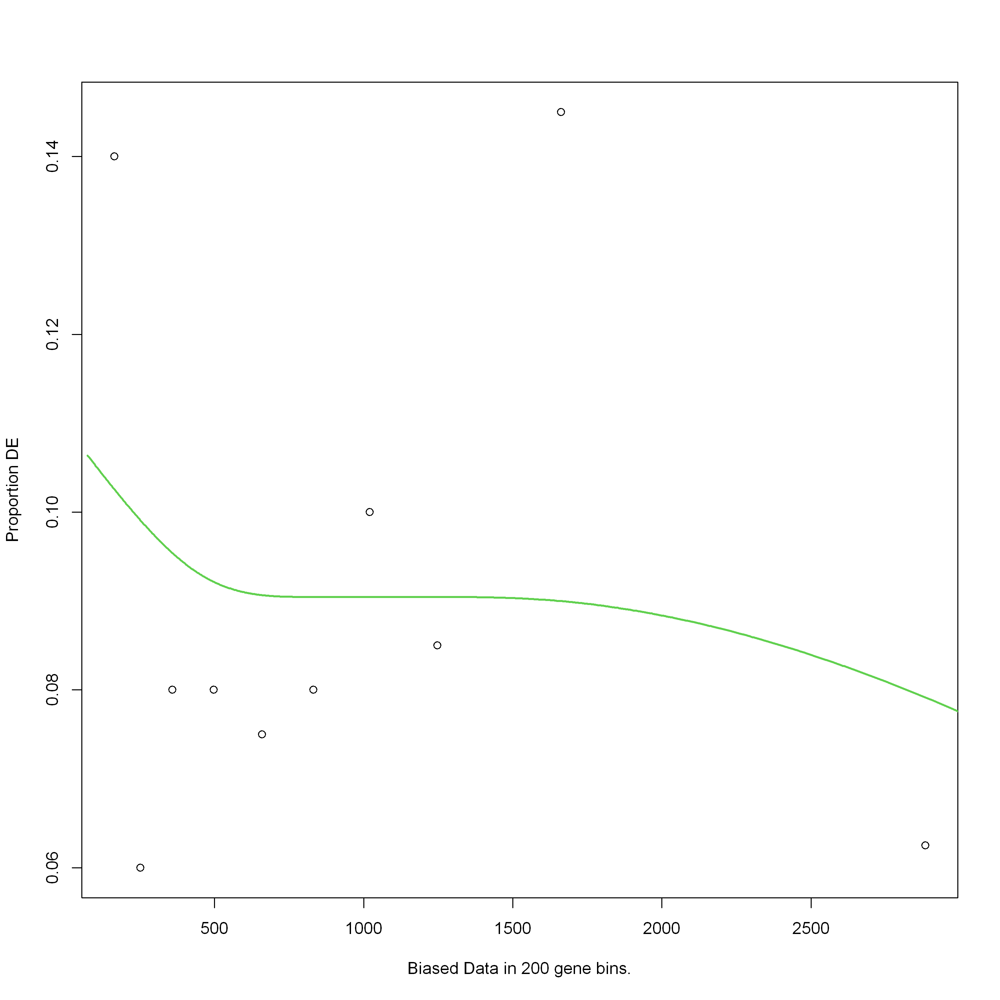

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


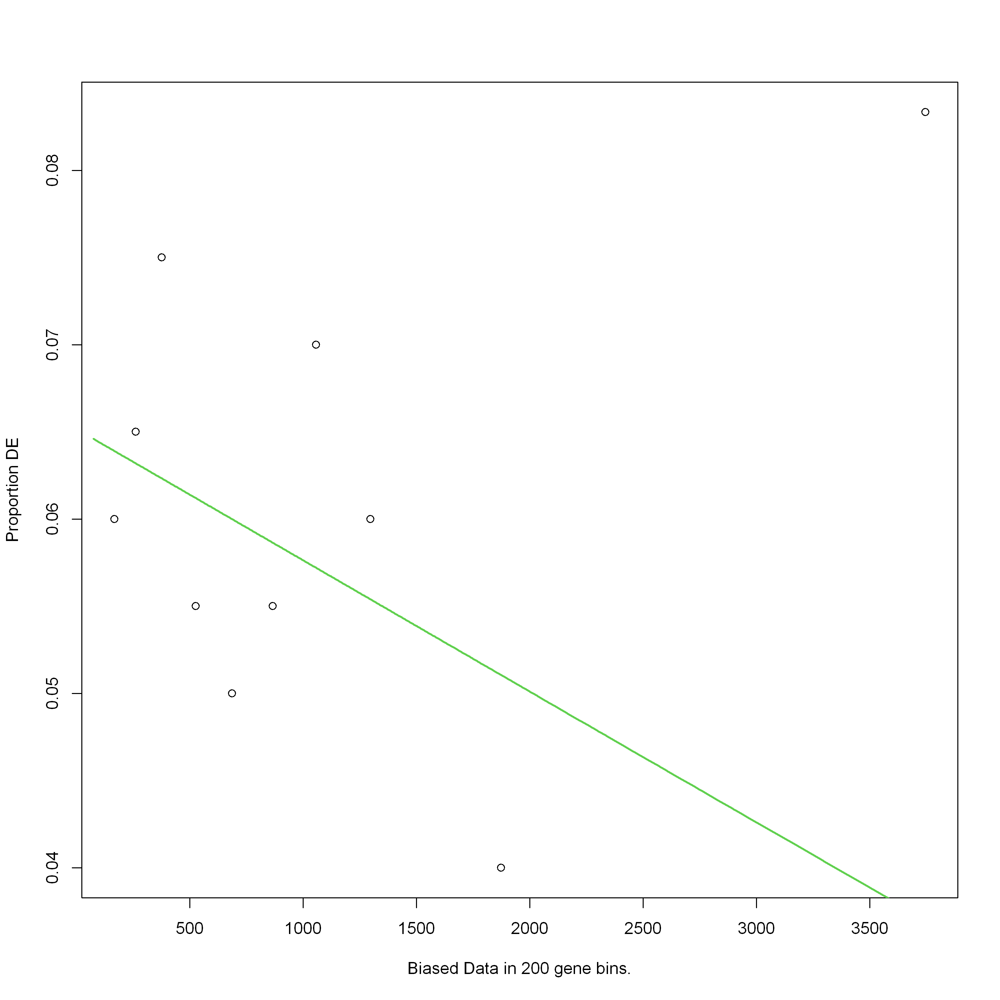

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


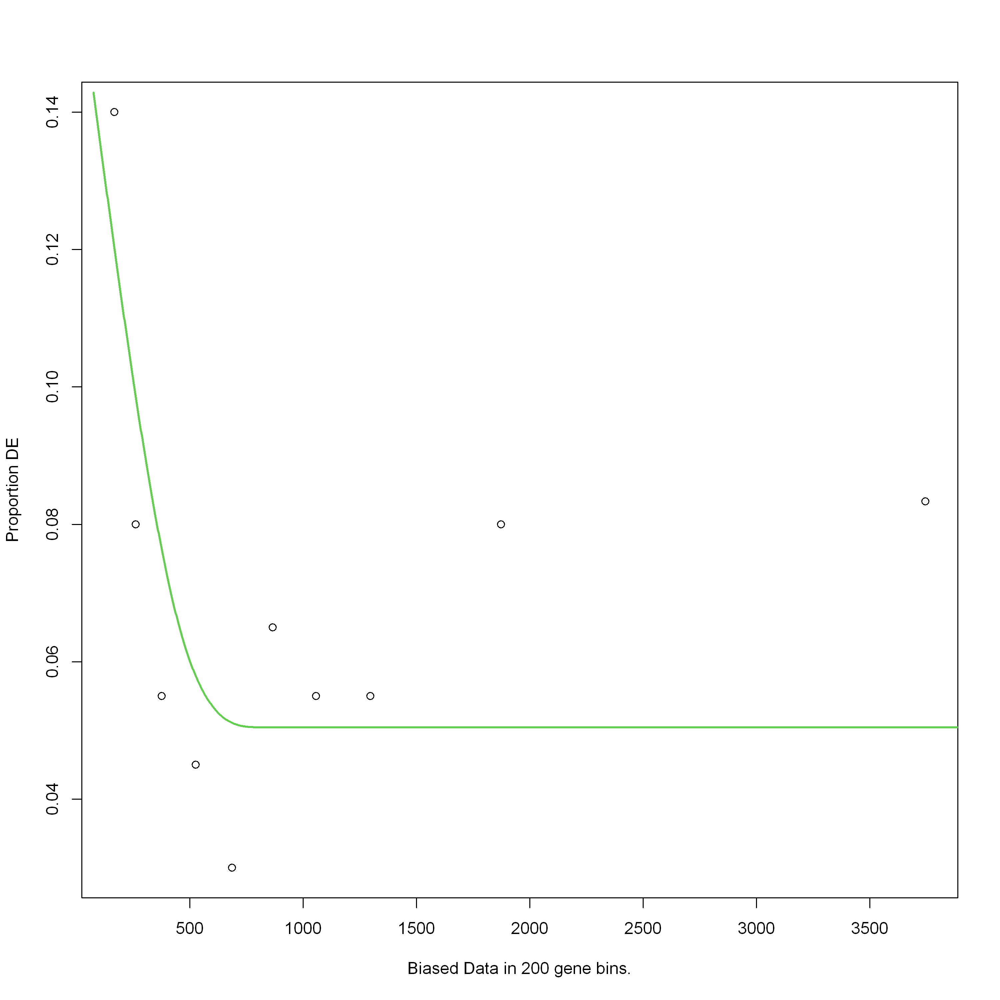

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


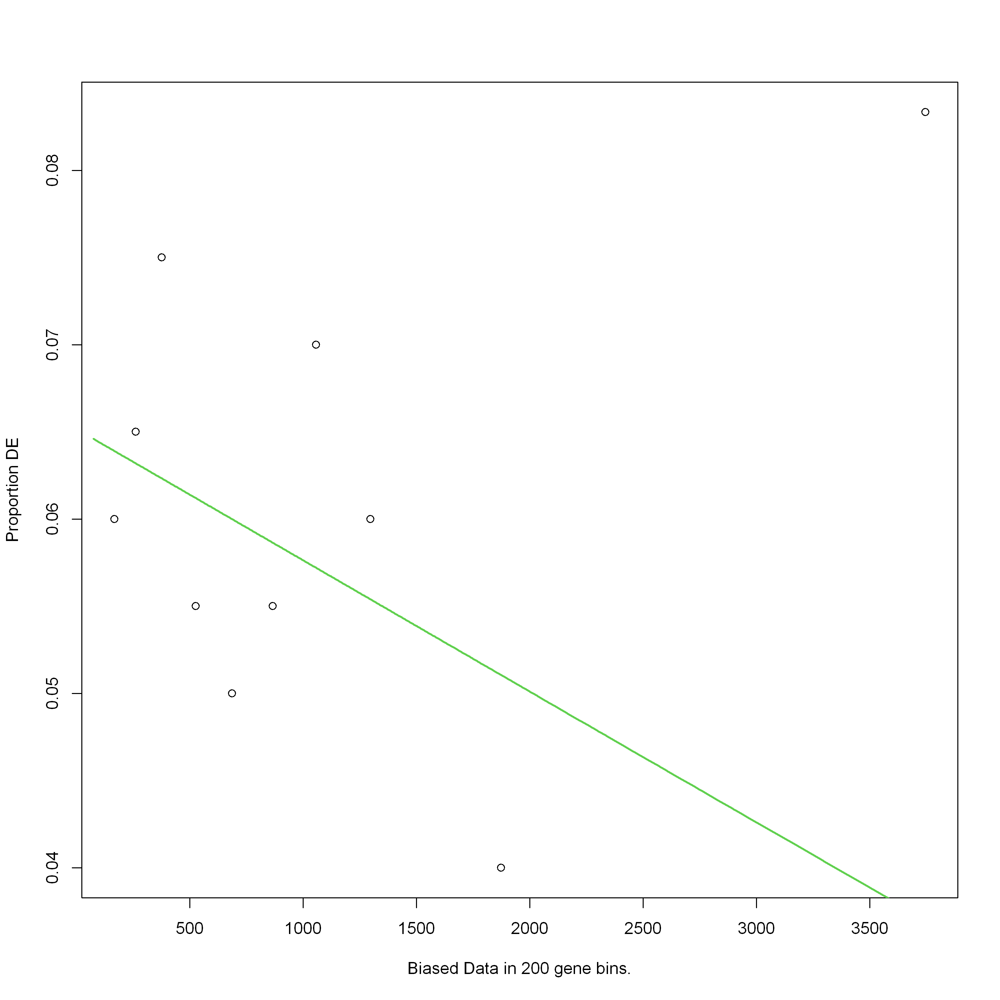

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


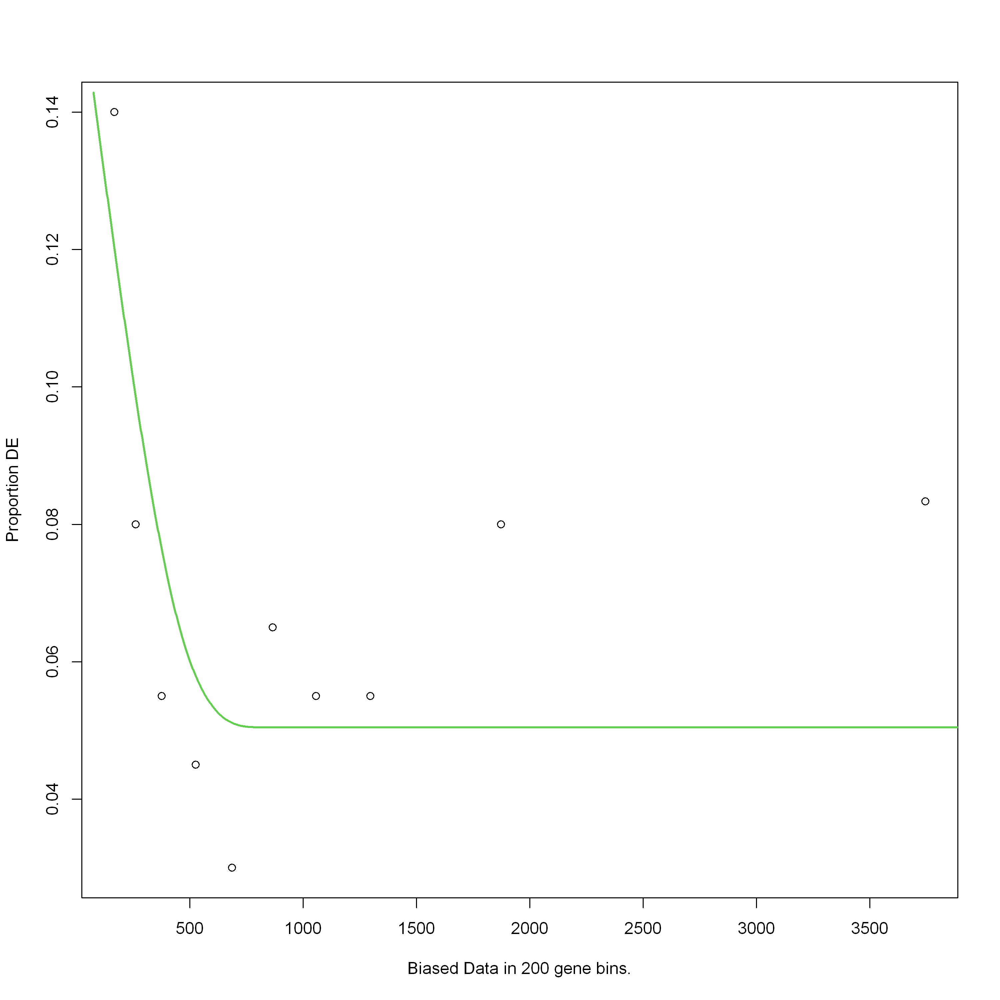

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


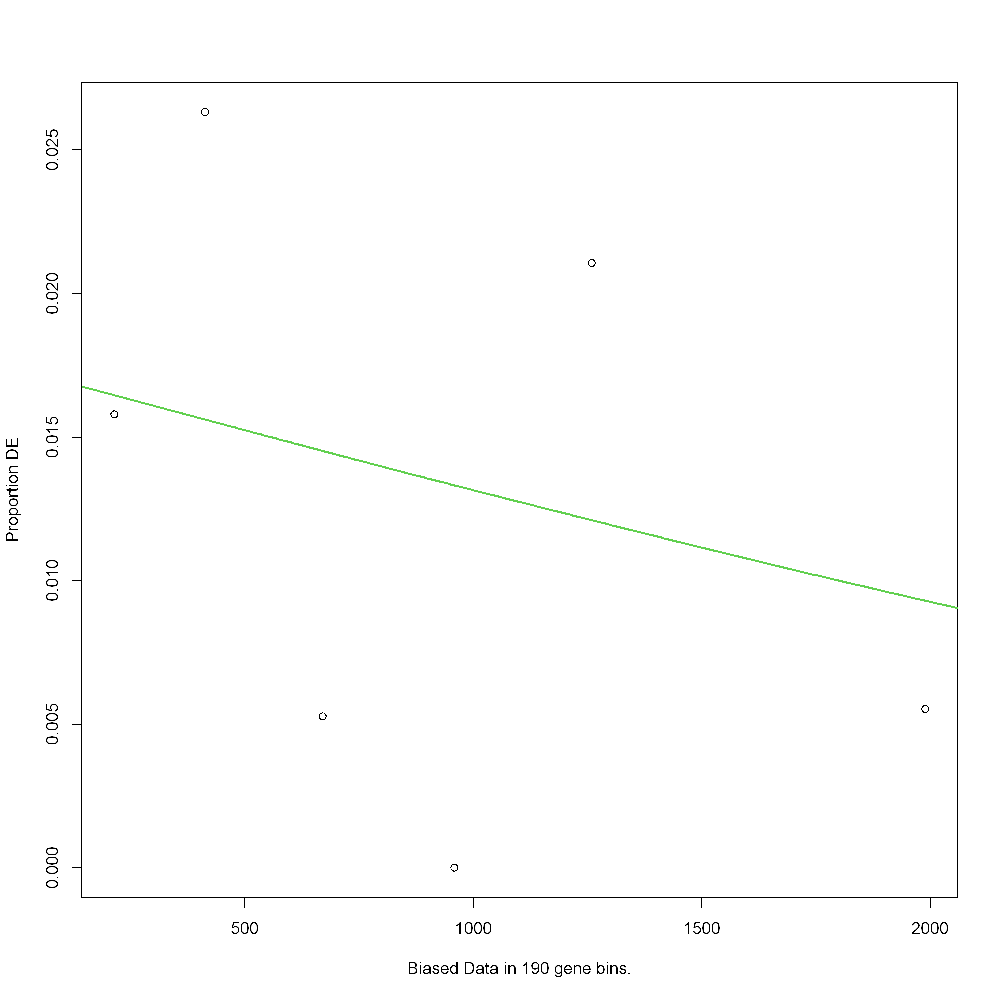

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


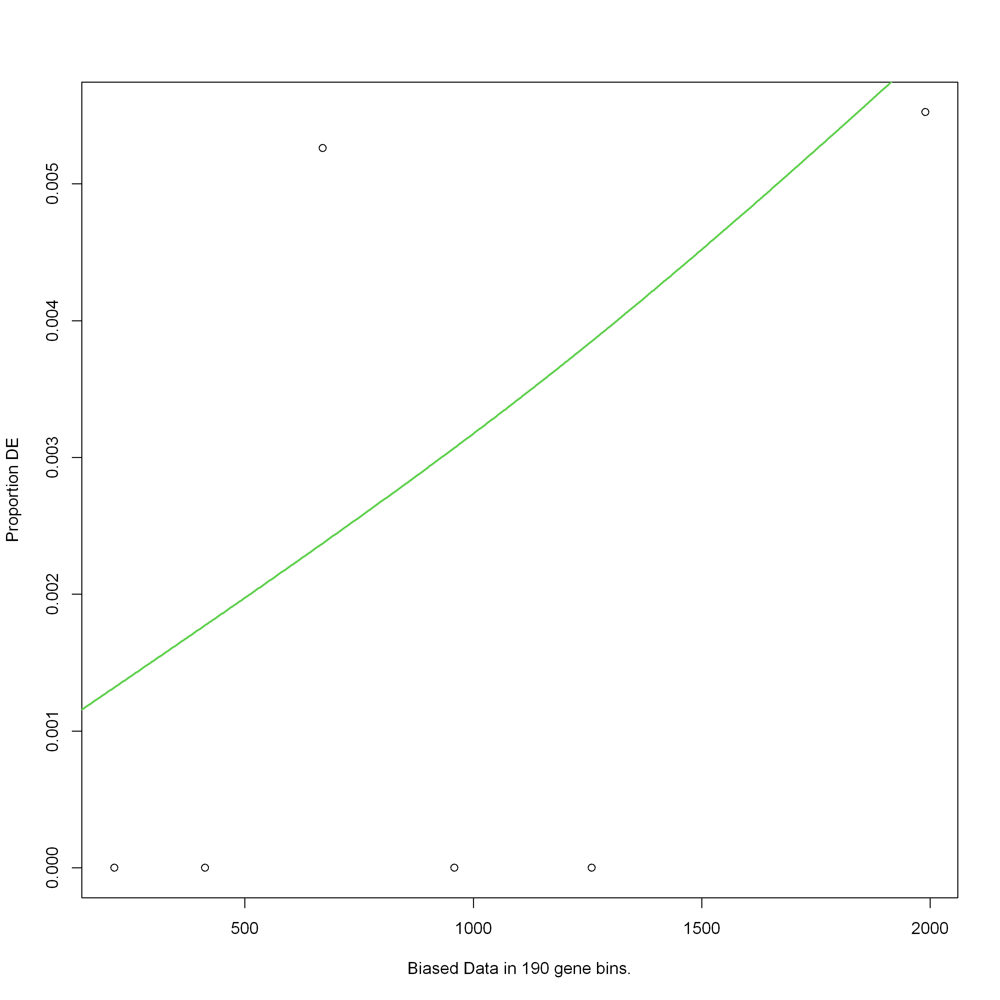

Using manually entered categories.

For 1 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


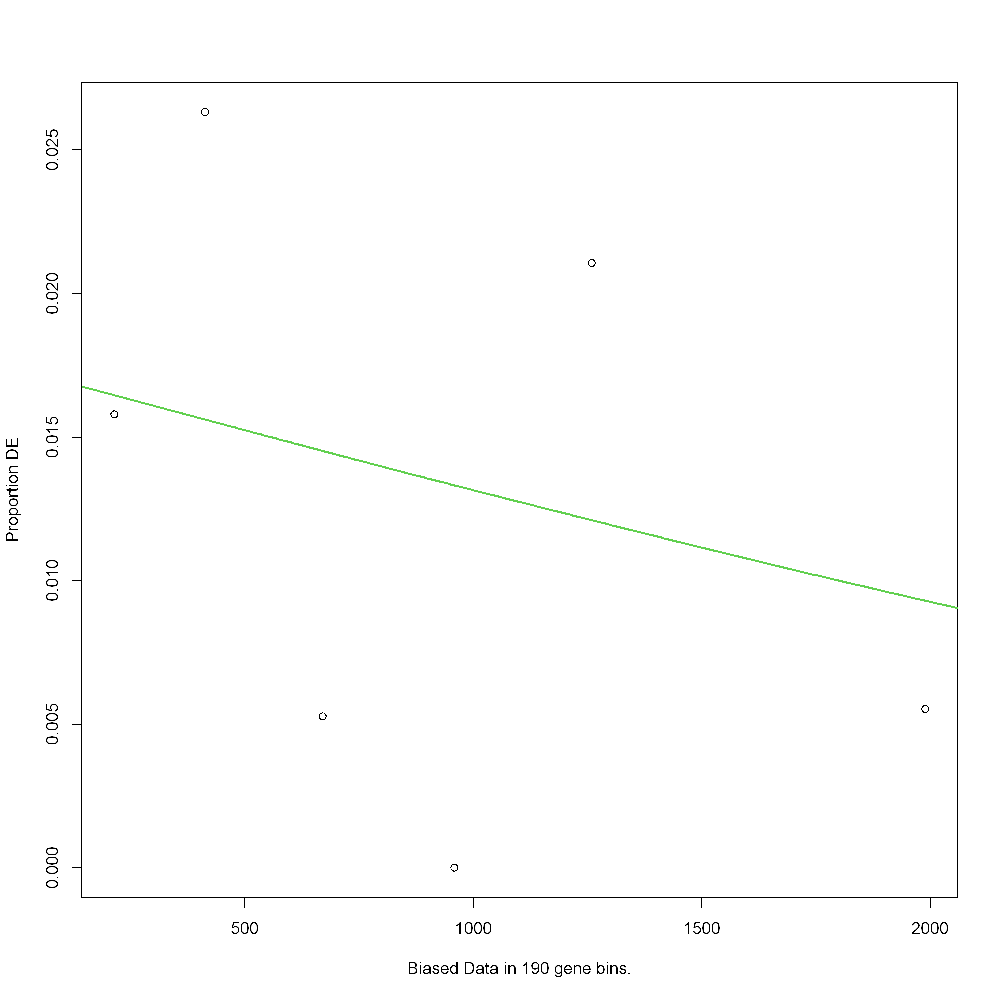

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


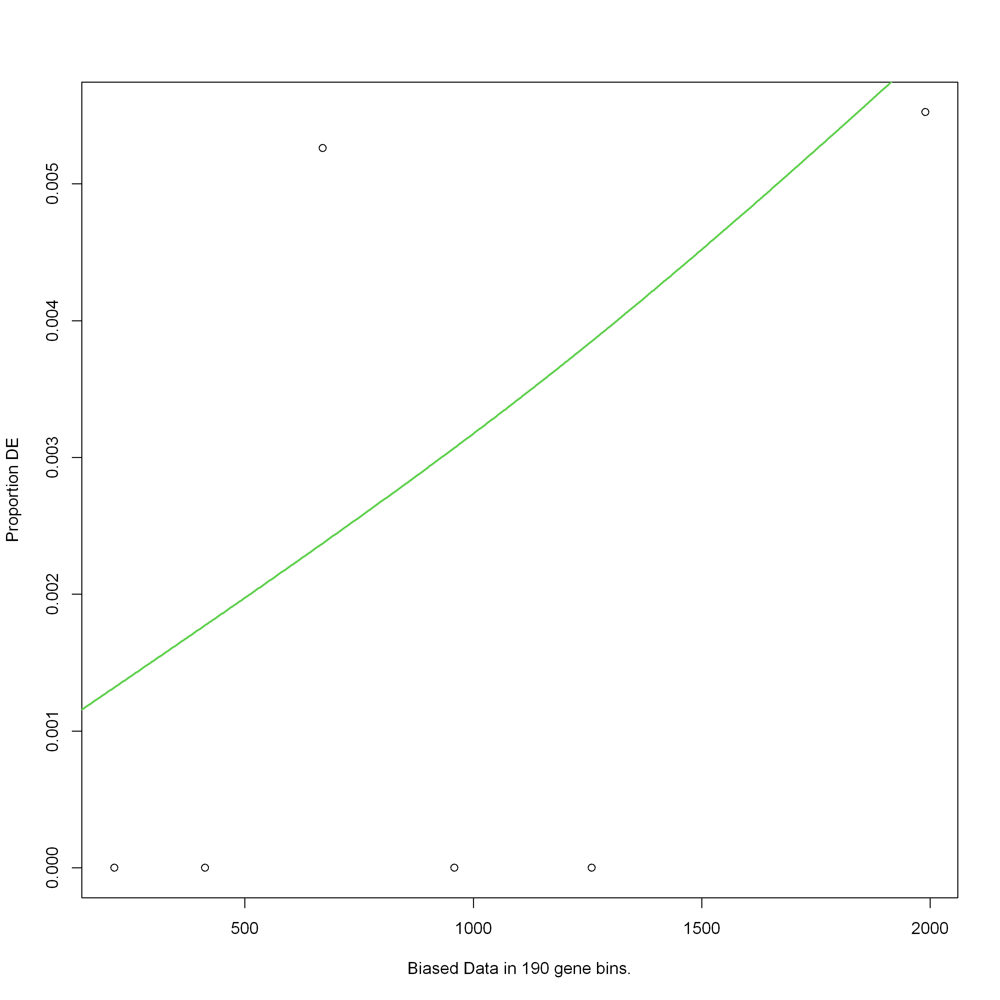

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


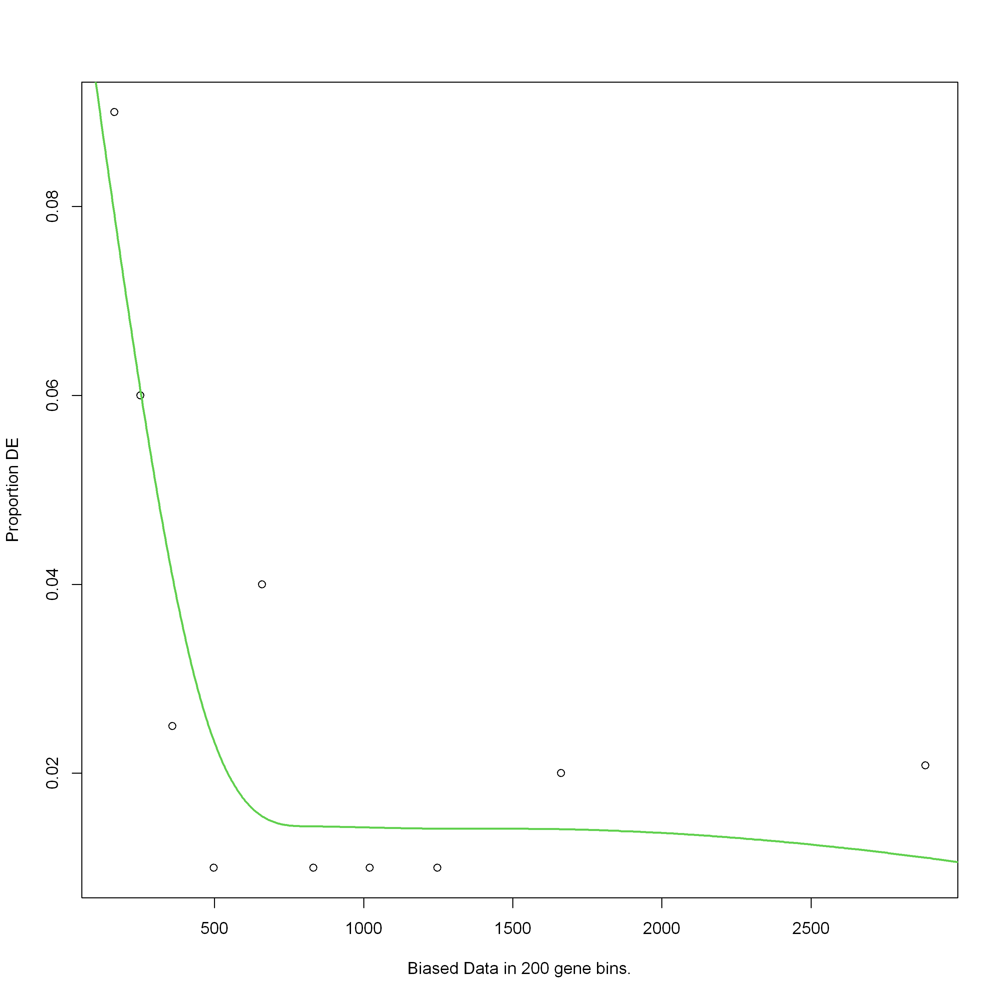

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`
Warning message in pcls(G):
"initial point very close to some inequality constraints"


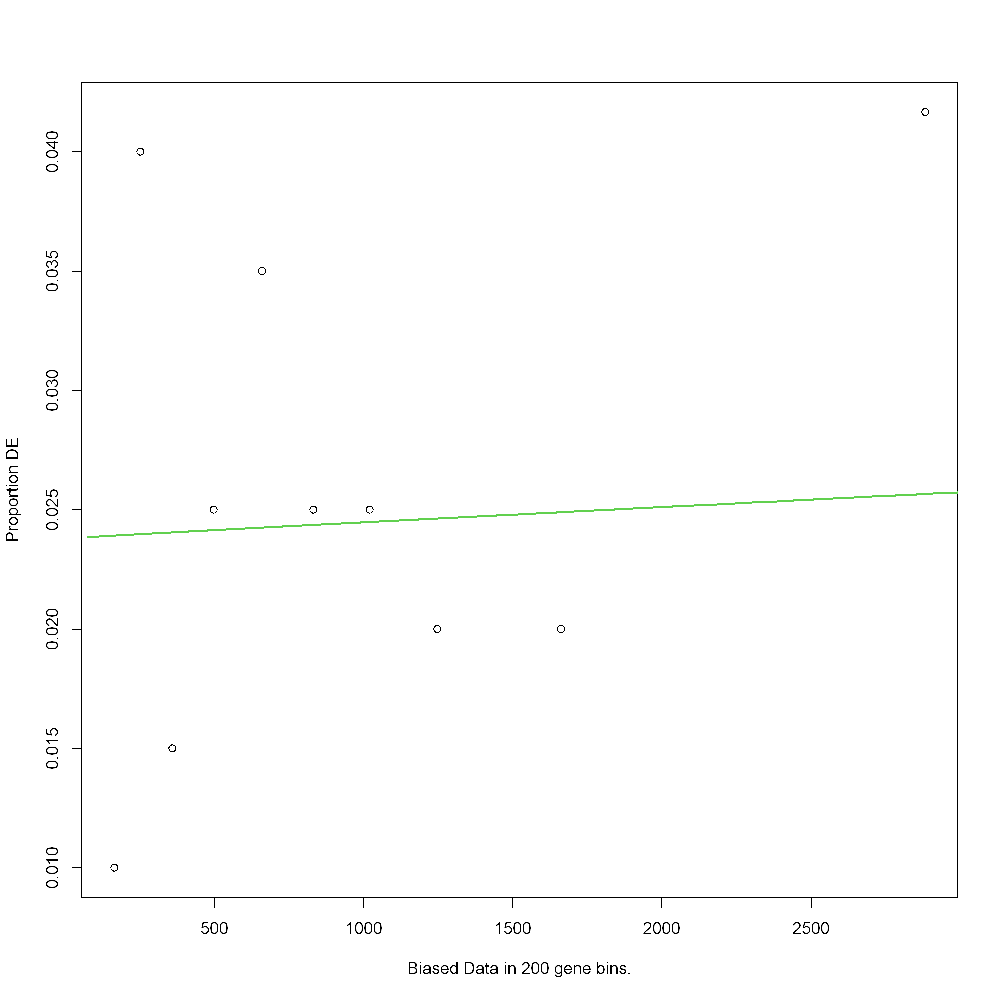

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


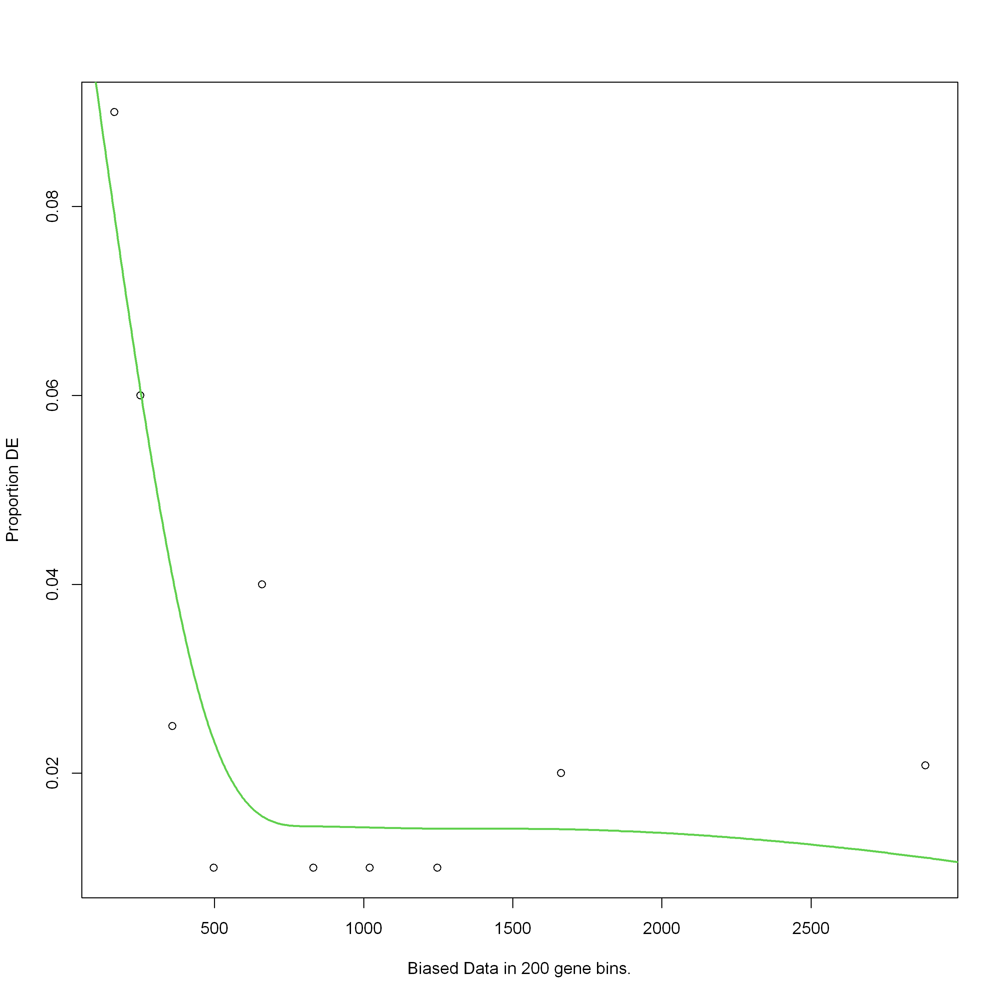

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


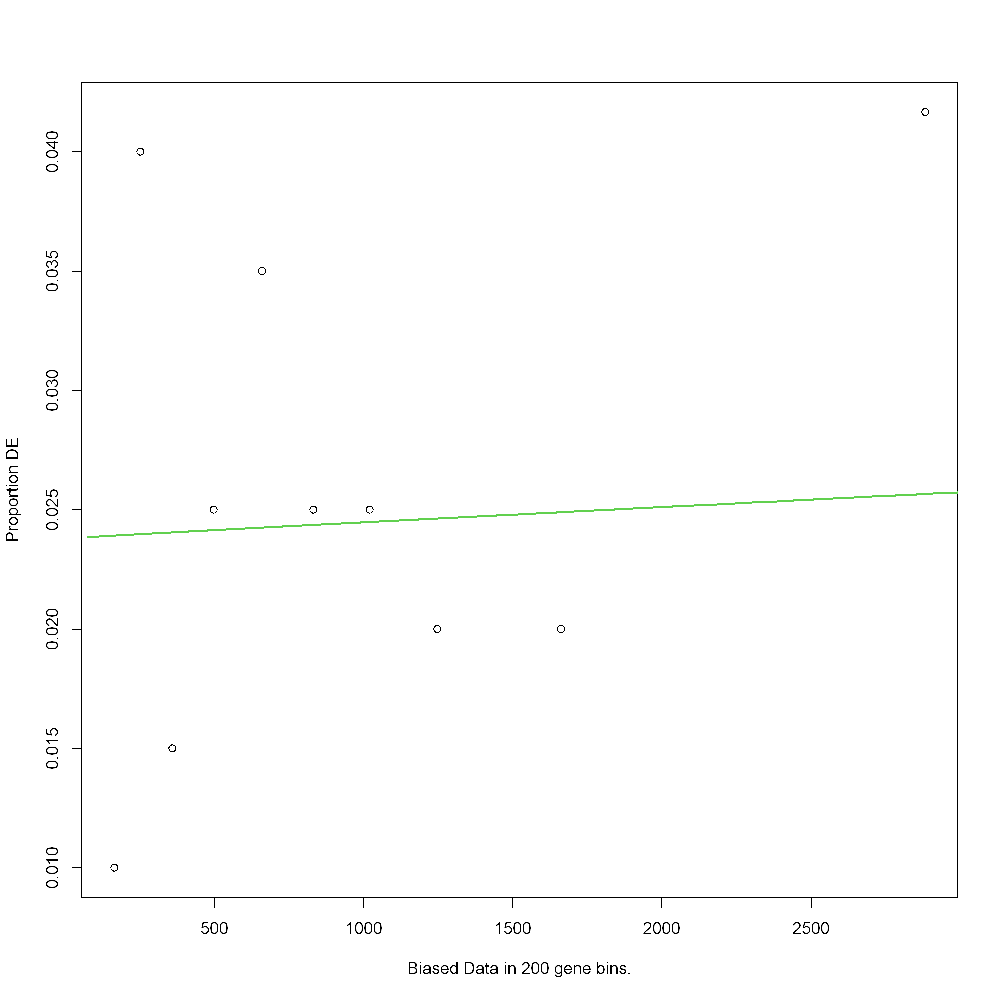

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


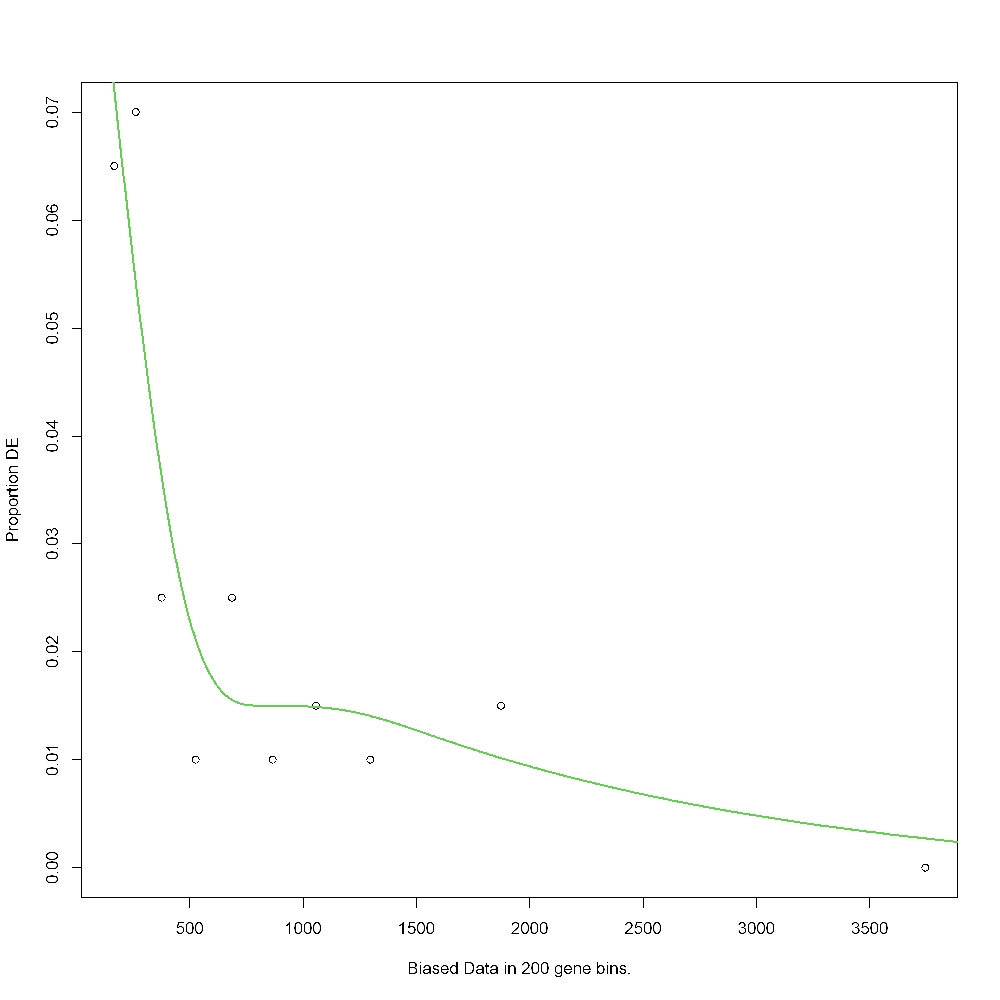

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


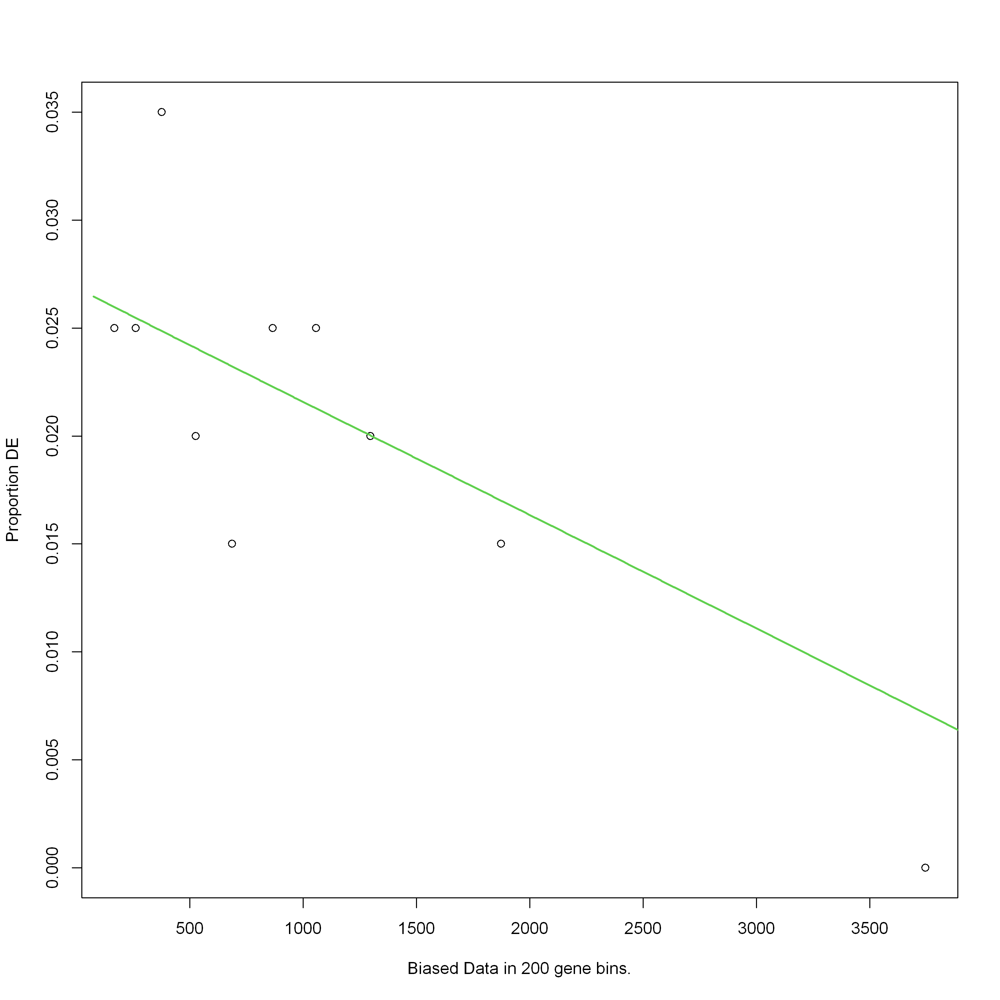

Using manually entered categories.

For 3 genes, we could not find any categories. These genes will be excluded.

To force their use, please run with use_genes_without_cat=TRUE (see documentation).

This was the default behavior for version 1.15.1 and earlier.

Calculating the p-values...

Joining with `by = join_by(category)`


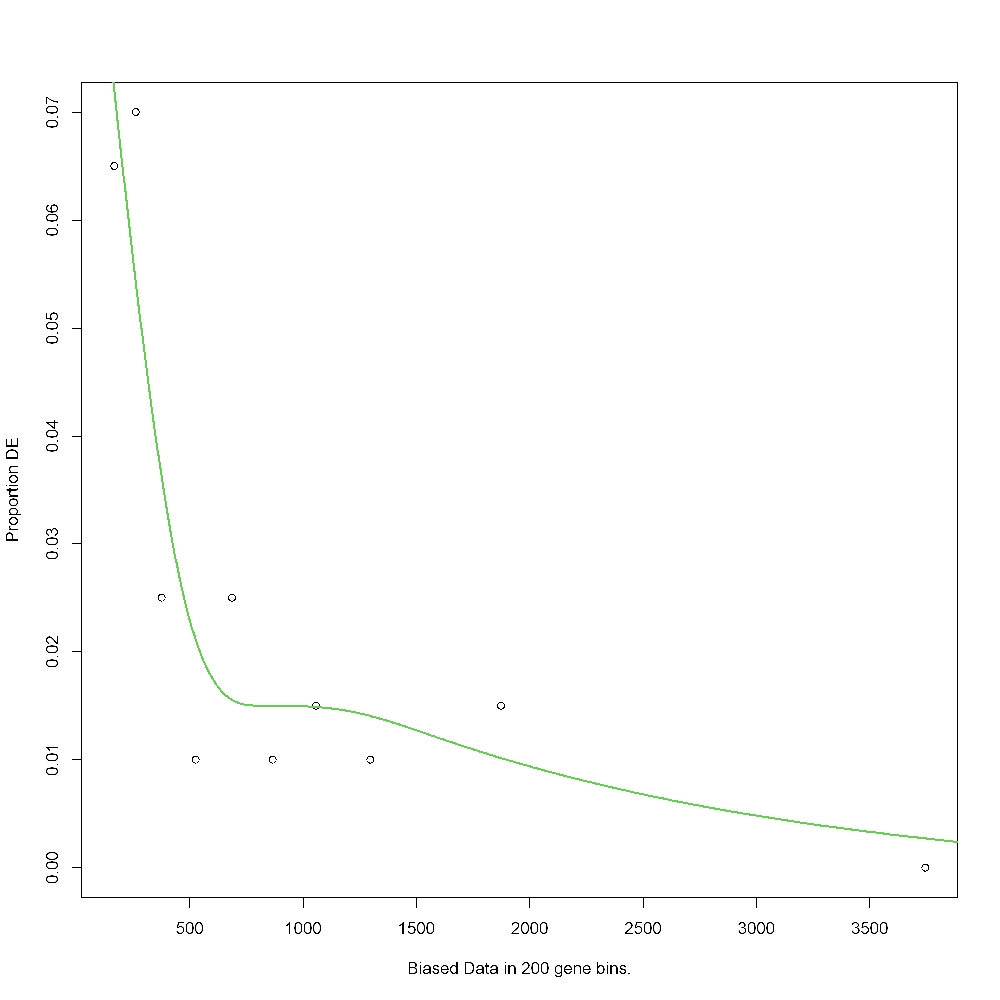

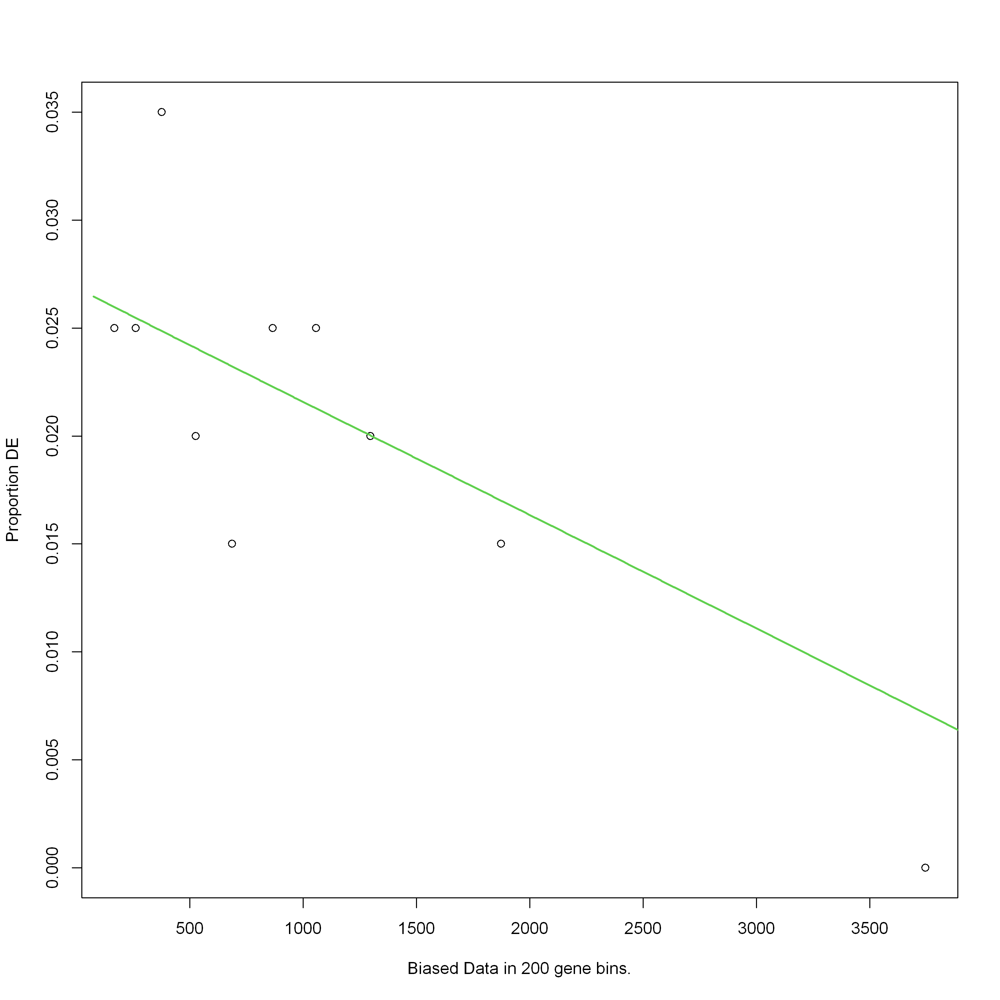

In [128]:
dlist = list()

for (contrastname in unique(df_all$contrast1)) 
{
    for (col in c('sub' ,'path')  #, 'main','ecpath')
             ) 
        {
        for (test in c('down', 'up')) 
            {
              dlist[[length(dlist) + 1]] <- run_enrichment(contrastname, col, test)
        }

    }
}
goseq_res = bind_rows(dlist)


In [129]:
goseq_res = goseq_res %>% 
    extract(PATH, c("pathway"), "^[[:digit:]]* *([^\\[]+) *\\[?", remove = FALSE) %>%
#    extract(main, c("Category"), "^[[:digit:]]* *([^\\[]+) *\\[?", remove = FALSE) %>%
    mutate(pathway = str_replace(pathway, "in photosynthetic organisms", "")) %>%
#    mutate(Category = word(Category)) %>%
    mutate(pathway = str_trim(pathway), #Category = str_trim(Category)
          ) 



In [130]:
goseq_res = goseq_res %>% 
    mutate(pathway = str_trim(pathway), #Category = str_trim(Category)
          ) 



In [131]:
goseq_res

category,PATH,pathway,over_represented_pvalue,padj,under_represented_pvalue,numDEInCat,numInCat,main,Category,type,enrich,contrast,organism
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
09122,09122 Translation,Translation,3.468640e-06,8.671601e-05,0.99999954,12,74,09120 Genetic Information Processing,Genetic,down,sub,C2vsC1_prot,MED4
09182,09182 Protein families: genetic information processing,Protein families: genetic information processing,6.472609e-04,8.090761e-03,0.99979043,20,275,09180 Brite Hierarchies,Brite,down,sub,C2vsC1_prot,MED4
09181,09181 Protein families: metabolism,Protein families: metabolism,1.931965e-01,1.000000e+00,0.89933685,8,156,09180 Brite Hierarchies,Brite,down,sub,C2vsC1_prot,MED4
09109,09109 Metabolism of terpenoids and polyketides,Metabolism of terpenoids and polyketides,2.281498e-01,1.000000e+00,0.94139128,2,25,09100 Metabolism,Metabolism,down,sub,C2vsC1_prot,MED4
09132,09132 Signal transduction,Signal transduction,2.464371e-01,1.000000e+00,0.93320307,2,27,09130 Environmental Information Processing,Environmental,down,sub,C2vsC1_prot,MED4
09192,09192 Unclassified: genetic information processing,Unclassified: genetic information processing,2.949852e-01,1.000000e+00,0.95660575,1,10,09190 Not Included in Pathway or Brite,Not,down,sub,C2vsC1_prot,MED4
09102,09102 Energy metabolism,Energy metabolism,3.137854e-01,1.000000e+00,0.83760707,5,105,09100 Metabolism,Metabolism,down,sub,C2vsC1_prot,MED4
09101,09101 Carbohydrate metabolism,Carbohydrate metabolism,4.243862e-01,1.000000e+00,0.76857674,4,90,09100 Metabolism,Metabolism,down,sub,C2vsC1_prot,MED4
09191,09191 Unclassified: metabolism,Unclassified: metabolism,5.224226e-01,1.000000e+00,0.75324091,2,50,09190 Not Included in Pathway or Brite,Not,down,sub,C2vsC1_prot,MED4


In [132]:
sub2path = kegg_df %>% select(sub, path) %>% distinct() 
goseq_res = left_join(goseq_res, sub2path, by=c(PATH='path')) %>% mutate(sub = if_else(is.na(sub), PATH, sub))

In [133]:
goseq_res = goseq_res %>% 
    extract(sub, c("module"), "^[[:digit:]]* *([^\\[]+) *\\[?", remove = FALSE) %>%
    mutate(module = str_replace(module, "in photosynthetic organisms", "")) %>%
    mutate(module = str_replace(module, "metabolism", "")) %>%
    mutate(module = str_replace(module, "Biosynthesis of", "")) %>%
    mutate(module = str_replace(module, "Metabolism of", "")) %>%
    mutate(module = str_replace(module, "biosynthesis", "")) %>%
    mutate(module = str_trim(module)) 



In [134]:
goseq_res = goseq_res %>% 
    separate_wider_delim(contrast, "_", names = c(NA, "Assay"), cols_remove = FALSE) %>%
    mutate(Group = case_when(
        str_detect(contrast, "C1")~ "Coculture",   
        str_detect(contrast, "3|5")~ "Axenic late", 
        TRUE~ "Axenic"
    )) 


In [135]:
t(head(goseq_res))

category,09122,09182,09181,09109,09132,09192
PATH,09122 Translation,09182 Protein families: genetic information processing,09181 Protein families: metabolism,09109 Metabolism of terpenoids and polyketides,09132 Signal transduction,09192 Unclassified: genetic information processing
pathway,Translation,Protein families: genetic information processing,Protein families: metabolism,Metabolism of terpenoids and polyketides,Signal transduction,Unclassified: genetic information processing
over_represented_pvalue,3.468640e-06,6.472609e-04,1.931965e-01,2.281498e-01,2.464371e-01,2.949852e-01
padj,8.671601e-05,8.090761e-03,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
under_represented_pvalue,0.9999995,0.9997904,0.8993369,0.9413913,0.9332031,0.9566058
numDEInCat,12,20,8,2,2,1
numInCat,74,275,156,25,27,10
main,09120 Genetic Information Processing,09180 Brite Hierarchies,09180 Brite Hierarchies,09100 Metabolism,09130 Environmental Information Processing,09190 Not Included in Pathway or Brite
Category,Genetic,Brite,Brite,Metabolism,Environmental,Not
type,down,down,down,down,down,down


In [136]:
goseq_res %>% write_csv(file.path('DE_results', 'MED4_GOSEQ_results.csv'))

In [137]:
df_all %>% write_csv(file.path('DE_results', 'MED4_all_FC_results.csv'))

In [138]:
top10 = goseq_res %>% 
  #filter(enrich == 'sub') %>%
  filter(enrich == 'path') %>%
  filter(type %in% c('up', 'down')) %>%
  arrange(padj, over_represented_pvalue) %>%
  head(n=50) 
  
hpath_df %>% filter(path %in% top10$PATH) %>% select(main,sub, path) %>% distinct() %>% arrange(main)

main,sub,path
<chr>,<chr>,<chr>
09100 Metabolism,09104 Nucleotide metabolism,00230 Purine metabolism [PATH:ko00230]
09100 Metabolism,09102 Energy metabolism,00910 Nitrogen metabolism [PATH:ko00910]
09180 Brite Hierarchies,09182 Protein families: genetic information processing,03021 Transcription machinery [BR:ko03021]
09180 Brite Hierarchies,09183 Protein families: signaling and cellular processes,02000 Transporters [BR:ko02000]
09180 Brite Hierarchies,09182 Protein families: genetic information processing,03011 Ribosome [BR:ko03011]
09180 Brite Hierarchies,09181 Protein families: metabolism,00194 Photosynthesis proteins [BR:ko00194]


In [139]:
top10 = goseq_res %>% 
  filter(enrich == 'sub') %>%
  #filter(enrich == 'path') %>%
  filter(type %in% c('up', 'down')) %>%
  arrange(padj, over_represented_pvalue) %>%
  head(n=50) 
  
hpath_df %>% filter(sub %in% top10$PATH) %>% select(main,sub) %>% distinct() %>% arrange(main)

main,sub
<chr>,<chr>
09100 Metabolism,09104 Nucleotide metabolism
09100 Metabolism,09105 Amino acid metabolism
09100 Metabolism,09102 Energy metabolism
09180 Brite Hierarchies,09182 Protein families: genetic information processing
09180 Brite Hierarchies,09183 Protein families: signaling and cellular processes
09180 Brite Hierarchies,09181 Protein families: metabolism


In [140]:
head(goseq_res)

category,PATH,pathway,over_represented_pvalue,padj,under_represented_pvalue,numDEInCat,numInCat,main,Category,type,enrich,Assay,contrast,organism,sub,module,Group
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
09122,09122 Translation,Translation,3.468640e-06,8.671601e-05,0.9999995,12,74,09120 Genetic Information Processing,Genetic,down,sub,prot,C2vsC1_prot,MED4,09122 Translation,Translation,Coculture
09182,09182 Protein families: genetic information processing,Protein families: genetic information processing,6.472609e-04,8.090761e-03,0.9997904,20,275,09180 Brite Hierarchies,Brite,down,sub,prot,C2vsC1_prot,MED4,09182 Protein families: genetic information processing,Protein families: genetic information processing,Coculture
09181,09181 Protein families: metabolism,Protein families: metabolism,1.931965e-01,1.000000e+00,0.8993369,8,156,09180 Brite Hierarchies,Brite,down,sub,prot,C2vsC1_prot,MED4,09181 Protein families: metabolism,Protein families:,Coculture
09109,09109 Metabolism of terpenoids and polyketides,Metabolism of terpenoids and polyketides,2.281498e-01,1.000000e+00,0.9413913,2,25,09100 Metabolism,Metabolism,down,sub,prot,C2vsC1_prot,MED4,09109 Metabolism of terpenoids and polyketides,terpenoids and polyketides,Coculture
09132,09132 Signal transduction,Signal transduction,2.464371e-01,1.000000e+00,0.9332031,2,27,09130 Environmental Information Processing,Environmental,down,sub,prot,C2vsC1_prot,MED4,09132 Signal transduction,Signal transduction,Coculture
09192,09192 Unclassified: genetic information processing,Unclassified: genetic information processing,2.949852e-01,1.000000e+00,0.9566058,1,10,09190 Not Included in Pathway or Brite,Not,down,sub,prot,C2vsC1_prot,MED4,09192 Unclassified: genetic information processing,Unclassified: genetic information processing,Coculture


In [141]:
goseq_meta = goseq_res %>% distinct(contrast) %>% 
    separate_wider_delim(contrast, "_", names = c(NA, "Assay"), cols_remove = FALSE) %>%
    mutate(Group = case_when(
        str_detect(contrast, "C1")~ "Coculture", 
        str_detect(contrast, "3|5")~ "Axenic late", 
        TRUE~ "Axenic"
    )) %>% 
    mutate(
        Group = factor(Group, levels=c("Coculture", "Axenic", "Axenic late")),
        Assay = factor(Assay, levels=c("rna", "prot"))
          ) %>%
    arrange(Group, Assay, contrast) %>%
    column_to_rownames('contrast') 
goseq_meta 

,Assay,Group
,<fct>,<fct>
C1vsP1_rna,rna,Coculture
C2vsC1_rna,rna,Coculture
C3vsC1_rna,rna,Coculture
C4vsC1_rna,rna,Coculture
C5vsC1_rna,rna,Coculture
LATEvsC1_rna,rna,Coculture
C2vsC1_prot,prot,Coculture
C3vsC1_prot,prot,Coculture
C4vsC1_prot,prot,Coculture


In [142]:
stop

function (..., call. = TRUE, domain = NULL) 
{
    if (...length() == 1L && inherits(..1, "condition")) {
        cond <- ..1
        if (nargs() > 1L) 
            warning("additional arguments ignored in stop()")
        message <- conditionMessage(cond)
        call <- conditionCall(cond)
        .Internal(.signalCondition(cond, message, call))
        .Internal(.dfltStop(message, call))
    }
    else .Internal(stop(call., .makeMessage(..., domain = domain)))
}
<bytecode: 0x000002206c3f89e8>
<environment: namespace:base>

# need to work on the rest of this file

In [143]:
#toppaths = 
path_meta = goseq_res %>% 
    filter(#enrich=='path', 
           padj < 0.05) %>% 
    distinct(PATH, main) %>%
    extract(PATH, c("pathway"), "^[[:digit:]]* *([^\\[]+) *\\[?") %>%
    extract(main, c("Category"), "^[[:digit:]]* *([^\\[]+) *\\[?") %>%
    mutate(Category = word(Category)) %>%
    column_to_rownames('pathway') 
#d_meta = d %>% select(Category, pathway) %>%column_to_rownames('pathway') 
path_meta

Warning message:
"non-unique value when setting 'row.names': 'Ribosome '"


ERROR: Error in `.rowNamesDF<-`(x, value = value): duplicate 'row.names' are not allowed


In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)

In [ ]:
goseq_pal_up_fun = colorRamp2(c(0,-log10(0.05), 6), c("white", 'pink', "red"))
pupgoseq = goseq_pal_up_fun(seq(0, 6))
goseq_pal_down_fun = colorRamp2(c(0,-log10(0.05), 6), c("white", 'lightblue', "blue"))
pdowngoseq = goseq_pal_down_fun(seq(0, 6))

In [ ]:
group_pal = c(Coculture='darkgreen', Axenic='#A6BB8D','Axenic late'='darkred')


In [ ]:
-log10(0.05)

In [ ]:
toppaths = goseq_res %>% 
    filter(#enrich=='path', 
           padj < 0.05) %>% 
    distinct(pathway)

# row_ha = rowAnnotation(foo2 = runif(10), ))

module_mat = goseq_res %>% filter(pathway %in% toppaths$pathway) %>% 
    distinct(pathway, module) %>%
    arrange(pathway) %>%
    column_to_rownames('pathway') 

# Heatmap(small_mat, name = "mat", col = col_fun, 
#     layer_fun = function(j, i, x, y, width, height, fill) {
#         v = pindex(small_mat, i, j)
#         l = v > 0
#         grid.text(sprintf("%.1f", v[l]), x[l], y[l], gp = gpar(fontsize = 10))
# })

up_stars = goseq_res %>% filter(pathway %in% toppaths$pathway, type=='up') %>% 
    mutate(score = -log10(over_represented_pvalue)) %>%
    replace_na(list(padj=1)) %>%
    mutate(star = if_else(padj < 0.05, '*', '')) %>%
    pivot_wider(names_from = contrast, values_from = star, id_cols =pathway) %>% 
    arrange(pathway) %>%
    relocate(rownames(goseq_meta)) %>%
    column_to_rownames('pathway') 
down_stars = goseq_res %>% filter(pathway %in% toppaths$pathway, type=='down') %>% 
    mutate(score = -log10(over_represented_pvalue)) %>%
    replace_na(list(padj=1)) %>%
    mutate(star = if_else(padj < 0.05, '*', '')) %>%
    pivot_wider(names_from = contrast, values_from = star, id_cols =pathway) %>% 
    arrange(pathway) %>%
    relocate(rownames(goseq_meta)) %>%
    column_to_rownames('pathway') 

up_mat = goseq_res %>% filter(pathway %in% toppaths$pathway, type=='up') %>% 
    mutate(score = -log10(over_represented_pvalue)) %>%
    mutate(score = if_else(score > 6, 6, score)) %>%
    pivot_wider(names_from = contrast, values_from = score, id_cols =pathway) %>% 
    arrange(pathway) %>%
    relocate(rownames(goseq_meta)) %>%
    column_to_rownames('pathway') %>%
Heatmap(
    name = 'Up score',
    col=pupgoseq,
    rect_gp = gpar(col = "white", lwd = 2),
    cluster_columns  = FALSE,
    show_row_dend = FALSE,
    #column_order = rownames(goseq_meta),
    row_split = module_mat$module,
    column_split = goseq_meta$Group,
    column_title_gp = gpar(col = group_pal),
    column_names_gp = gpar(col = group_pal),
    border=TRUE,
    width=unit(6, 'cm'),
    height=unit(12, 'cm'),
    heatmap_legend_param = list(direction = "horizontal"),
    row_title=NULL,
    cell_fun = function(j, i, x, y, width, height, fill) {
        grid.text(sprintf("%s", up_stars[i, j]), x, y, gp = gpar(fontsize = 10))
    },
    
    #column_title = 'MED4: GOSEQ Score - upregulated',
) #, annotation_col = goseq_meta) #, annotation_row = path_meta)

down_mat = goseq_res %>% filter(pathway %in% toppaths$pathway, type=='down') %>% 
    mutate(score = -log10(over_represented_pvalue)) %>%
    mutate(score = if_else(score > 6, 6, score)) %>%
    pivot_wider(names_from = contrast, values_from = score, id_cols =pathway) %>% 
    relocate(rownames(goseq_meta)) %>%
    arrange(pathway) %>%
    column_to_rownames('pathway') %>%
Heatmap(
    name = 'Down Score',
    col=pdowngoseq,
    rect_gp = gpar(col = "white", lwd = 2),
    cluster_columns  = FALSE,
    show_row_dend = FALSE,
    #column_order = rownames(goseq_meta),
    column_split = goseq_meta$Group,
    column_title_gp = gpar(col = group_pal),
    column_names_gp = gpar(col = group_pal),
    border=TRUE,
    width=unit(6, 'cm'),
    height=unit(15, 'cm'),
    heatmap_legend_param = list(direction = "horizontal"),
    cell_fun = function(j, i, x, y, width, height, fill) {
        grid.text(sprintf("%s", down_stars[i, j]), x, y, gp = gpar(fontsize = 10))
    },
    #column_title = 'MED4: GOSEQ Score - upregulated',
) #, annotation_col = goseq_meta) #, annotation_row = path_meta)

gene_type_col = 
ann_mat = Heatmap(
    module_mat, 
    name='Module',
    width=unit(0.5, 'cm'),
    heatmap_legend_param = list(direction = "horizontal", ncol=3),
    col = structure(brewer.pal(length(unique(module_mat$module)), "Set3"), names = unique(module_mat$module)),
    row_title=FALSE,
)

ht_list = up_mat + down_mat + ann_mat
draw(ht_list, heatmap_legend_side = "bottom", merge_legend = TRUE,)

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 6, repr.plot.res = 300)
toppaths = goseq_res %>% 
    filter(enrich=='path', padj < 0.05) %>% 
    distinct(PATH)

goseq_res %>% 
  filter(PATH %in% toppaths$PATH) %>%
  #filter(enrich == 'path') %>%
  filter(type %in% c('up', 'down')) %>%
  mutate(Ratio = numDEInCat / numInCat) %>%
  mutate(PATH = str_replace(PATH, "in photosynthetic organisms", "")) %>%
  extract(PATH, c("pathway"), "^[[:digit:]]* *([^\\[]+) *\\[?") %>%
  mutate(padj_Score = -log10(padj)) %>%
  #filter( type=='up') %>%
  arrange(padj, over_represented_pvalue) %>%
  #head(n=100) %>%
  mutate(ratio = ifelse(type == 'down', -Ratio, Ratio)) %>%
  mutate(just = ifelse(type != 'down', 'right', 'left')) %>%
  mutate(labelx = ifelse(type != 'down', -0.03, 0.1)) %>%
  mutate(significant = ifelse(padj < 0.05, 'yes', 'no')) %>%
  mutate(padj_score = ifelse(type == 'down', -padj_Score, padj_Score)) %>%
  mutate(pathway = fct_reorder(pathway, padj_score, .fun = 'mean')) %>%

ggplot(aes(y=pathway, x=padj_score, size=Ratio*40, color=type, shape=Assay)) + 
  geom_vline(aes(xintercept = 0.00), color = "grey90", size = 1) +
  geom_segment( aes(x=0, xend=padj_score, y=pathway, yend=pathway), size=1) +
  geom_point(aes(color=Group, alpha=significant)) + 
 #scale_color_manual(values = c(up='#DC3220', down='#005AB5')) + # , limit=c(-15,15)) +
  geom_text(aes(x=-10, y=pathway, label=pathway, size=15, hjust='left'), nudge_y=0.4, color='black') + #, color='black')) + 
  #xlim(-10, 10) +
  scale_color_manual(values = c(up='red', down='blue', Axenic='green', Coculture='darkgreen', 'Axenic late'='darkred')) +
  scale_alpha_manual(values = c(no=0.3,yes=0.8)) +
  theme_classic(base_size = 15) + 
  theme(
      axis.title.y=element_blank(),
      axis.title.x=element_blank(),
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.line.y = element_blank(),
        axis.line.x = element_blank()#,
  #      legend.position="none"
  )




In [ ]:
options(repr.plot.width = 10, repr.plot.height = 6, repr.plot.res = 300)
toppaths = goseq_res %>% 
    filter(enrich=='path', padj < 0.05) %>% 
    distinct(PATH)

goseq_res %>% 
  filter(PATH %in% toppaths$PATH) %>%
  filter(padj < 0.05) %>%
  filter(type %in% c('up', 'down')) %>%
  mutate(Ratio = numDEInCat / numInCat) %>%
  mutate(PATH = str_replace(PATH, "in photosynthetic organisms", "")) %>%
  extract(PATH, c("pathway"), "^[[:digit:]]* *([^\\[]+) *\\[?") %>%
  mutate(padj_Score = -log10(padj)) %>%
  #filter( type=='up') %>%
  arrange(padj, over_represented_pvalue) %>%
  #head(n=100) %>%
  mutate(ratio = ifelse(type == 'down', -Ratio, Ratio)) %>%
  mutate(just = ifelse(type != 'down', 'right', 'left')) %>%
  mutate(labelx = ifelse(type != 'down', -0.03, 0.1)) %>%
  mutate(padj_score = ifelse(type == 'down', -padj_Score, padj_Score)) %>%
  mutate(pathway = fct_reorder(pathway, padj_score, .fun = 'mean')) %>%

ggplot(aes(y=pathway, x=padj_score, size=Ratio*40, color=type, shape=Assay)) + 
  geom_vline(aes(xintercept = 0.00), color = "grey90", size = 1) +
  geom_segment( aes(x=0, xend=padj_score, y=pathway, yend=pathway), size=1) +
  geom_point(aes(color=Group), alpha=0.8) + 
 #scale_color_manual(values = c(up='#DC3220', down='#005AB5')) + # , limit=c(-15,15)) +
  geom_text(aes(x=-10, y=pathway, label=pathway, size=15, hjust='left'), nudge_y=0.4, color='black') + #, color='black')) + 
  #xlim(-10, 10) +
  scale_color_manual(values = c(up='red', down='blue', Axenic='green', Coculture='darkgreen', 'Axenic late'='darkred')) +
  theme_classic(base_size = 15) + 
  theme(
      axis.title.y=element_blank(),
      axis.title.x=element_blank(),
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.line.y = element_blank(),
        axis.line.x = element_blank()#,
  #      legend.position="none"
  )




In [ ]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 300)
toppaths = goseq_res %>% 
    filter(enrich=='sub', padj < 0.05) %>% 
    distinct(PATH)

goseq_res %>% 
  filter(PATH %in% toppaths$PATH) %>%
  #filter(enrich == 'path') %>%
  filter(type %in% c('up', 'down')) %>%
  mutate(Ratio = numDEInCat / numInCat) %>%
  mutate(PATH = str_replace(PATH, "in photosynthetic organisms", "")) %>%
  extract(PATH, c("pathway"), "^[[:digit:]]* *([^\\[]+) *\\[?") %>%
  mutate(padj_Score = -log10(padj)) %>%
  #filter( type=='up') %>%
  arrange(padj, over_represented_pvalue) %>%
  #head(n=100) %>%
  mutate(ratio = ifelse(type == 'down', -Ratio, Ratio)) %>%
  mutate(just = ifelse(type != 'down', 'right', 'left')) %>%
  mutate(labelx = ifelse(type != 'down', -0.03, 0.1)) %>%
  mutate(significant = ifelse(padj < 0.05, 'yes', 'no')) %>%
  mutate(padj_score = ifelse(type == 'down', -padj_Score, padj_Score)) %>%
  mutate(pathway = fct_reorder(pathway, padj_score, .fun='mean')) %>%

ggplot(aes(y=pathway, x=padj_score, size=Ratio*40, color=type, shape=Assay)) + 
  geom_vline(aes(xintercept = 0.00), color = "grey90", size = 1) +
  geom_segment( aes(x=0, xend=padj_score, y=pathway, yend=pathway), size=1) +
  geom_point(aes(color=Group, alpha=significant)) + 
 #scale_color_manual(values = c(up='#DC3220', down='#005AB5')) + # , limit=c(-15,15)) +
  geom_text(aes(x=-10, y=pathway, label=pathway, size=15, hjust='left'), nudge_y=0.4, color='black') + #, color='black')) + 
  #xlim(-10, 10) +
  scale_color_manual(values = c(up='red', down='blue', Axenic='green', Coculture='darkgreen', 'Axenic late'='darkred')) +
  scale_alpha_manual(values = c(no=0.3,yes=0.8)) +
  theme_classic(base_size = 15) + 
  theme(
      axis.title.y=element_blank(),
      axis.title.x=element_blank(),
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.line.y = element_blank(),
        axis.line.x = element_blank()#,
  #      legend.position="none"
  )




In [ ]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 300)
toppaths = goseq_res %>% 
    filter(enrich=='sub', padj < 0.05) %>% 
    distinct(PATH)

goseq_res %>% 
  filter(PATH %in% toppaths$PATH) %>%
  filter(padj < 0.05) %>%
  #filter(enrich == 'path') %>%
  filter(type %in% c('up', 'down')) %>%
  mutate(Ratio = numDEInCat / numInCat) %>%
  mutate(PATH = str_replace(PATH, "in photosynthetic organisms", "")) %>%
  extract(PATH, c("pathway"), "^[[:digit:]]* *([^\\[]+) *\\[?") %>%
  mutate(padj_Score = -log10(padj)) %>%
  #filter( type=='up') %>%
  arrange(padj, over_represented_pvalue) %>%
  #head(n=100) %>%
  mutate(ratio = ifelse(type == 'down', -Ratio, Ratio)) %>%
  mutate(just = ifelse(type != 'down', 'right', 'left')) %>%
  mutate(labelx = ifelse(type != 'down', -0.03, 0.1)) %>%
  mutate(padj_score = ifelse(type == 'down', -padj_Score, padj_Score)) %>%
  mutate(pathway = fct_reorder(pathway, padj_score, .fun='mean')) %>%

ggplot(aes(y=pathway, x=padj_score, size=Ratio*40, color=type, shape=Assay)) + 
  geom_vline(aes(xintercept = 0.00), color = "grey90", size = 1) +
  geom_segment( aes(x=0, xend=padj_score, y=pathway, yend=pathway), size=1) +
  geom_point(aes(color=Group), alpha=0.8) + 
 #scale_color_manual(values = c(up='#DC3220', down='#005AB5')) + # , limit=c(-15,15)) +
  geom_text(aes(x=-10, y=pathway, label=pathway, size=15, hjust='left'), nudge_y=0.4, color='black') + #, color='black')) + 
  #xlim(-10, 10) +
  scale_color_manual(values = c(up='red', down='blue', Axenic='green', Coculture='darkgreen', 'Axenic late'='darkred')) +
  theme_classic(base_size = 15) + 
  theme(
      axis.title.y=element_blank(),
      axis.title.x=element_blank(),
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.line.y = element_blank(),
        axis.line.x = element_blank()#,
  #      legend.position="none"
  )




In [ ]:
goseq_res %>% 
  #filter(enrich == 'sub') %>%
  filter(enrich == 'path') %>%
  filter(type %in% c('up', 'down')) %>%
  mutate(Ratio = numDEInCat / numInCat) %>%
  extract(PATH, c("pathway"), "^[[:digit:]]* *([^\\[]+) *\\[?") %>%
  mutate(padj_Score = -log10(padj)) %>%
  #filter( type=='up') %>%
  arrange(padj, over_represented_pvalue) %>% 
#  tail(n=1000) %>% 
distinct(main)



In [ ]:
goseq_res %>% 
  filter(enrich == 'sub') %>%
  #filter(enrich == 'path') %>%
  filter(str_detect(contrast, 'C1')) %>% 

  filter(type %in% c('up', 'down')) %>%
  mutate(Ratio = numDEInCat / numInCat) %>%
  extract(PATH, c("pathway"), "^[[:digit:]]* *([^\\[]+) *\\[?") %>%
  mutate(padj_Score = -log10(padj)) %>%
  #filter( type=='up') %>%
  arrange(padj, over_represented_pvalue) %>% 
  #head(n=50) %>% distinct(pathway)
  filter(padj < 0.05)%>% distinct(pathway)

In [ ]:
df_DElist %>% 
    filter(str_detect(sub,  'Translation')) %>% 
    filter(padj < 0.05) %>%
    filter(str_detect(contrast1, 'C1')) %>% 
    mutate(type = if_else(logFC >0, 'up', 'down')) %>%

    group_by(type) %>% distinct(type, gene) %>%
#distinct(gene) %>%
  summarize(strong = str_c(gene, collapse = ' '), .groups = 'drop')

In [ ]:
df_DElist %>% 
    filter(str_detect(path,  'Carotenoid biosynthesis')) %>% 
    filter(padj < 0.05) %>%
    filter(str_detect(contrast1, 'C1')) %>% 
    mutate(type = if_else(logFC >0, 'up', 'down')) %>%

    group_by(type) %>%
#distinct(gene) %>%
  summarize(strong = str_c(gene, collapse = ' '), .groups = 'drop')

In [ ]:
df_DElist %>% 
    #filter(str_detect(path,  'Arginine biosynthesis')) %>% 
    filter(padj < 0.05) %>%
    filter(logFC > 0) %>%
    filter(str_detect(contrast1, 'C1')) %>% distinct(gene) %>%
  summarize(strong = str_c(gene, collapse = ' '), .groups = 'drop')

In [ ]:
df_DElist

In [ ]:
sessionInfo()